In [1]:
from __future__ import print_function, division
import scipy.interpolate as sci
import numpy as np
from PyAstronomy.pyaC import pyaErrors as PE
import six.moves as smo
from astropy.io import fits
import os
from sklearn import preprocessing
import shutil
from astropy.timeseries import LombScargle
import numpy as np
import matplotlib.pyplot as plt
from PyAstronomy import pyasl
from specutils.manipulation import FluxConservingResampler, LinearInterpolatedResampler, SplineInterpolatedResampler
from astropy import units as u
from specutils import Spectrum1D
from lmfit import Parameters, minimize, report_fit, Model,fit_report
from pylab import rc
from matplotlib import transforms
from astropy.time import Time
from astropy.coordinates import SkyCoord, EarthLocation
from astropy.coordinates import ICRS
from lmfit import Parameters, minimize, report_fit, Model,fit_report
import numpy as np
from astropy import units as u
from astropy.nddata import StdDevUncertainty
from astropy.modeling import models
from specutils import Spectrum1D, SpectralRegion
from specutils.analysis import snr_derived
from astropy.io import fits as pyfits
from PyAstronomy import pyasl
plt.rc('xtick',c='w')
plt.rc('ytick',c='w')
from pylab import *
rcParams['font.family'] = 'serif'
rcParams['font.sans-serif'] = ['Times']

/home/nwal/anaconda3/lib/python3.7/site-packages/pyfits/__init__.py:22: PyFITSDeprecationWarning: PyFITS is deprecated, please use astropy.io.fits
  PyFITSDeprecationWarning)  # noqa


In [2]:
def find_nearest(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return idx

def foldMeth(timeArray, period):
    phases = []
    for el in timeArray:
        passed = int(el/period)
        leftover = el - (passed*period)
        phase = leftover/period
        phases.append(phase)
    return np.array(phases)

def gaussian(x, amp, cen, wid, off):
    return (amp * np.exp(-(x-cen)**2 / wid))+off
def lorentzian(x, x0, a, gam,off):
    return (a * gam**2 / ( gam**2 + ( x - x0 )**2))+off
def lorentzianGauss(x, x0, a, gam, off, amp,wid,off2):
    return lorentzian(x,x0,a,gam,off)+gaussian(x,amp=amp,cen=x0,wid=wid,off=off2)



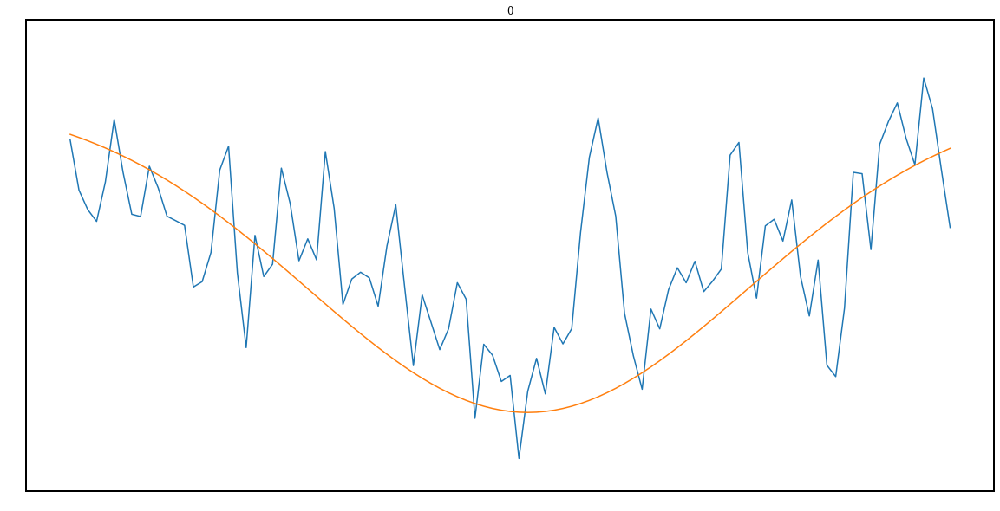

Parameters([('amp', <Parameter 'amp', value=-0.24296065529304003 +/- 0.0886, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.6375589898746994 +/- 3.98e-05, bounds=[-inf:inf]>), ('wid', <Parameter 'wid', value=6.370767843654127e-07 +/- 4.55e-07, bounds=[-inf:inf]>), ('off', <Parameter 'off', value=0.7598426996070442 +/- 0.0952, bounds=[-inf:inf]>)])


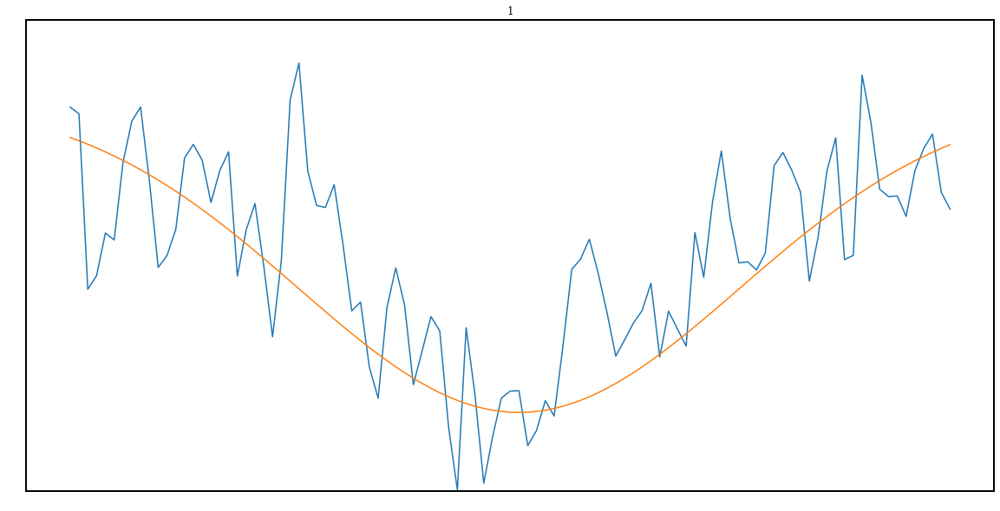

Parameters([('amp', <Parameter 'amp', value=-0.27369965509433636 +/- 0.0213, bounds=[-0.8:-0.1]>), ('cen', <Parameter 'cen', value=3.637565955227534 +/- 2.14e-05, bounds=[-inf:inf]>), ('wid', <Parameter 'wid', value=1.4328304502938376e-07 +/- 3.05e-08, bounds=[-inf:inf]>), ('off', <Parameter 'off', value=0.6877824979542992 +/- 0.0137, bounds=[-inf:inf]>)])


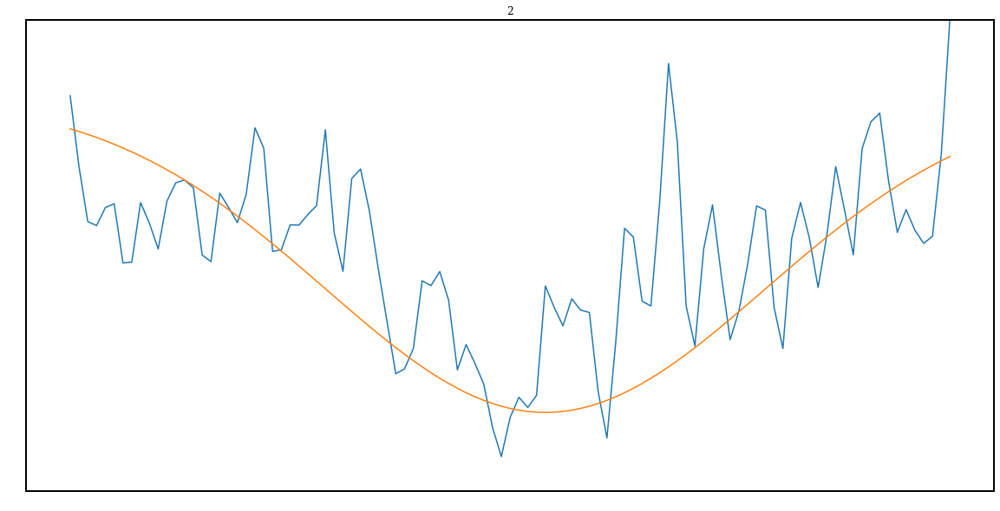

Parameters([('amp', <Parameter 'amp', value=-0.22341410939865292 +/- 0.0237, bounds=[-0.8:-0.1]>), ('cen', <Parameter 'cen', value=3.6375163577722187 +/- 2.32e-05, bounds=[-inf:inf]>), ('wid', <Parameter 'wid', value=8.057431275033004e-08 +/- 2.18e-08, bounds=[-inf:inf]>), ('off', <Parameter 'off', value=0.6581497176422983 +/- 0.0111, bounds=[-inf:inf]>)])


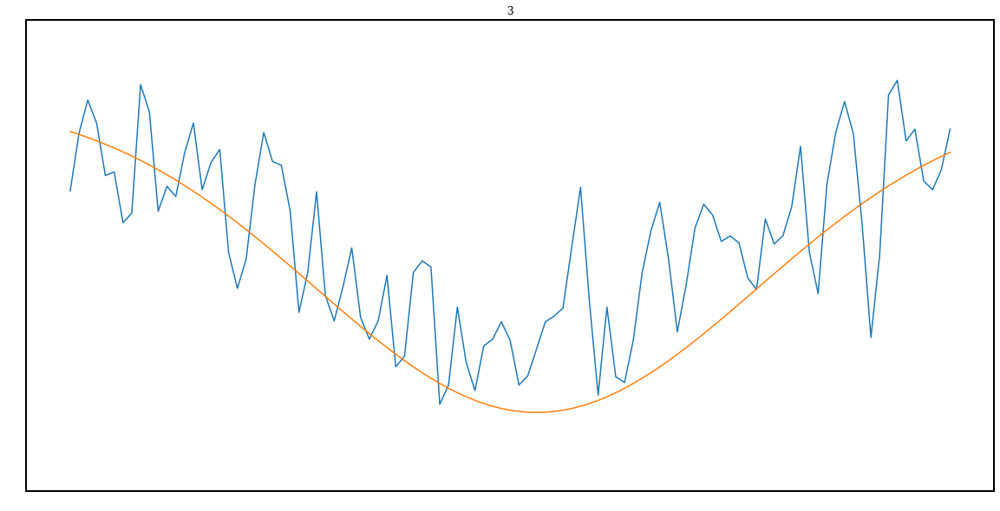

Parameters([('amp', <Parameter 'amp', value=-0.25910417829748245 +/- 0.0283, bounds=[-0.8:-0.1]>), ('cen', <Parameter 'cen', value=3.637532801325763 +/- 2.54e-05, bounds=[-inf:inf]>), ('wid', <Parameter 'wid', value=3.578087479542014e-07 +/- 1.07e-07, bounds=[-inf:inf]>), ('off', <Parameter 'off', value=0.7482892949104096 +/- 0.0305, bounds=[-inf:inf]>)])


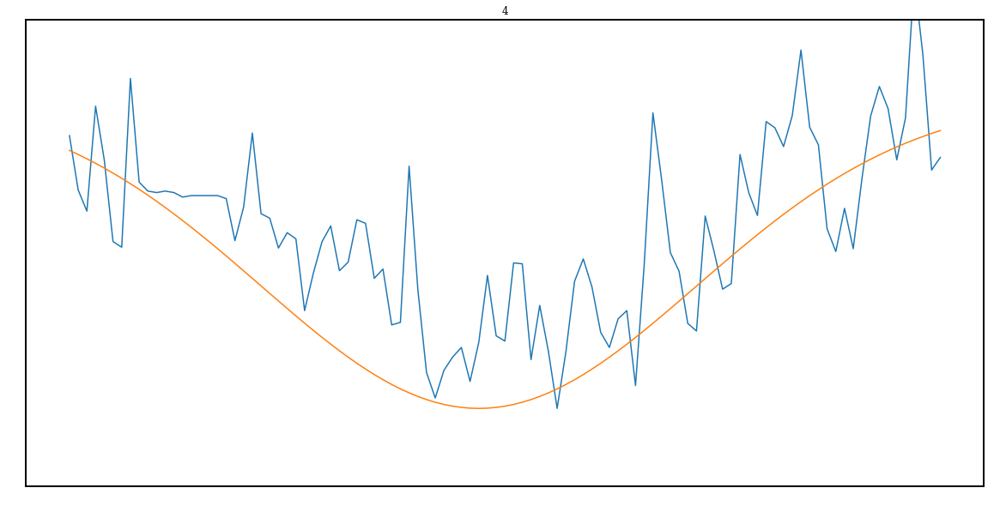

Parameters([('amp', <Parameter 'amp', value=-0.26555116096286324 +/- 0.0298, bounds=[-0.8:-0.1]>), ('cen', <Parameter 'cen', value=3.6376208540206982 +/- 2.64e-05, bounds=[-inf:inf]>), ('wid', <Parameter 'wid', value=3.5479078206722953e-07 +/- 1.09e-07, bounds=[-inf:inf]>), ('off', <Parameter 'off', value=0.7627039255384171 +/- 0.0319, bounds=[-inf:inf]>)])


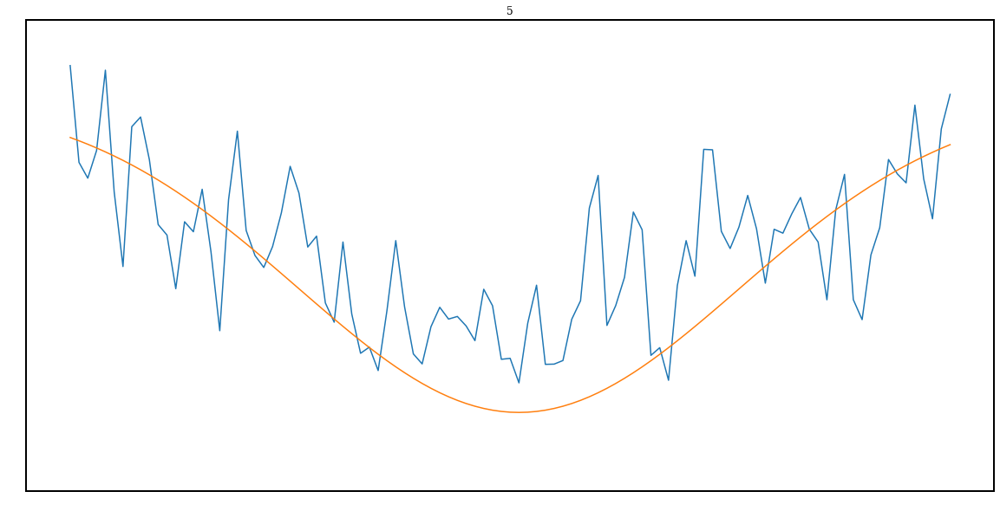

Parameters([('amp', <Parameter 'amp', value=-0.32271026969175803 +/- 0.154, bounds=[-0.8:-0.1]>), ('cen', <Parameter 'cen', value=3.637567307139612 +/- 2.98e-05, bounds=[-inf:inf]>), ('wid', <Parameter 'wid', value=9.266981788708694e-07 +/- 7.1e-07, bounds=[-inf:inf]>), ('off', <Parameter 'off', value=0.8409316132254986 +/- 0.16, bounds=[-inf:inf]>)])


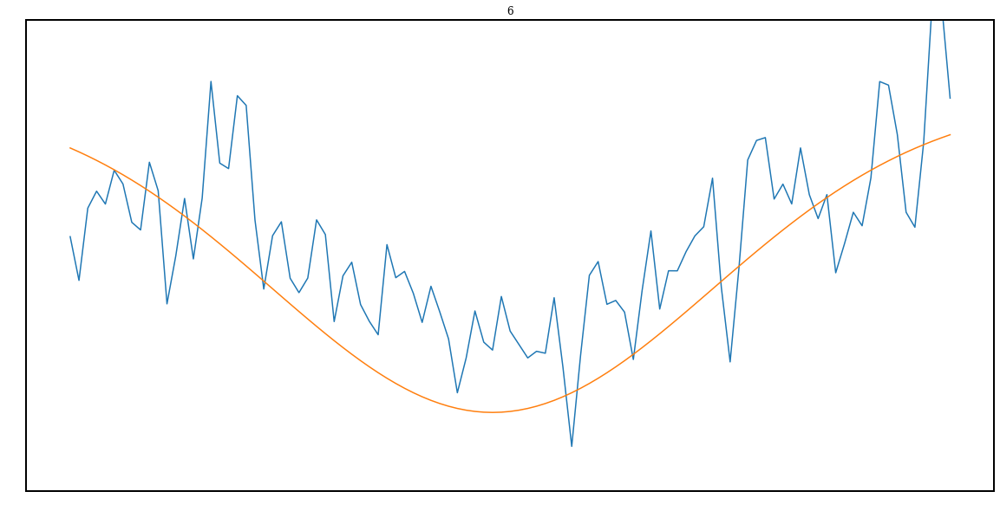

Parameters([('amp', <Parameter 'amp', value=-0.2324578810319431 +/- 0.0229, bounds=[-0.8:-0.1]>), ('cen', <Parameter 'cen', value=3.6376153276244025 +/- 2.79e-05, bounds=[-inf:inf]>), ('wid', <Parameter 'wid', value=2.717131167502758e-07 +/- 7.87e-08, bounds=[-inf:inf]>), ('off', <Parameter 'off', value=0.719737131984464 +/- 0.0224, bounds=[-inf:inf]>)])


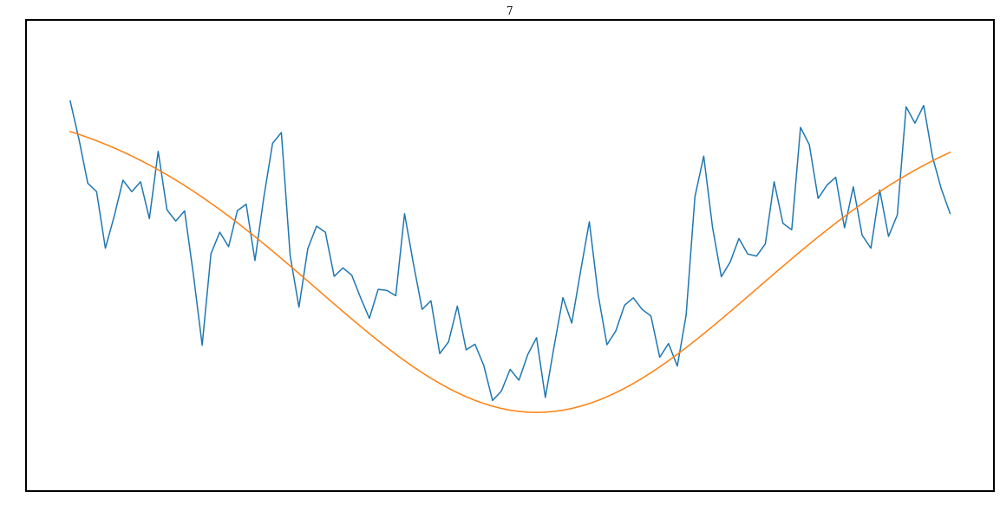

Parameters([('amp', <Parameter 'amp', value=-0.2123695565983884 +/- 0.0178, bounds=[-0.8:-0.1]>), ('cen', <Parameter 'cen', value=3.6375421985810035 +/- 2.43e-05, bounds=[-inf:inf]>), ('wid', <Parameter 'wid', value=2.5311879792290614e-07 +/- 6.25e-08, bounds=[-inf:inf]>), ('off', <Parameter 'off', value=0.6963606685568102 +/- 0.0167, bounds=[-inf:inf]>)])


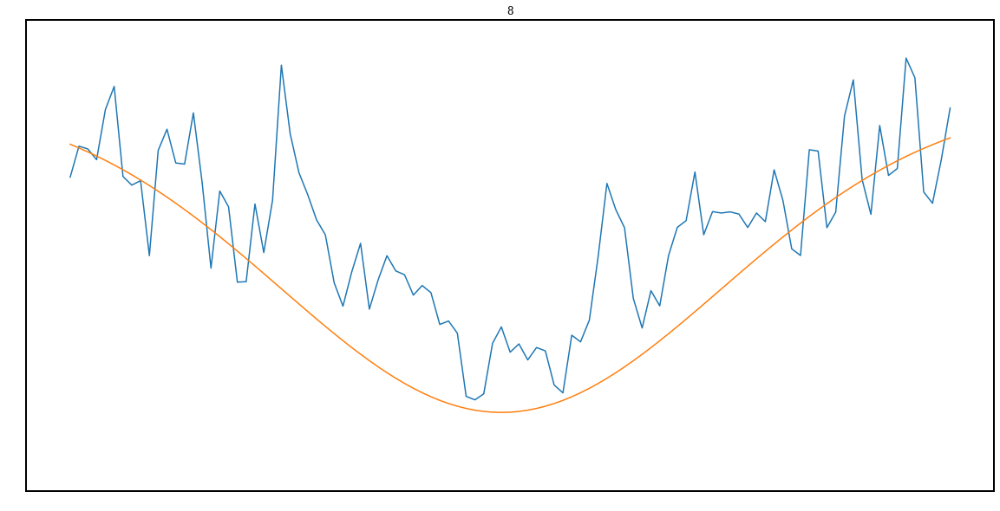

Parameters([('amp', <Parameter 'amp', value=-0.24323828166139583 +/- 0.0167, bounds=[-0.8:-0.1]>), ('cen', <Parameter 'cen', value=3.6376007517285895 +/- 2.02e-05, bounds=[-inf:inf]>), ('wid', <Parameter 'wid', value=1.937582339763749e-07 +/- 3.83e-08, bounds=[-inf:inf]>), ('off', <Parameter 'off', value=0.7245515563901297 +/- 0.0132, bounds=[-inf:inf]>)])


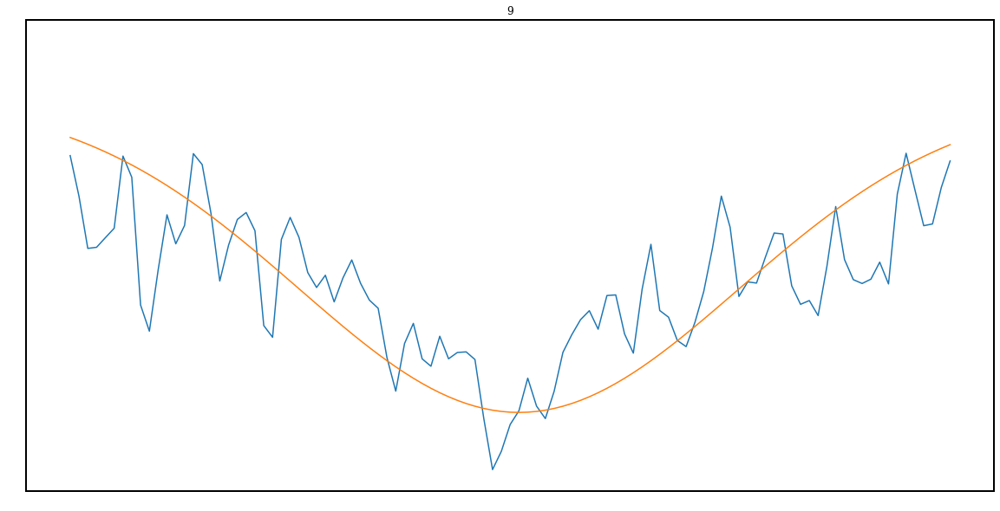

Parameters([('amp', <Parameter 'amp', value=-0.2019397439485221 +/- 0.0151, bounds=[-0.8:-0.1]>), ('cen', <Parameter 'cen', value=3.6375654543123064 +/- 2.08e-05, bounds=[-inf:inf]>), ('wid', <Parameter 'wid', value=1.4804546331027903e-07 +/- 3.06e-08, bounds=[-inf:inf]>), ('off', <Parameter 'off', value=0.6296564670306287 +/- 0.00996, bounds=[-inf:inf]>)])


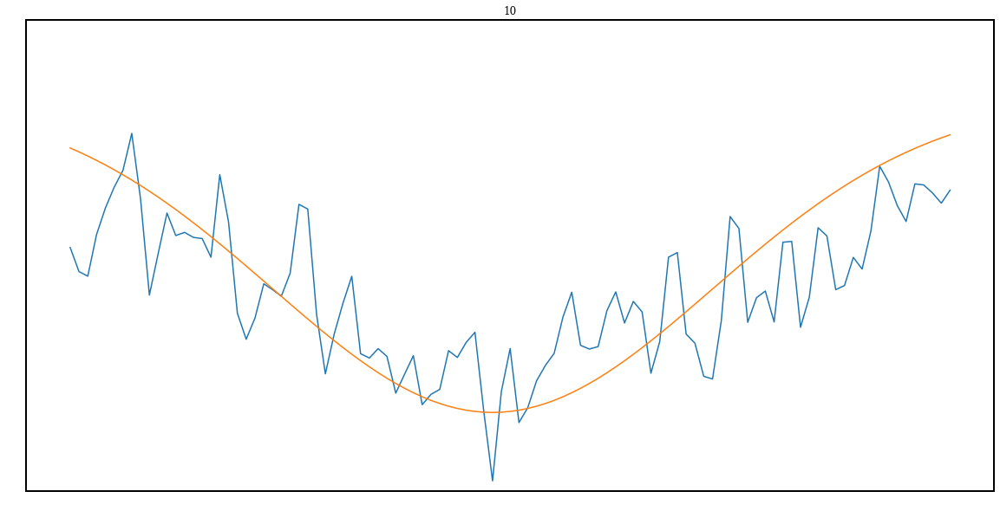

Parameters([('amp', <Parameter 'amp', value=-0.23669537292899756 +/- 0.0313, bounds=[-0.8:-0.1]>), ('cen', <Parameter 'cen', value=3.6376213677983804 +/- 2.4e-05, bounds=[-inf:inf]>), ('wid', <Parameter 'wid', value=4.439931431057659e-07 +/- 1.44e-07, bounds=[-inf:inf]>), ('off', <Parameter 'off', value=0.6864271830466958 +/- 0.0344, bounds=[-inf:inf]>)])


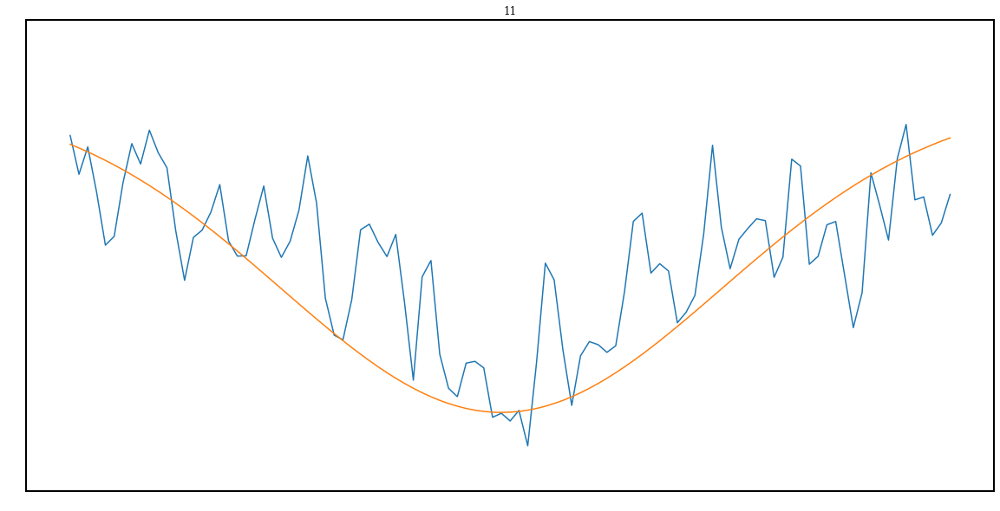

Parameters([('amp', <Parameter 'amp', value=-0.21789428269620204 +/- 0.0176, bounds=[-0.8:-0.1]>), ('cen', <Parameter 'cen', value=3.6376167304379003 +/- 2.03e-05, bounds=[-inf:inf]>), ('wid', <Parameter 'wid', value=1.1258307769130209e-07 +/- 2.4e-08, bounds=[-inf:inf]>), ('off', <Parameter 'off', value=0.6585178448991074 +/- 0.00983, bounds=[-inf:inf]>)])


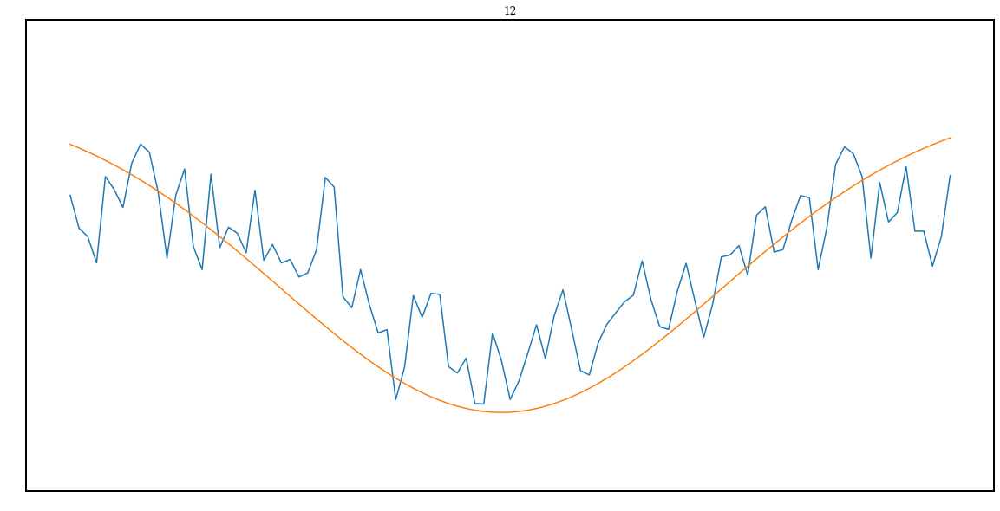

Parameters([('amp', <Parameter 'amp', value=-0.20800021408720748 +/- 0.0134, bounds=[-0.8:-0.1]>), ('cen', <Parameter 'cen', value=3.6376183039082717 +/- 1.91e-05, bounds=[-inf:inf]>), ('wid', <Parameter 'wid', value=2.2289411989651382e-07 +/- 4.21e-08, bounds=[-inf:inf]>), ('off', <Parameter 'off', value=0.6722200280634247 +/- 0.0116, bounds=[-inf:inf]>)])


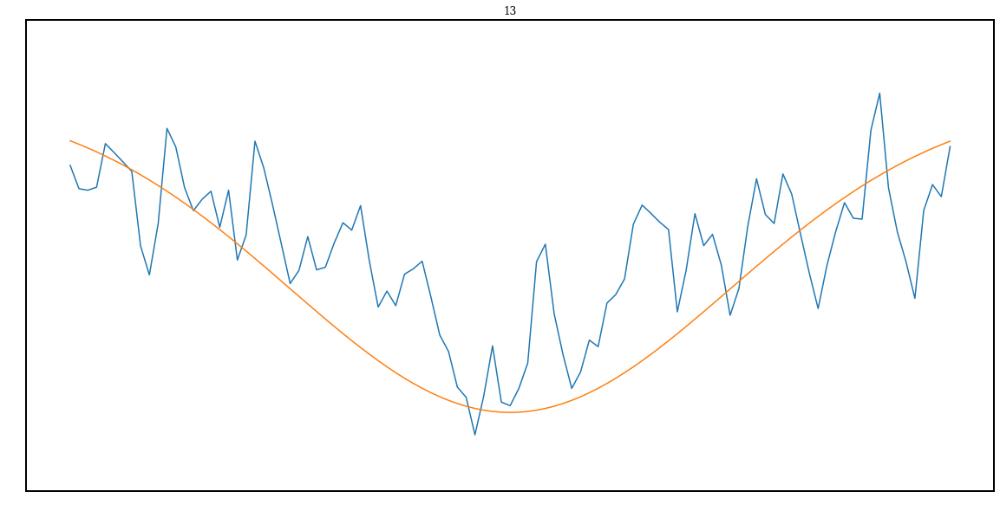

Parameters([('amp', <Parameter 'amp', value=-0.20622101609431165 +/- 0.0169, bounds=[-0.8:-0.1]>), ('cen', <Parameter 'cen', value=3.6375792728329426 +/- 2e-05, bounds=[-inf:inf]>), ('wid', <Parameter 'wid', value=1.0520746550003885e-07 +/- 2.26e-08, bounds=[-inf:inf]>), ('off', <Parameter 'off', value=0.6639689374789894 +/- 0.00908, bounds=[-inf:inf]>)])


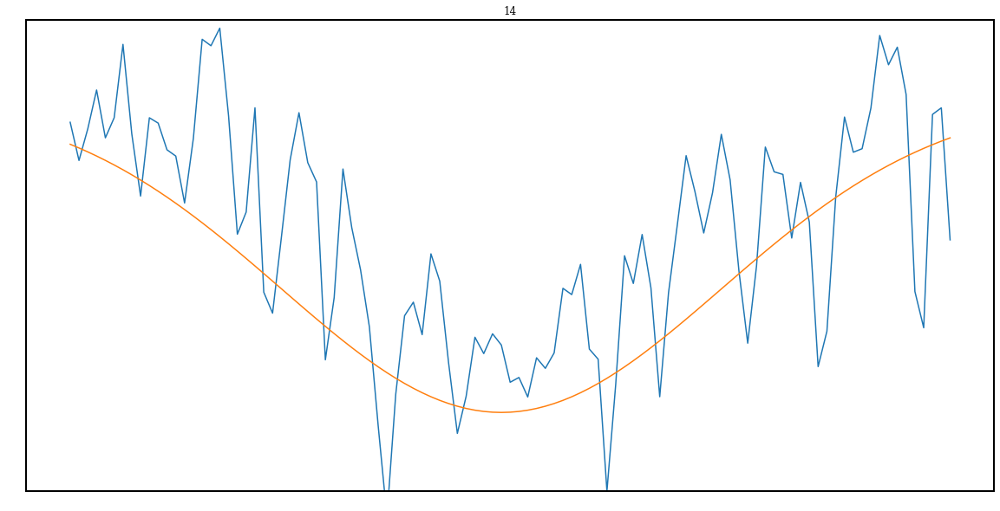

Parameters([('amp', <Parameter 'amp', value=-0.3077112401700928 +/- 0.0302, bounds=[-0.8:-0.1]>), ('cen', <Parameter 'cen', value=3.6376182284377934 +/- 2.82e-05, bounds=[-inf:inf]>), ('wid', <Parameter 'wid', value=2.585063651491354e-07 +/- 7.48e-08, bounds=[-inf:inf]>), ('off', <Parameter 'off', value=0.7619920606218614 +/- 0.0287, bounds=[-inf:inf]>)])


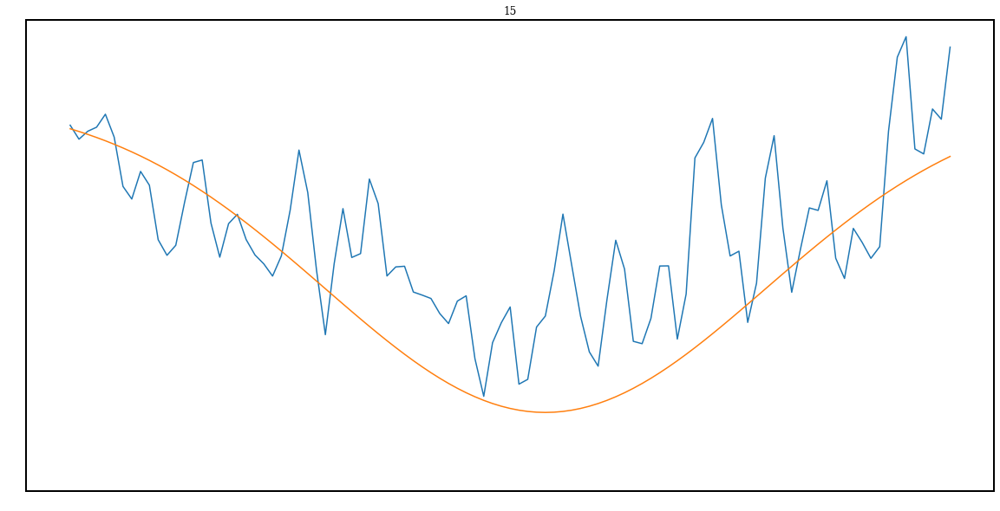

Parameters([('amp', <Parameter 'amp', value=-0.7999999783865609 +/- 0.303, bounds=[-0.8:-0.1]>), ('cen', <Parameter 'cen', value=3.6375045263820915 +/- 2.53e-05, bounds=[-inf:inf]>), ('wid', <Parameter 'wid', value=2.8883310175844677e-06 +/- 5.98e-06, bounds=[-inf:inf]>), ('off', <Parameter 'off', value=1.3367781226023359 +/- 1.43, bounds=[-inf:inf]>)])


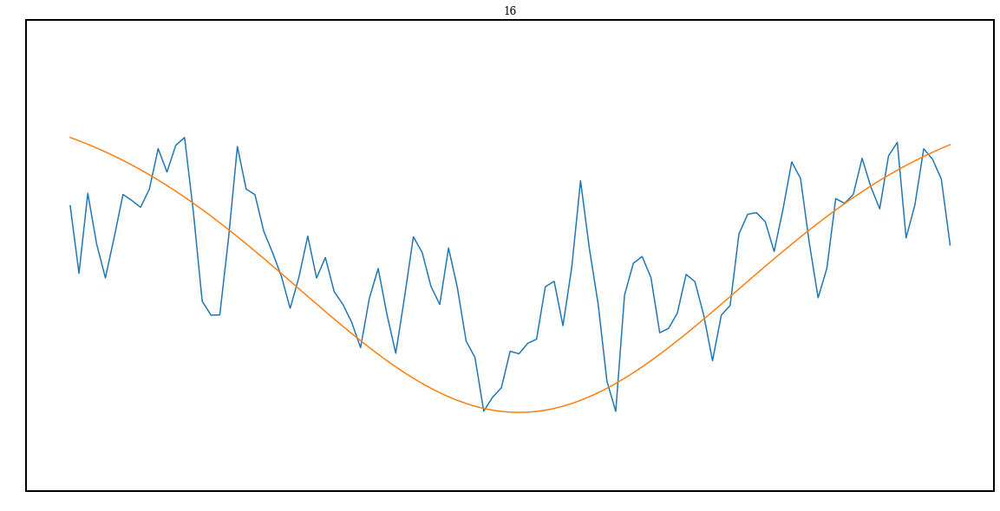

Parameters([('amp', <Parameter 'amp', value=-0.18785047757509832 +/- 0.0279, bounds=[-0.8:-0.1]>), ('cen', <Parameter 'cen', value=3.637568375595555 +/- 3.25e-05, bounds=[-inf:inf]>), ('wid', <Parameter 'wid', value=3.7857298485085286e-07 +/- 1.49e-07, bounds=[-inf:inf]>), ('off', <Parameter 'off', value=0.6934286394603917 +/- 0.0302, bounds=[-inf:inf]>)])


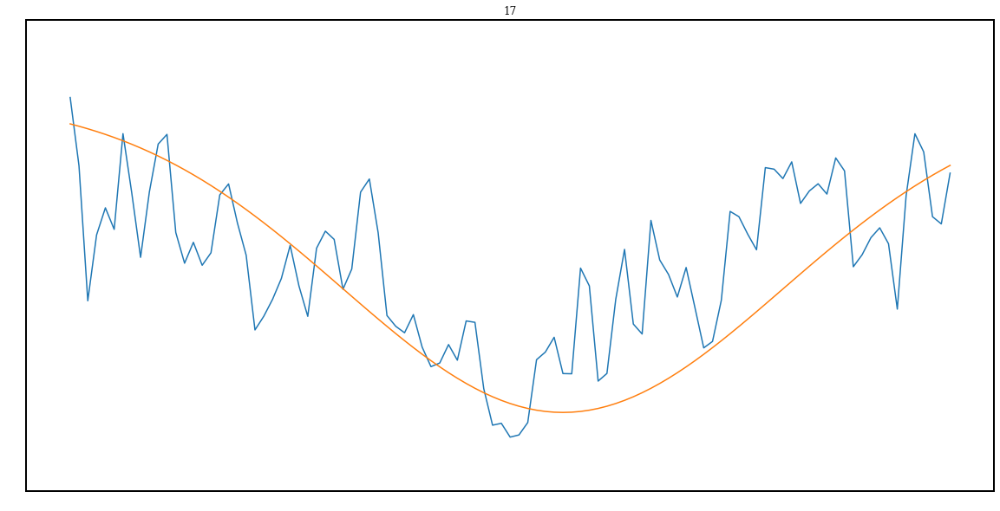

Parameters([('amp', <Parameter 'amp', value=-0.21605555499312623 +/- 0.0175, bounds=[-0.8:-0.1]>), ('cen', <Parameter 'cen', value=3.637472292772482 +/- 2.29e-05, bounds=[-inf:inf]>), ('wid', <Parameter 'wid', value=1.556785086456508e-07 +/- 3.51e-08, bounds=[-inf:inf]>), ('off', <Parameter 'off', value=0.6614790353014021 +/- 0.0119, bounds=[-inf:inf]>)])


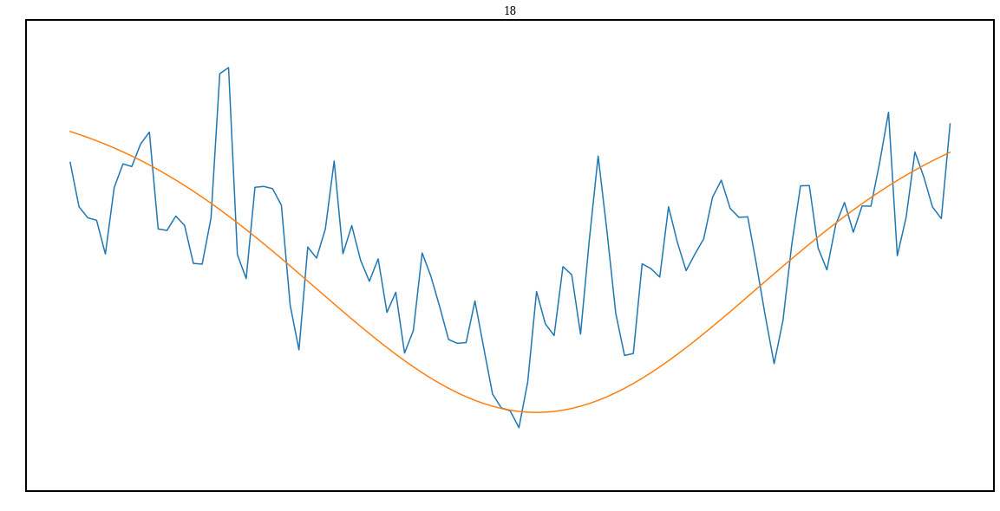

Parameters([('amp', <Parameter 'amp', value=-0.17868188638518023 +/- 0.0193, bounds=[-0.8:-0.1]>), ('cen', <Parameter 'cen', value=3.6375103080572377 +/- 2.86e-05, bounds=[-inf:inf]>), ('wid', <Parameter 'wid', value=1.283123177547963e-07 +/- 3.74e-08, bounds=[-inf:inf]>), ('off', <Parameter 'off', value=0.6636420782251669 +/- 0.0116, bounds=[-inf:inf]>)])


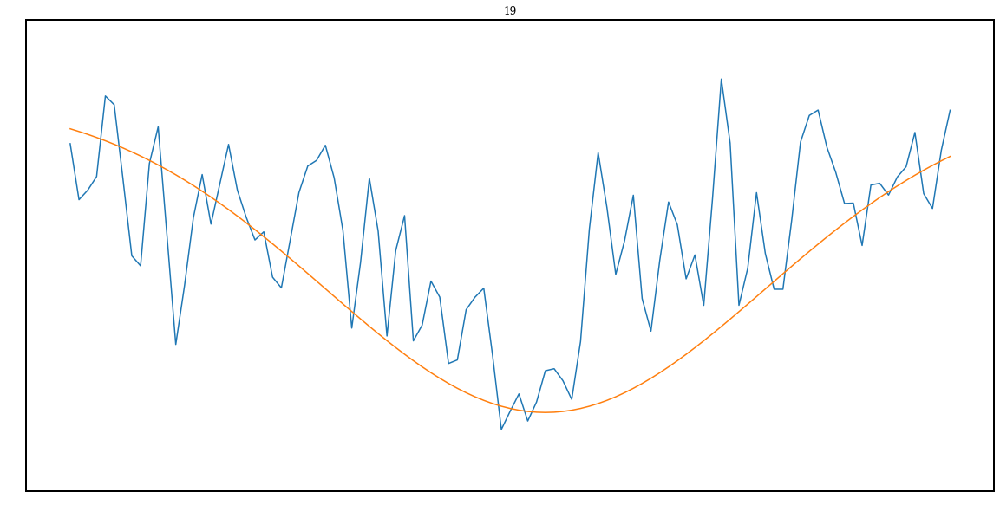

Parameters([('amp', <Parameter 'amp', value=-0.2286457615147457 +/- 0.0233, bounds=[-0.8:-0.1]>), ('cen', <Parameter 'cen', value=3.637510213358888 +/- 2.07e-05, bounds=[-inf:inf]>), ('wid', <Parameter 'wid', value=6.815667502797946e-08 +/- 1.75e-08, bounds=[-inf:inf]>), ('off', <Parameter 'off', value=0.6733138518795455 +/- 0.0101, bounds=[-inf:inf]>)])


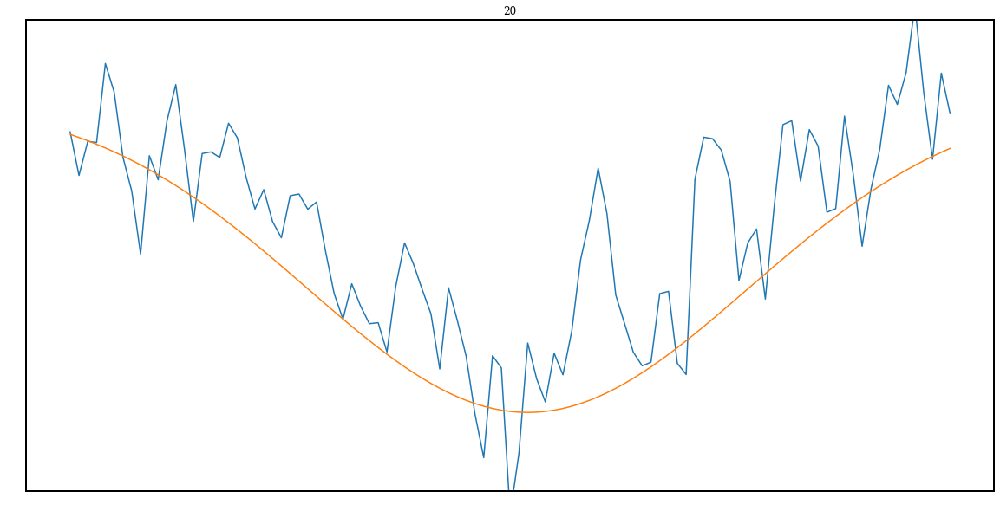

Parameters([('amp', <Parameter 'amp', value=-0.3163260318748119 +/- 0.0242, bounds=[-0.8:-0.1]>), ('cen', <Parameter 'cen', value=3.6375457379251093 +/- 2.14e-05, bounds=[-inf:inf]>), ('wid', <Parameter 'wid', value=2.778191892429221e-07 +/- 6.22e-08, bounds=[-inf:inf]>), ('off', <Parameter 'off', value=0.7757998036806957 +/- 0.0238, bounds=[-inf:inf]>)])


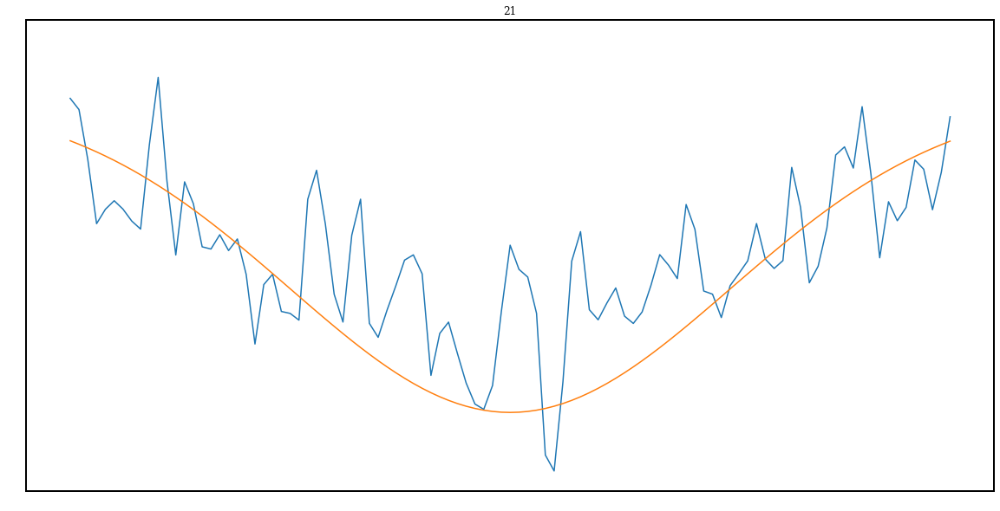

Parameters([('amp', <Parameter 'amp', value=-0.2910501029075808 +/- 0.0925, bounds=[-0.8:-0.1]>), ('cen', <Parameter 'cen', value=3.6375776630927428 +/- 2.79e-05, bounds=[-inf:inf]>), ('wid', <Parameter 'wid', value=7.360037251266882e-07 +/- 4.22e-07, bounds=[-inf:inf]>), ('off', <Parameter 'off', value=0.7960403367726341 +/- 0.0981, bounds=[-inf:inf]>)])


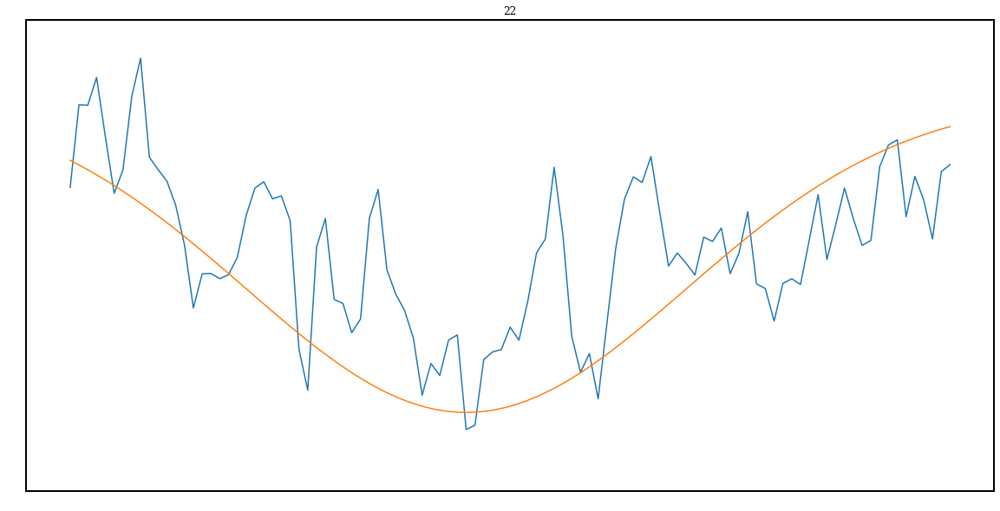

Parameters([('amp', <Parameter 'amp', value=-0.7999993345721919 +/- 1.93, bounds=[-0.8:-0.1]>), ('cen', <Parameter 'cen', value=3.6377161520145704 +/- 3.12e-05, bounds=[-inf:inf]>), ('wid', <Parameter 'wid', value=3.2145760658026992e-06 +/- 8.91e-06, bounds=[-inf:inf]>), ('off', <Parameter 'off', value=1.32964675396099 +/- 1.94, bounds=[-inf:inf]>)])


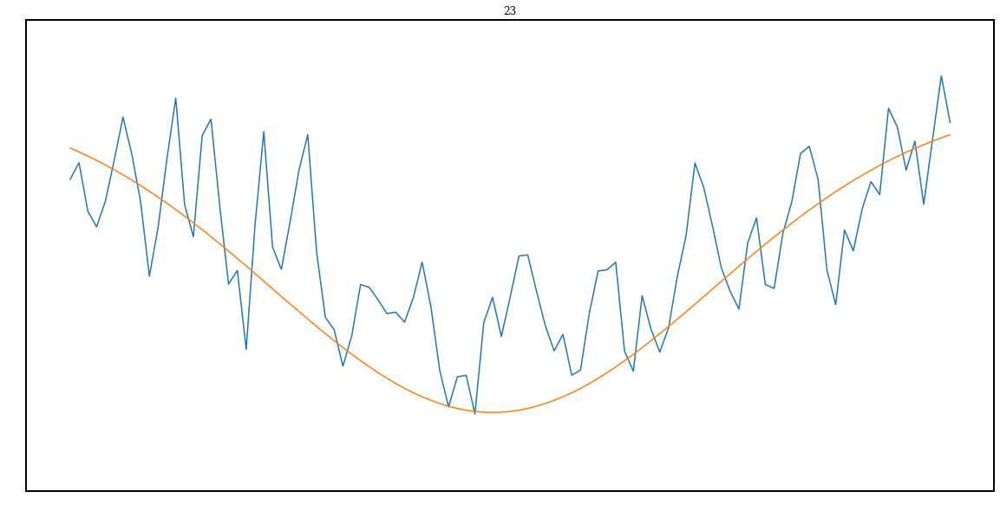

Parameters([('amp', <Parameter 'amp', value=-0.2617707968480556 +/- 0.0478, bounds=[-0.8:-0.1]>), ('cen', <Parameter 'cen', value=3.637626267137393 +/- 2.78e-05, bounds=[-inf:inf]>), ('wid', <Parameter 'wid', value=5.034645501293869e-07 +/- 2.08e-07, bounds=[-inf:inf]>), ('off', <Parameter 'off', value=0.7608644027717585 +/- 0.0522, bounds=[-inf:inf]>)])


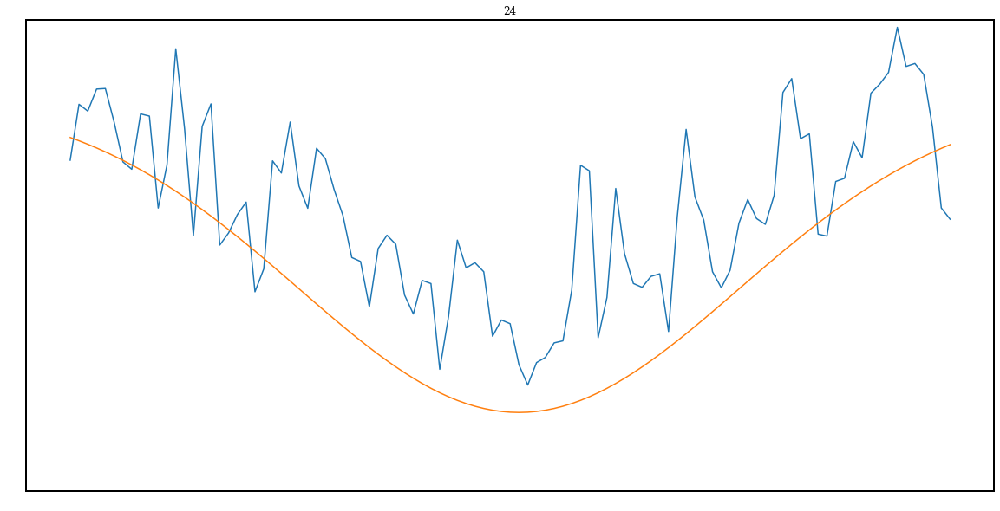

Parameters([('amp', <Parameter 'amp', value=-0.2602372398404965 +/- 0.0284, bounds=[-0.8:-0.1]>), ('cen', <Parameter 'cen', value=3.6375764885956423 +/- 2.59e-05, bounds=[-inf:inf]>), ('wid', <Parameter 'wid', value=3.5081572624757526e-07 +/- 1.06e-07, bounds=[-inf:inf]>), ('off', <Parameter 'off', value=0.790166966146344 +/- 0.0304, bounds=[-inf:inf]>)])


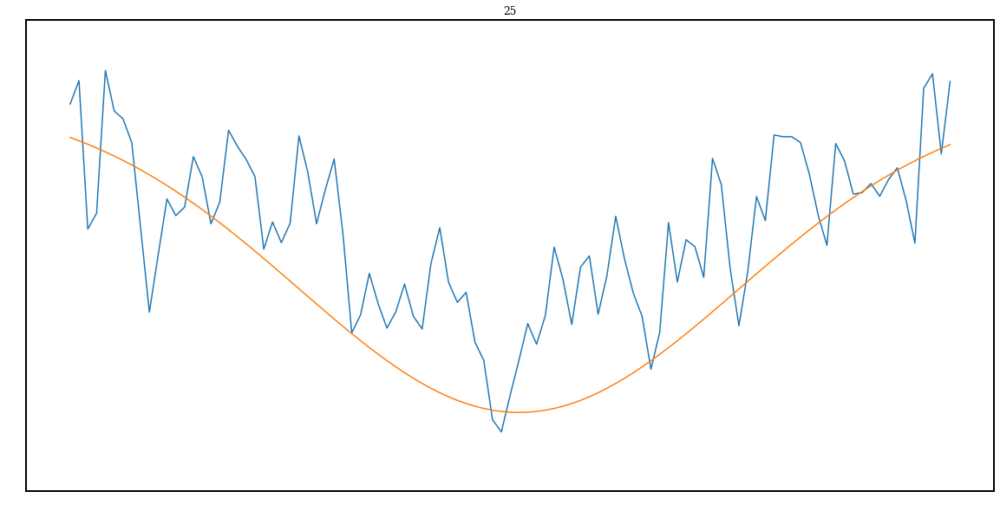

Parameters([('amp', <Parameter 'amp', value=-0.2257368822498319 +/- 0.0205, bounds=[-0.8:-0.1]>), ('cen', <Parameter 'cen', value=3.637577869961717 +/- 2.64e-05, bounds=[-inf:inf]>), ('wid', <Parameter 'wid', value=2.523277945068641e-07 +/- 6.77e-08, bounds=[-inf:inf]>), ('off', <Parameter 'off', value=0.728680514847379 +/- 0.0192, bounds=[-inf:inf]>)])


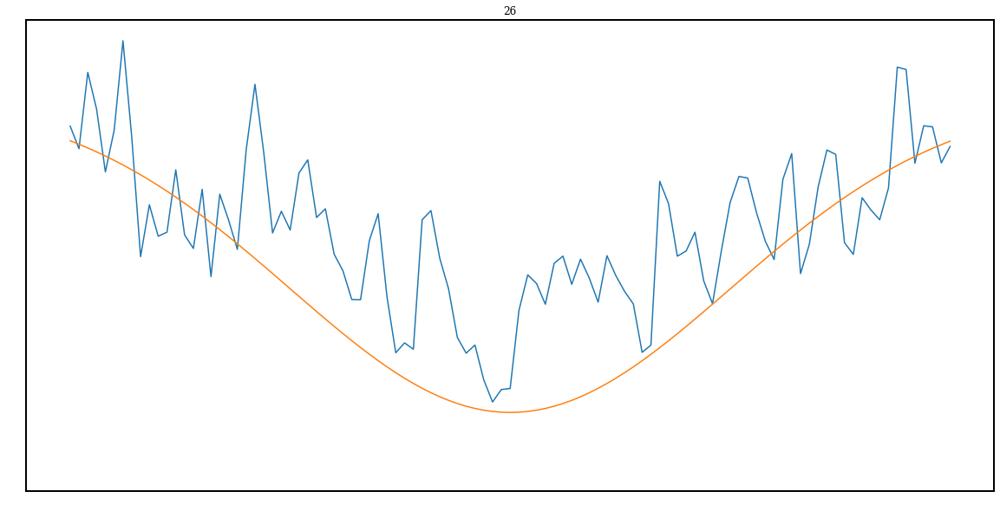

Parameters([('amp', <Parameter 'amp', value=-0.24138981990063102 +/- 0.0394, bounds=[-0.8:-0.1]>), ('cen', <Parameter 'cen', value=3.63760208366784 +/- 2.85e-05, bounds=[-inf:inf]>), ('wid', <Parameter 'wid', value=4.564132315207693e-07 +/- 1.79e-07, bounds=[-inf:inf]>), ('off', <Parameter 'off', value=0.7690928482679962 +/- 0.0432, bounds=[-inf:inf]>)])


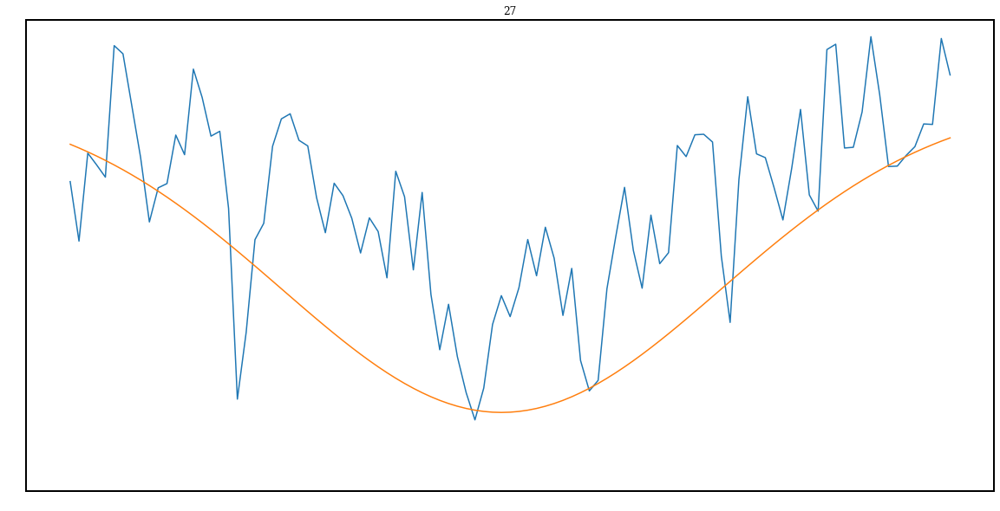

Parameters([('amp', <Parameter 'amp', value=-0.232631941826678 +/- 0.0226, bounds=[-0.8:-0.1]>), ('cen', <Parameter 'cen', value=3.6376049759895746 +/- 2.79e-05, bounds=[-inf:inf]>), ('wid', <Parameter 'wid', value=1.6674450500099606e-07 +/- 4.56e-08, bounds=[-inf:inf]>), ('off', <Parameter 'off', value=0.7498173220320771 +/- 0.0161, bounds=[-inf:inf]>)])


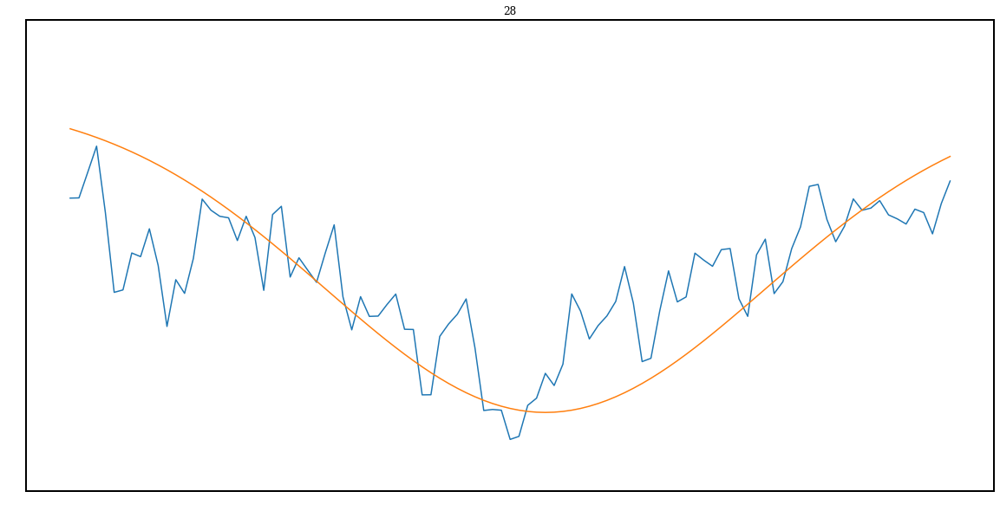

Parameters([('amp', <Parameter 'amp', value=-0.19702486613214132 +/- 0.0127, bounds=[-0.8:-0.1]>), ('cen', <Parameter 'cen', value=3.637511578332686 +/- 1.83e-05, bounds=[-inf:inf]>), ('wid', <Parameter 'wid', value=1.5758639875863525e-07 +/- 2.83e-08, bounds=[-inf:inf]>), ('off', <Parameter 'off', value=0.6394879277515482 +/- 0.00872, bounds=[-inf:inf]>)])


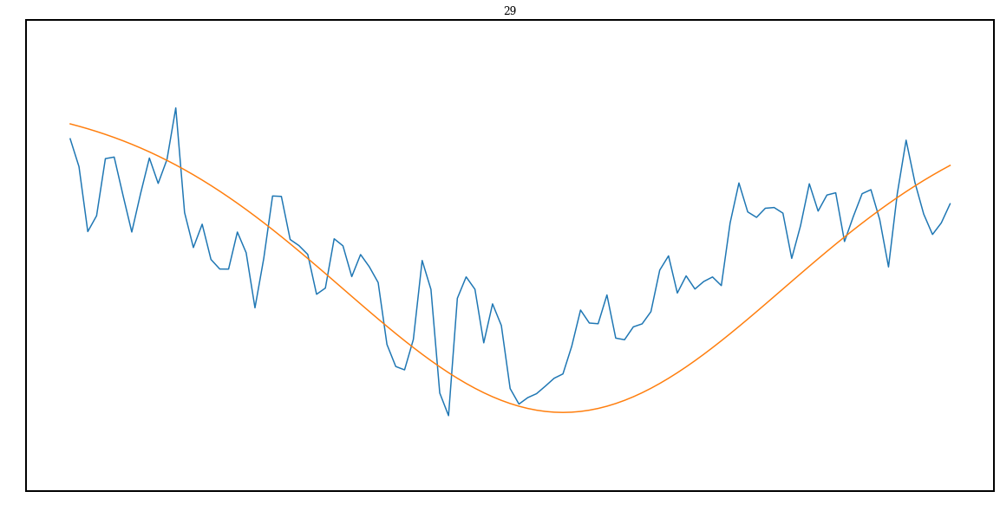

Parameters([('amp', <Parameter 'amp', value=-0.21228373025897174 +/- 0.0136, bounds=[-0.8:-0.1]>), ('cen', <Parameter 'cen', value=3.63747667037206 +/- 1.9e-05, bounds=[-inf:inf]>), ('wid', <Parameter 'wid', value=2.306184774247996e-07 +/- 4.35e-08, bounds=[-inf:inf]>), ('off', <Parameter 'off', value=0.6820732415777977 +/- 0.0121, bounds=[-inf:inf]>)])


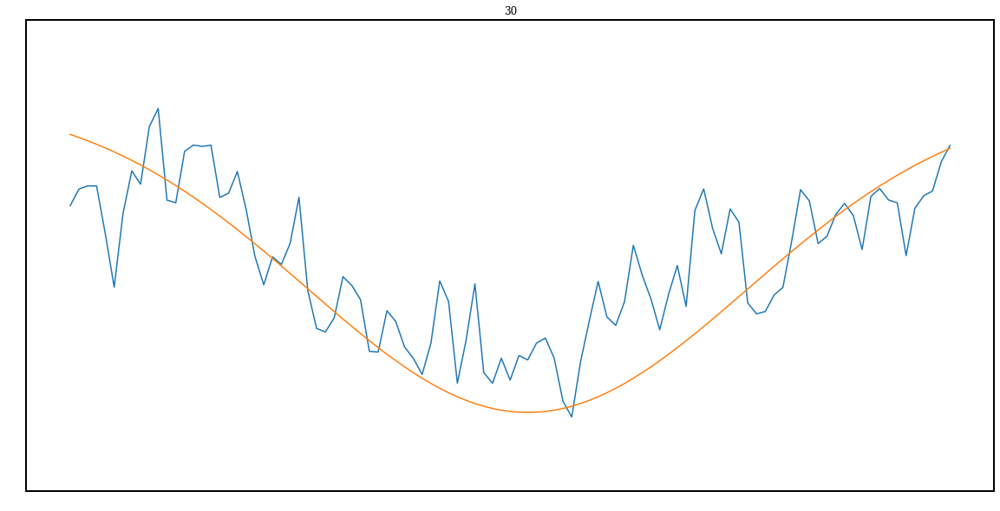

Parameters([('amp', <Parameter 'amp', value=-0.22430857271377214 +/- 0.0163, bounds=[-0.8:-0.1]>), ('cen', <Parameter 'cen', value=3.6375467120114364 +/- 2.07e-05, bounds=[-inf:inf]>), ('wid', <Parameter 'wid', value=2.6997375805150474e-07 +/- 5.78e-08, bounds=[-inf:inf]>), ('off', <Parameter 'off', value=0.6917257163007665 +/- 0.0159, bounds=[-inf:inf]>)])


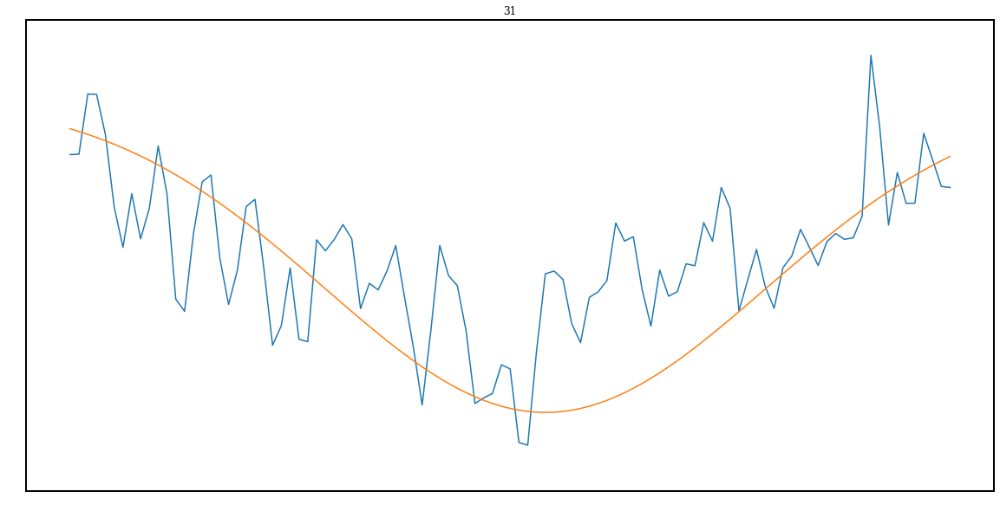

Parameters([('amp', <Parameter 'amp', value=-0.41253541629259166 +/- 0.312, bounds=[-0.8:-0.1]>), ('cen', <Parameter 'cen', value=3.637494601654524 +/- 2.75e-05, bounds=[-inf:inf]>), ('wid', <Parameter 'wid', value=1.375295249822196e-06 +/- 1.44e-06, bounds=[-inf:inf]>), ('off', <Parameter 'off', value=0.9257031973854503 +/- 0.319, bounds=[-inf:inf]>)])


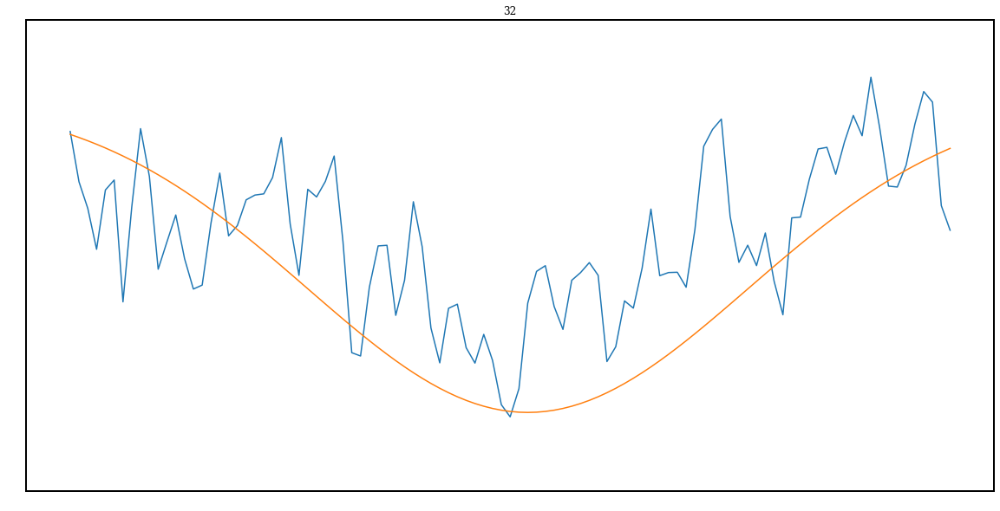

Parameters([('amp', <Parameter 'amp', value=-0.19336252658339403 +/- 0.0192, bounds=[-0.8:-0.1]>), ('cen', <Parameter 'cen', value=3.637543764657293 +/- 2.81e-05, bounds=[-inf:inf]>), ('wid', <Parameter 'wid', value=1.5936813318305404e-07 +/- 4.4e-08, bounds=[-inf:inf]>), ('off', <Parameter 'off', value=0.6894866709771283 +/- 0.0132, bounds=[-inf:inf]>)])


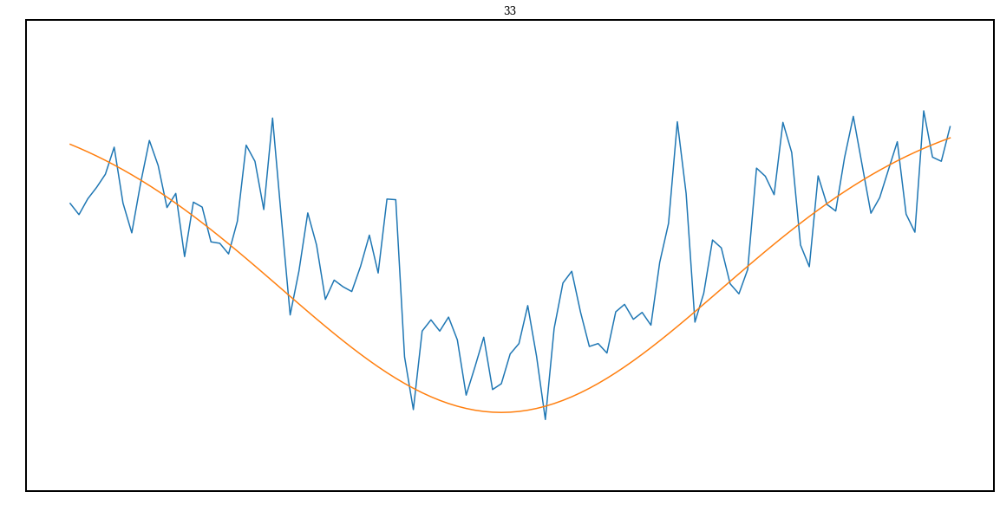

Parameters([('amp', <Parameter 'amp', value=-0.22275232310019755 +/- 0.0165, bounds=[-0.8:-0.1]>), ('cen', <Parameter 'cen', value=3.6376054611276007 +/- 2.19e-05, bounds=[-inf:inf]>), ('wid', <Parameter 'wid', value=2.0118663124678554e-07 +/- 4.32e-08, bounds=[-inf:inf]>), ('off', <Parameter 'off', value=0.697614893915215 +/- 0.0133, bounds=[-inf:inf]>)])


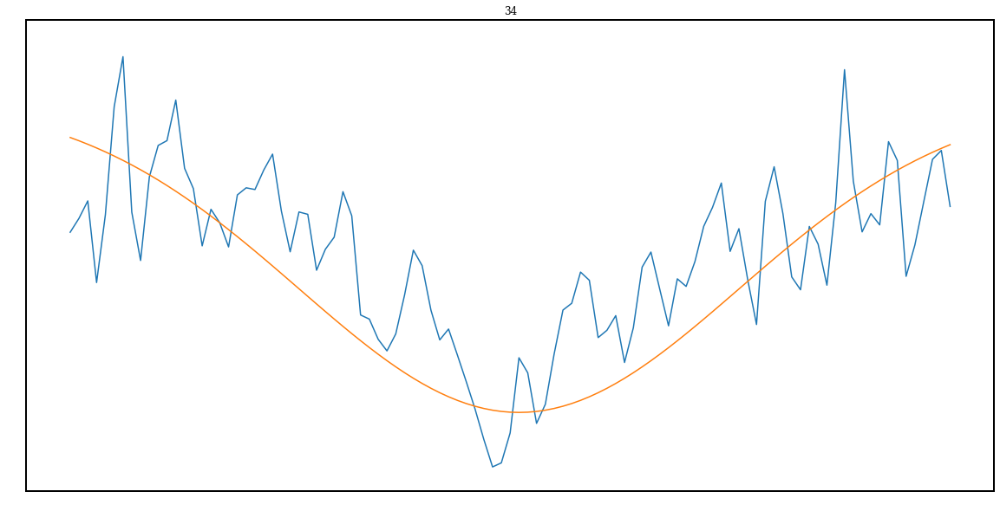

Parameters([('amp', <Parameter 'amp', value=-0.24343223686506577 +/- 0.0178, bounds=[-0.8:-0.1]>), ('cen', <Parameter 'cen', value=3.6375785353500123 +/- 1.95e-05, bounds=[-inf:inf]>), ('wid', <Parameter 'wid', value=1.312034732483595e-07 +/- 2.59e-08, bounds=[-inf:inf]>), ('off', <Parameter 'off', value=0.6754105506525409 +/- 0.0108, bounds=[-inf:inf]>)])


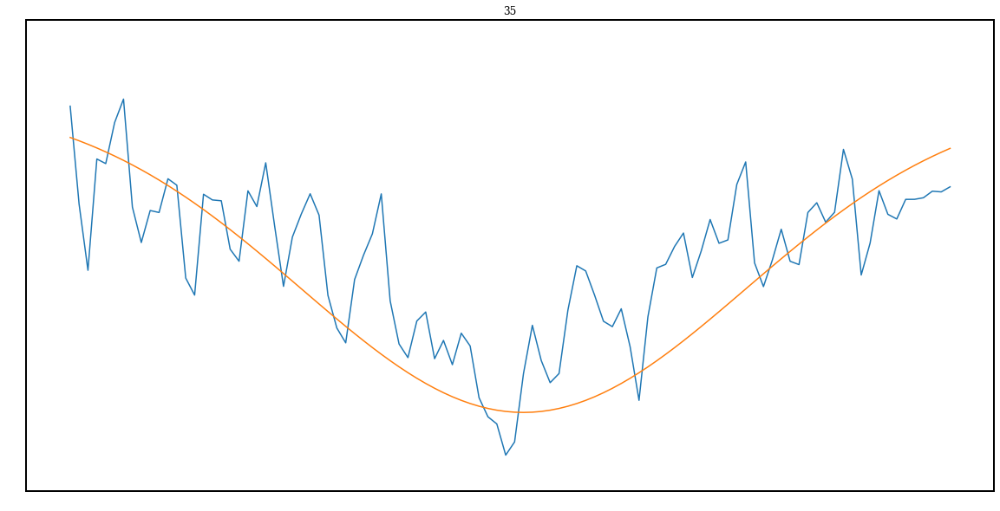

Parameters([('amp', <Parameter 'amp', value=-0.22298905179175432 +/- 0.0156, bounds=[-0.8:-0.1]>), ('cen', <Parameter 'cen', value=3.637556964257368 +/- 1.92e-05, bounds=[-inf:inf]>), ('wid', <Parameter 'wid', value=1.438216378505728e-07 +/- 2.77e-08, bounds=[-inf:inf]>), ('off', <Parameter 'off', value=0.6687306214776985 +/- 0.0102, bounds=[-inf:inf]>)])


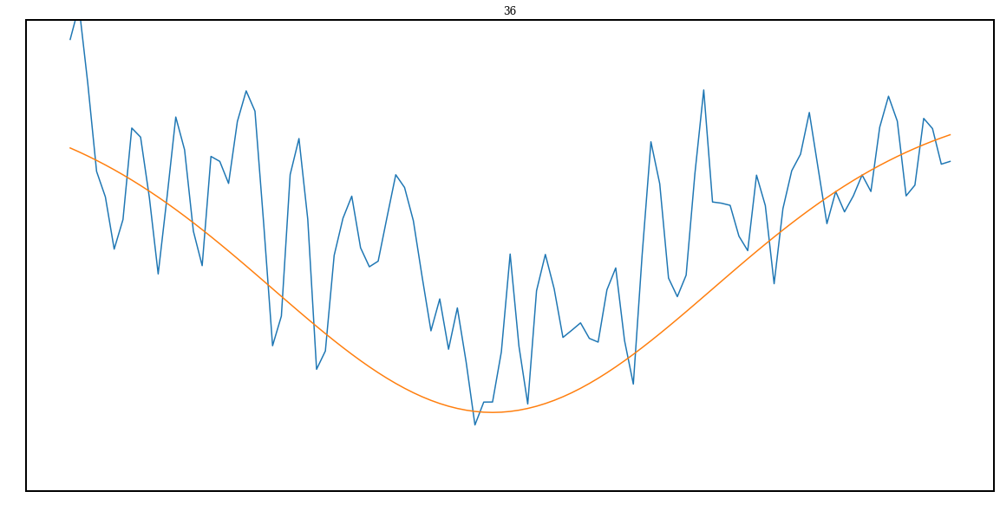

Parameters([('amp', <Parameter 'amp', value=-0.22875234962868252 +/- 0.0229, bounds=[-0.8:-0.1]>), ('cen', <Parameter 'cen', value=3.6376313144993655 +/- 2.96e-05, bounds=[-inf:inf]>), ('wid', <Parameter 'wid', value=2.1993751302214594e-07 +/- 6.45e-08, bounds=[-inf:inf]>), ('off', <Parameter 'off', value=0.7301639696594127 +/- 0.0197, bounds=[-inf:inf]>)])


In [6]:
def fit_function(params, x1=None, dat1=None):
    #1 is alpha 6562.801
    #4861.363 be -0.13033118436
    #ga 4340.472
    model1 = gaussian(x1, params['amp'], params['cen'], params['wid'], params['off'])
    resid1 = dat1 - model1
    return resid1


params = Parameters()
params.add('amp', value = -0.4)
params.add('cen', value=np.log10(4341))
params.add('wid', value=0.0000005)
params.add('off', value=0.8)#, min=0.001,max=1)


path = '/home/nwal/Desktop/binaries/J141/'
fluxes = []
wavels = []
count = 0
with open(path+'tar') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        wvl, flx = pyasl.read1dFitsSpec(line)
        wvl = 10*wvl
        flx = flx/np.median(flx)
        fluxes.append(flx)
        wavels.append(np.log10(wvl))
        count = count+1
path = '/home/nwal/Desktop/binaries/J141/'
dates2 = []
with open(path+'tar') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        hdul = fits.open(line)
        dates2.append(hdul[0].header['MJD-OBS'])
        hdul.close()

count=0
wavelsAng = np.array(wavels)


globalOff = []
for el in fluxes:

    mod = Model(gaussian)
    indexSt = find_nearest(wavelsAng[count], np.log10(4330))
    indexFi = find_nearest(wavelsAng[count], np.log10(4350))
    fluxIn = fluxes[count][indexSt:indexFi+1]
    pixels = wavelsAng[count][indexSt:indexFi+1]
    pars = mod.make_params(amp=-0.4,cen=np.log10(4341),wid=0.0000005,off=0.8)
    result = mod.fit(fluxIn,pars,x=pixels)
    cenEst = result.params['cen'].value
    indexSt = find_nearest(wavelsAng[count], cenEst-0.001)
    indexFi = find_nearest(wavelsAng[count], cenEst+0.001)
    fluxIn = fluxes[count][indexSt:indexFi+1]
    pixels = wavelsAng[count][indexSt:indexFi+1]
    x1Final = pixels
    dat1Final = fluxIn
    #beta
    
    out = minimize(fit_function, params, args=(x1Final, dat1Final))
    globalOff.append(out.params['cen'].value)
    count = count+1
    
    
    

    rc('axes', linewidth=2)

    plt.figure(figsize=(20,10))
    plt.title(str(count-1))
    plt.ylim(0.3,0.9)
    plt.plot(10**x1Final,dat1Final)
    plt.plot(10**x1Final, gaussian(x1Final, params['amp'], params['cen'], params['wid'], params['off']))
    plt.show()
    print(out.params)
    params = Parameters()
    params.add('amp', value = -0.4, min=-0.8, max=-0.1)
    params.add('cen', value=np.log10(4341))
    params.add('wid', value=0.0000005)
    params.add('off', value=0.8)#, min=0.001,max=1)
    
    #errorsTwo.append(out.params['offsetx'].stderr)

In [7]:
esovlt = EarthLocation.from_geodetic(lat=-24.6275*u.deg, lon=-70.4044*u.deg, height=2635*u.m)
sc = SkyCoord("14:11:26.2218057244 +20:09:11.044241117", frame=ICRS, unit=(u.hourangle, u.deg))
baryCorr = []
for el in dates2:
    barycorr = sc.radial_velocity_correction(obstime=Time(el, format='mjd'), location=esovlt)  
    baryCorr.append(barycorr.to(u.km/u.s).value)
print(baryCorr)

[-2.0692467990018315, -2.083736013398672, -2.0984291359103358, -2.113312246149907, -2.1284039315042738, -2.1436849915350167, -2.1591445476811795, -2.1747293354869615, -2.1904672854589142, -2.214663510718288, -2.2306788072127337, -2.2467720687243893, -2.2629201998290998, -2.2791104921973075, -2.295330921411874, -2.31157216219317, -2.3380348577641197, -2.354227341427923, -2.370347097489665, -2.386411904110878, -2.40235329020223, -2.433839441376878, -2.4494775967512052, -2.4649671309807206, -2.4802920990674253, -2.4954342340794016, -2.5103771729094517, -2.525112203462612, -2.8245856997367875, -2.8405095814911863, -2.8563198463479544, -2.8720270441254474, -2.8875583624481505, -2.9029346528231725, -2.926074689415107, -2.9410204527954575, -2.9557279623640818]


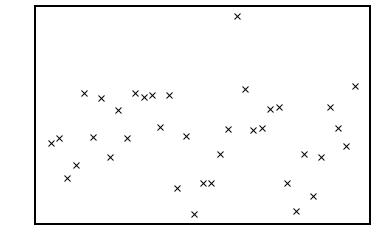

In [8]:
offsetsAlpha = 10**np.array(globalOff)

offsetsAlphaS = offsetsAlpha

halpharest = 4340.472 #air
offsetsAlphaS = (offsetsAlphaS - halpharest)/halpharest
offsetsAlphaS = (offsetsAlphaS)*(299792458/1000)
velocityOGShort = offsetsAlphaS
offsetsAlphaS = offsetsAlphaS + baryCorr


plt.plot(offsetsAlphaS, 'kx')

Name     Value      Min      Max   Stderr     Vary     Expr Brute_Step
c  0.004148     -inf      inf   0.1912     True     None     None


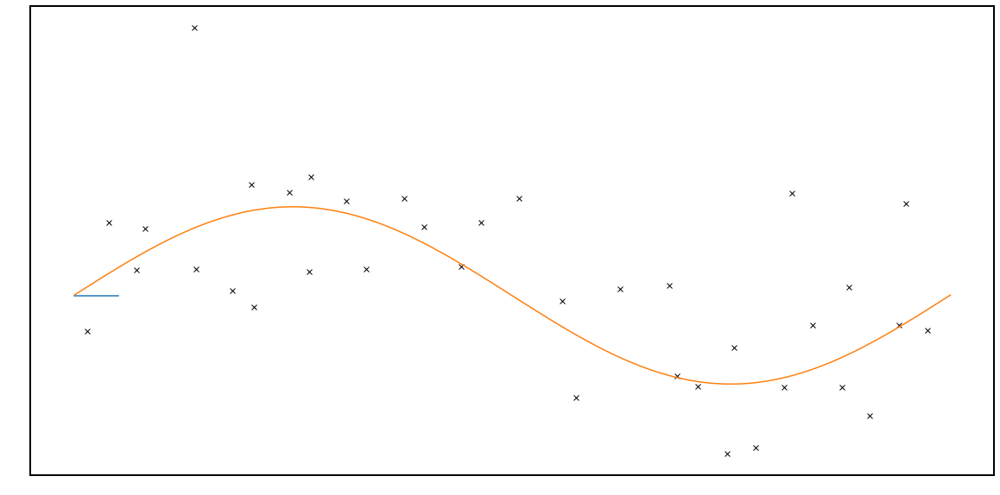

[ 13.13901993  17.93297985 -16.31905079  -4.98331117  55.78974534
  18.80631635  51.94343365   1.44218298  41.84875743  17.45624886
  56.04219872  52.8243413   53.89455755  26.93147179  53.81003998
 -24.69887591  19.34957156 -46.98982863 -20.76684558 -20.84827642
   3.65779936  25.66543676 121.27258095  59.19058904  24.80815663
  25.74665655  42.44841854  44.43055246 -20.34426856 -44.45469888
   3.87625665 -32.10975697   1.81042772  44.38767229  25.77537569
  10.86889973  62.1847471 ]
[0.55700477 0.62255283 0.68798865 0.75332169 0.81870134 0.88410976
 0.94956608 0.01491285 0.08033495 0.17998938 0.2454457  0.3109034
 0.37633646 0.44176129 0.50719707 0.57267394 0.6794432  0.74493514
 0.81033669 0.87578754 0.94107544 0.07131305 0.13678581 0.20225993
 0.26773543 0.33320135 0.39865356 0.46412084 0.71175513 0.7772184
 0.8426666  0.90821202 0.97361777 0.03903722 0.13893962 0.20453297
 0.27001814]


In [9]:
foldFreq = 0.0845327526

def sineModelFixed(x,c):
    return 35*np.sin(2*np.pi*x+c)+15.5

mod = Model(sineModelFixed)
pars = mod.make_params(c=0)
#UVESFold = foldMeth(UVEST,0.41574154920793316)


#0.0295

phases = foldMeth(np.array(dates2)+0.0295, foldFreq)
offsetsAlpha = np.array(offsetsAlphaS)
#sortIndi = np.argsort(phases)
#phases = phases[sortIndi]
#offsetsAlphaS = offsetsAlpha[sortIndi]

plt.figure(figsize=(20,10))
plt.plot(phases,offsetsAlpha, 'kx')
#plt.xlim(0,0.05)
#plt.ylim(0,50)
plt.plot([0,0.05], [15.5,15.5])
result = mod.fit(offsetsAlpha,pars,x=phases)
TDummy = np.linspace(0,1,1000)
ypointsModel = sineModelFixed(TDummy,result.params['c'].value)
result.params.pretty_print()
plt.plot(TDummy,ypointsModel)

#plt.savefig('GD1400HAlphaSGUn.pdf')
plt.show()

print(offsetsAlpha)

print(phases)

In [9]:
print(sineModelFixed(phases,result.params['c'].value))

[  3.09458479  -8.96920507 -16.93156954 -19.48905005 -16.22853332
  -7.68394615   4.73160511  18.91908868  32.55269826  47.22944491
  50.48952062  47.91408127  39.93641855  27.88790321  13.77294051
  -0.06226214 -16.17856062 -19.48659324 -16.96089     -9.02269357
   2.9711504   30.79363097  42.10640324  48.97976427  50.266486
  45.75271423  36.19449764  23.18213848 -18.52856221 -18.96443942
 -13.65311749  -3.462988     9.86788225  24.13954161  42.41169122
  49.12206597  50.20502115]


In [10]:
#shifts from H alpha/beta/gamma
path = '/home/nwal/Desktop/binaries/J141/'
fluxes = []
wavels = []
count = 0
with open(path+'tar') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        wvl, flx = pyasl.read1dFitsSpec(line)
        wvl = 10*wvl
        flx = flx/np.median(flx)
        fluxes.append(flx)
        wavels.append(np.log10(wvl))
        count = count+1
path = '/home/nwal/Desktop/binaries/J141/'
dates2 = []
with open(path+'tar') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        hdul = fits.open(line)
        dates2.append(hdul[0].header['MJD-OBS'])
        hdul.close()

count=0
wavelsAng = np.array(wavels)



shift = np.array([0.047242757881542,-0.12035854120183,-0.225138474125576,-0.249951420920985,-0.19078810010061,-0.057336980618072,0.128354328316835,0.334936715945974,0.528585490625773,0.727633898902954,0.763150279385474,0.714203865271144,0.589054292058203,0.408619900714677,0.202957145252592,0.00629615320543,-0.212249901378573,-0.247996029301646,-0.199304849748654,-0.074232880014994,0.105902682515927,0.507464657985088,0.663763626422586,0.752669658942125,0.759380094763271,0.682826134787407,0.535858939434087,0.34296709449502,-0.233479181802156,-0.22739826518526,-0.139120762105342,0.016933767132339,0.214192261010977,0.420153782328204,0.674768384999312,0.761211326539969,0.764951545473673])
adjWvl = []
count = 0
for el in wavels:
    
    newW = 10**el-shift[count]
    adjWvl.append(newW)
    count = count + 1
count = 0

for el in adjWvl:
    nameFile = str(count)+'ShiftedJ141.fits'
    pyasl.write1dFitsSpec(nameFile, fluxes[count], wvl=el, clobber=True)
    count = count +1


# write out the recipe with spreadsheet and dispcor

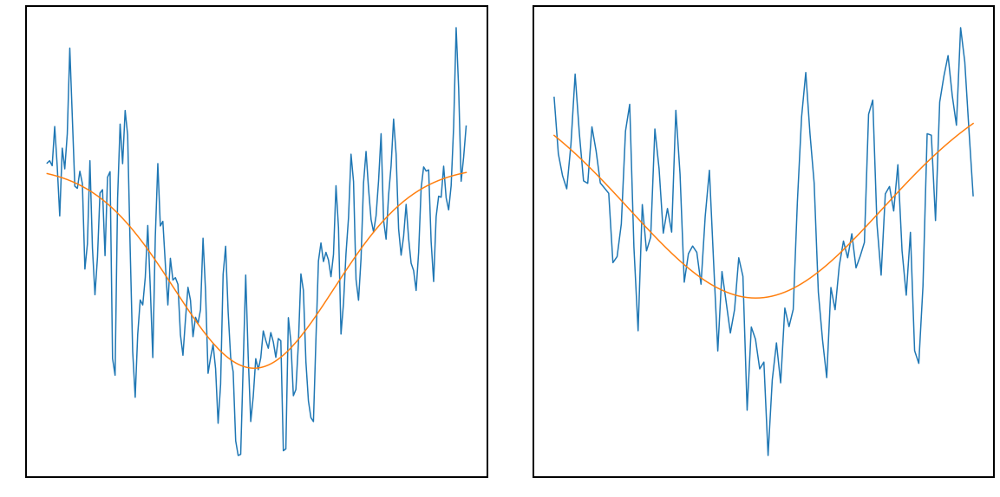

Parameters([('ampB', <Parameter 'ampB', value=-0.22592726367221472 +/- 0.0189, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.817062953575638 +/- 2.44e-05, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=6.440401071629955e-07 +/- 1.57e-07, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.6364080792903187 +/- 0.0191, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.2562864436748831 +/- 0.098, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=7.300025083887639e-07 +/- 5.08e-07, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7760322839422852 +/- 0.104, bounds=[-inf:inf]>)])


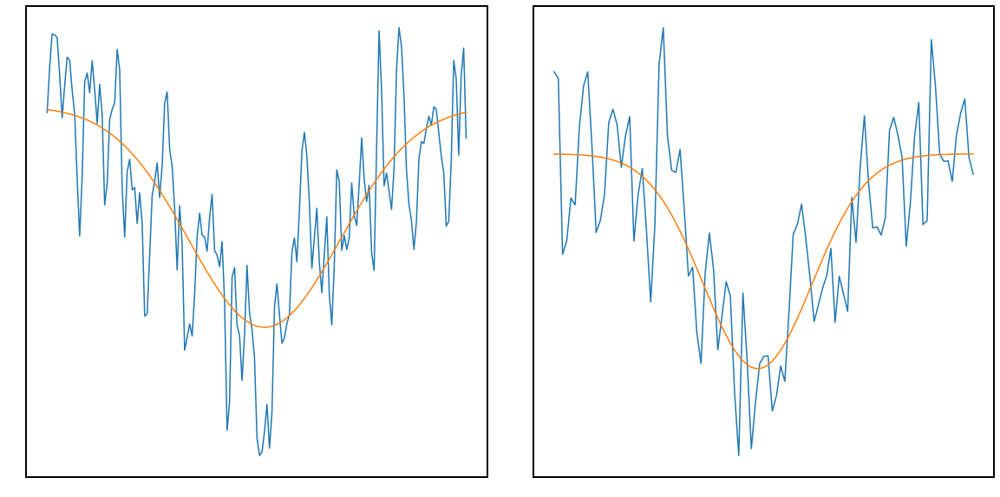

Parameters([('ampB', <Parameter 'ampB', value=-0.23171427777918466 +/- 0.017, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.817092341660837 +/- 1.66e-05, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=5.852496686938296e-07 +/- 1.26e-07, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.6494653246782292 +/- 0.0162, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.27318307279646425 +/- 0.0198, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=1.3433879929323027e-07 +/- 2.64e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.6847347835622544 +/- 0.0123, bounds=[-inf:inf]>)])


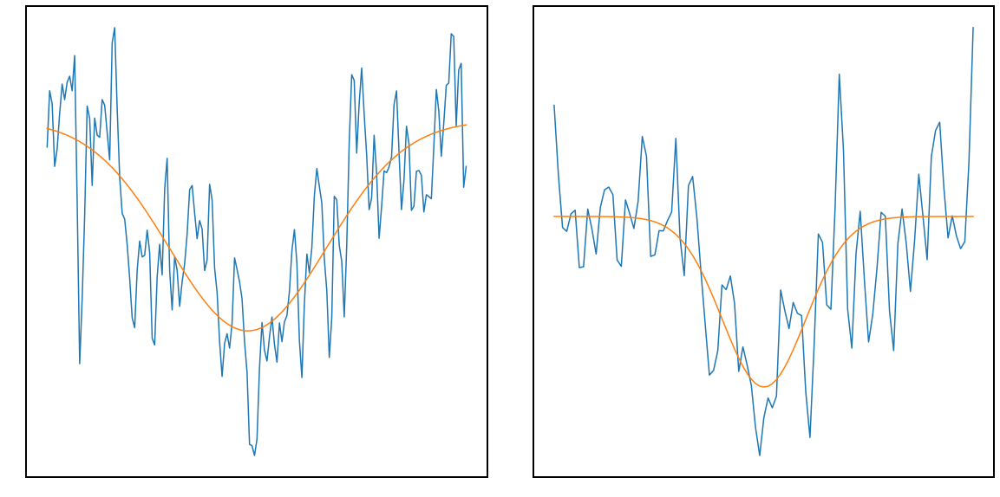

Parameters([('ampB', <Parameter 'ampB', value=-0.2076180290518459 +/- 0.0174, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8170627253515317 +/- 1.75e-05, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=6.31588765539419e-07 +/- 1.54e-07, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.6405727653054701 +/- 0.0172, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.22394348477130896 +/- 0.021, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=7.873394435639801e-08 +/- 1.88e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.657640460353341 +/- 0.00977, bounds=[-inf:inf]>)])


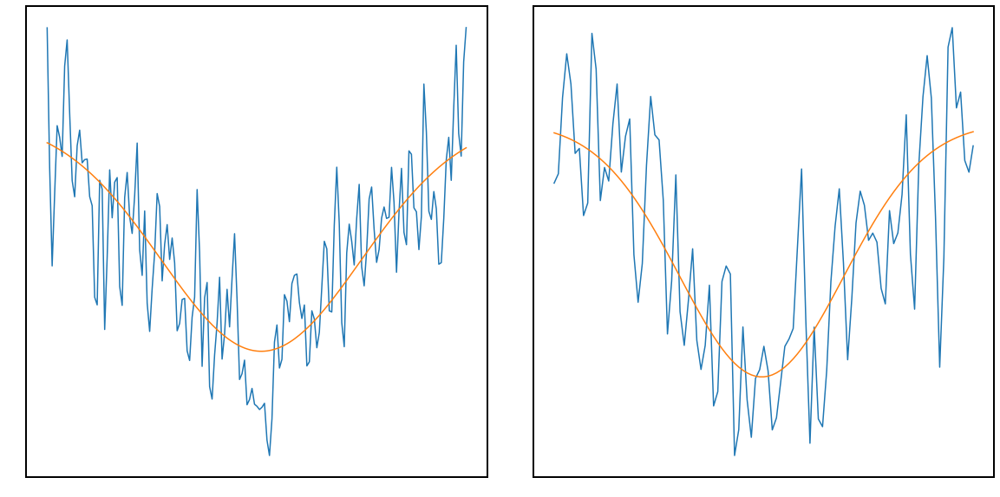

Parameters([('ampB', <Parameter 'ampB', value=-0.23697447685634976 +/- 0.0278, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8170519651664185 +/- 1.83e-05, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=1.025272365635179e-06 +/- 2.88e-07, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.6874809512825686 +/- 0.0305, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.24535414835863126 +/- 0.0211, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=3.0483889893513533e-07 +/- 7.54e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7314374355720921 +/- 0.0216, bounds=[-inf:inf]>)])


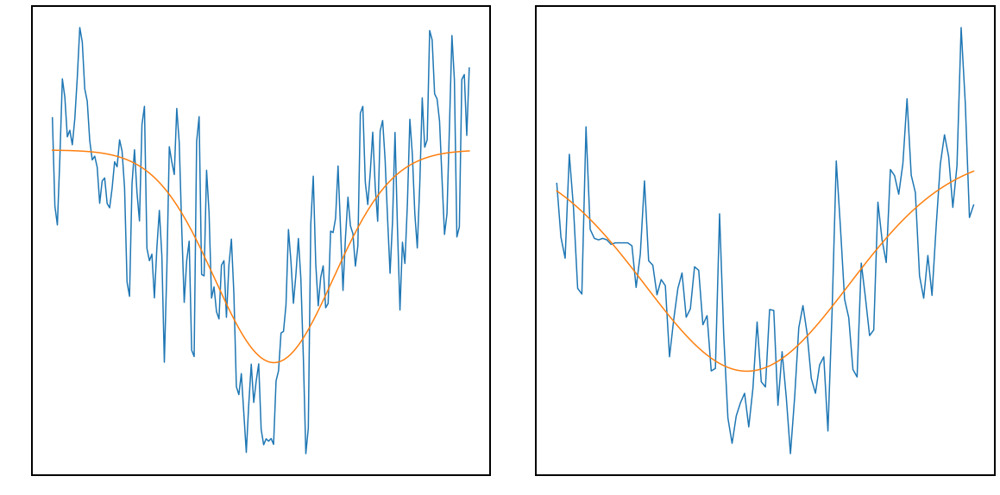

Parameters([('ampB', <Parameter 'ampB', value=-0.18919579893125313 +/- 0.014, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8171130343699353 +/- 1.94e-05, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=3.6262724572255174e-07 +/- 7.51e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.6166218465828399 +/- 0.00978, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.2832794140044602 +/- 0.0378, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=4.74740795720417e-07 +/- 1.5e-07, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7904023762593293 +/- 0.0411, bounds=[-inf:inf]>)])


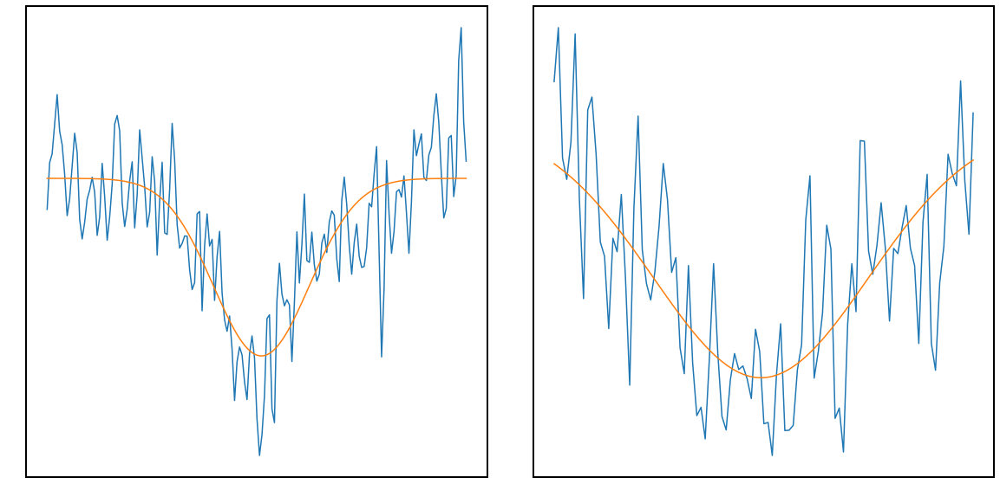

Parameters([('ampB', <Parameter 'ampB', value=-0.20224851746803543 +/- 0.0134, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8170881857927403 +/- 1.81e-05, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=2.3503012238642953e-07 +/- 4.08e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.6079455220556954 +/- 0.0072, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.23976441864285356 +/- 0.0454, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=5.266162940433854e-07 +/- 2.19e-07, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7509571026184244 +/- 0.0495, bounds=[-inf:inf]>)])


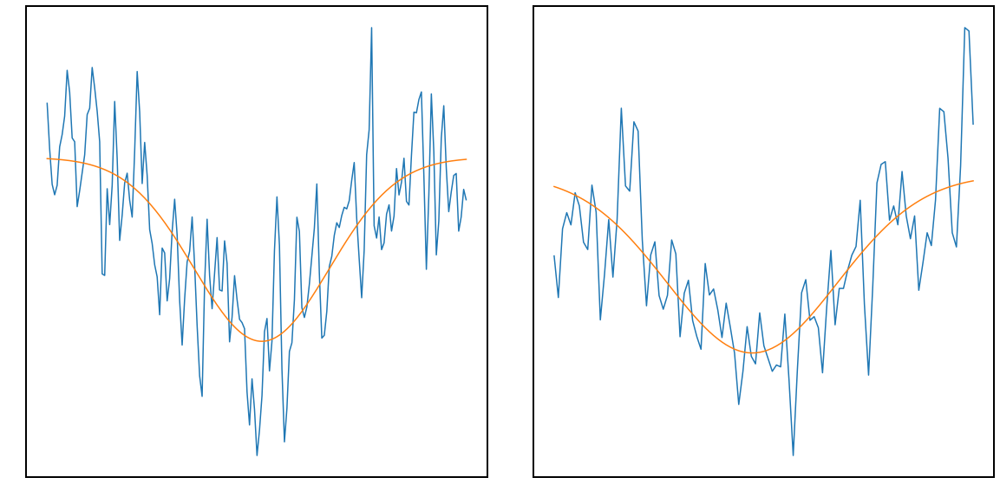

Parameters([('ampB', <Parameter 'ampB', value=-0.20382688945877614 +/- 0.0144, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.817126658203128 +/- 2.01e-05, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=4.656413794710502e-07 +/- 9.61e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.6521790484777832 +/- 0.012, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.23876135187950975 +/- 0.0245, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=3.301736954872838e-07 +/- 9.51e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.732786883367767 +/- 0.0257, bounds=[-inf:inf]>)])


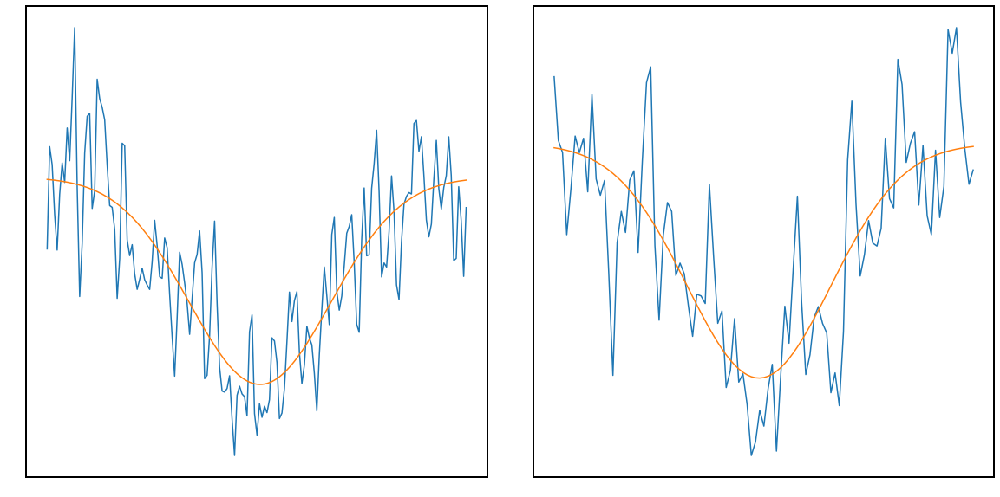

Parameters([('ampB', <Parameter 'ampB', value=-0.20510984563723922 +/- 0.0119, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8170787643942665 +/- 1.68e-05, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=5.107722999654518e-07 +/- 8.72e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.6568621097042661 +/- 0.0105, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.20590553872416575 +/- 0.0156, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=2.3556086543750307e-07 +/- 5.24e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.68913734012594 +/- 0.014, bounds=[-inf:inf]>)])


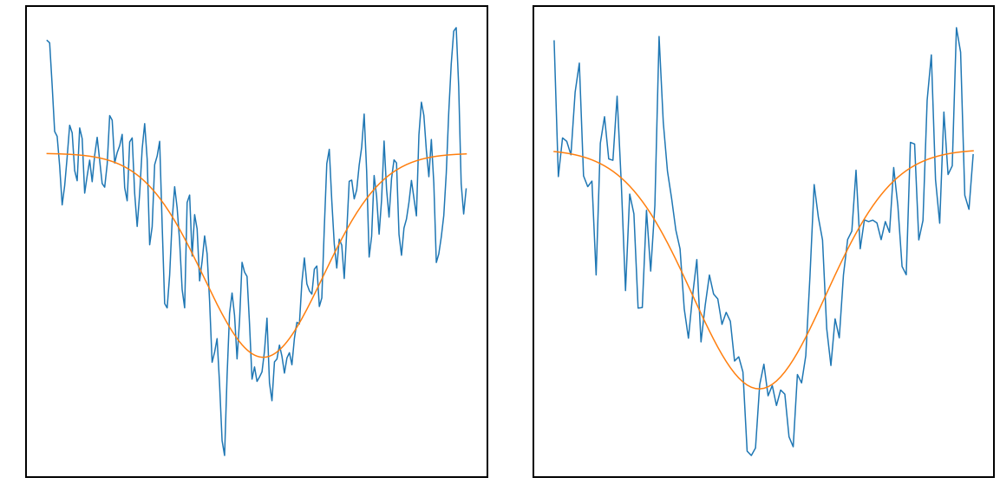

Parameters([('ampB', <Parameter 'ampB', value=-0.23674625454708498 +/- 0.0125, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8171194982941508 +/- 1.49e-05, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=3.637214538007615e-07 +/- 5.37e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.6617920218621907 +/- 0.00874, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.2437974180325407 +/- 0.0165, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=2.0387444934391126e-07 +/- 3.99e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7276395832632074 +/- 0.0134, bounds=[-inf:inf]>)])


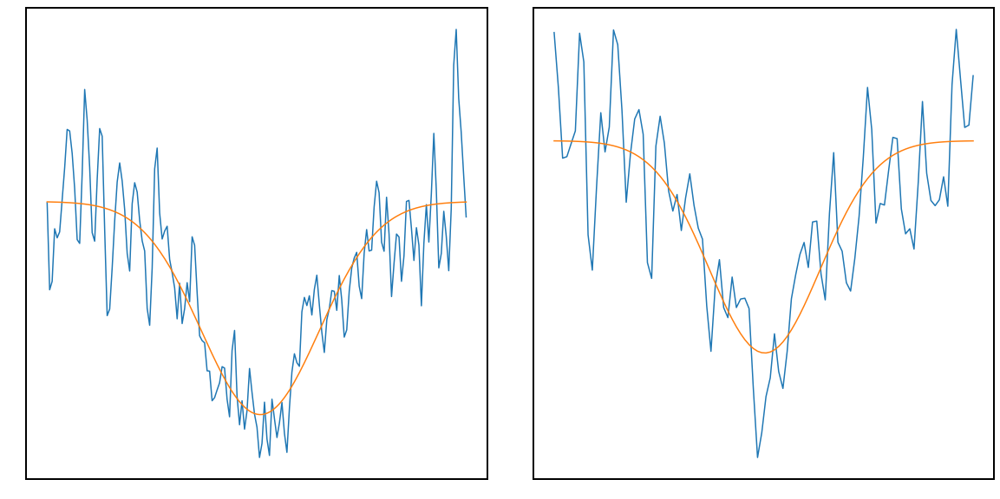

Parameters([('ampB', <Parameter 'ampB', value=-0.20630287663933874 +/- 0.0103, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8171163962569334 +/- 1.39e-05, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=3.568124797762809e-07 +/- 4.99e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5705672159368108 +/- 0.00715, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.1999309077509132 +/- 0.0135, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=1.3699389148789012e-07 +/- 2.53e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.6254762131656579 +/- 0.00858, bounds=[-inf:inf]>)])


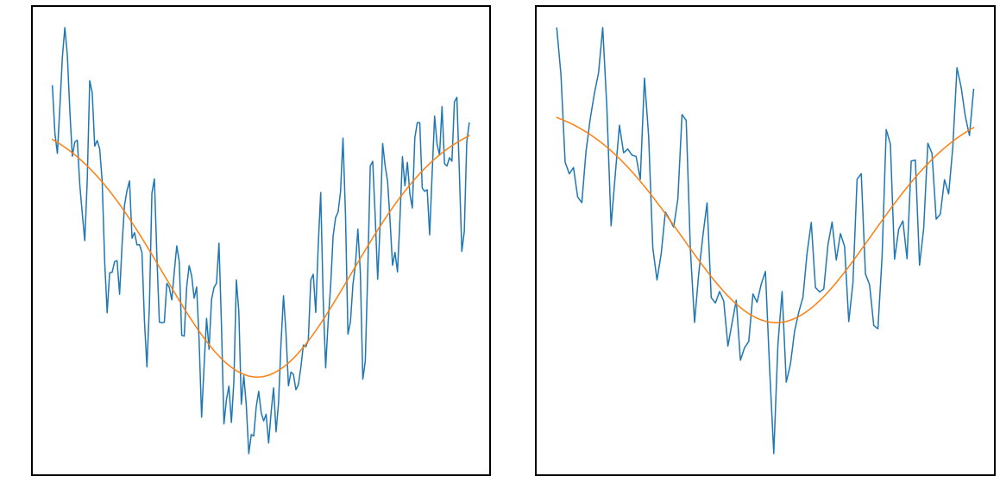

Parameters([('ampB', <Parameter 'ampB', value=-0.21136204767239206 +/- 0.0188, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8171535177720894 +/- 1.69e-05, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=9.10089413083354e-07 +/- 2.08e-07, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.6248366600361873 +/- 0.0206, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.22888068880120693 +/- 0.0244, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=4.144805950553603e-07 +/- 1.12e-07, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.6778287561275842 +/- 0.0265, bounds=[-inf:inf]>)])


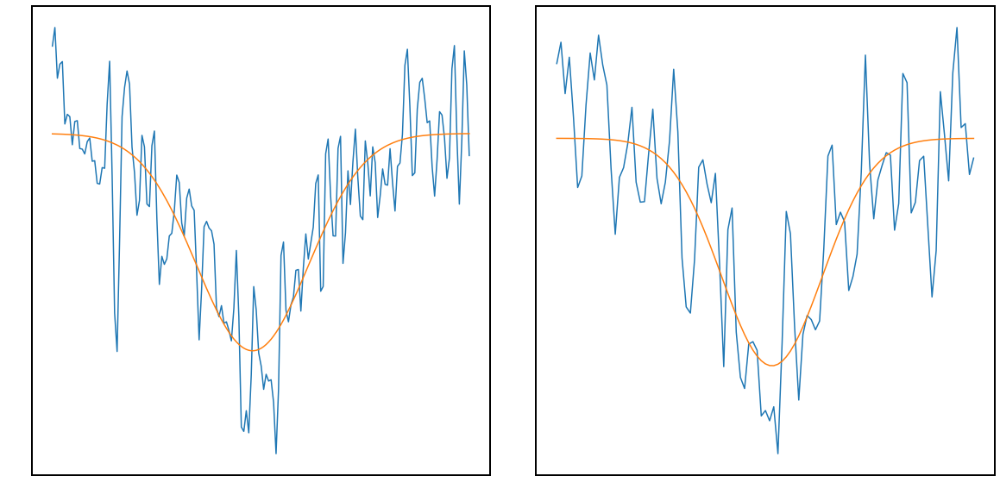

Parameters([('ampB', <Parameter 'ampB', value=-0.1888846957031321 +/- 0.0112, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.817173483769687 +/- 1.41e-05, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=3.241709332323802e-07 +/- 5.28e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5818180936140785 +/- 0.00728, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.218591009170253 +/- 0.0148, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=1.1708355160295511e-07 +/- 2.11e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.6605363791240435 +/- 0.00846, bounds=[-inf:inf]>)])


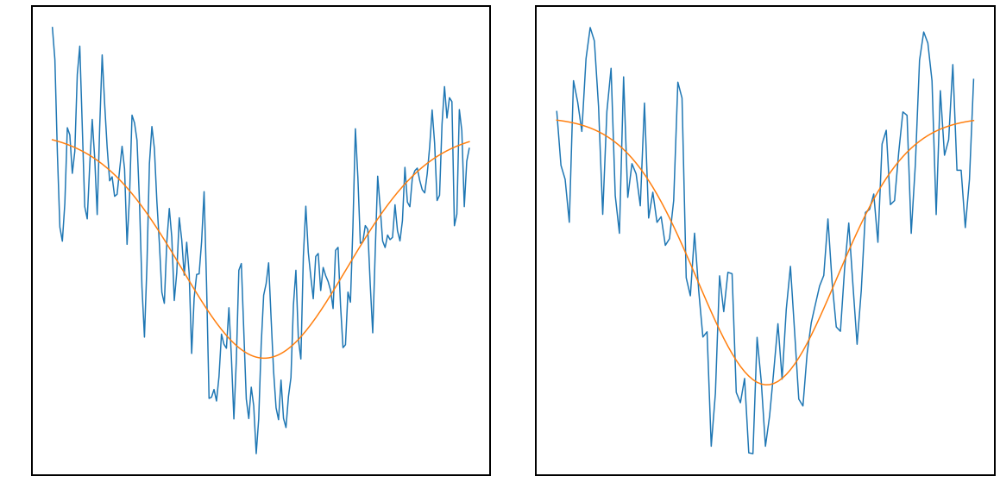

Parameters([('ampB', <Parameter 'ampB', value=-0.20373005585041068 +/- 0.0131, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.817168279298012 +/- 1.53e-05, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=7.002293215474596e-07 +/- 1.29e-07, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.6250007576554893 +/- 0.0136, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.20797877569095288 +/- 0.0136, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=2.2267630912072733e-07 +/- 4.28e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.6721701619884202 +/- 0.0118, bounds=[-inf:inf]>)])


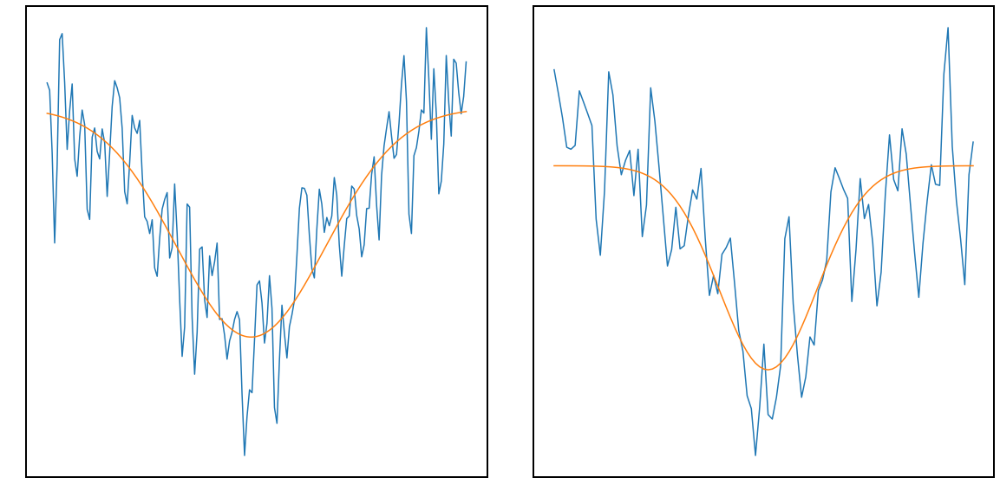

Parameters([('ampB', <Parameter 'ampB', value=-0.23638340006457767 +/- 0.0126, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8171218443634802 +/- 1.44e-05, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=5.66334676367803e-07 +/- 8.88e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.6483838924398406 +/- 0.0118, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.20760675907836276 +/- 0.0154, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=1.0900828546432816e-07 +/- 2.13e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.6663129029287048 +/- 0.00843, bounds=[-inf:inf]>)])


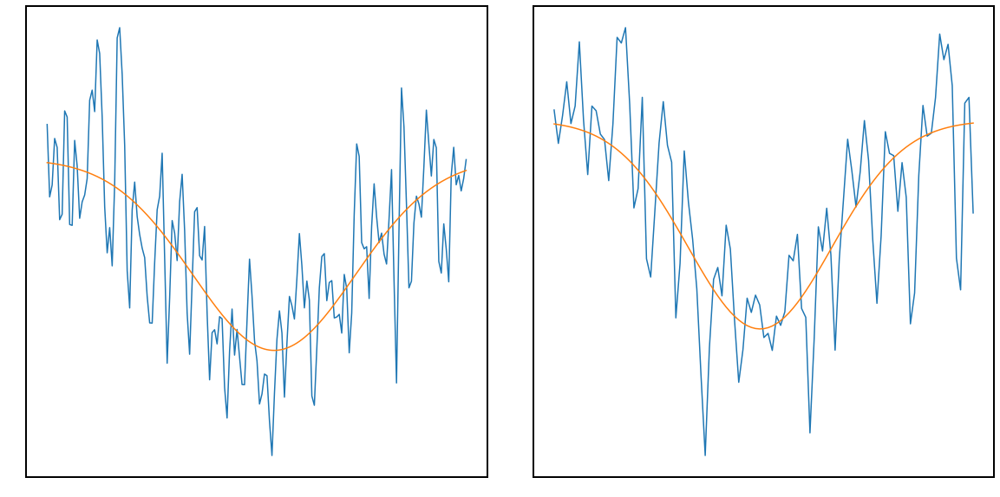

Parameters([('ampB', <Parameter 'ampB', value=-0.2679667245089907 +/- 0.0232, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.817143859465425 +/- 2.07e-05, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=6.756342490464728e-07 +/- 1.67e-07, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.6774310346593804 +/- 0.0233, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.30360297811394465 +/- 0.0262, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=2.36753515267727e-07 +/- 6.02e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7545766052293433 +/- 0.0236, bounds=[-inf:inf]>)])


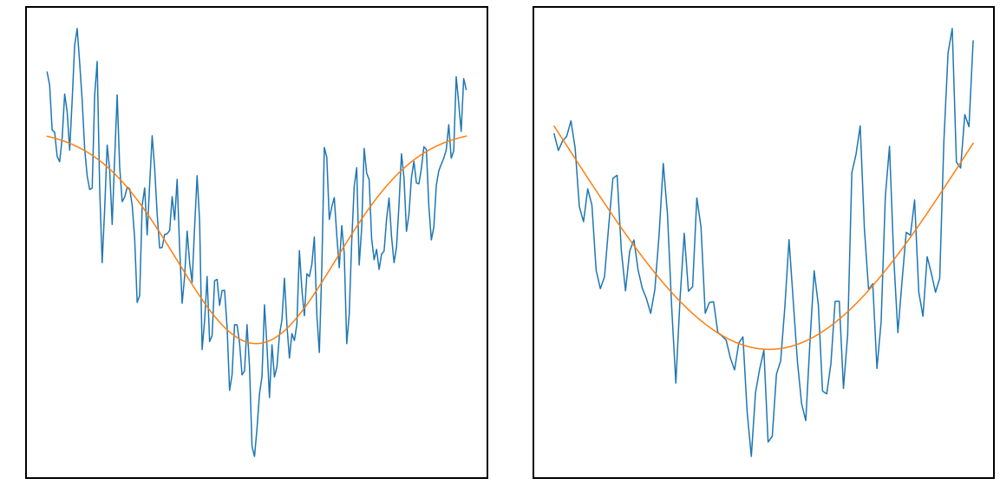

Parameters([('ampB', <Parameter 'ampB', value=-0.24406289975050252 +/- 0.0159, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8170873136447545 +/- 1.77e-05, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=6.541970787534445e-07 +/- 1.24e-07, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.6801857462463755 +/- 0.0161, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.5462465718140275 +/- 0.505, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=1.8338524464288666e-06 +/- 2.16e-06, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=1.0815090255615911 +/- 0.511, bounds=[-inf:inf]>)])


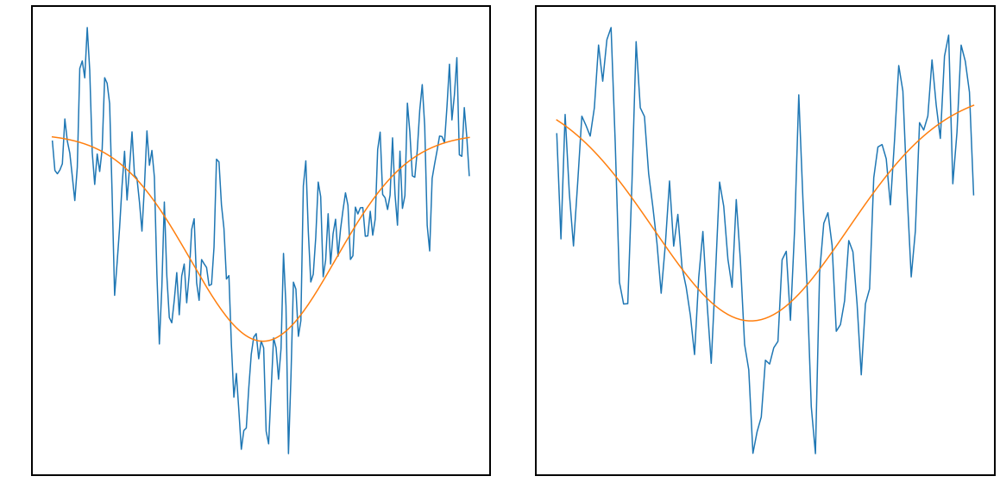

Parameters([('ampB', <Parameter 'ampB', value=-0.19669839198724606 +/- 0.0131, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.817052013385841 +/- 2.11e-05, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=5.450673524459673e-07 +/- 1.07e-07, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5947321710744865 +/- 0.0121, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.18999264542835934 +/- 0.0292, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=4.3110702126769126e-07 +/- 1.65e-07, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.70007535519009 +/- 0.0318, bounds=[-inf:inf]>)])


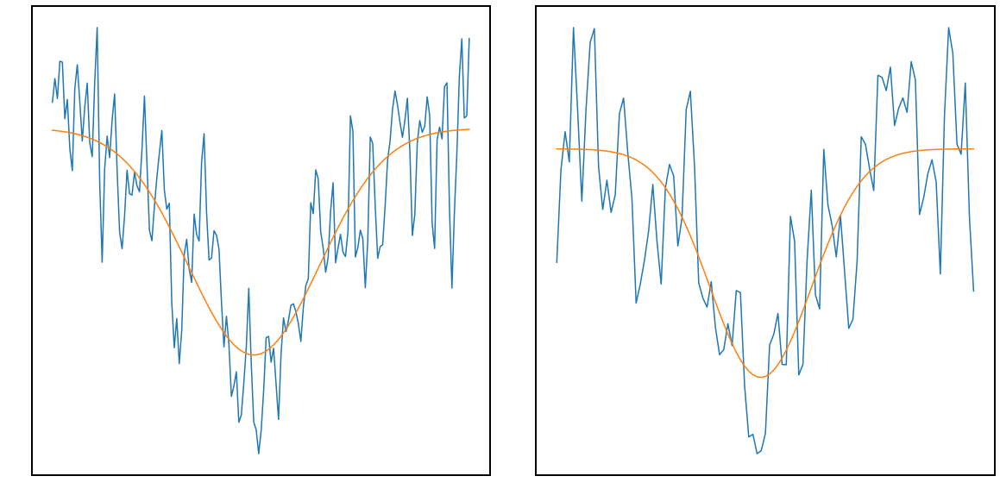

Parameters([('ampB', <Parameter 'ampB', value=-0.17391890088726372 +/- 0.0112, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.817039580958372 +/- 1.53e-05, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=4.4528418622235776e-07 +/- 8.31e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.574214669535497 +/- 0.00902, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.20744300049830725 +/- 0.0147, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=1.1826196511374183e-07 +/- 2.23e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.6451807684081543 +/- 0.00842, bounds=[-inf:inf]>)])


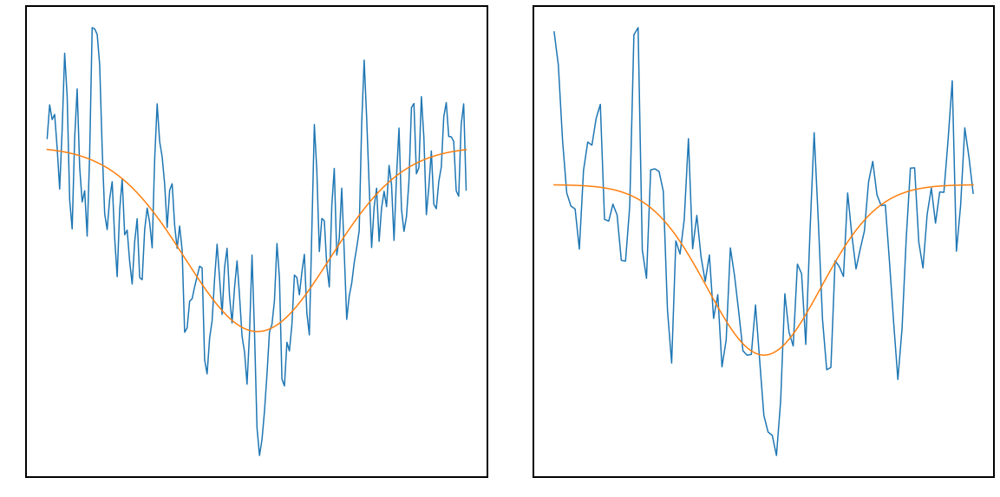

Parameters([('ampB', <Parameter 'ampB', value=-0.19913801461438432 +/- 0.0148, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8170425686719414 +/- 2.08e-05, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=5.345723508327451e-07 +/- 1.17e-07, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.6305316329362289 +/- 0.0134, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.18284790614042667 +/- 0.0179, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=1.4639395046495874e-07 +/- 3.94e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.6710267213593094 +/- 0.0117, bounds=[-inf:inf]>)])


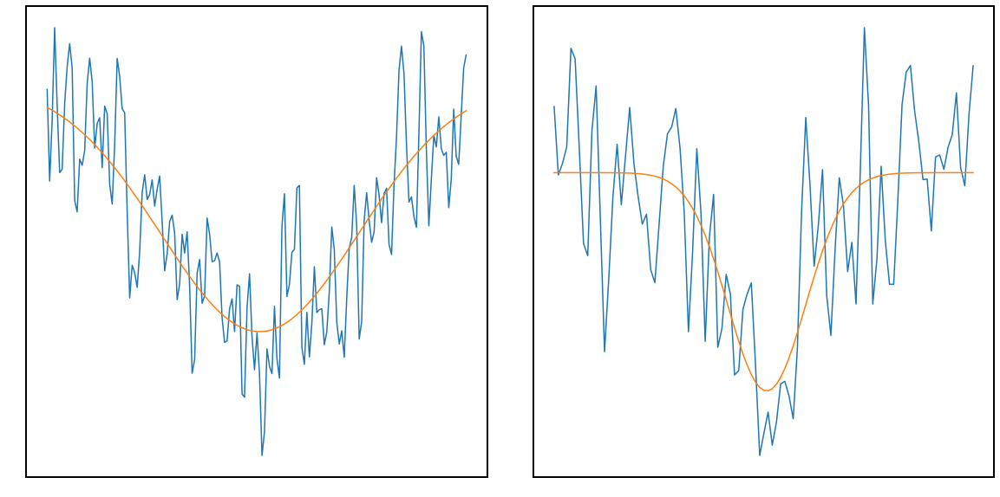

Parameters([('ampB', <Parameter 'ampB', value=-0.2392871587910001 +/- 0.0278, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.817075420447193 +/- 1.52e-05, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=1.0040986495743569e-06 +/- 2.83e-07, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.6775487859238999 +/- 0.0305, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.22778409354445658 +/- 0.0194, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=6.919753643892274e-08 +/- 1.48e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.6735148161460345 +/- 0.00851, bounds=[-inf:inf]>)])


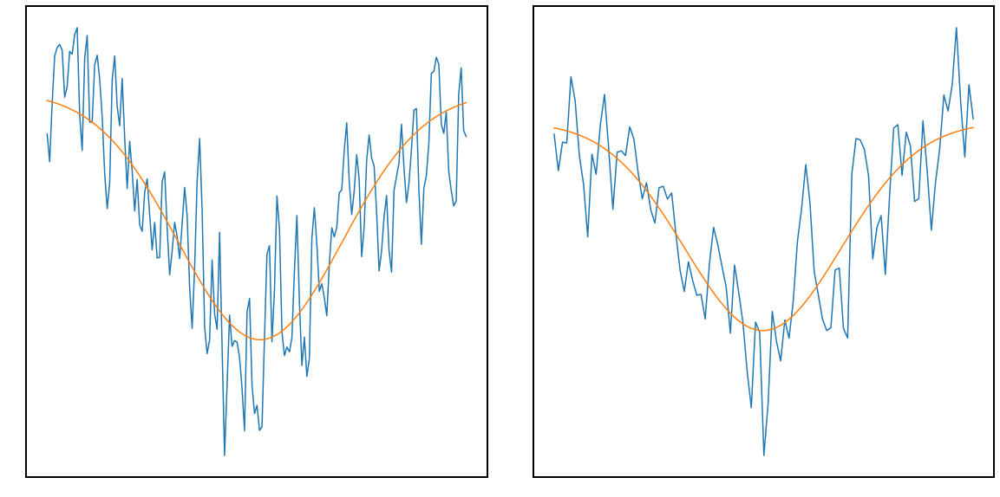

Parameters([('ampB', <Parameter 'ampB', value=-0.24146244703739467 +/- 0.017, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8170975851735216 +/- 1.5e-05, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=6.856046724435034e-07 +/- 1.38e-07, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.6801104816648091 +/- 0.0174, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.31632389842715436 +/- 0.0202, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=2.778108798463321e-07 +/- 5.19e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7757965601319761 +/- 0.0199, bounds=[-inf:inf]>)])


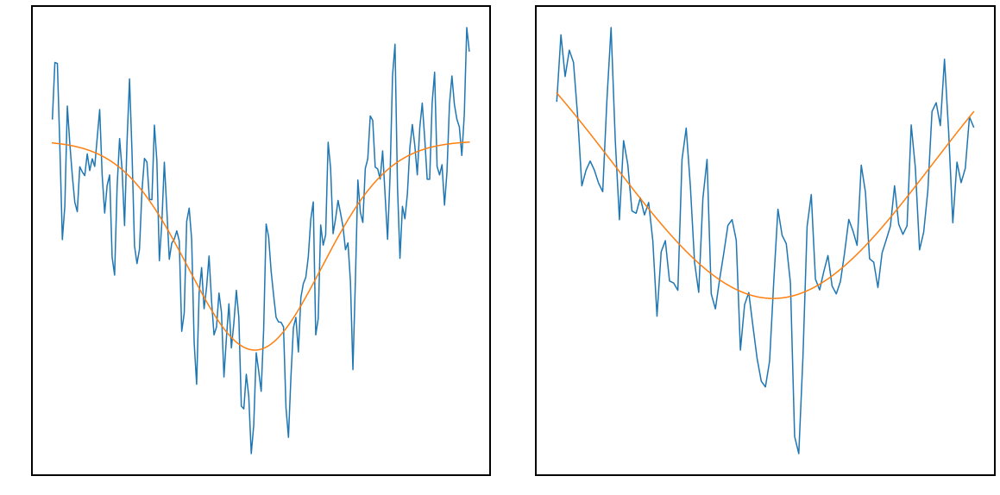

Parameters([('ampB', <Parameter 'ampB', value=-0.1987244570571278 +/- 0.0122, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.817118733272082 +/- 1.72e-05, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=4.6017665039810586e-07 +/- 8.23e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.604658210236535 +/- 0.0101, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.40176828009885757 +/- 0.189, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=1.1711418818177966e-06 +/- 8.04e-07, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.9098197460046876 +/- 0.194, bounds=[-inf:inf]>)])


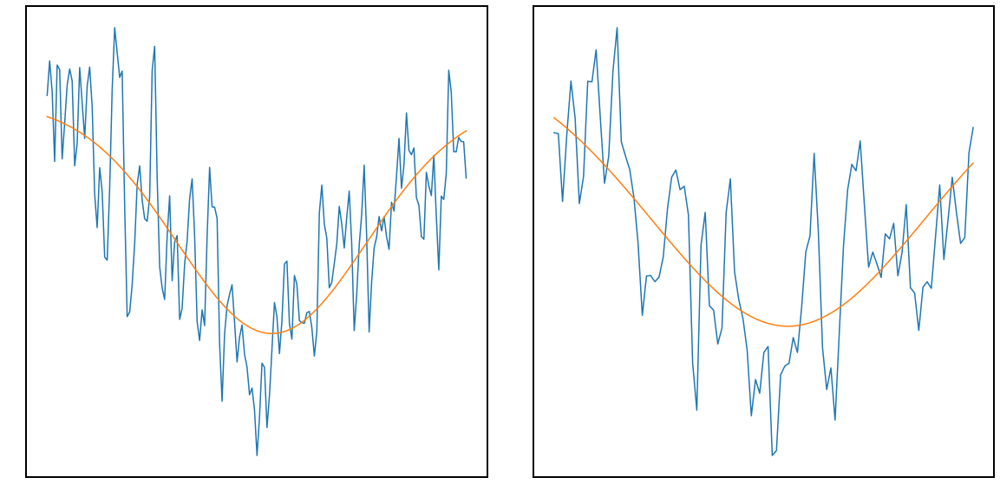

Parameters([('ampB', <Parameter 'ampB', value=-0.22172434033813945 +/- 0.0238, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.81721690962233 +/- 2.24e-05, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=9.199235614450073e-07 +/- 2.52e-07, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.6612668366781314 +/- 0.0259, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.29905742285005055 +/- 0.0926, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=8.457194172511222e-07 +/- 4.57e-07, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.8202165150582934 +/- 0.0976, bounds=[-inf:inf]>)])


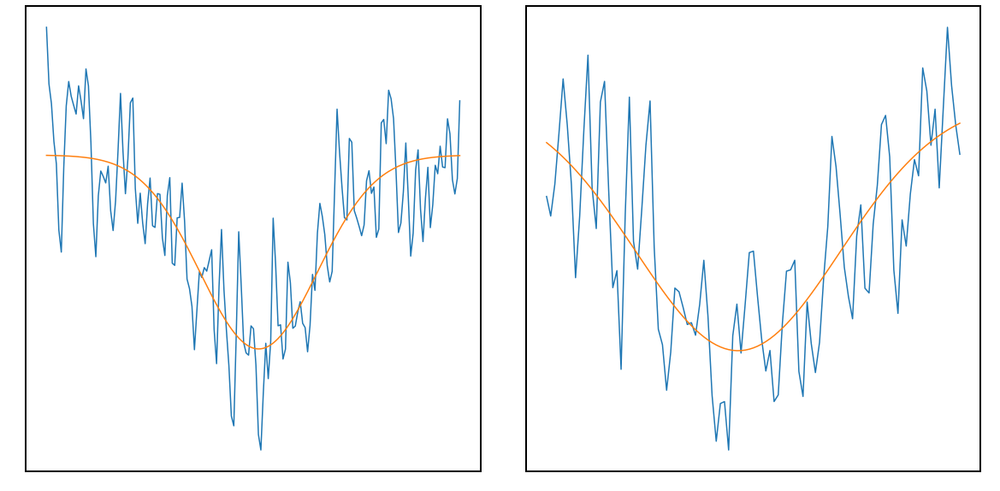

Parameters([('ampB', <Parameter 'ampB', value=-0.20508792465820636 +/- 0.0126, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.817147958785214 +/- 1.78e-05, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=3.6069945373155676e-07 +/- 6.18e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.6140374745528445 +/- 0.00875, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.25603987216411755 +/- 0.0362, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=4.872479197555057e-07 +/- 1.61e-07, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7552934918613484 +/- 0.0395, bounds=[-inf:inf]>)])


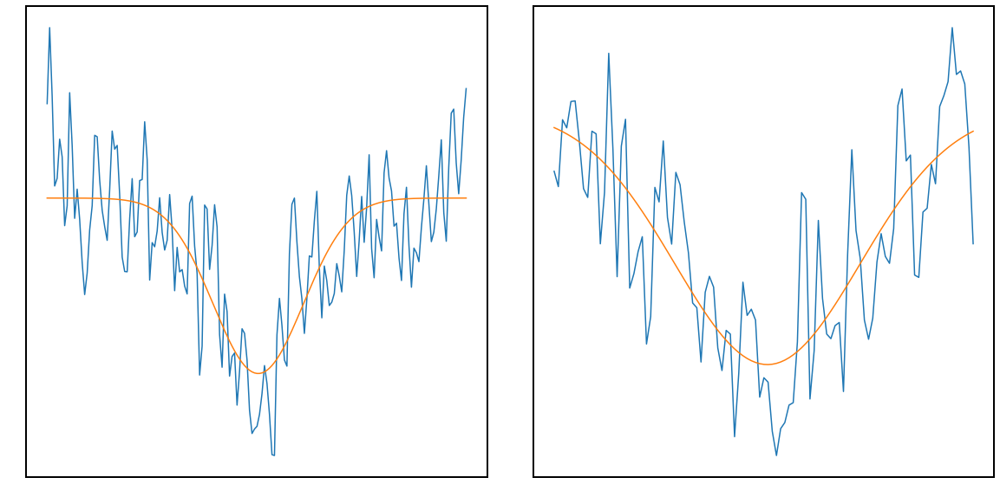

Parameters([('ampB', <Parameter 'ampB', value=-0.20013828598899497 +/- 0.0145, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8171191142484147 +/- 1.71e-05, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=2.071072007884802e-07 +/- 3.89e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.6249944482368834 +/- 0.00731, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.27124639814402546 +/- 0.0295, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=3.8869003561673834e-07 +/- 1.11e-07, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.803079384864758 +/- 0.032, bounds=[-inf:inf]>)])


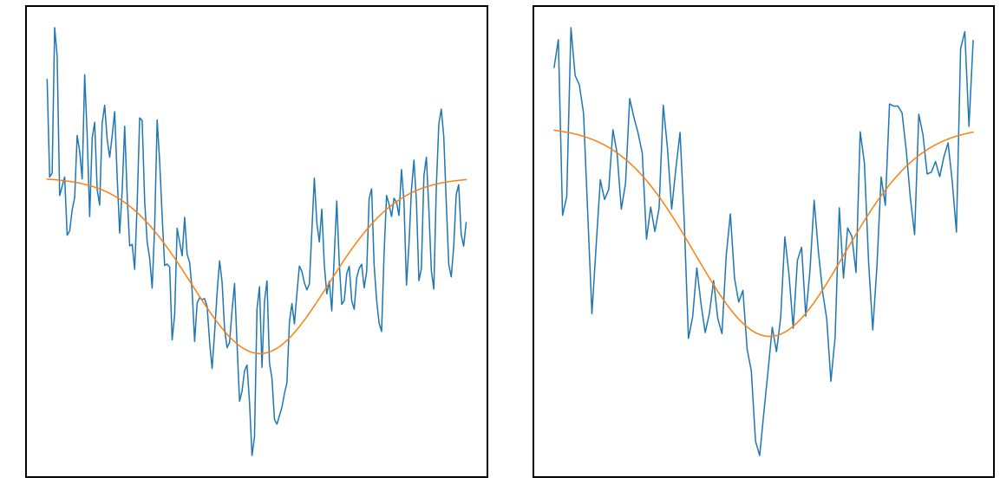

Parameters([('ampB', <Parameter 'ampB', value=-0.21905137569827277 +/- 0.0149, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.817149969711834 +/- 1.99e-05, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=4.77952704896424e-07 +/- 9.49e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.6594945417195499 +/- 0.0126, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.22539177991004145 +/- 0.0206, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=2.537405327818569e-07 +/- 6.81e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.728786584570997 +/- 0.0193, bounds=[-inf:inf]>)])


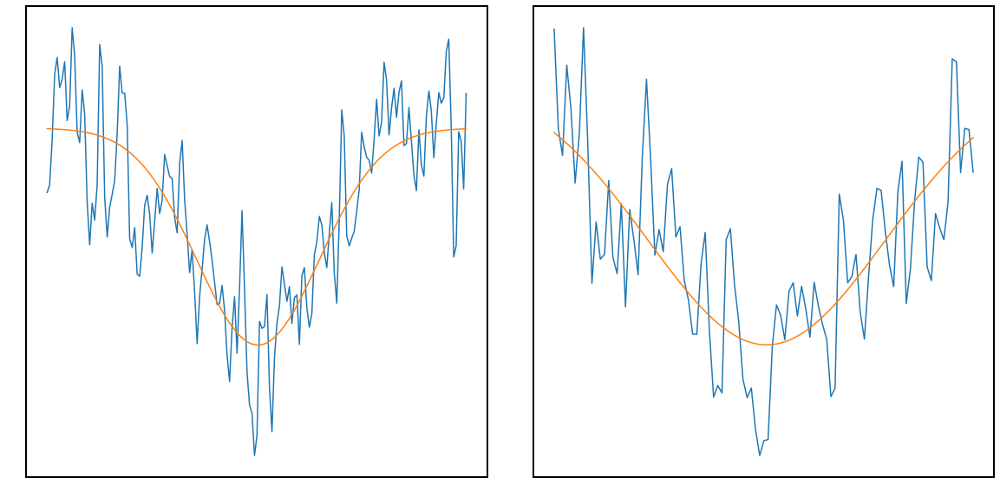

Parameters([('ampB', <Parameter 'ampB', value=-0.22517590345216487 +/- 0.0128, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.817135472274768 +/- 1.74e-05, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=3.859693496271634e-07 +/- 6.22e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.6678906864126645 +/- 0.00936, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.2855736619039019 +/- 0.0648, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=6.406969758484315e-07 +/- 2.84e-07, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.8178925136092638 +/- 0.0696, bounds=[-inf:inf]>)])


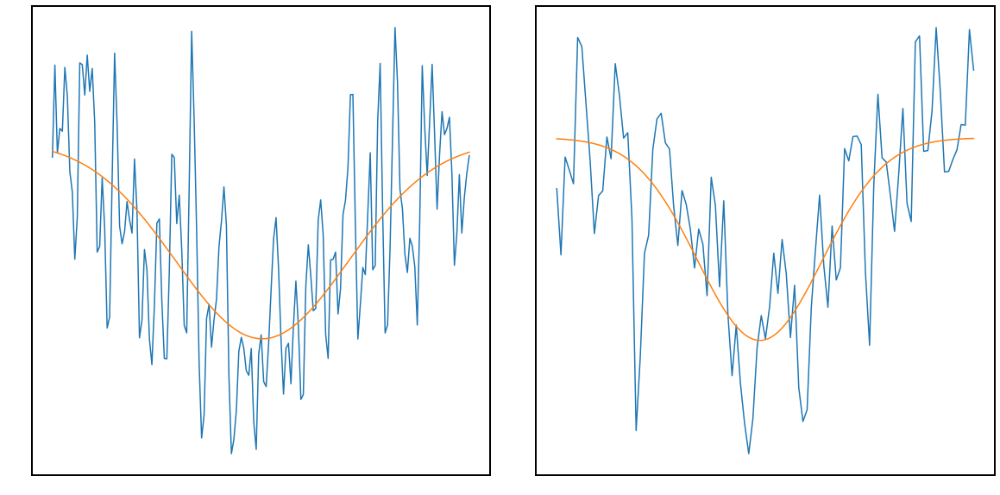

Parameters([('ampB', <Parameter 'ampB', value=-0.1889017932967965 +/- 0.0238, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8171356209051934 +/- 2.3e-05, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=7.735620597535563e-07 +/- 2.69e-07, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.6703658181272443 +/- 0.0254, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.23218198640490845 +/- 0.0213, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=1.7823358636888554e-07 +/- 4.65e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.752444020121263 +/- 0.0159, bounds=[-inf:inf]>)])


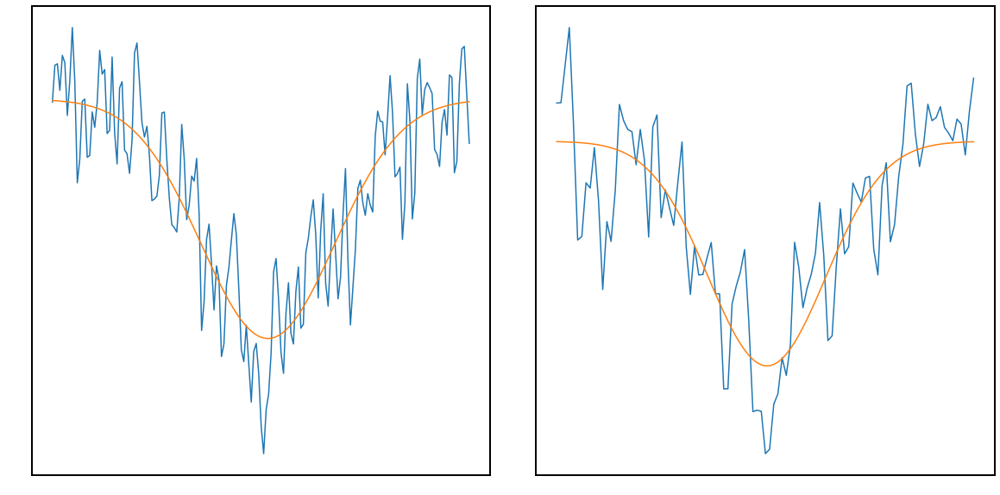

Parameters([('ampB', <Parameter 'ampB', value=-0.18059814902820975 +/- 0.00871, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8170696995379196 +/- 1.27e-05, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=4.6059211414748624e-07 +/- 6.45e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5639987512346182 +/- 0.00715, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.19697746677916259 +/- 0.011, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=1.5800693958914218e-07 +/- 2.46e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.6395632094151784 +/- 0.00757, bounds=[-inf:inf]>)])


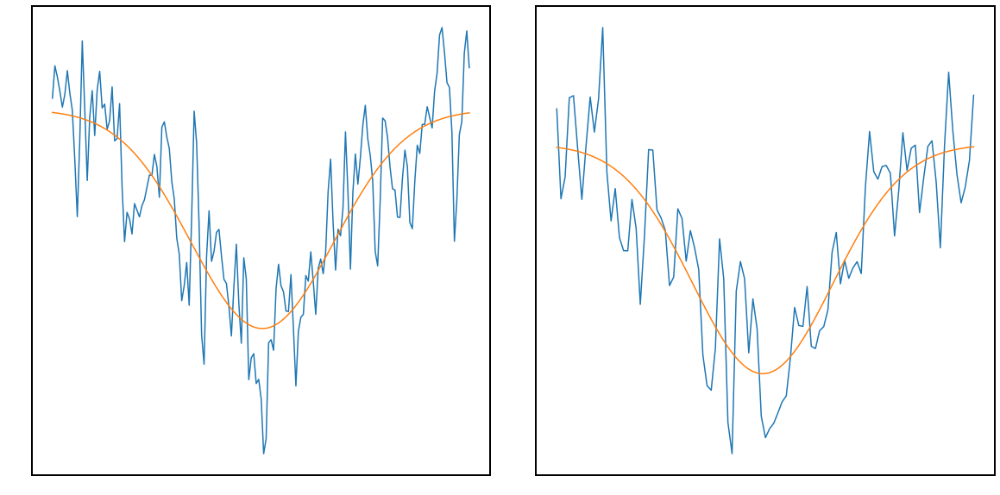

Parameters([('ampB', <Parameter 'ampB', value=-0.19768386999695292 +/- 0.0105, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.817029421752192 +/- 1.46e-05, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=5.263176368666571e-07 +/- 8.21e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5975270629066349 +/- 0.00942, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.21120432260943128 +/- 0.0134, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=2.2676971613330934e-07 +/- 4.21e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.6806699177593117 +/- 0.0117, bounds=[-inf:inf]>)])


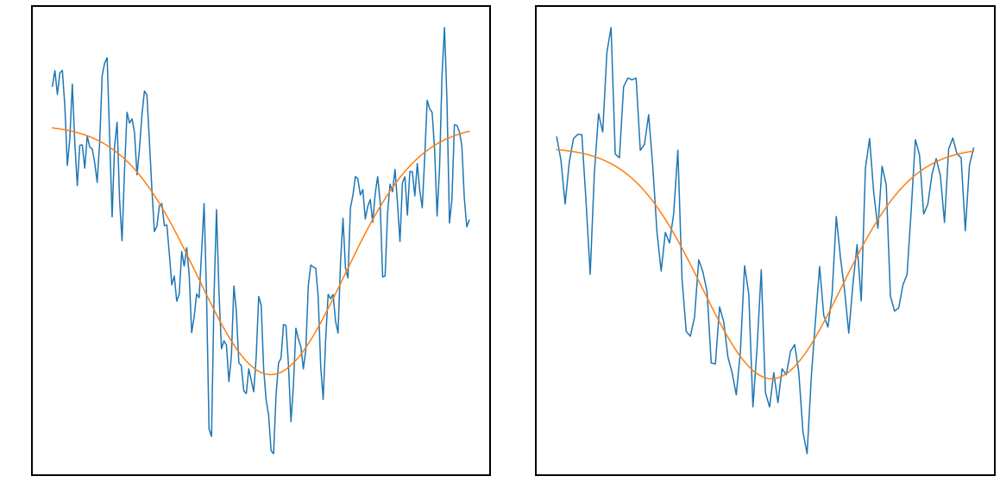

Parameters([('ampB', <Parameter 'ampB', value=-0.21005345708869885 +/- 0.0104, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.817072102229566 +/- 1.38e-05, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=5.550238151886755e-07 +/- 8.05e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.6115788596526051 +/- 0.00958, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.2131960356199005 +/- 0.0129, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=2.2267770507768594e-07 +/- 3.94e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.6764721703183705 +/- 0.0111, bounds=[-inf:inf]>)])


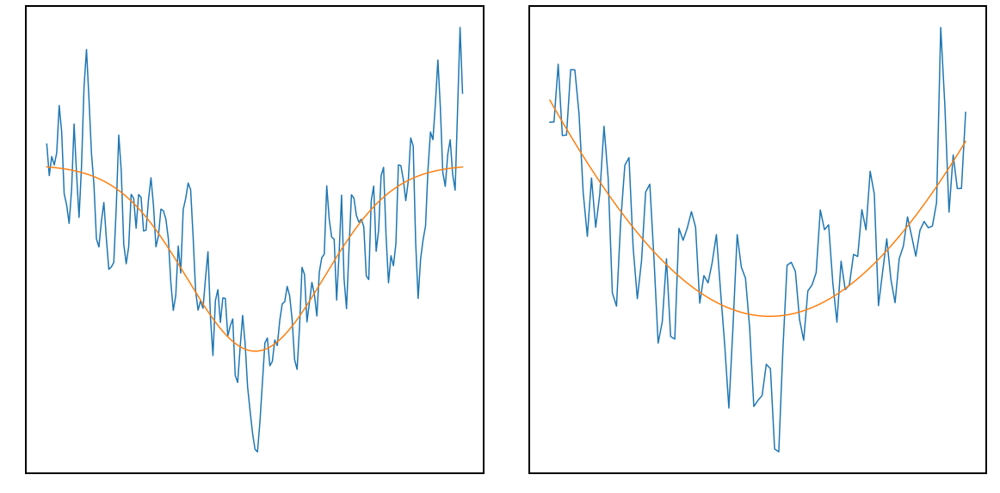

Parameters([('ampB', <Parameter 'ampB', value=-0.20294260053793703 +/- 0.0126, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8170589278220293 +/- 1.74e-05, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=4.879178176863193e-07 +/- 8.89e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.6195273072853901 +/- 0.0108, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-1.3384707812989722 +/- 3.63, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=5.349213652939116e-06 +/- 1.58e-05, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=1.855343976218343 +/- 3.64, bounds=[-inf:inf]>)])


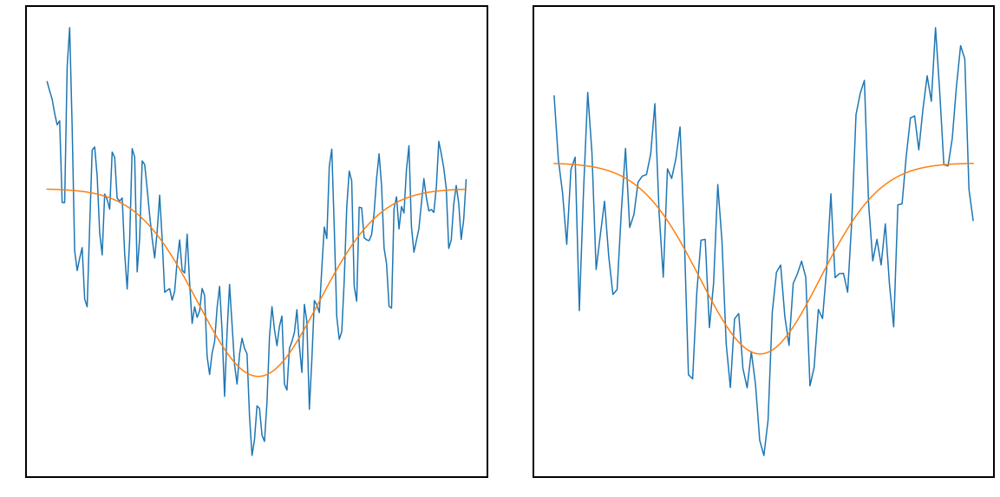

Parameters([('ampB', <Parameter 'ampB', value=-0.20734540153310682 +/- 0.0129, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.817084012532926 +/- 1.82e-05, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=3.744234299781592e-07 +/- 6.58e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.6200880872819112 +/- 0.00924, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.1931694273660839 +/- 0.0167, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=1.633880475633234e-07 +/- 3.97e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.6902596056803026 +/- 0.0117, bounds=[-inf:inf]>)])


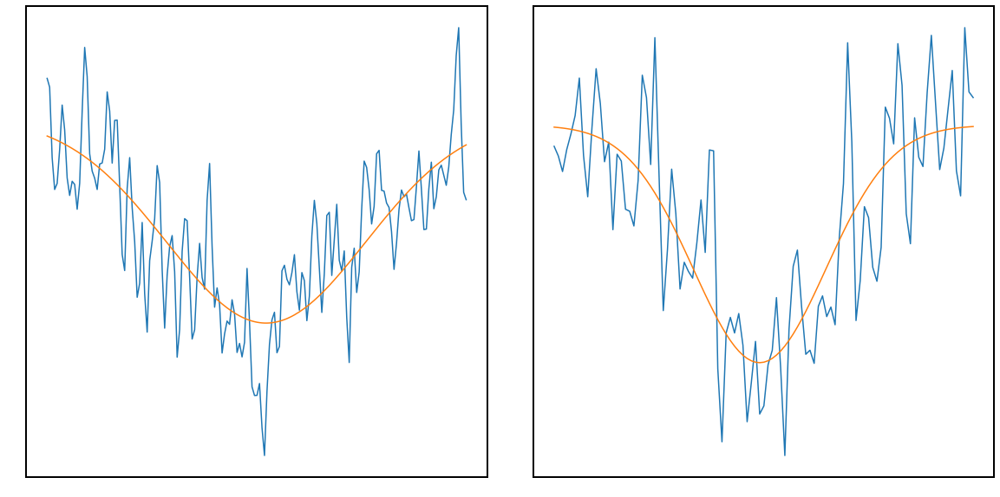

Parameters([('ampB', <Parameter 'ampB', value=-0.2374586897368055 +/- 0.0258, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8171217705026432 +/- 1.77e-05, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=1.0126118134531146e-06 +/- 2.66e-07, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.7102560069103004 +/- 0.0283, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.21829845183182922 +/- 0.0164, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=1.996249692108236e-07 +/- 4.34e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.6946468412547008 +/- 0.0132, bounds=[-inf:inf]>)])


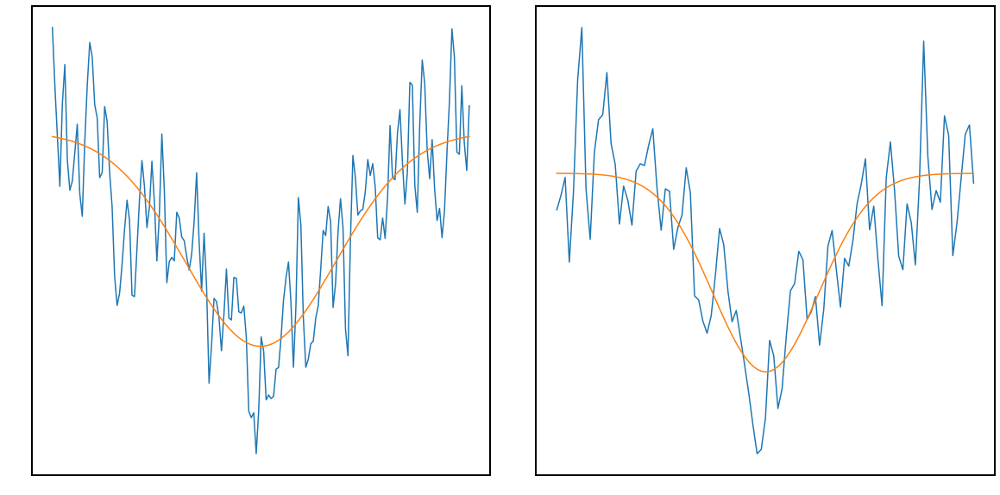

Parameters([('ampB', <Parameter 'ampB', value=-0.1936516118137241 +/- 0.0131, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.817123520939674 +/- 1.45e-05, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=5.85084598852893e-07 +/- 1.17e-07, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.6062073440477879 +/- 0.0126, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.24362903902245212 +/- 0.0154, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=1.2815278384428467e-07 +/- 2.18e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.6745679241602434 +/- 0.00924, bounds=[-inf:inf]>)])


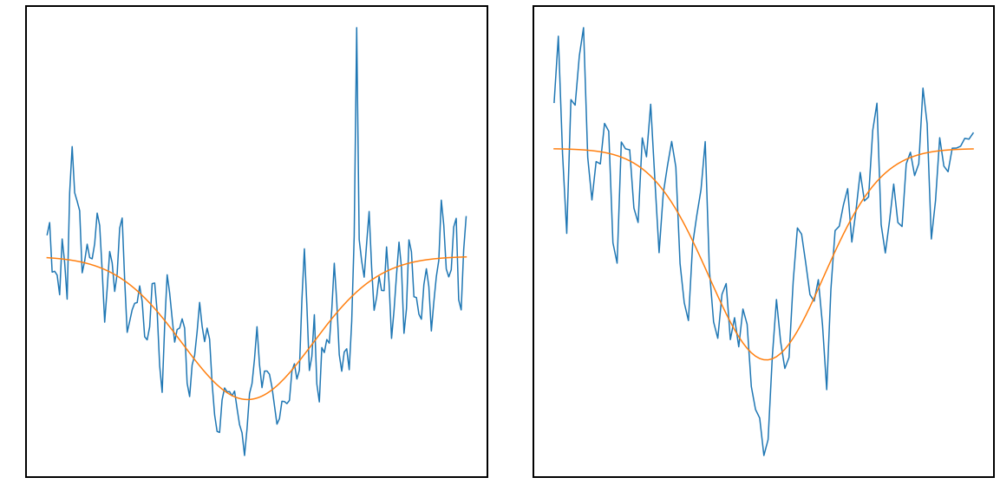

Parameters([('ampB', <Parameter 'ampB', value=-0.20282177395657255 +/- 0.0127, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8171139507719682 +/- 1.63e-05, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=4.3786883477618547e-07 +/- 7.91e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.6260409785384791 +/- 0.0101, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.22410945898571763 +/- 0.0163, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=1.4949743321328765e-07 +/- 3e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.6710662095517096 +/- 0.0108, bounds=[-inf:inf]>)])


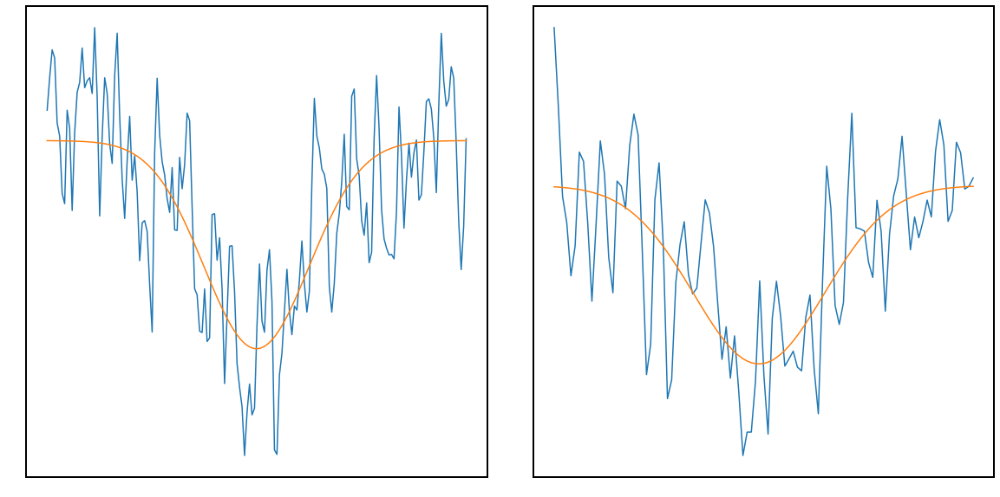

Parameters([('ampB', <Parameter 'ampB', value=-0.21633897038406513 +/- 0.0155, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8171783135178616 +/- 1.93e-05, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=2.8210113412227006e-07 +/- 5.43e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.6065367877963478 +/- 0.00924, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.2225014683639337 +/- 0.0199, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=1.9442860945493145e-07 +/- 5.01e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7207952234777164 +/- 0.0157, bounds=[-inf:inf]>)])


In [51]:
def fit_function(params, x2=None, x3=None, dat2=None, dat3=None):
    #1 is alpha 6562.801
    #4861.363 be -0.13033118436
    #ga 4340.472
    model2 = gaussian(x2, params['ampB'], params['cen']-0.13033118436, params['widB'], params['offB']) #beta
    model3 = gaussian(x3, params['ampG'], params['cen']-0.17955227662, params['widG'], params['offG'])
    resid2 = dat2 - model2
    resid3 = dat3 - model3
    return np.concatenate((resid2, resid3))



path = '/home/nwal/Desktop/binaries/J141/'
fluxes = []
wavels = []
count = 0
with open(path+'tar') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        wvl, flx = pyasl.read1dFitsSpec(line)
        wvl = 10*wvl
        flx = flx/np.median(flx)
        fluxes.append(flx)
        wavels.append(np.log10(wvl))
        count = count+1
path = '/home/nwal/Desktop/binaries/J141/'
dates2 = []
with open(path+'tar') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        hdul = fits.open(line)
        dates2.append(hdul[0].header['MJD-OBS'])
        hdul.close()
        
count = 0
wavelsAng = np.array(wavels)


offset = 0.6
ampl = -0.2

params = Parameters()
params.add('ampB', value = ampl)
params.add('cen', value=3.81717, min=3.8168)
params.add('widB', value=0.0000005)
params.add('offB', value=offset)
params.add('ampG', value = -0.4)
params.add('widG', value=0.0000005)
params.add('offG', value=0.8)





globalOff = []
for el in fluxes:
    #beta
    mod = Model(gaussian)
    indexSt = find_nearest(wavelsAng[count], 3.6863)
    indexFi = find_nearest(wavelsAng[count], 3.6871)
    fluxIn = fluxes[count][indexSt:indexFi+1]
    pixels = wavelsAng[count][indexSt:indexFi+1]
    pars = mod.make_params(amp=ampl,cen=3.6868,wid=0.0000005,off=offset)
    result = mod.fit(fluxIn,pars,x=pixels)
    cenEst = result.params['cen'].value
    indexSt = find_nearest(wavelsAng[count], cenEst-0.0015)
    indexFi = find_nearest(wavelsAng[count], cenEst+0.0015)
    fluxIn = fluxes[count][indexSt:indexFi+1]
    pixels = wavelsAng[count][indexSt:indexFi+1]
    x2Final = pixels
    dat2Final = fluxIn
    #gamma
    indexSt = find_nearest(wavelsAng[count], np.log10(4335))
    indexFi = find_nearest(wavelsAng[count], np.log10(4345))
    fluxIn = fluxes[count][indexSt:indexFi+1]
    pixels = wavelsAng[count][indexSt:indexFi+1]
    
    
    pars = mod.make_params(amp=-0.4,cen=np.log10(4341),wid=0.0000005,off=0.8)
    result = mod.fit(fluxIn,pars,x=pixels)
    cenEst = result.params['cen'].value
    indexSt = find_nearest(wavelsAng[count], cenEst-0.001)
    indexFi = find_nearest(wavelsAng[count], cenEst+0.001)
    fluxIn = fluxes[count][indexSt:indexFi+1]
    pixels = wavelsAng[count][indexSt:indexFi+1]
    
    x3Final = pixels
    dat3Final = fluxIn
    out = minimize(fit_function, params, args=(x2Final, x3Final, dat2Final, dat3Final))
    globalOff.append(out.params['cen'].value)
    count = count+1

    rc('axes', linewidth=2)

    fig, axs = plt.subplots(1, 2,
                        gridspec_kw={'hspace': 0.0, 'wspace': 0.1}, figsize=(20,10))
    axs[0].plot(x2Final,dat2Final)
    axs[0].plot(x2Final, gaussian(x2Final, out.params['ampB'], out.params['cen']-0.13033118436, out.params['widB'], out.params['offB'])) #beta
    axs[1].plot(x3Final,dat3Final)
    axs[1].plot(x3Final, gaussian(x3Final, out.params['ampG'], out.params['cen']-0.17955227662, out.params['widG'], out.params['offG'])) 
    plt.show()
    print(out.params)
    print('=========================================')
    #errorsTwo.append(out.params['offsetx'].stderr)
shiftsCen4 = globalOff

In [52]:
esovlt = EarthLocation.from_geodetic(lat=-24.6275*u.deg, lon=-70.4044*u.deg, height=2635*u.m)
sc = SkyCoord("14:11:26.2218057244 +20:09:11.044241117", frame=ICRS, unit=(u.hourangle, u.deg))
baryCorr = []
for el in dates2:
    barycorr = sc.radial_velocity_correction(obstime=Time(el, format='mjd'), location=esovlt)  
    baryCorr.append(barycorr.to(u.km/u.s).value)
print(baryCorr)

[-2.0692467990018315, -2.083736013398672, -2.0984291359103358, -2.113312246149907, -2.1284039315042738, -2.1436849915350167, -2.1591445476811795, -2.1747293354869615, -2.1904672854589142, -2.214663510718288, -2.2306788072127337, -2.2467720687243893, -2.2629201998290998, -2.2791104921973075, -2.295330921411874, -2.31157216219317, -2.3380348577641197, -2.354227341427923, -2.370347097489665, -2.386411904110878, -2.40235329020223, -2.433839441376878, -2.4494775967512052, -2.4649671309807206, -2.4802920990674253, -2.4954342340794016, -2.5103771729094517, -2.525112203462612, -2.8245856997367875, -2.8405095814911863, -2.8563198463479544, -2.8720270441254474, -2.8875583624481505, -2.9029346528231725, -2.926074689415107, -2.9410204527954575, -2.9557279623640818]


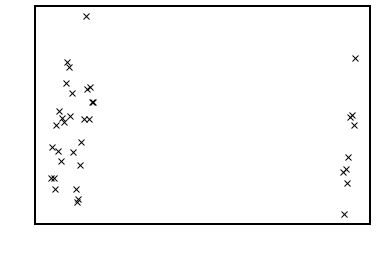

In [53]:
offsetsAlpha = 10**np.array(shiftsCen4)

offsetsAlphaS = offsetsAlpha

halpharest = 6562.801 #air
offsetsAlphaS = (offsetsAlphaS - halpharest)/halpharest
offsetsAlphaS = (offsetsAlphaS)*(299792458/1000)
velocityOGLong = offsetsAlphaS
offsetsAlphaS = offsetsAlphaS + baryCorr

plt.plot(dates2, offsetsAlphaS,'kx')


datesLong = dates2
velocityLong = offsetsAlphaS
barycorrLong = baryCorr

Name     Value      Min      Max   Stderr     Vary     Expr Brute_Step
c  -0.001015     -inf      inf   0.1257     True     None     None


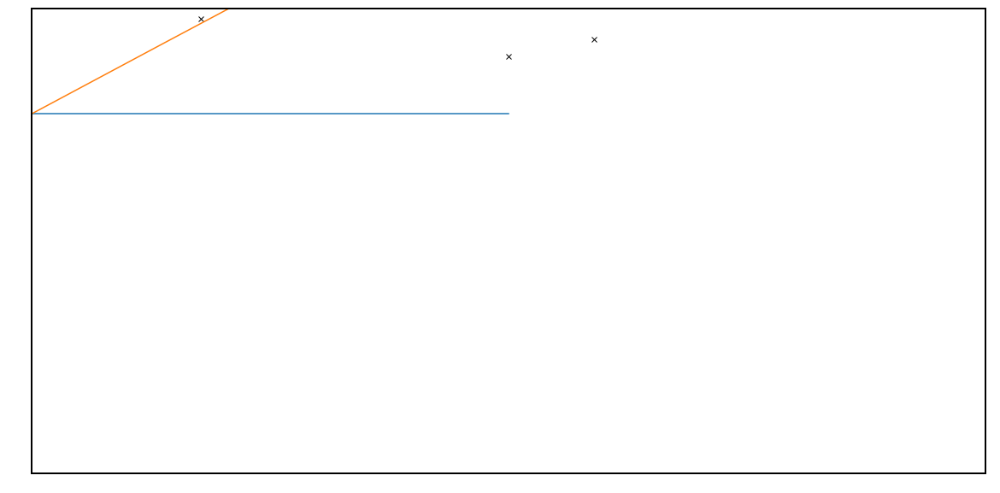

[-2.02111156e+01  6.03799014e-02 -2.03978309e+01 -2.78398991e+01
  1.43002828e+01 -2.86836183e+00  2.36747050e+01 -9.40288909e+00
  1.87005288e+01  1.65348621e+01  4.21464391e+01  5.59151840e+01
  5.23057259e+01  2.02314890e+01  3.54137679e+01 -3.63828864e+00
 -2.80313388e+01 -3.66287483e+01 -3.45826851e+01 -1.19228259e+01
  3.36139482e+00  1.79290274e+01  8.56965570e+01  3.80742518e+01
  1.81455798e+01  3.94321135e+01  2.94083914e+01  2.94962665e+01
 -1.63099783e+01 -4.41270229e+01 -1.46832100e+01 -2.37926830e+01
 -6.49300581e+00  1.95566750e+01  2.07419505e+01  1.41202918e+01
  5.85408573e+01]


In [62]:
foldFreq = 0.0845327526

def sineModelFixed(x,c):
    return 35*np.sin(2*np.pi*x+c)+15.5

mod = Model(sineModelFixed)
pars = mod.make_params(c=0)
#UVESFold = foldMeth(UVEST,0.41574154920793316)




phases = foldMeth(np.array(dates2)+0.0277, foldFreq)
offsetsAlpha = np.array(velocityLong)
#sortIndi = np.argsort(phases)
#phases = phases[sortIndi]
#offsetsAlphaS = offsetsAlpha[sortIndi]

plt.figure(figsize=(20,10))
plt.plot(phases,offsetsAlpha, 'kx')

plt.plot([0,0.05], [15.5,15.5])

result = mod.fit(offsetsAlpha,pars,x=phases)
TDummy = np.linspace(0,1,1000)
plt.xlim(0,0.1)
plt.ylim(0,20)
ypointsModel = sineModelFixed(TDummy,result.params['c'].value)
result.params.pretty_print()
plt.plot(TDummy,ypointsModel)

#plt.savefig('GD1400HAlphaSGUn.pdf')
plt.show()

print(offsetsAlpha)

In [63]:
print(phases)

[0.53571125 0.60125931 0.66669513 0.73202817 0.79740782 0.86281623
 0.92827255 0.99361933 0.05904143 0.15869586 0.22415218 0.28960988
 0.35504294 0.42046777 0.48590355 0.55138042 0.65814967 0.72364161
 0.78904316 0.85449402 0.91978192 0.05001952 0.11549229 0.18096641
 0.24644191 0.31190782 0.37736004 0.44282732 0.69046161 0.75592487
 0.82137308 0.8869185  0.95232425 0.0177437  0.1176461  0.18323945
 0.24872462]


In [7]:
ypointsModel = sineModelFixed(phases,result.params['c'].value)

for el in ypointsModel:
    print(el)

7.747658358512612
-5.266802528041673
-14.79593686133948
-19.27300352143333
-17.969299452810127
-11.092503661876727
0.22235463035901049
14.06108242613984
28.154440014500036
44.87718354176634
50.03357281835837
49.43052819001316
43.17178150397632
32.30287562695929
18.63191750804734
4.4303832864835755
-13.811718608447585
-19.01512600484864
-18.46088600929746
-12.245529671097579
-1.435026473482452
26.28530138942195
38.69996310371425
47.24364509415179
50.490427353986526
47.89908406774324
39.90496011206709
27.838087150389043
-17.066185289605286
-19.47707679469425
-16.054856066371308
-7.35515264425057
5.137128308613509
19.358046326432966
39.0524706394913
47.45095121869899
50.49856796688484


In [9]:
path = '/home/nwal/Desktop/binaries/J141/'
snrArray = []
with open(path+'tar') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        wvl, flx = pyasl.read1dFitsSpec(line)
        spectrum = Spectrum1D(spectral_axis=10*wvl* u.AA, flux=flx* u.Jy)
        der = snr_derived(spectrum)
        print(der)
        snrArray.append(der)

10.003640761318527
10.331249626467288
10.323619937309982
10.836296233354235
10.98444415203022
11.346898437827855
11.69192442408755
12.371936849232647
12.70798097252899
14.973018475780323
14.995770469030237
13.835758743880822
13.634267240101735
13.42164628643299
7.867587511673712
13.213412570171245
13.4874243175131
14.244941630855799
11.923674447404421
11.716418226909683
11.448392376459891
11.383963714900284
11.198334489618242
11.48408666411624
10.862303825108809
10.802862683645815
10.925624229059403
8.81981234519864
15.896964726353236
15.723153911531982
15.588558224808384
14.265575133461324
13.151236610141543
12.923738161652407
12.954202196744525
12.18823682297517
10.022516484482884


In [4]:
#shifts from H beta/gamma
path = '/home/nwal/Desktop/binaries/J141/'
dates2 = []
with open(path+'tar') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        hdul = fits.open(line)
        dates2.append(hdul[0].header['MJD-OBS'])
        hdul.close()
print(dates2)

[56766.127873119, 56766.133414077, 56766.138945547, 56766.144468329, 56766.149995051, 56766.155524204, 56766.161057407, 56766.16658135, 56766.17211166, 56766.180535723, 56766.186068926, 56766.191602246, 56766.197133482, 56766.202664023, 56766.20819549, 56766.21373043, 56766.222755929, 56766.228292143, 56766.233820716, 56766.239353457, 56766.244872423, 56766.255881766, 56766.261416359, 56766.266951067, 56766.272485891, 56766.278019905, 56766.283552761, 56766.28908689, 56767.239880377, 56767.245414167, 56767.250946684, 56767.256487419, 56767.262016347, 56767.267546433, 56767.275991458, 56767.281536244, 56767.287071886]


In [13]:
#shifts from H beta/gamma
path = '/home/nwal/Desktop/binaries/J141/'
fluxes = []
wavels = []
count = 0
with open(path+'tar') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        wvl, flx = pyasl.read1dFitsSpec(line)
        wvl = 10*wvl
        flx = flx/np.median(flx)
        fluxes.append(flx)
        wavels.append(np.log10(wvl))
        count = count+1
path = '/home/nwal/Desktop/binaries/J141/'
dates2 = []
with open(path+'tar') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        hdul = fits.open(line)
        dates2.append(hdul[0].header['MJD-OBS'])
        hdul.close()

count=0
wavelsAng = np.array(wavels)



shift = np.array([0.142131667523815,-0.046085252299697,-0.183837769801015,-0.248442406596253,-0.229348542875989,-0.129563289360488,0.034479954804757,0.235066240489598,0.439341340226497,0.681807824221054,0.756695222404929,0.748197190314801,0.657815249766174,0.500686852703546,0.302990063473642,0.097611758400815,-0.16611893223749,-0.241220759285011,-0.232962943935913,-0.14274283206347,0.014005205225678,0.415803077715277,0.59577214267883,0.719694020718623,0.766923645607602,0.729624744042853,0.614100117646793,0.439606177900097,-0.206193526848348,-0.240868482088707,-0.19109178901588,-0.064907841121528,0.116183468827995,0.322300184568324,0.607776132376365,0.729587873388429,0.773924989062524])
adjWvl = []
count = 0
for el in wavels:
    
    newW = 10**el-shift[count]
    adjWvl.append(newW)
    count = count + 1
count = 0

for el in adjWvl:
    nameFile = str(count)+'ShiftedJ141.fits'
    pyasl.write1dFitsSpec(nameFile, fluxes[count]*snrArray[count].value, wvl=el, clobber=True)
    count = count +1


# write out the recipe with spreadsheet and dispcor

/home/nwal/anaconda3/lib/python3.7/site-packages/pyfits/file.py:372: UserWarning: Overwriting existing file '0ShiftedJ141.fits'.
  warnings.warn("Overwriting existing file %r." % self.name)


In [14]:
wvl, flx = pyasl.read1dFitsSpec('/home/nwal/Desktop/binaries/J141/shiftedFixedSNR/coAddShifted.fits')
spectrum = Spectrum1D(spectral_axis=wvl* u.AA, flux=flx* u.Jy)
der = snr_derived(spectrum)
print(der)

wvl, flx = pyasl.read1dFitsSpec('/home/nwal/Desktop/binaries/J141/shiftedFixed/coAddShifted.fits')
spectrum = Spectrum1D(spectral_axis=wvl* u.AA, flux=flx* u.Jy)
der = snr_derived(spectrum)
print(der)


84.94131520317706
70.72503986439285


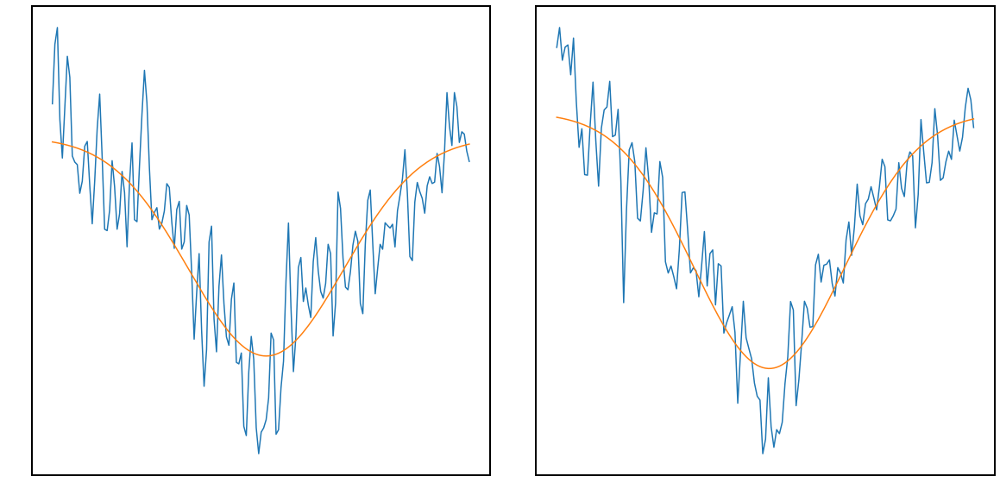

Parameters([('ampB', <Parameter 'ampB', value=-0.16078233929067484 +/- 0.00889, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.817128616366107 +/- 1.38e-05, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=6.171669257946812e-07 +/- 9.99e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5599417567579935 +/- 0.00873, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.22812244789783578 +/- 0.00908, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=5.852304357439441e-07 +/- 6.86e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7826732185024836 +/- 0.00868, bounds=[-inf:inf]>)])


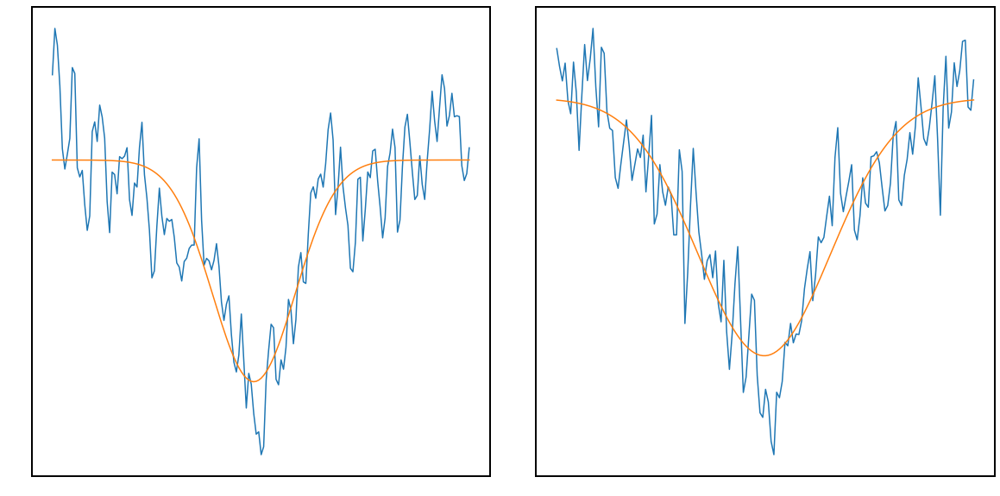

Parameters([('ampB', <Parameter 'ampB', value=-0.16500583396297672 +/- 0.00835, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8170928803666353 +/- 1.16e-05, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=1.7567875755975843e-07 +/- 2.27e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5377352282897557 +/- 0.00389, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.21954183234375976 +/- 0.00818, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=4.529226143943207e-07 +/- 4.9e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7684460013165153 +/- 0.00665, bounds=[-inf:inf]>)])


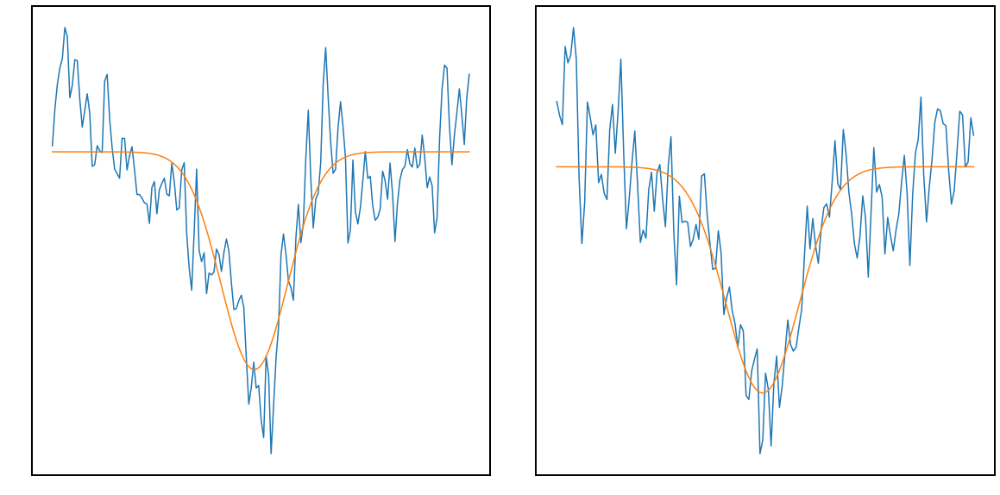

Parameters([('ampB', <Parameter 'ampB', value=-0.1707945299179552 +/- 0.0109, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8170609368284767 +/- 1.11e-05, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=1.1550620055729786e-07 +/- 1.82e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5487106733312187 +/- 0.00422, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.22005809639766385 +/- 0.0111, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=1.389292450857985e-07 +/- 1.75e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7430861520097664 +/- 0.00463, bounds=[-inf:inf]>)])


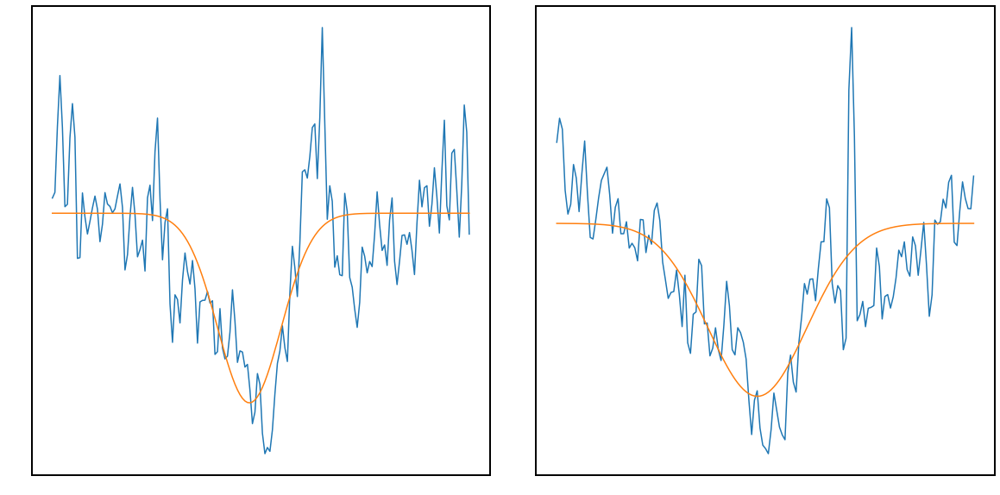

Parameters([('ampB', <Parameter 'ampB', value=-0.13529923975915606 +/- 0.0125, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8169633990469953 +/- 1.6e-05, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=1.027908241064019e-07 +/- 2.34e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5443700369270161 +/- 0.00465, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.18949194077864998 +/- 0.0111, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=2.512396821328123e-07 +/- 3.89e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7658812348309098 +/- 0.00619, bounds=[-inf:inf]>)])


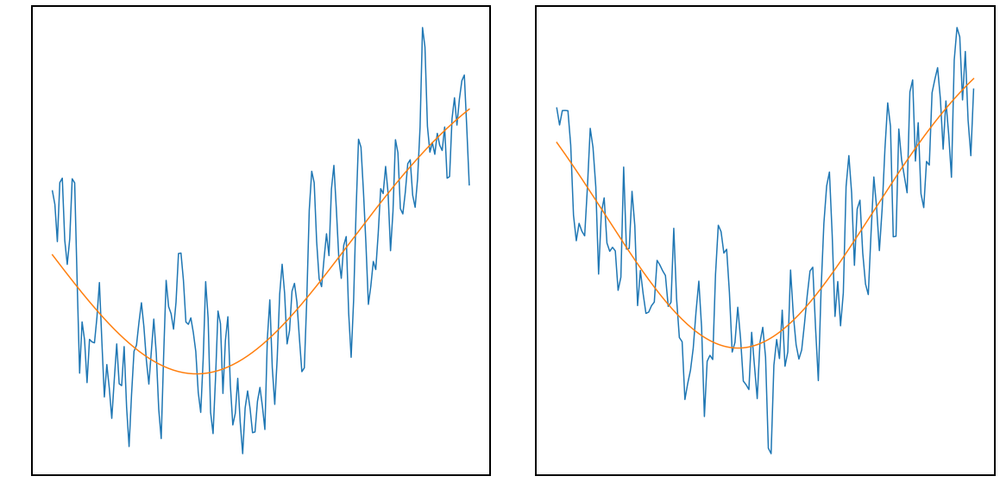

Parameters([('ampB', <Parameter 'ampB', value=-0.17159248849298808 +/- 0.0278, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.817205100222886 +/- 1.96e-05, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=2.4593494621435166e-06 +/- 7.41e-07, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.6595090231418623 +/- 0.0295, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.21926054820461702 +/- 0.0324, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=1.8573619733531018e-06 +/- 4.87e-07, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.8592380343437851 +/- 0.0342, bounds=[-inf:inf]>)])


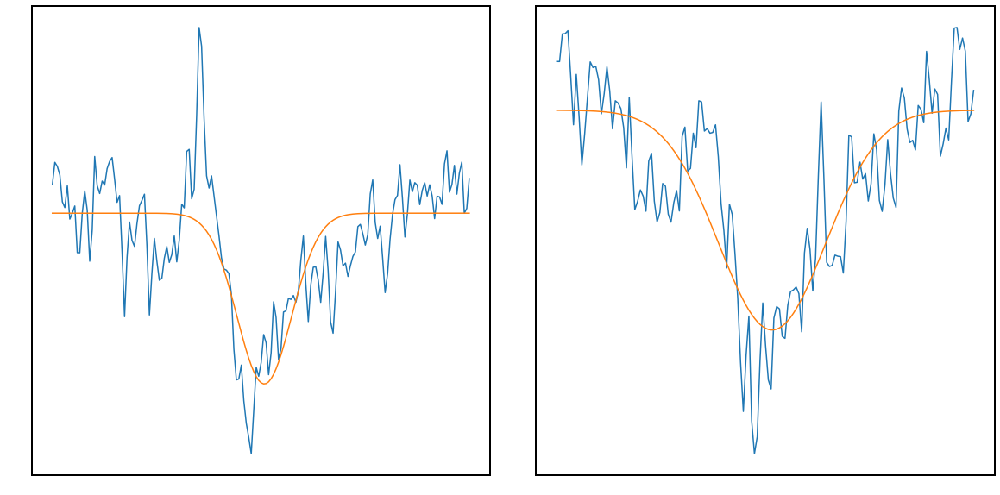

Parameters([('ampB', <Parameter 'ampB', value=-0.14041059011477383 +/- 0.0113, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.817329503642132 +/- 1.38e-05, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=7.688659117985885e-08 +/- 1.51e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5506750734881894 +/- 0.00378, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.17071831895533512 +/- 0.00926, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=2.963041689744146e-07 +/- 4.35e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7651229931296731 +/- 0.00568, bounds=[-inf:inf]>)])


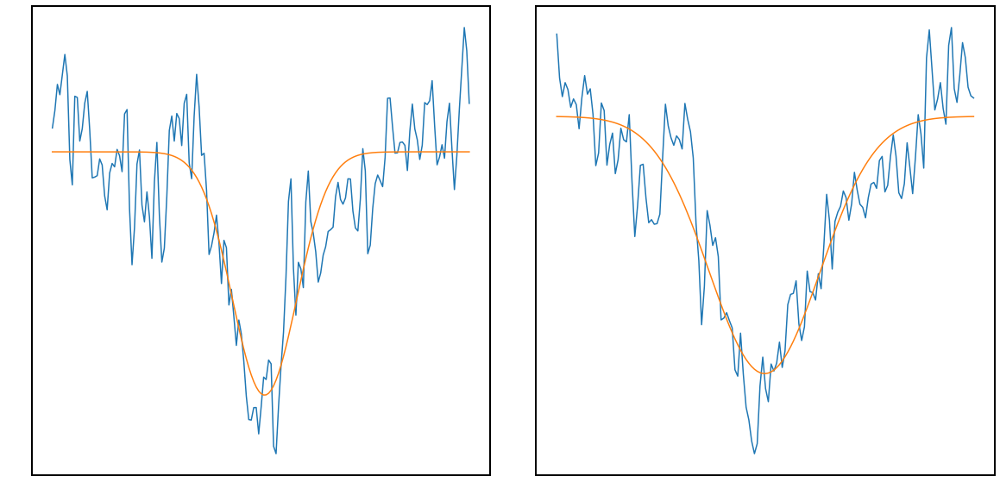

Parameters([('ampB', <Parameter 'ampB', value=-0.16975230536409286 +/- 0.00946, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8172958493596147 +/- 1.04e-05, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=1.0651599590062843e-07 +/- 1.46e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5385603994889739 +/- 0.00356, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.2246863270448686 +/- 0.00825, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=3.1567544730979873e-07 +/- 3.17e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7675714170421573 +/- 0.00527, bounds=[-inf:inf]>)])


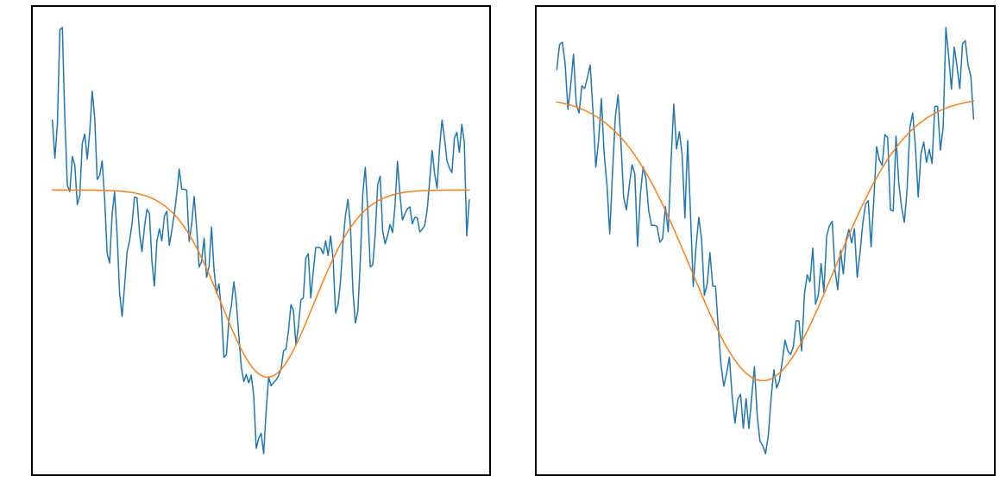

Parameters([('ampB', <Parameter 'ampB', value=-0.14212301802887495 +/- 0.00797, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.817281472947931 +/- 1.28e-05, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=2.219008249563814e-07 +/- 3.24e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5332974140897041 +/- 0.00416, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.22649554364181887 +/- 0.00856, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=5.335199957174174e-07 +/- 5.94e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7806003103403567 +/- 0.00776, bounds=[-inf:inf]>)])


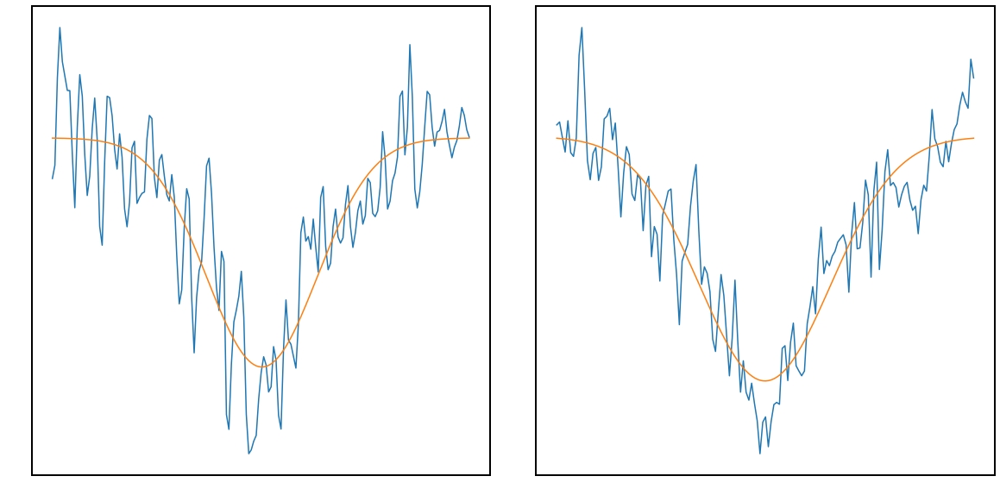

Parameters([('ampB', <Parameter 'ampB', value=-0.15079147636911944 +/- 0.0071, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.817258537038172 +/- 1.2e-05, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=3.1743661158401085e-07 +/- 4.09e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.537565772060711 +/- 0.00456, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.21776556959209367 +/- 0.00759, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=4.4745303921036287e-07 +/- 4.52e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7616359500376507 +/- 0.00612, bounds=[-inf:inf]>)])


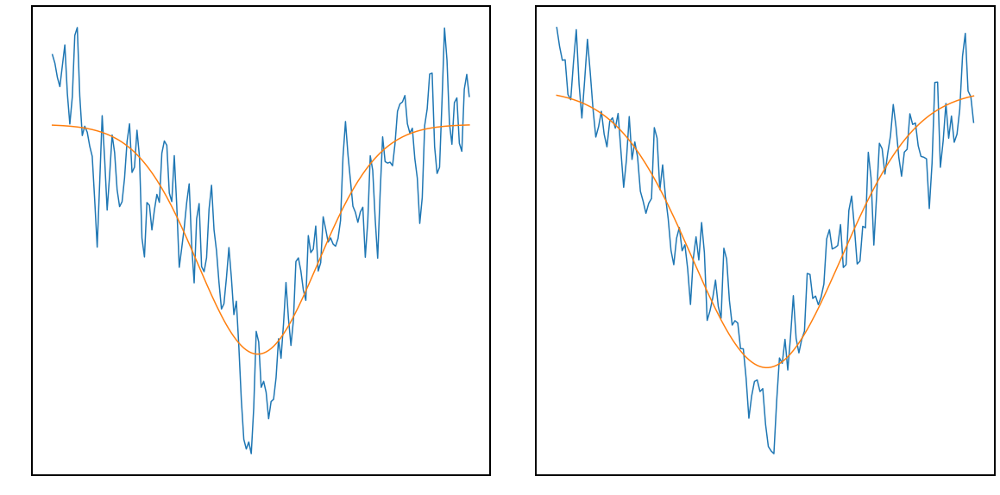

Parameters([('ampB', <Parameter 'ampB', value=-0.1561476700654158 +/- 0.00677, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.81721078060382 +/- 1.11e-05, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=3.7219338706502434e-07 +/- 4.54e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5383777019309334 +/- 0.00482, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.24812501449034588 +/- 0.00793, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=5.725363861291322e-07 +/- 5.39e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.78719672114754 +/- 0.00749, bounds=[-inf:inf]>)])


In [3]:
def fit_function(params, x2=None, x3=None, dat2=None, dat3=None):
    #1 is alpha 6562.801
    #4861.363 be -0.13033118436
    #ga 4340.472
    model2 = gaussian(x2, params['ampB'], params['cen']-0.13033118436, params['widB'], params['offB']) #beta
    model3 = gaussian(x3, params['ampG'], params['cen']-0.17955227662, params['widG'], params['offG'])
    resid2 = dat2 - model2
    resid3 = dat3 - model3
    return np.concatenate((resid2, resid3))



path = '/home/nwal/Desktop/binaries/EPIC212/'
fluxes = []
wavels = []
count = 0
with open(path+'tar') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        wvl, flx = pyasl.read1dFitsSpec(line)
        wvl = 10*wvl
        flx = flx/np.median(flx)
        fluxes.append(flx)
        wavels.append(np.log10(wvl))
        count = count+1
path = '/home/nwal/Desktop/binaries/EPIC212/'
dates2 = []
with open(path+'tar') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        hdul = fits.open(line)
        dates2.append(hdul[0].header['MJD-OBS'])
        hdul.close()
        
count = 0
wavelsAng = np.array(wavels)


offset = 0.6
ampl = -0.2

params = Parameters()
params.add('ampB', value = ampl)
params.add('cen', value=3.81717, min=3.8168)
params.add('widB', value=0.0000005)
params.add('offB', value=offset)
params.add('ampG', value = -0.4)
params.add('widG', value=0.0000005)
params.add('offG', value=0.8)





globalOff = []
for el in fluxes:
    #beta
    mod = Model(gaussian)
    indexSt = find_nearest(wavelsAng[count], 3.6865)
    indexFi = find_nearest(wavelsAng[count], 3.6873)
    fluxIn = fluxes[count][indexSt:indexFi+1]
    pixels = wavelsAng[count][indexSt:indexFi+1]
    pars = mod.make_params(amp=ampl,cen=3.6870,wid=0.0000005,off=offset)
    result = mod.fit(fluxIn,pars,x=pixels)
    cenEst = result.params['cen'].value
    indexSt = find_nearest(wavelsAng[count], cenEst-0.0015)
    indexFi = find_nearest(wavelsAng[count], cenEst+0.0015)
    fluxIn = fluxes[count][indexSt:indexFi+1]
    pixels = wavelsAng[count][indexSt:indexFi+1]
    x2Final = pixels
    dat2Final = fluxIn
    #gamma
    indexSt = find_nearest(wavelsAng[count], np.log10(4335))
    indexFi = find_nearest(wavelsAng[count], np.log10(4345))
    fluxIn = fluxes[count][indexSt:indexFi+1]
    pixels = wavelsAng[count][indexSt:indexFi+1]
    
    
    pars = mod.make_params(amp=-0.2,cen=np.log10(4340),wid=0.0000005,off=0.8)
    if count == 4:
        pars.add('cen', value=np.log10(4340), min=np.log10(4331), max=np.log10(4349))
    result = mod.fit(fluxIn,pars,x=pixels)
    cenEst = result.params['cen'].value
    indexSt = find_nearest(wavelsAng[count], cenEst-0.0015)
    indexFi = find_nearest(wavelsAng[count], cenEst+0.0015)
    fluxIn = fluxes[count][indexSt:indexFi+1]
    pixels = wavelsAng[count][indexSt:indexFi+1]
    
    x3Final = pixels
    dat3Final = fluxIn
    out = minimize(fit_function, params, args=(x2Final, x3Final, dat2Final, dat3Final))
    globalOff.append(out.params['cen'].value)
    count = count+1

    rc('axes', linewidth=2)

    fig, axs = plt.subplots(1, 2,
                        gridspec_kw={'hspace': 0.0, 'wspace': 0.1}, figsize=(20,10))
    axs[0].plot(x2Final,dat2Final)
    axs[0].plot(x2Final, gaussian(x2Final, out.params['ampB'], out.params['cen']-0.13033118436, out.params['widB'], out.params['offB'])) #beta
    axs[1].plot(x3Final,dat3Final)
    axs[1].plot(x3Final, gaussian(x3Final, out.params['ampG'], out.params['cen']-0.17955227662, out.params['widG'], out.params['offG'])) 
    plt.show()
    print(out.params)
    print('=========================================')
    #errorsTwo.append(out.params['offsetx'].stderr)
shiftsCen4 = globalOff

In [4]:
esovlt = EarthLocation.from_geodetic(lat=-24.6275*u.deg, lon=-70.4044*u.deg, height=2635*u.m)
sc = SkyCoord("22:03:40.6045130757 -12:15:11.945244099", frame=ICRS, unit=(u.hourangle, u.deg))
baryCorr = []
for el in dates2:
    barycorr = sc.radial_velocity_correction(obstime=Time(el, format='mjd'), location=esovlt)  
    baryCorr.append(barycorr.to(u.km/u.s).value)
print(baryCorr)

[-5.29250172237348, -5.3050613358614, -5.317470620786601, -5.329694870890413, -5.341754858331724, -5.353622701863784, -5.365301259620092, -5.376787861020511, -5.388062823446397, -5.399132142980391]


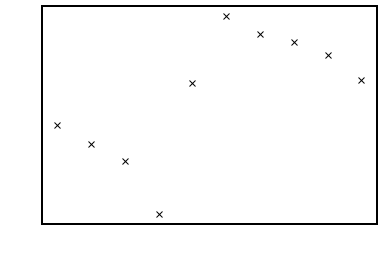

In [5]:
offsetsAlpha = 10**np.array(shiftsCen4)

offsetsAlphaS = offsetsAlpha

halpharest = 6562.801 #air
offsetsAlphaS = (offsetsAlphaS - halpharest)/halpharest
offsetsAlphaS = (offsetsAlphaS)*(299792458/1000)
velocityOGLong = offsetsAlphaS
offsetsAlphaS = offsetsAlphaS + baryCorr

plt.plot(dates2, offsetsAlphaS,'kx')


datesLong = dates2
velocityLong = offsetsAlphaS
barycorrLong = baryCorr

Name     Value      Min      Max   Stderr     Vary     Expr Brute_Step
c    0.3386     -inf      inf   0.6439     True     None     None


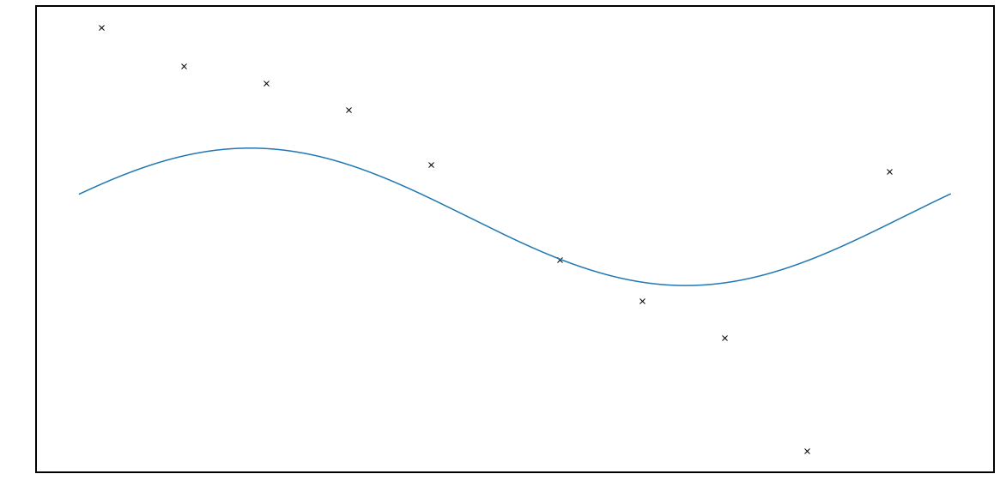

[ 21.89318269  -2.78907519 -24.85140776 -92.18178599  74.64999315
 160.54873015 137.29362415 127.35357633 111.50310539  78.51484135]


In [6]:
foldFreq = 0.047369569

def sineModelFixed(x,c):
    return 41*np.sin(2*np.pi*x+c)+47.5

mod = Model(sineModelFixed)
pars = mod.make_params(c=0)
#UVESFold = foldMeth(UVEST,0.41574154920793316)




phases = foldMeth(np.array(dates2), foldFreq)
offsetsAlpha = np.array(velocityLong)
#sortIndi = np.argsort(phases)
#phases = phases[sortIndi]
#offsetsAlphaS = offsetsAlpha[sortIndi]

plt.figure(figsize=(20,10))
plt.plot(phases,offsetsAlpha, 'kx')



result = mod.fit(offsetsAlpha,pars,x=phases)
TDummy = np.linspace(0,1,1000)
ypointsModel = sineModelFixed(TDummy,result.params['c'].value)
result.params.pretty_print()
plt.plot(TDummy,ypointsModel)

#plt.savefig('GD1400HAlphaSGUn.pdf')
plt.show()

print(offsetsAlpha)

In [7]:
ypointsModel = sineModelFixed(phases,result.params['c'].value)

for el in ypointsModel:
    print(el)

22.327907932231483
8.510012977074602
8.1115755654452
21.256185536694318
43.43833270211111
67.00166335190882
83.86488244554508
88.22817764897138
78.58732221068632
58.24673618525022


In [8]:
#shifts from H beta/gamma
path = '/home/nwal/Desktop/binaries/EPIC212/'
fluxes = []
wavels = []
count = 0
with open(path+'tar') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        wvl, flx = pyasl.read1dFitsSpec(line)
        wvl = 10*wvl
        flx = flx/np.median(flx)
        fluxes.append(flx)
        wavels.append(np.log10(wvl))
        count = count+1
path = '/home/nwal/Desktop/binaries/EPIC212/'
dates2 = []
with open(path+'tar') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        hdul = fits.open(line)
        dates2.append(hdul[0].header['MJD-OBS'])
        hdul.close()

count=0
wavelsAng = np.array(wavels)



shift = np.array([0.399895366061352,0.200018184691017,0.194429170589895,0.384917186624055,0.70625060292094,1.04757836559181,1.29189745636338,1.35523666795209,1.2158171351658,0.921481184808097])
adjWvl = []
count = 0
for el in wavels:
    
    newW = 10**el+shift[count]
    adjWvl.append(newW)
    count = count + 1
count = 0

for el in adjWvl:
    nameFile = str(count)+'ShiftedEpic.fits'
    pyasl.write1dFitsSpec(nameFile, fluxes[count], wvl=el, clobber=True)
    count = count +1


# write out the recipe with spreadsheet and dispcor

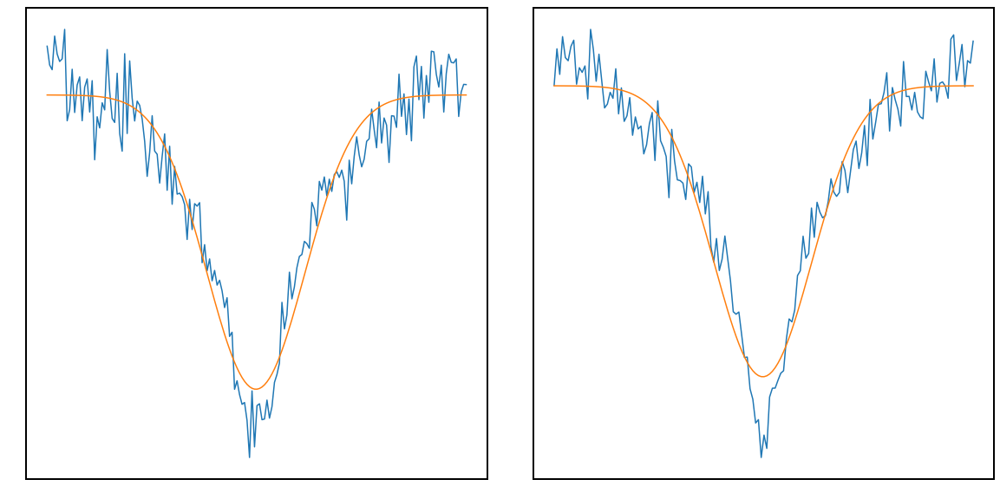

Parameters([('ampB', <Parameter 'ampB', value=-0.3366517482042643 +/- 0.00845, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8170135993991847 +/- 6.11e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=2.45067297675518e-07 +/- 1.62e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.8013033982517941 +/- 0.00465, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.4129156903239917 +/- 0.00894, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=2.454618567959742e-07 +/- 1.4e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.914956717471738 +/- 0.00492, bounds=[-inf:inf]>)])


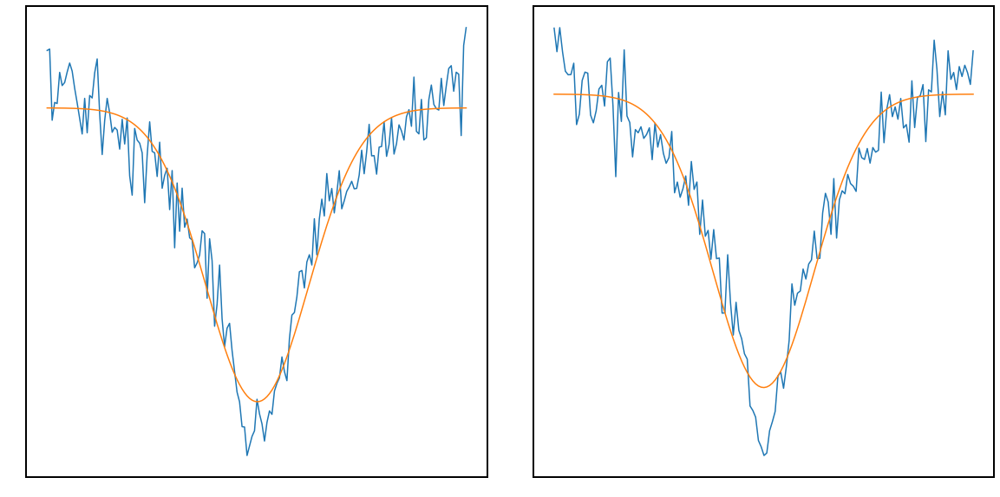

Parameters([('ampB', <Parameter 'ampB', value=-0.3395317291048488 +/- 0.00832, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8170592724681125 +/- 6.26e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=2.7055942818627647e-07 +/- 1.77e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.804778773982527 +/- 0.00484, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.4052400587759838 +/- 0.00884, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=2.6156305523945615e-07 +/- 1.52e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.9210730380108892 +/- 0.00504, bounds=[-inf:inf]>)])


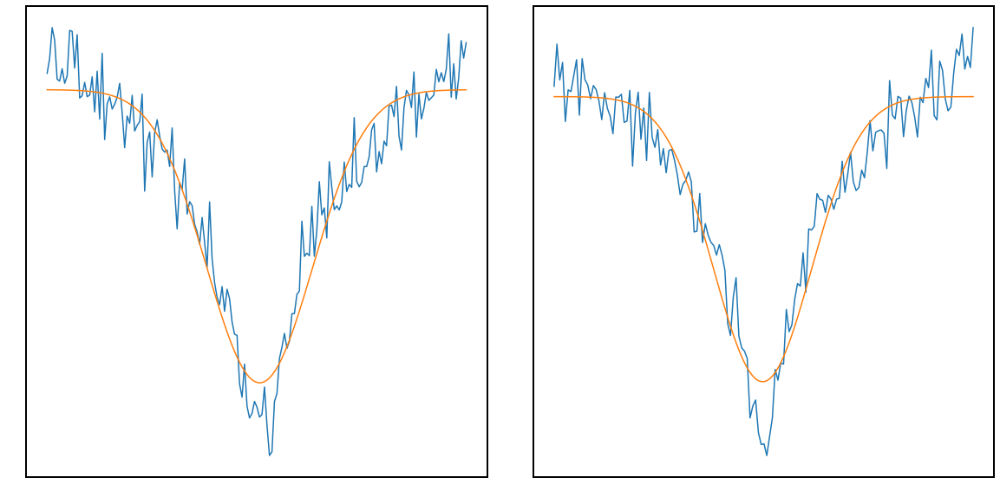

Parameters([('ampB', <Parameter 'ampB', value=-0.3307647876112921 +/- 0.00843, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.817112141542699 +/- 6.42e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=2.8737827637960683e-07 +/- 1.97e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.8031113383606641 +/- 0.00508, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.4072860517524585 +/- 0.00911, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=2.4494073739129163e-07 +/- 1.44e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.9118830517083346 +/- 0.00501, bounds=[-inf:inf]>)])


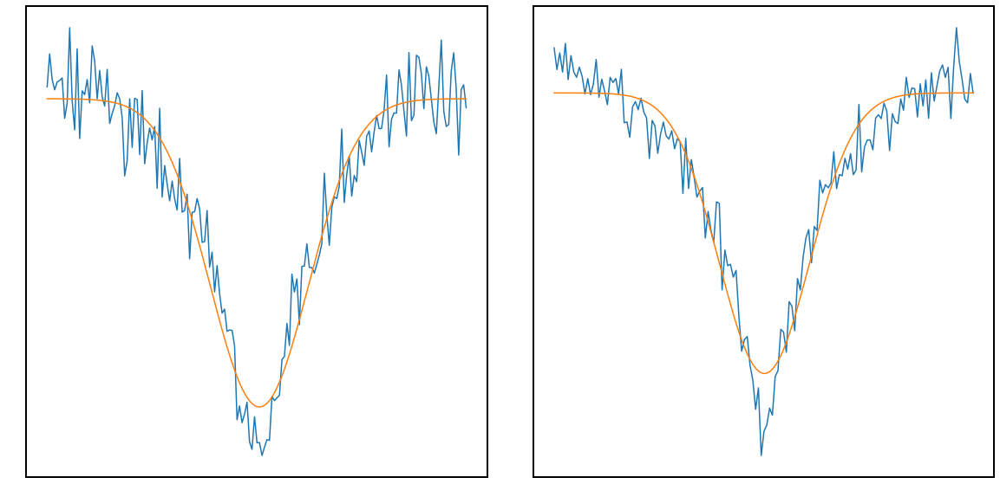

Parameters([('ampB', <Parameter 'ampB', value=-0.338252947394508 +/- 0.00819, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8171450879918103 +/- 5.69e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=2.471724913159145e-07 +/- 1.58e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.8027210124930259 +/- 0.00453, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.42327147853620023 +/- 0.00891, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=2.0867790524490376e-07 +/- 1.14e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.9087780114429213 +/- 0.0045, bounds=[-inf:inf]>)])


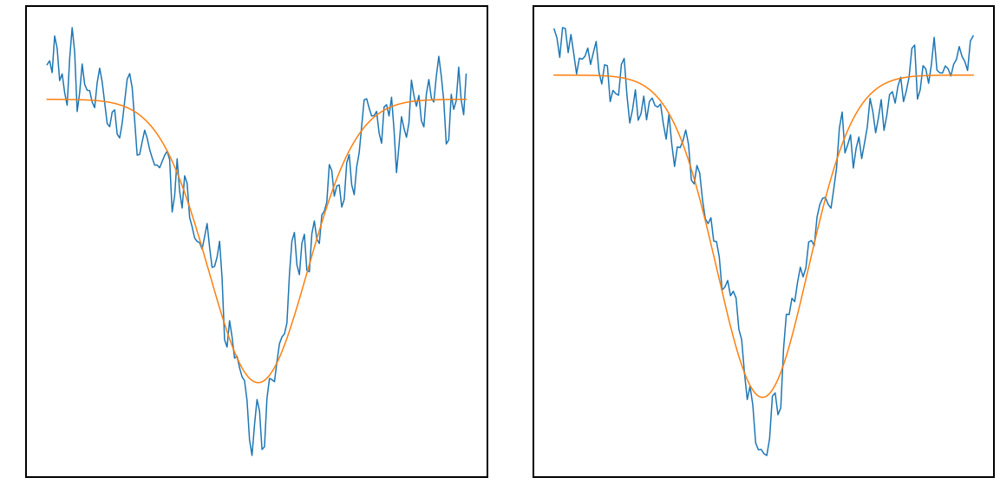

Parameters([('ampB', <Parameter 'ampB', value=-0.3493441743308375 +/- 0.00834, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8170114199686926 +/- 5.37e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=2.495412066328802e-07 +/- 1.57e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.8141078690535043 +/- 0.00463, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.47372743669886 +/- 0.00907, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=2.1127998180163125e-07 +/- 1.05e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.9849860067787019 +/- 0.00461, bounds=[-inf:inf]>)])


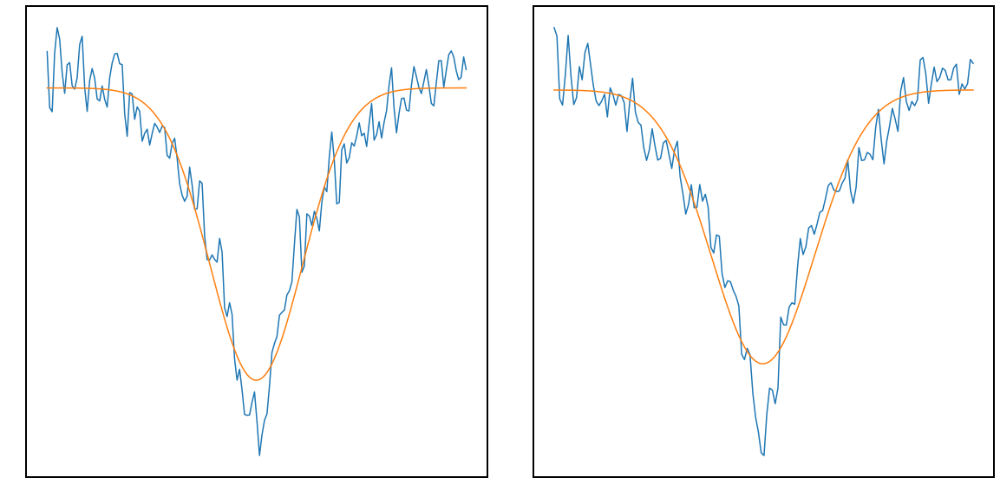

Parameters([('ampB', <Parameter 'ampB', value=-0.3787450298292763 +/- 0.0101, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.817033510255626 +/- 6.23e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=2.190785949928697e-07 +/- 1.52e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.856573066856525 +/- 0.00523, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.4853147218561501 +/- 0.0103, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=2.727159824487387e-07 +/- 1.55e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=1.0587859105160924 +/- 0.00603, bounds=[-inf:inf]>)])


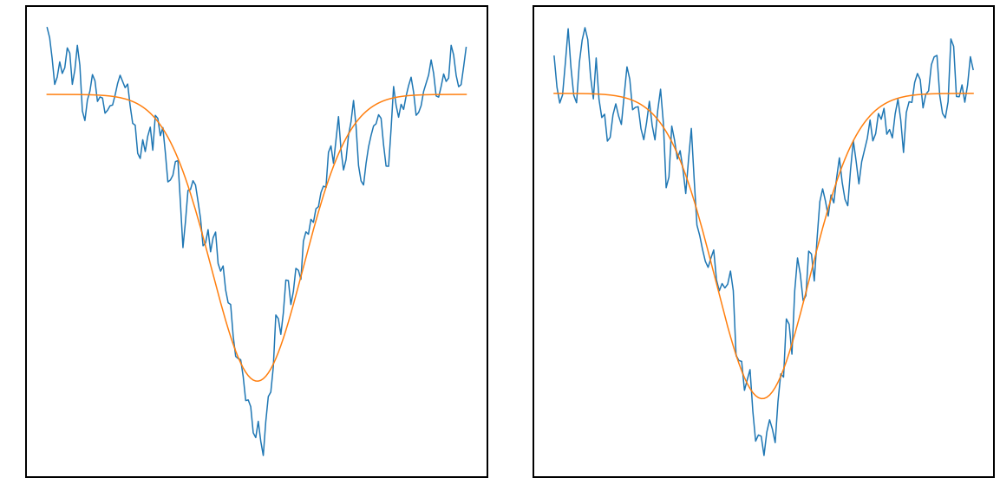

Parameters([('ampB', <Parameter 'ampB', value=-0.3540488597790992 +/- 0.009, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8170496950836044 +/- 5.81e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=2.1282834522972435e-07 +/- 1.4e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.8030335865469601 +/- 0.00462, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.4445507242700542 +/- 0.0094, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=2.283538158477011e-07 +/- 1.26e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.9699390942953185 +/- 0.00498, bounds=[-inf:inf]>)])


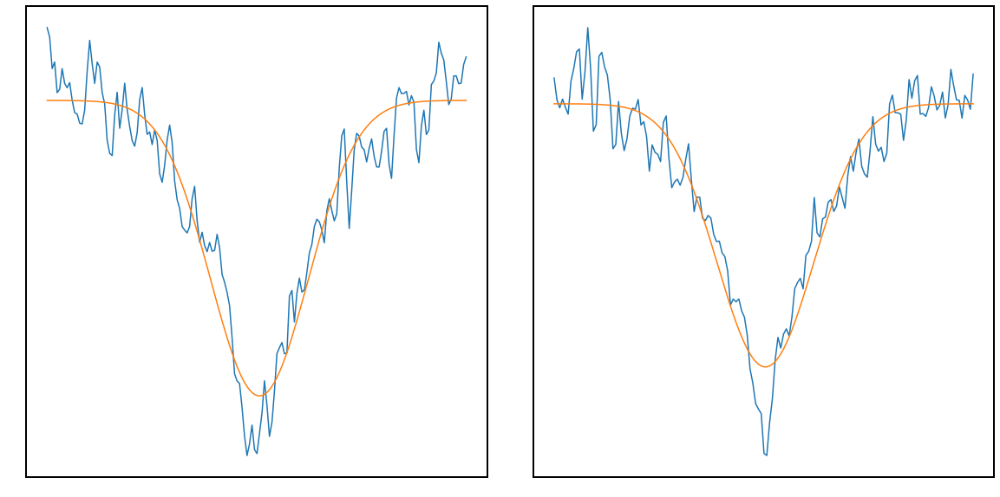

Parameters([('ampB', <Parameter 'ampB', value=-0.3663928849180012 +/- 0.00983, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.817092038441592 +/- 6.45e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=2.444774672307159e-07 +/- 1.73e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.8585095238460277 +/- 0.0054, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.4546702962377193 +/- 0.0104, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=2.3797228108513035e-07 +/- 1.43e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=1.0061803784189505 +/- 0.00565, bounds=[-inf:inf]>)])


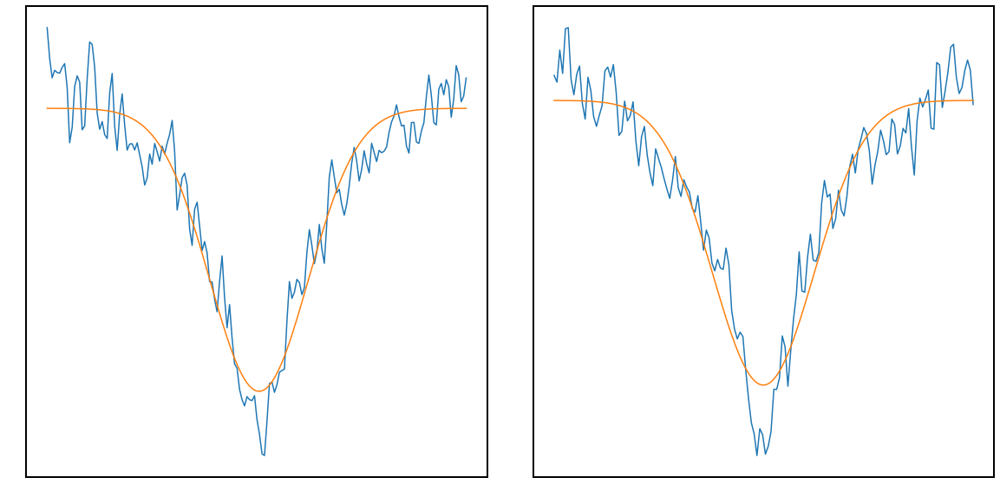

Parameters([('ampB', <Parameter 'ampB', value=-0.37056801148905316 +/- 0.00974, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8171072747765287 +/- 6.64e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=2.489038568733026e-07 +/- 1.73e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.8381638062096438 +/- 0.0054, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.4351856715463291 +/- 0.0102, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=2.622095264648678e-07 +/- 1.64e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.979742791593444 +/- 0.00589, bounds=[-inf:inf]>)])


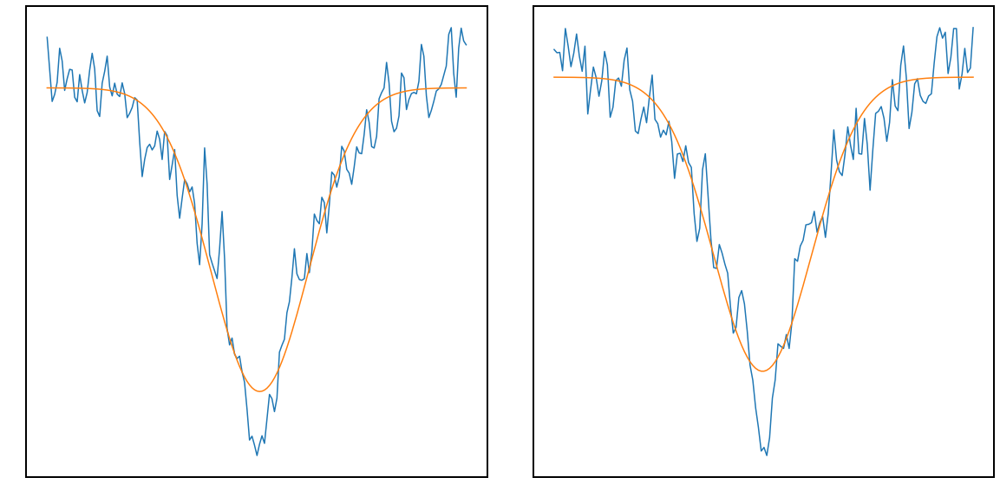

Parameters([('ampB', <Parameter 'ampB', value=-0.37180857524709543 +/- 0.00953, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8171119869078174 +/- 6.38e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=2.422142987472245e-07 +/- 1.63e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.8258755463997611 +/- 0.00521, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.43529166285512527 +/- 0.0101, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=2.4463227719014147e-07 +/- 1.49e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.9687947715826265 +/- 0.00553, bounds=[-inf:inf]>)])


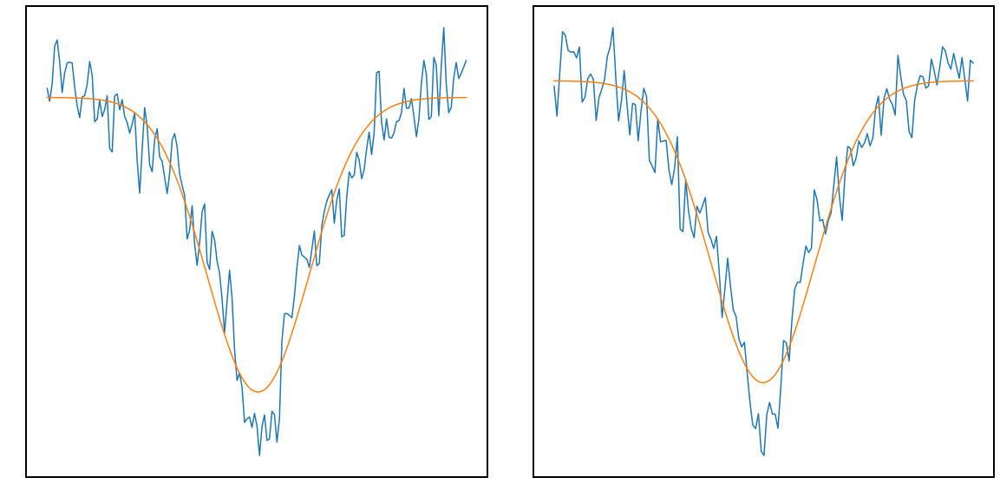

Parameters([('ampB', <Parameter 'ampB', value=-0.34081553311964646 +/- 0.00895, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8171355587852727 +/- 6.42e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=2.6468749236320723e-07 +/- 1.85e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.8182691147131872 +/- 0.00514, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.4407015625068076 +/- 0.00942, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=2.759403941213523e-07 +/- 1.58e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.9744596127755297 +/- 0.00554, bounds=[-inf:inf]>)])


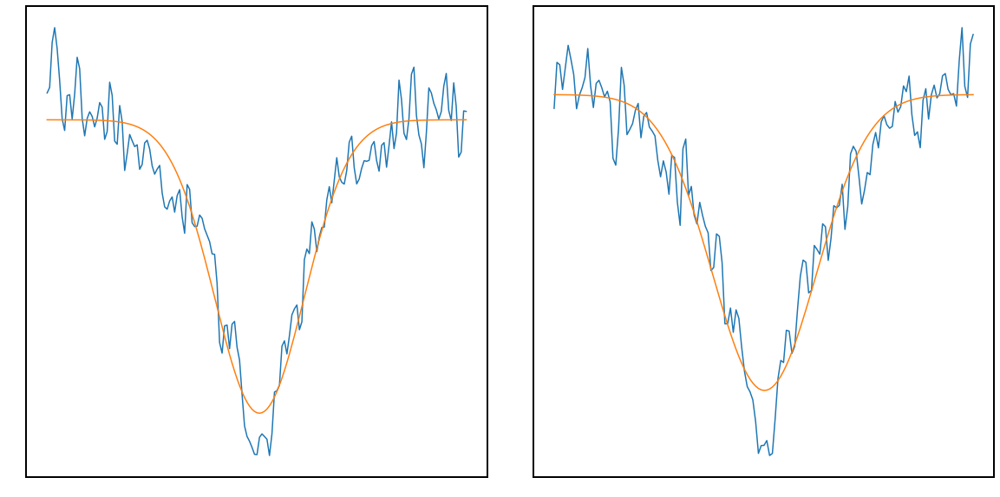

Parameters([('ampB', <Parameter 'ampB', value=-0.3560892353337284 +/- 0.0093, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8171454257758395 +/- 6.05e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=2.0501776010489724e-07 +/- 1.38e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.8027467984102473 +/- 0.00466, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.44926129019626354 +/- 0.0094, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=2.7668661258259235e-07 +/- 1.55e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.9730215415194816 +/- 0.00553, bounds=[-inf:inf]>)])


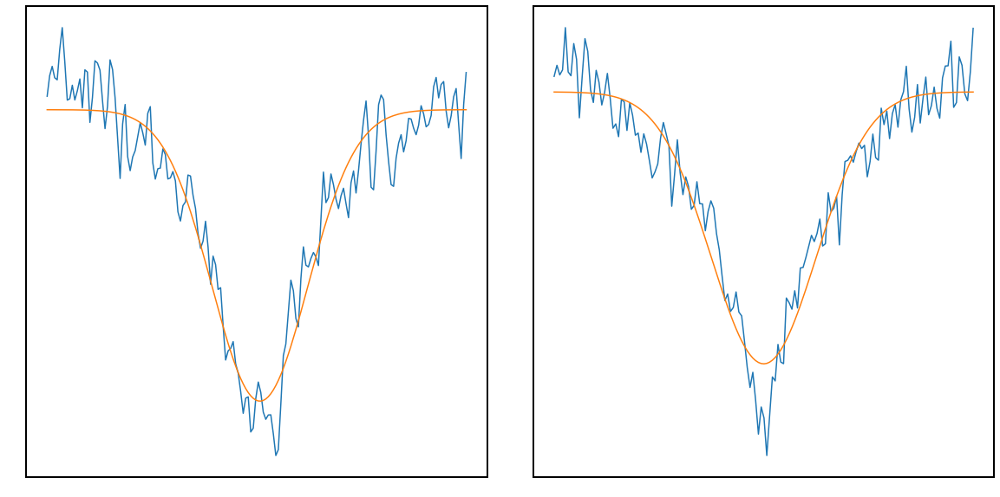

Parameters([('ampB', <Parameter 'ampB', value=-0.3528758327820874 +/- 0.00923, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.817140138434901 +/- 6.52e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=2.3258590999882107e-07 +/- 1.59e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.8145962783082247 +/- 0.00497, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.4178211039587605 +/- 0.00948, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=2.8405934513339157e-07 +/- 1.73e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.9544278910424525 +/- 0.00567, bounds=[-inf:inf]>)])


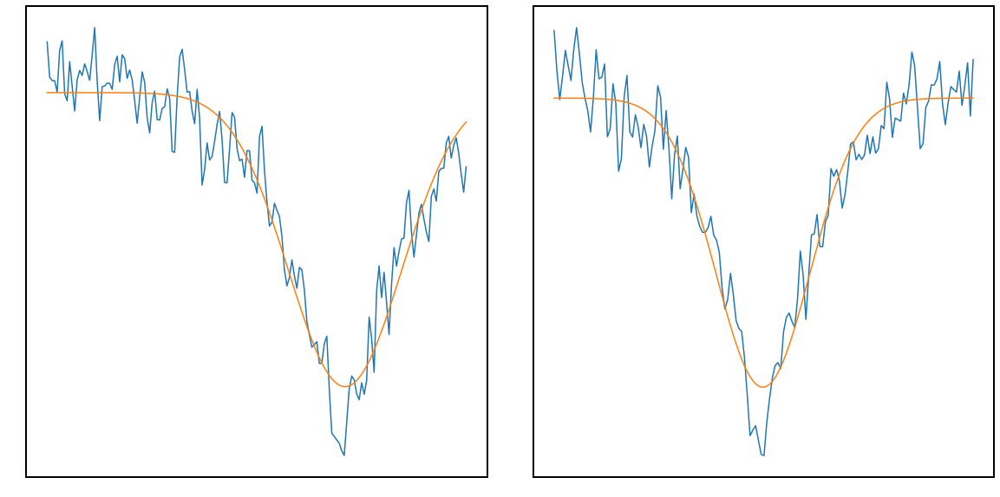

Parameters([('ampB', <Parameter 'ampB', value=-0.40170364140380477 +/- 0.00971, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8171339096901216 +/- 6.45e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=3.2770669895280767e-07 +/- 2.03e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.8872274640139576 +/- 0.00567, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.4610844480856923 +/- 0.0108, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=2.2577161052933707e-07 +/- 1.37e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.999142830651068 +/- 0.00566, bounds=[-inf:inf]>)])


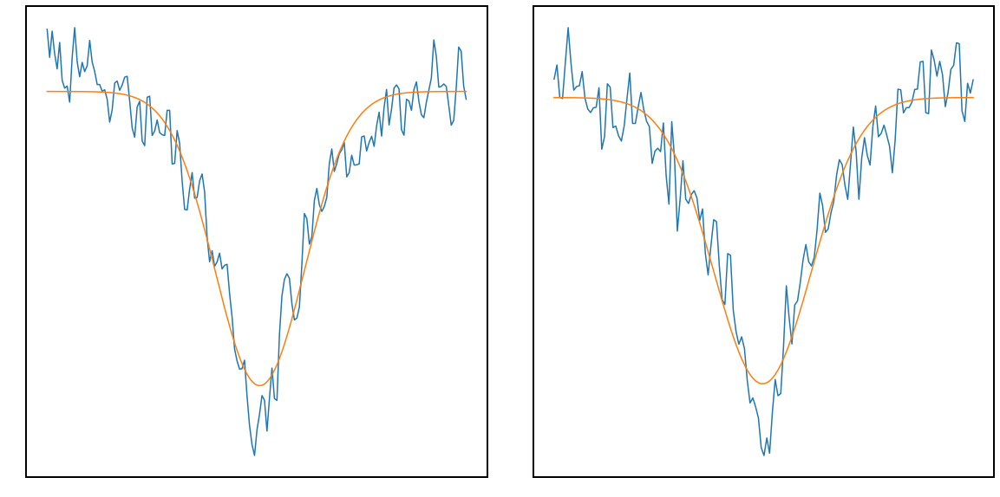

Parameters([('ampB', <Parameter 'ampB', value=-0.3672721662930836 +/- 0.00967, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.817111900617452 +/- 6.13e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=2.060844898599762e-07 +/- 1.4e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.8058709372441349 +/- 0.00486, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.4475909684300077 +/- 0.00994, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=2.4567528070259005e-07 +/- 1.44e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.9692498255311816 +/- 0.00547, bounds=[-inf:inf]>)])


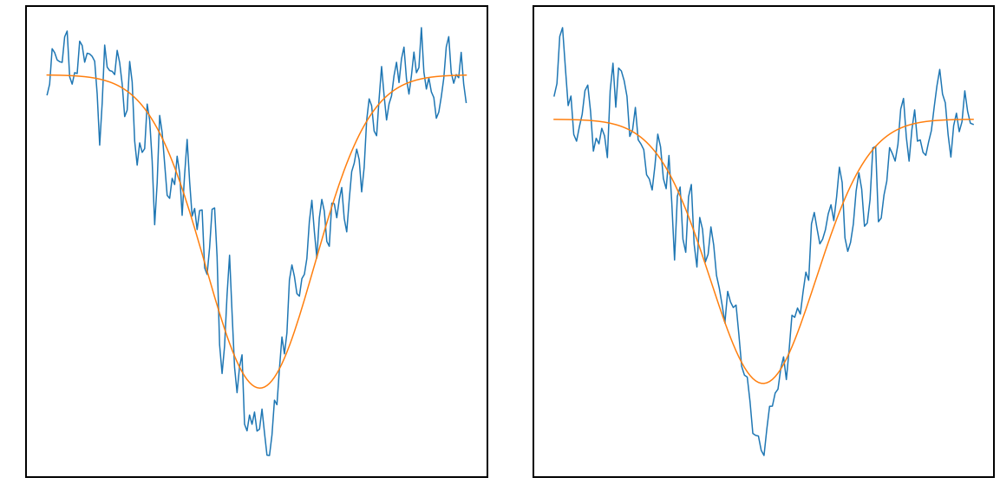

Parameters([('ampB', <Parameter 'ampB', value=-0.34222095291111393 +/- 0.0105, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8170955657543066 +/- 7.83e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=3.063254537327681e-07 +/- 2.55e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.8155741019183731 +/- 0.00657, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.436852234409188 +/- 0.0112, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=2.8546381888608174e-07 +/- 1.97e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.976381929816458 +/- 0.00671, bounds=[-inf:inf]>)])


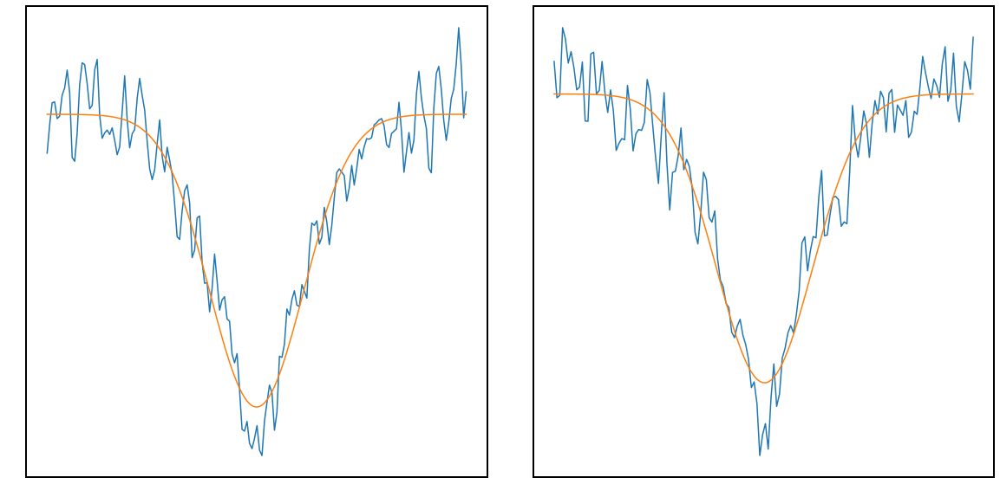

Parameters([('ampB', <Parameter 'ampB', value=-0.36396514928326035 +/- 0.00942, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8170359498009736 +/- 6.13e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=2.255230269421325e-07 +/- 1.52e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.8220019815217202 +/- 0.00496, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.4437590373456757 +/- 0.00994, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=2.3178951840019529e-07 +/- 1.36e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.9644442500464024 +/- 0.00534, bounds=[-inf:inf]>)])


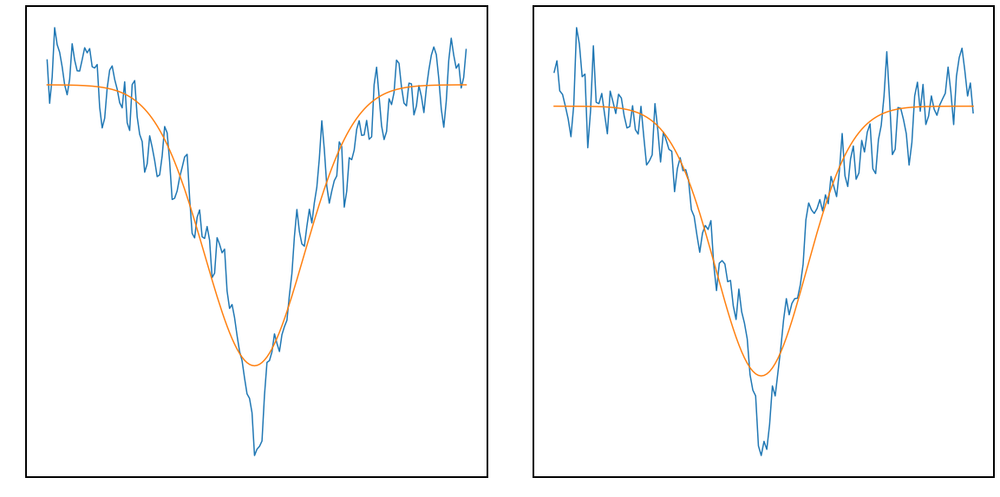

Parameters([('ampB', <Parameter 'ampB', value=-0.3746485351866904 +/- 0.0107, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.817002586589536 +/- 6.68e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=2.5277047363438107e-07 +/- 1.9e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.8672292303126659 +/- 0.00597, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.47575083554884023 +/- 0.0116, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=2.1069433244721474e-07 +/- 1.33e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=1.0173926148409689 +/- 0.0059, bounds=[-inf:inf]>)])


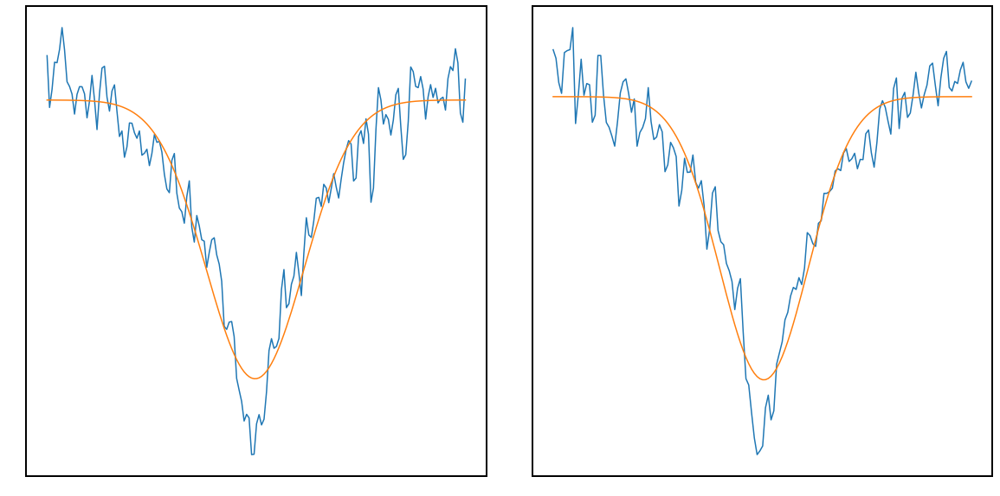

Parameters([('ampB', <Parameter 'ampB', value=-0.34979414869085435 +/- 0.00959, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.817010591493363 +/- 6.22e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=2.459919021009795e-07 +/- 1.78e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.8213051116399883 +/- 0.00529, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.4597628362193712 +/- 0.0105, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=2.0151065391190841e-07 +/- 1.19e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.9731687263880346 +/- 0.00521, bounds=[-inf:inf]>)])


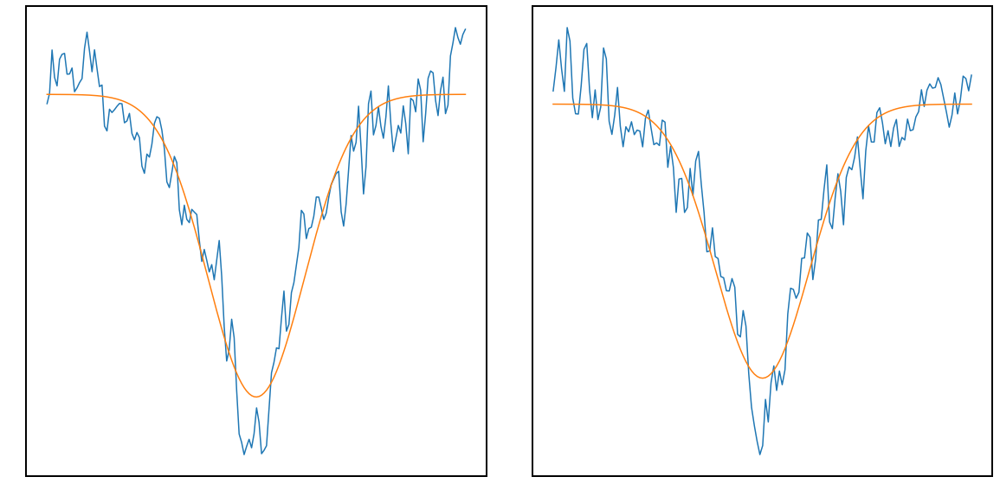

Parameters([('ampB', <Parameter 'ampB', value=-0.35482243637919814 +/- 0.0101, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8170007367286303 +/- 6.58e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=2.3986362625950443e-07 +/- 1.79e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.8163135052735583 +/- 0.00547, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.4575419776742178 +/- 0.0107, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=2.2716842690471705e-07 +/- 1.39e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.9798524935151529 +/- 0.00566, bounds=[-inf:inf]>)])


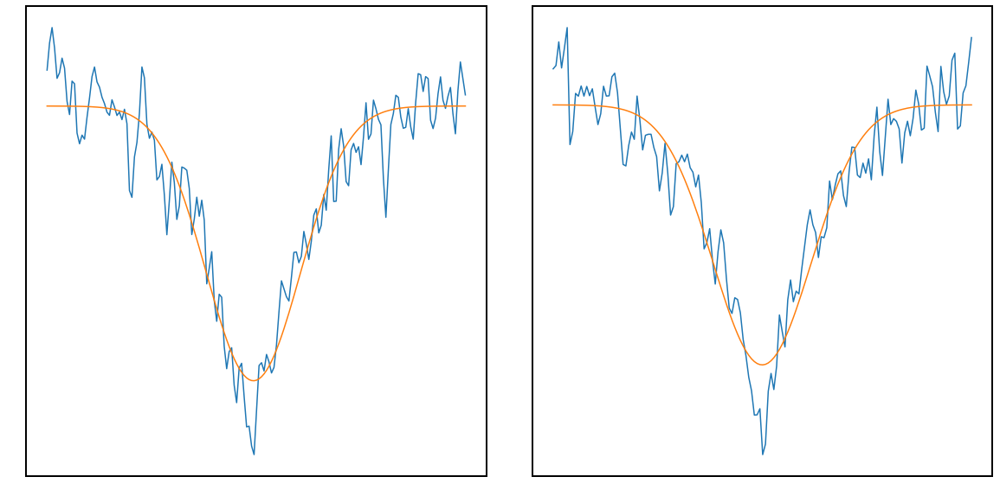

Parameters([('ampB', <Parameter 'ampB', value=-0.3659911076551559 +/- 0.0108, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8169986543203507 +/- 7.14e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=2.2861240705054476e-07 +/- 1.76e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.8177758286431941 +/- 0.00573, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.4404005562849298 +/- 0.0113, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=2.484721288180291e-07 +/- 1.68e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.9671819292528157 +/- 0.00625, bounds=[-inf:inf]>)])


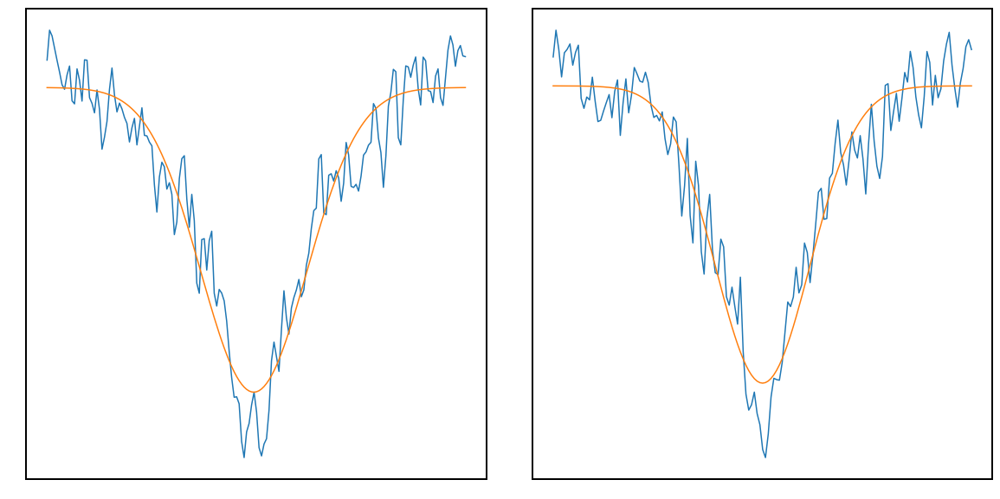

Parameters([('ampB', <Parameter 'ampB', value=-0.3544809165326381 +/- 0.00946, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8170012823444965 +/- 6.51e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=2.875822785531057e-07 +/- 2.07e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.8357430258864809 +/- 0.00571, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.45293532357503996 +/- 0.0103, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=2.2991741834520562e-07 +/- 1.37e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.9830040194780726 +/- 0.00549, bounds=[-inf:inf]>)])


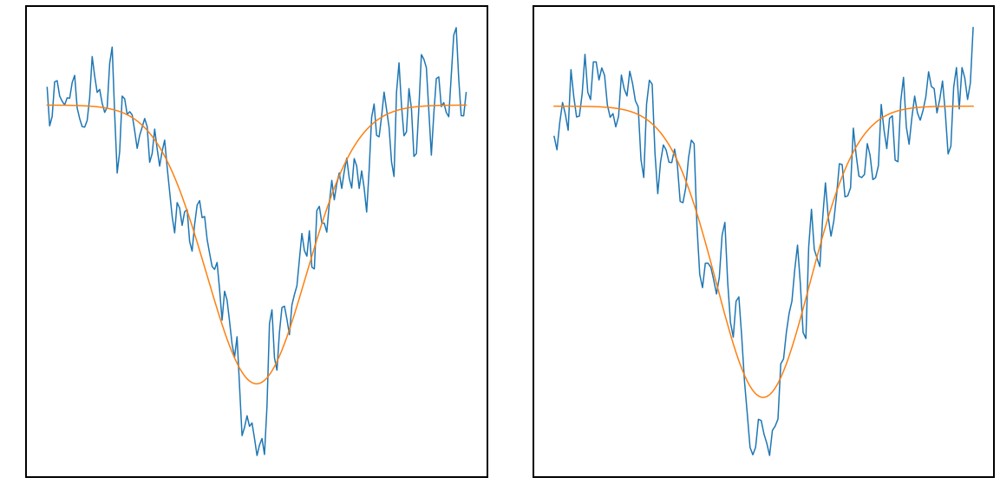

Parameters([('ampB', <Parameter 'ampB', value=-0.3719285731291679 +/- 0.011, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8170359499343647 +/- 7.06e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=2.556341381253682e-07 +/- 2e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.8524046374512921 +/- 0.0062, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.4703016775190053 +/- 0.0119, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=2.2545525706246639e-07 +/- 1.49e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=1.0059502452204283 +/- 0.00625, bounds=[-inf:inf]>)])


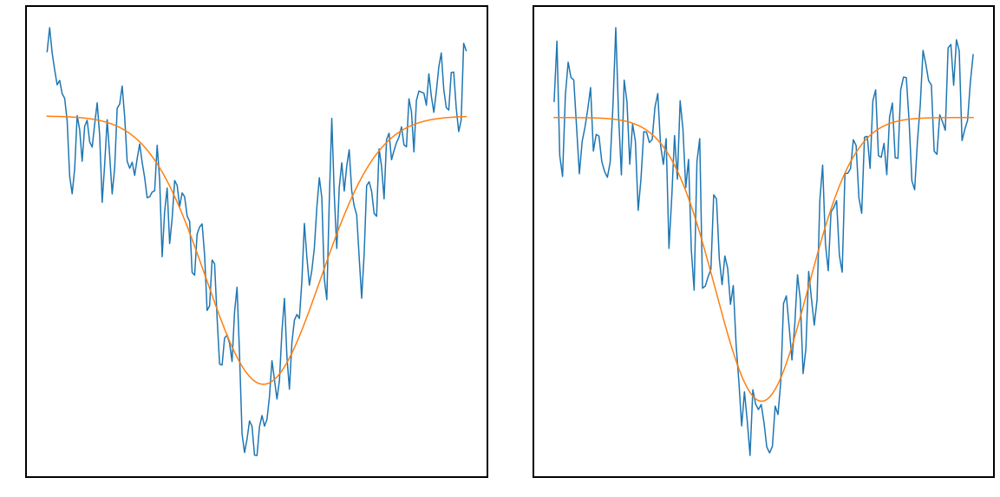

Parameters([('ampB', <Parameter 'ampB', value=-0.38263740427949516 +/- 0.0142, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8170849718173088 +/- 9.73e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=3.358530561764767e-07 +/- 3.44e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.8678615886324648 +/- 0.00942, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.44867071102270867 +/- 0.0158, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=2.1829561842465957e-07 +/- 2e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.9661403157266378 +/- 0.00818, bounds=[-inf:inf]>)])


In [66]:
#NLTT5306

def fit_function(params, x2=None, x3=None, dat2=None, dat3=None):
    #1 is alpha 6562.801
    #4861.363 be -0.13033118436
    #ga 4340.472
    model2 = gaussian(x2, params['ampB'], params['cen']-0.13033118436, params['widB'], params['offB']) #beta
    model3 = gaussian(x3, params['ampG'], params['cen']-0.17955227662, params['widG'], params['offG'])
    resid2 = dat2 - model2
    resid3 = dat3 - model3
    return np.concatenate((resid2, resid3))



path = '/home/nwal/Desktop/binaries/NLTT5306/'
fluxes = []
wavels = []
count = 0
with open(path+'files') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        wvl, flx = pyasl.read1dFitsSpec(line)
        wvl = 10*wvl
        flx = flx/np.median(flx)
        fluxes.append(flx)
        wavels.append(np.log10(wvl))
        count = count+1
    path = '/home/nwal/Desktop/binaries/NLTT5306/'
dates2 = []
with open(path+'files') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        hdul = fits.open(line)
        dates2.append(hdul[0].header['MJD-OBS'])
        hdul.close()
        
count = 0
wavelsAng = np.array(wavels)


offset = 0.6
ampl = -0.2

params = Parameters()
params.add('ampB', value = ampl)
params.add('cen', value=3.81717, min=3.8168)
params.add('widB', value=0.0000005)
params.add('offB', value=offset)
params.add('ampG', value = -0.4)
params.add('widG', value=0.0000005)
params.add('offG', value=0.8)





globalOff = []
for el in fluxes:
    #beta
    mod = Model(gaussian)
    indexSt = find_nearest(wavelsAng[count], 3.6862)
    indexFi = find_nearest(wavelsAng[count], 3.6872)
    fluxIn = fluxes[count][indexSt:indexFi+1]
    pixels = wavelsAng[count][indexSt:indexFi+1]
    pars = mod.make_params(amp=ampl,cen=3.6867,wid=0.0000005,off=offset)
    result = mod.fit(fluxIn,pars,x=pixels)
    cenEst = result.params['cen'].value
    indexSt = find_nearest(wavelsAng[count], cenEst-0.0015)
    indexFi = find_nearest(wavelsAng[count], cenEst+0.0015)
    fluxIn = fluxes[count][indexSt:indexFi+1]
    pixels = wavelsAng[count][indexSt:indexFi+1]
    x2Final = pixels
    dat2Final = fluxIn
    #gamma
    indexSt = find_nearest(wavelsAng[count], np.log10(4335))
    indexFi = find_nearest(wavelsAng[count], np.log10(4345))
    fluxIn = fluxes[count][indexSt:indexFi+1]
    pixels = wavelsAng[count][indexSt:indexFi+1]
    
    
    pars = mod.make_params(amp=-0.2,cen=np.log10(4340),wid=0.0000005,off=0.8)
    if count == 4:
        pars.add('cen', value=np.log10(4340), min=np.log10(4331), max=np.log10(4349))
    result = mod.fit(fluxIn,pars,x=pixels)
    cenEst = result.params['cen'].value
    indexSt = find_nearest(wavelsAng[count], cenEst-0.0015)
    indexFi = find_nearest(wavelsAng[count], cenEst+0.0015)
    fluxIn = fluxes[count][indexSt:indexFi+1]
    pixels = wavelsAng[count][indexSt:indexFi+1]
    
    x3Final = pixels
    dat3Final = fluxIn
    out = minimize(fit_function, params, args=(x2Final, x3Final, dat2Final, dat3Final))
    globalOff.append(out.params['cen'].value)
    count = count+1

    rc('axes', linewidth=2)

    fig, axs = plt.subplots(1, 2,
                        gridspec_kw={'hspace': 0.0, 'wspace': 0.1}, figsize=(20,10))
    axs[0].plot(x2Final,dat2Final)
    axs[0].plot(x2Final, gaussian(x2Final, out.params['ampB'], out.params['cen']-0.13033118436, out.params['widB'], out.params['offB'])) #beta
    axs[1].plot(x3Final,dat3Final)
    axs[1].plot(x3Final, gaussian(x3Final, out.params['ampG'], out.params['cen']-0.17955227662, out.params['widG'], out.params['offG'])) 
    plt.show()
    print(out.params)
    print('=========================================')
    #errorsTwo.append(out.params['offsetx'].stderr)
shiftsCen4 = globalOff

In [67]:
esovlt = EarthLocation.from_geodetic(lat=-24.6275*u.deg, lon=-70.4044*u.deg, height=2635*u.m)
sc = SkyCoord("01:35:32.9752333724 +14:45:55.899553797", frame=ICRS, unit=(u.hourangle, u.deg))
baryCorr = []
for el in dates2:
    barycorr = sc.radial_velocity_correction(obstime=Time(el, format='mjd'), location=esovlt)  
    baryCorr.append(barycorr.to(u.km/u.s).value)
print(baryCorr)

[20.40840694507299, 20.383388586258878, 20.35897537184482, 20.334902950309957, 22.533138958091005, 22.521941050174824, 22.510940885409596, 22.49962802275952, 22.488727100982004, 22.477648819159857, 22.466795539530874, 22.455746664345114, 22.445024947857725, 22.43414295429166, 22.423459557602143, 22.412695830093647, 22.3927193999075, 22.382249434217456, 22.3720369389867, 22.36174944058408, 22.351741618759085, 22.34169284040555, 22.331909429855816, 22.322046535555977]


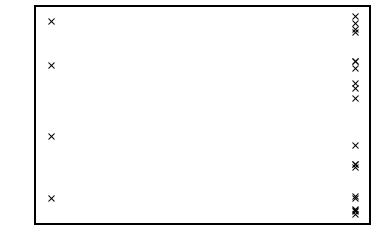

In [68]:
offsetsAlpha = 10**np.array(shiftsCen4)

offsetsAlphaS = offsetsAlpha

halpharest = 6562.801 #air
offsetsAlphaS = (offsetsAlphaS - halpharest)/halpharest
offsetsAlphaS = (offsetsAlphaS)*(299792458/1000)
velocityOGLong = offsetsAlphaS
offsetsAlphaS = offsetsAlphaS + baryCorr

plt.plot(dates2, offsetsAlphaS,'kx')


datesLong = dates2
velocityLong = offsetsAlphaS
barycorrLong = baryCorr

Name     Value      Min      Max   Stderr     Vary     Expr Brute_Step
c  -0.001191     -inf      inf  0.05705     True     None     None


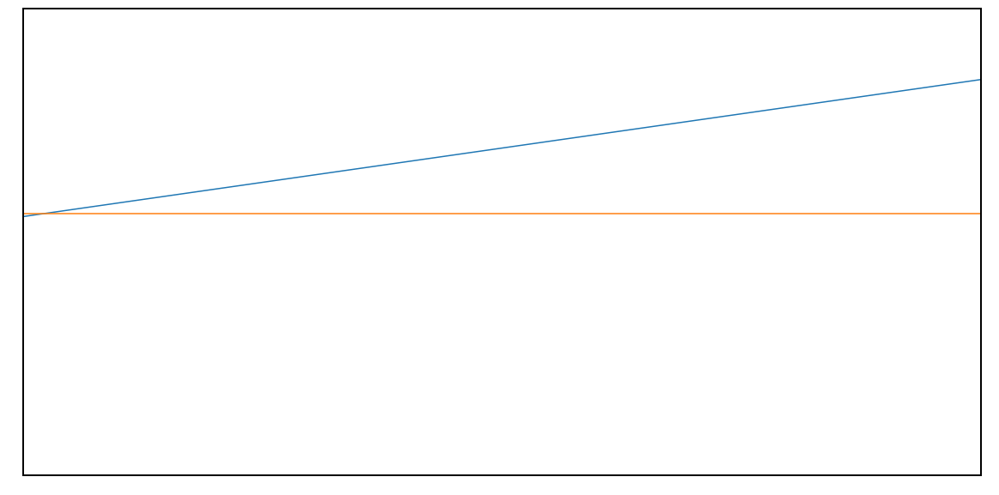

[-31.79853629  -0.29937553  36.17131243  58.89215851 -31.17799425
 -15.94266336  -4.7825402   24.43443098  34.94138856  38.18323617
  54.44528843  61.24620383  57.58519308  53.27415008  38.06947776
  26.78242005 -14.38808394 -37.42539013 -31.91088783 -38.72258729
 -40.1697803  -38.36608305 -14.44880185  19.3787836 ]


In [80]:
foldFreq = 0.07075025

def sineModelFixed(x,c):
    return 46.8*np.sin(2*np.pi*x+c)+15.6

mod = Model(sineModelFixed)
pars = mod.make_params(c=0)
#UVESFold = foldMeth(UVEST,0.41574154920793316)




phases = foldMeth(np.array(dates2)-0.0108, foldFreq)
offsetsAlpha = np.array(velocityLong)
#sortIndi = np.argsort(phases)
#phases = phases[sortIndi]
#offsetsAlphaS = offsetsAlpha[sortIndi]

plt.figure(figsize=(20,10))
plt.plot(phases,offsetsAlpha, 'kx')



result = mod.fit(offsetsAlpha,pars,x=phases)
TDummy = np.linspace(0,1,1000)
plt.xlim(0,0.01)
ypointsModel = sineModelFixed(TDummy,result.params['c'].value)
result.params.pretty_print()
plt.ylim(10,20)
plt.plot(TDummy,ypointsModel)
plt.plot([0,0.1],[15.6,15.6])
#plt.savefig('GD1400HAlphaSGUn.pdf')
plt.show()

print(offsetsAlpha)

In [81]:
phases

array([0.83210505, 0.95825329, 0.08354105, 0.20966965, 0.86030379,
       0.91509332, 0.96902063, 0.02461998, 0.07835752, 0.13316339,
       0.18707599, 0.24221562, 0.29600062, 0.35090303, 0.40514446,
       0.46017121, 0.56343018, 0.61821153, 0.67213556, 0.72698724,
       0.78090312, 0.835637  , 0.88954797, 0.94456979])

In [19]:
ypointsModel = sineModelFixed(phases,result.params['c'].value)

for el in ypointsModel:
    print(el)

-25.136834689420994
3.410719053977518
39.00463070210723
60.89143224214299
-20.43859448823507
-8.247485497464067
6.493164408538792
22.755671619277706
37.67251478220353
50.30835895511902
58.768199775701696
62.341274482175315
60.47462062412045
53.33829406298295
41.91646163380653
27.243904930716347
-2.5106018278898485
-16.010345391894226
-25.683757174746205
-30.703558640820468
-30.331262495279404
-24.61558732102536
-14.37656009472107
-0.42427587165482983


In [20]:
path = '/home/nwal/Desktop/binaries/NLTT5306/'
snrArray = []
with open(path+'files') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        wvl, flx = pyasl.read1dFitsSpec(line)
        spectrum = Spectrum1D(spectral_axis=10*wvl* u.AA, flux=flx* u.Jy)
        der = snr_derived(spectrum)
        print(der)
        snrArray.append(der)

26.91031361899848
25.804909517215794
26.40679687408685
25.011491015634377
23.63615645936795
22.93814700768906
22.352050364251514
21.046625147532822
20.828708753734514
21.328418657532783
21.22006350910841
20.130711346232303
19.305286033909844
19.581912037548218
19.670673635124583
18.157119813673166
18.009893842309083
18.8611606307306
19.814206968727287
20.188530002495646
17.425441918859644
18.539897822842597
15.643583699082303
10.715756711378285


In [21]:
#shifts from H beta/gamma
path = '/home/nwal/Desktop/binaries/NLTT5306/'
fluxes = []
wavels = []
count = 0
with open(path+'files') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        wvl, flx = pyasl.read1dFitsSpec(line)
        wvl = 10*wvl
        flx = flx/np.median(flx)
        fluxes.append(flx)
        wavels.append(np.log10(wvl))
        count = count+1
path = '/home/nwal/Desktop/binaries/NLTT5306/'
dates2 = []
with open(path+'files') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        hdul = fits.open(line)
        dates2.append(hdul[0].header['MJD-OBS'])
        hdul.close()

count=0
wavelsAng = np.array(wavels)



shift = np.array([-0.659415674951215,-0.245734657782397,0.269956573286214,0.587187820214387,-0.622155764204555,-0.445487638815546,-0.231909468743936,0.003707064207422,0.219834768785034,0.402940150055899,0.52558102904878,0.577472888154525,0.550602228141022,0.447438215833943,0.282224677401404,0.069947481241059,-0.360556663359107,-0.555857821147966,-0.695764097790088,-0.76829312258523,-0.762758029146979,-0.679859530952582,-0.531474624587945,-0.32932708352772])
adjWvl = []
count = 0
for el in wavels:
    
    newW = 10**el-shift[count]
    adjWvl.append(newW)
    count = count + 1
count = 0

for el in adjWvl:
    nameFile = str(count)+'ShiftedNLTT.fits'
    pyasl.write1dFitsSpec(nameFile, fluxes[count]*snrArray[count].value, wvl=el, clobber=True)
    count = count +1


# write out the recipe with spreadsheet and dispcor

In [22]:
wvl, flx = pyasl.read1dFitsSpec('/home/nwal/Desktop/binaries/NLTT5306/shiftedFixedSNR/coAddShifted.fits')
spectrum = Spectrum1D(spectral_axis=wvl* u.AA, flux=flx* u.Jy)
der = snr_derived(spectrum)
print(der)

wvl, flx = pyasl.read1dFitsSpec('/home/nwal/Desktop/binaries/NLTT5306/shifted/coAddShifted.fits')
spectrum = Spectrum1D(spectral_axis=wvl* u.AA, flux=flx* u.Jy)
der = snr_derived(spectrum)
print(der)


128.02910515973494
87.91359330558318


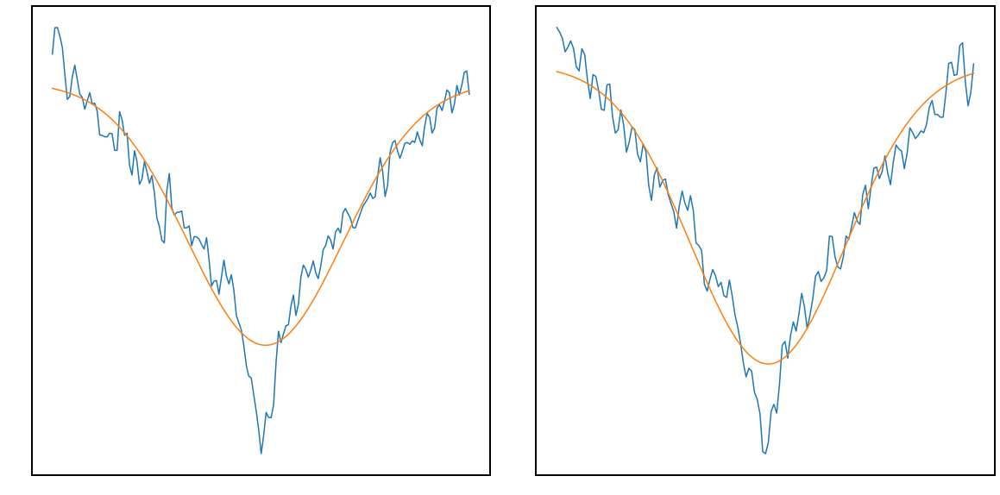

Parameters([('ampB', <Parameter 'ampB', value=-0.16242599371659683 +/- 0.00484, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.817142411305837 +/- 7.37e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=6.246636214769171e-07 +/- 5.44e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5316304856060504 +/- 0.00478, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.2320925731479366 +/- 0.00504, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=6.119999190627232e-07 +/- 3.9e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7117229381097551 +/- 0.00493, bounds=[-inf:inf]>)])


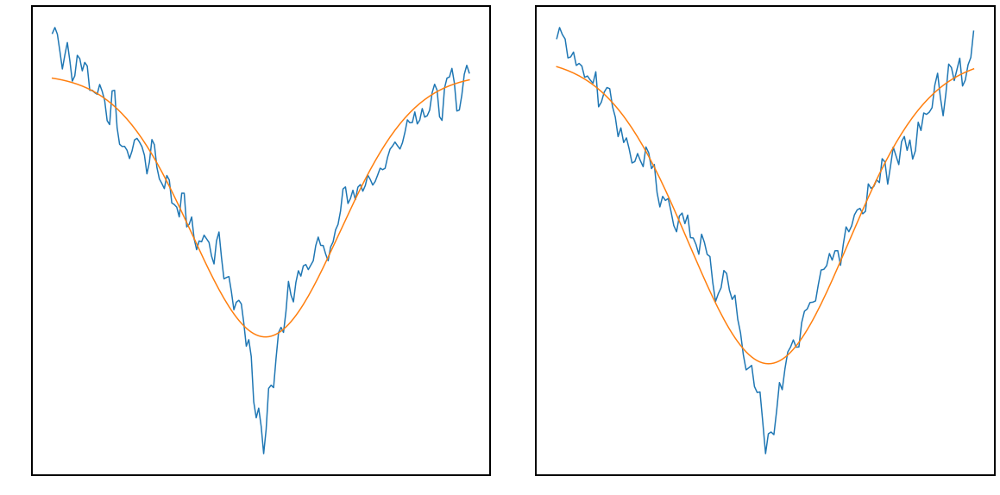

Parameters([('ampB', <Parameter 'ampB', value=-0.1609327907787668 +/- 0.00432, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8171234822017657 +/- 6.82e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=5.63067720909572e-07 +/- 4.46e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5291809956242961 +/- 0.00405, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.24529575691699732 +/- 0.00509, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=6.578898426160206e-07 +/- 3.96e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7322657998367208 +/- 0.00514, bounds=[-inf:inf]>)])


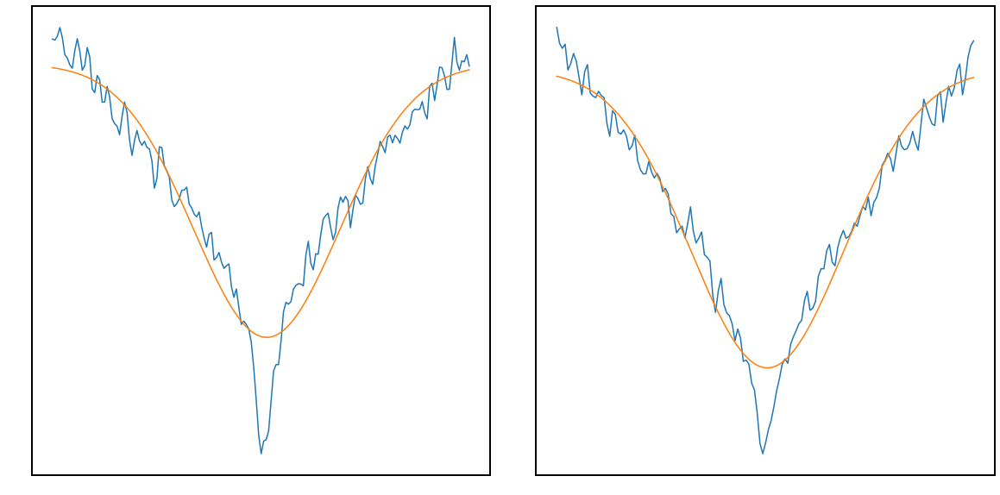

Parameters([('ampB', <Parameter 'ampB', value=-0.1583611695878608 +/- 0.00421, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.817114893759218 +/- 6.78e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=5.516289937324612e-07 +/- 4.32e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5250286493207356 +/- 0.00389, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.23815803816951528 +/- 0.00472, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=6.083804762329167e-07 +/- 3.54e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7255379351530815 +/- 0.0046, bounds=[-inf:inf]>)])


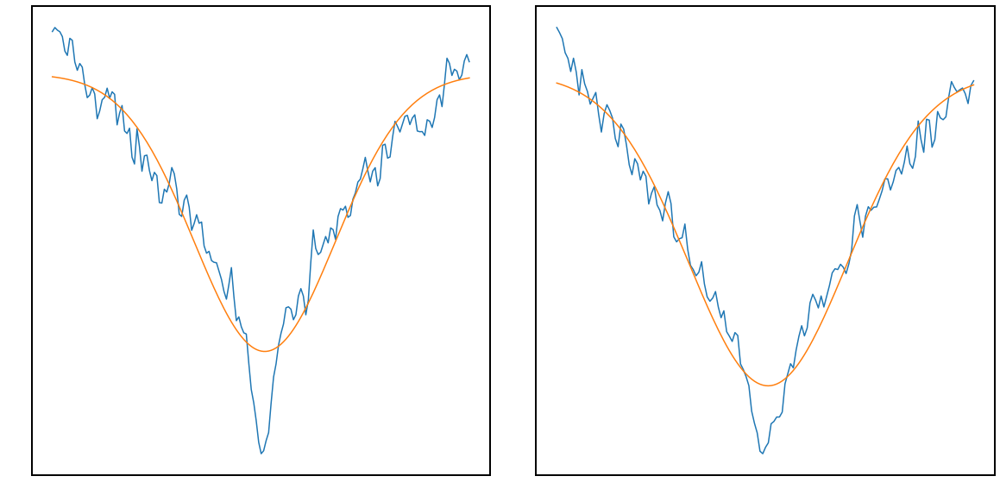

Parameters([('ampB', <Parameter 'ampB', value=-0.1615862829658095 +/- 0.00407, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8171004181053707 +/- 6.5e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=5.136177681156373e-07 +/- 3.8e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5386065473961392 +/- 0.0036, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.2518184579852291 +/- 0.00494, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=6.504307363937831e-07 +/- 3.71e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7500224256613016 +/- 0.00497, bounds=[-inf:inf]>)])


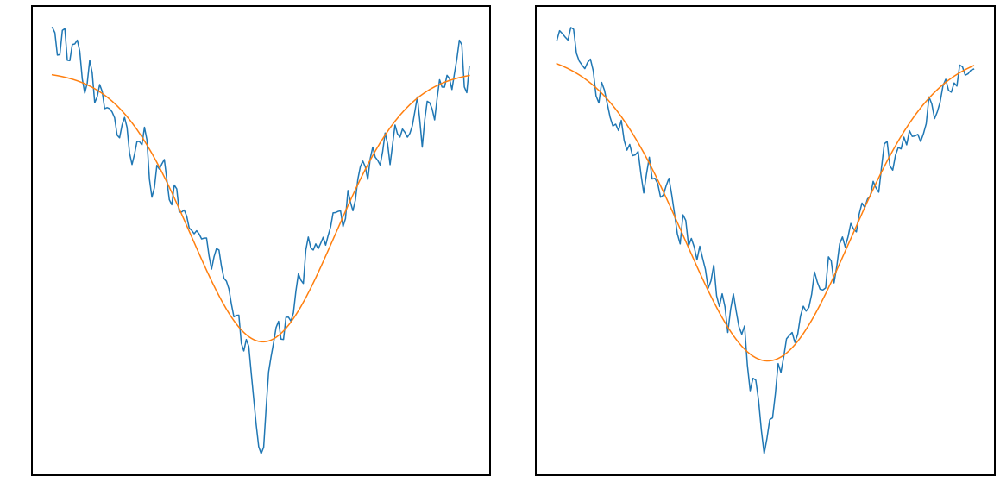

Parameters([('ampB', <Parameter 'ampB', value=-0.1620501436252258 +/- 0.00408, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8170870850312024 +/- 6.55e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=5.366121047207601e-07 +/- 3.99e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5355497937572494 +/- 0.00372, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.24966900896061395 +/- 0.00531, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=7.028730816901748e-07 +/- 4.26e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7486833713708494 +/- 0.00554, bounds=[-inf:inf]>)])


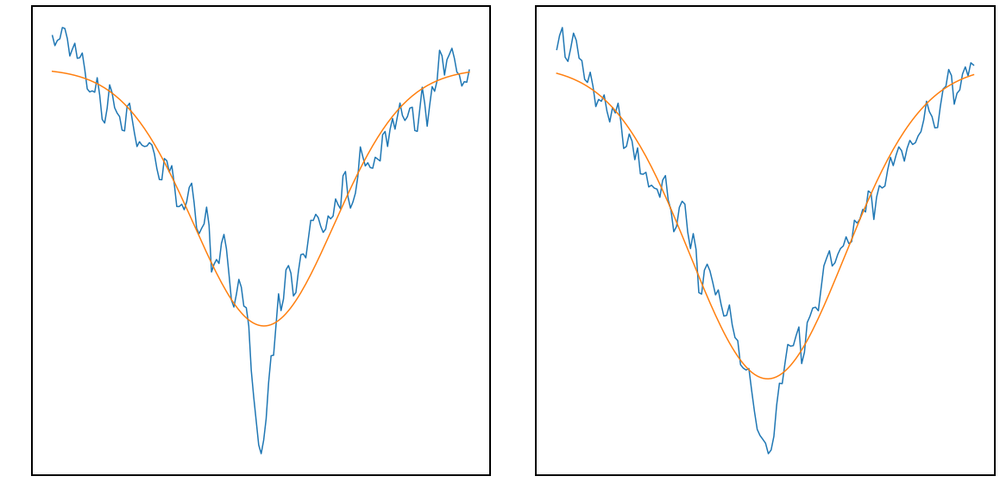

Parameters([('ampB', <Parameter 'ampB', value=-0.1494200474589866 +/- 0.00412, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.817077010871155 +/- 6.95e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=5.084529337945166e-07 +/- 4.12e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5031191345088682 +/- 0.00362, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.23923049655598183 +/- 0.00483, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=6.200844333318525e-07 +/- 3.67e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7114146476008278 +/- 0.00476, bounds=[-inf:inf]>)])


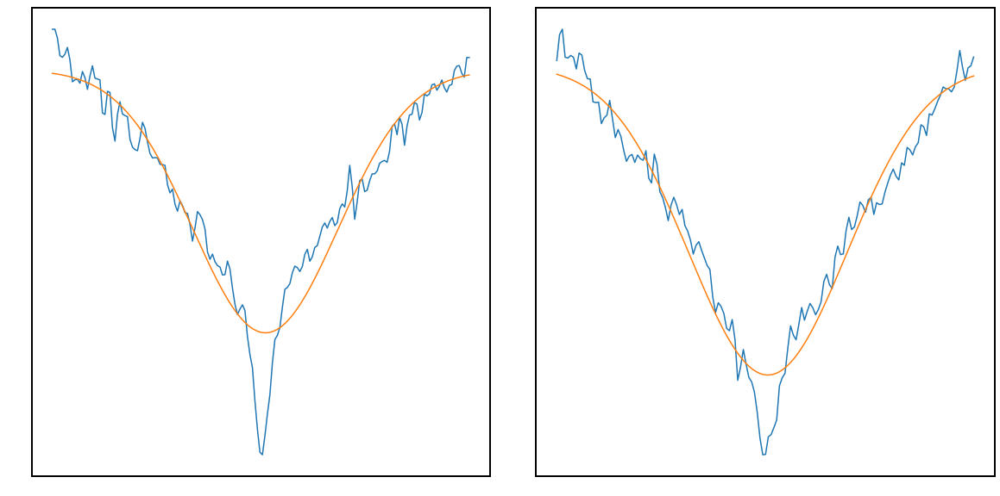

Parameters([('ampB', <Parameter 'ampB', value=-0.15524264711707192 +/- 0.00414, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.817078653624569 +/- 6.8e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=5.383695819359203e-07 +/- 4.23e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5138492691165605 +/- 0.0038, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.2373380115102895 +/- 0.00486, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=6.464299360626234e-07 +/- 3.86e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7164968803576544 +/- 0.00488, bounds=[-inf:inf]>)])


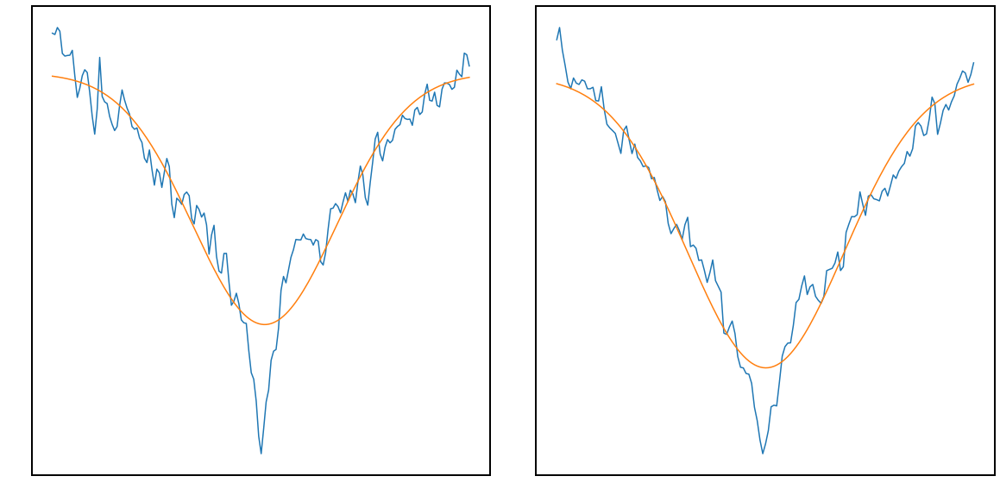

Parameters([('ampB', <Parameter 'ampB', value=-0.15469935780727406 +/- 0.00444, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8170643069954915 +/- 7.39e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=5.341513589497271e-07 +/- 4.51e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5282686970094156 +/- 0.00402, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.23572524801043784 +/- 0.00518, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=6.310895081823924e-07 +/- 4.05e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7296263132452584 +/- 0.00515, bounds=[-inf:inf]>)])


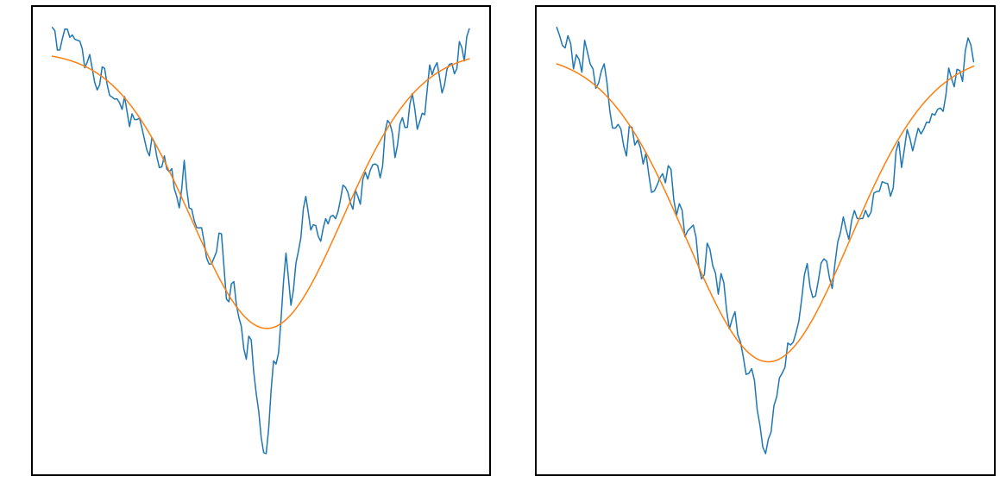

Parameters([('ampB', <Parameter 'ampB', value=-0.15739392145126455 +/- 0.00487, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.817062188735612 +/- 7.67e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=5.877786810176721e-07 +/- 5.35e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5282319701781879 +/- 0.00466, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.24422377858462044 +/- 0.0058, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=6.850546035298467e-07 +/- 4.68e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7372199468634181 +/- 0.00596, bounds=[-inf:inf]>)])


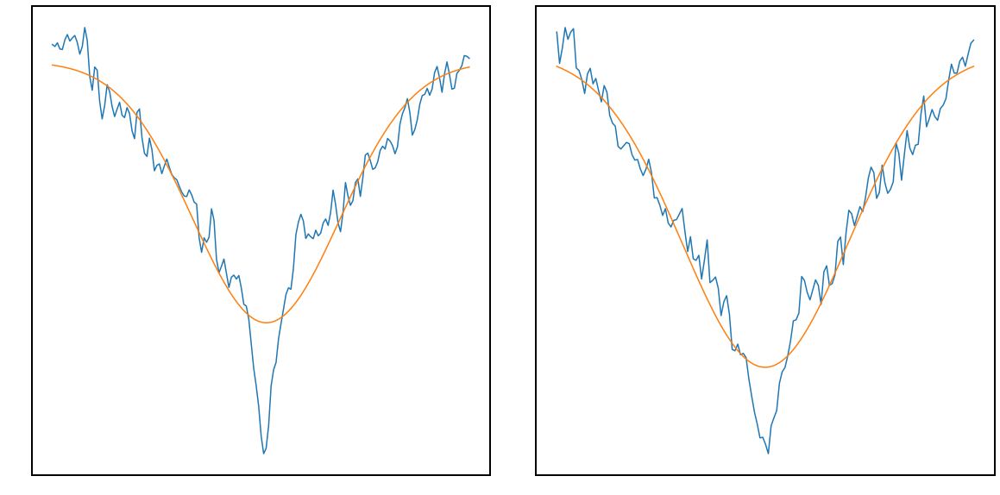

Parameters([('ampB', <Parameter 'ampB', value=-0.14866411086672907 +/- 0.0045, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.817058990208816 +/- 7.67e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=5.550351532512427e-07 +/- 4.95e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5048164812101688 +/- 0.00417, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.23418342943738202 +/- 0.00573, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=7.097480569009932e-07 +/- 4.95e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7138694558177182 +/- 0.00597, bounds=[-inf:inf]>)])


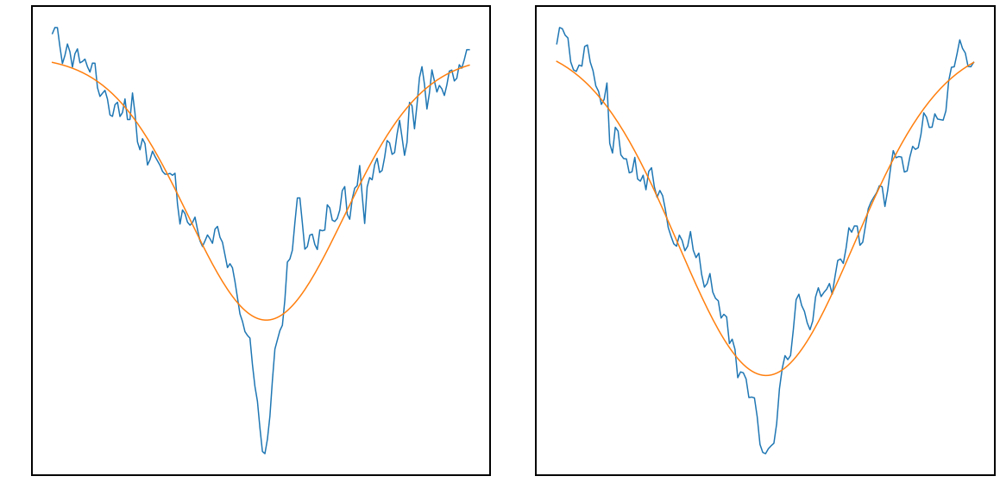

Parameters([('ampB', <Parameter 'ampB', value=-0.15159467471110816 +/- 0.00501, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8170664468884565 +/- 7.8e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=6.206798916820774e-07 +/- 5.99e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5154516567731146 +/- 0.00496, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.24687886851953944 +/- 0.00677, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=8.018952895701149e-07 +/- 5.99e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7331161824495716 +/- 0.00727, bounds=[-inf:inf]>)])


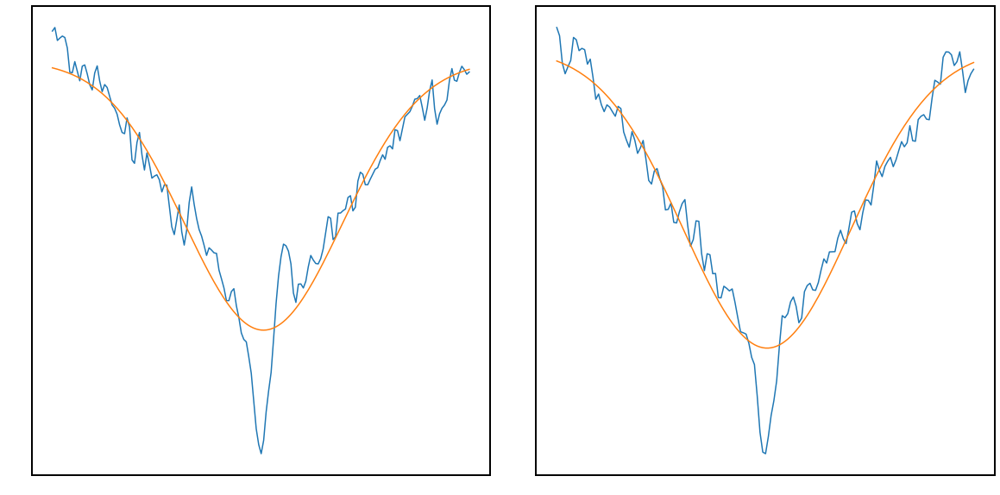

Parameters([('ampB', <Parameter 'ampB', value=-0.15379169986133806 +/- 0.00479, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8170735046892883 +/- 7.42e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=6.429399495855085e-07 +/- 5.84e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5173732520608011 +/- 0.0048, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.23568317454243398 +/- 0.00562, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=7.204347812409645e-07 +/- 4.88e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7240079540864289 +/- 0.00589, bounds=[-inf:inf]>)])


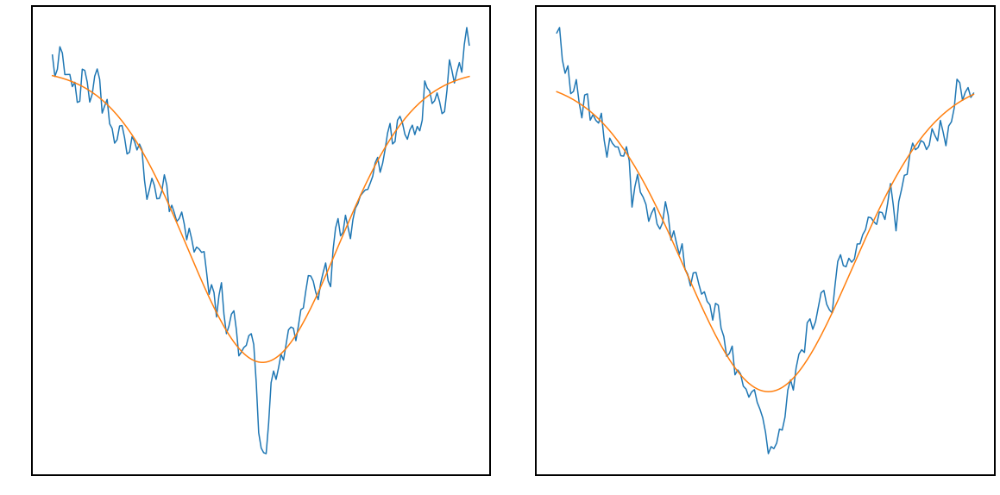

Parameters([('ampB', <Parameter 'ampB', value=-0.1468032701444736 +/- 0.00337, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8171022360533673 +/- 5.68e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=5.878751400559619e-07 +/- 3.98e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5169184634979176 +/- 0.00324, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.23167605169545277 +/- 0.00425, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=7.266356108000747e-07 +/- 3.77e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.716067523724241 +/- 0.00446, bounds=[-inf:inf]>)])


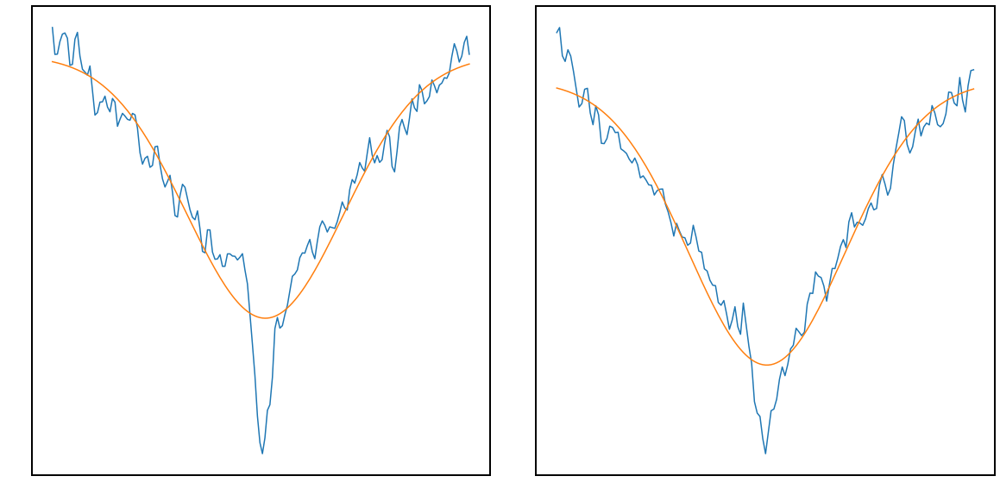

Parameters([('ampB', <Parameter 'ampB', value=-0.15370376829073987 +/- 0.0047, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8171312532739625 +/- 7.32e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=6.252666850172897e-07 +/- 5.58e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5295350630113966 +/- 0.00468, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.228608722915838 +/- 0.00495, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=6.315165237620247e-07 +/- 4e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7187407753008326 +/- 0.00492, bounds=[-inf:inf]>)])


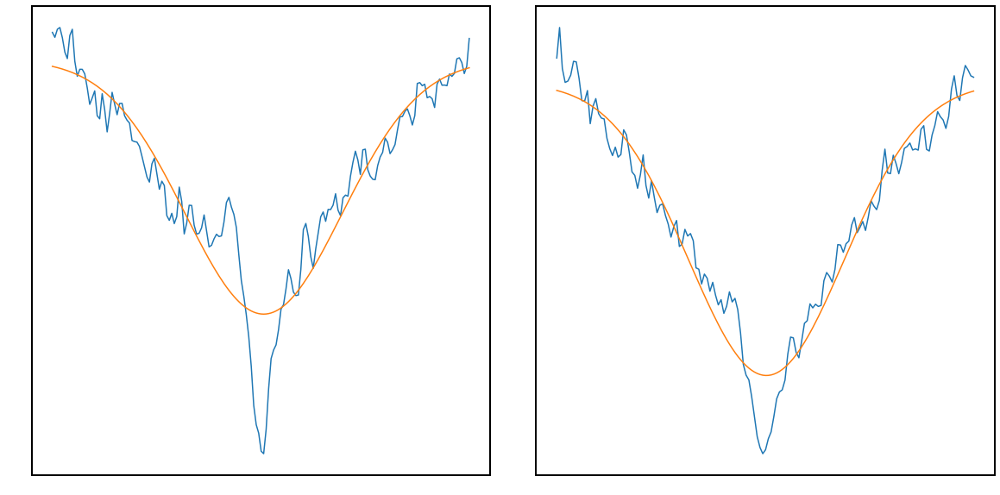

Parameters([('ampB', <Parameter 'ampB', value=-0.15078414704119325 +/- 0.00528, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.817128152473749 +/- 8.18e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=6.358472133036809e-07 +/- 6.5e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5279551818512407 +/- 0.00527, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.231903732737536 +/- 0.00551, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=6.242766984508775e-07 +/- 4.34e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7193011880726671 +/- 0.00545, bounds=[-inf:inf]>)])


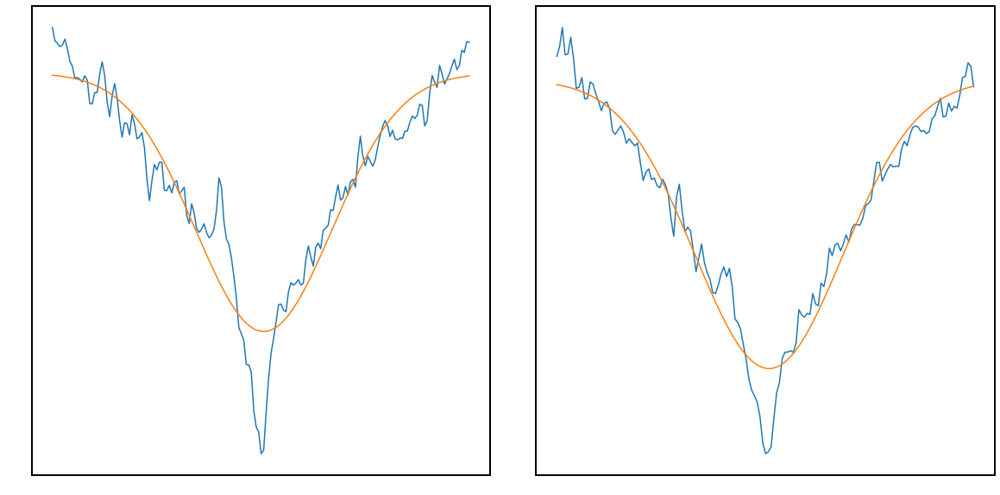

Parameters([('ampB', <Parameter 'ampB', value=-0.1491348100499103 +/- 0.00422, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.817147107002725 +/- 7.42e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=4.825704313135048e-07 +/- 4e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5113595562905137 +/- 0.00359, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.22430302855762663 +/- 0.00476, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=5.668630478102588e-07 +/- 3.55e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7017084678683141 +/- 0.00447, bounds=[-inf:inf]>)])


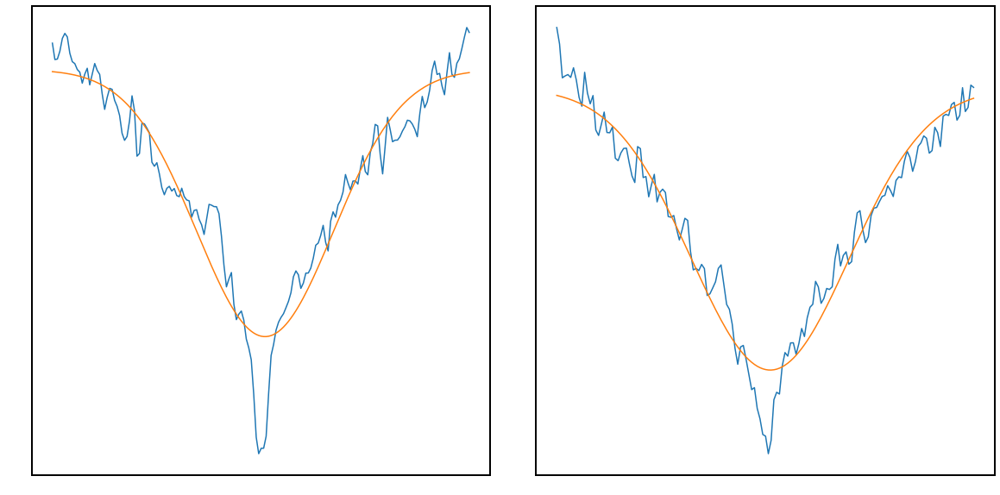

Parameters([('ampB', <Parameter 'ampB', value=-0.15216860660257536 +/- 0.00406, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.817156075073588 +/- 7.18e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=4.838985635126594e-07 +/- 3.78e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5179154932094333 +/- 0.00346, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.2263933030238713 +/- 0.00497, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=6.420211954922027e-07 +/- 4.1e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7095870612378374 +/- 0.00497, bounds=[-inf:inf]>)])


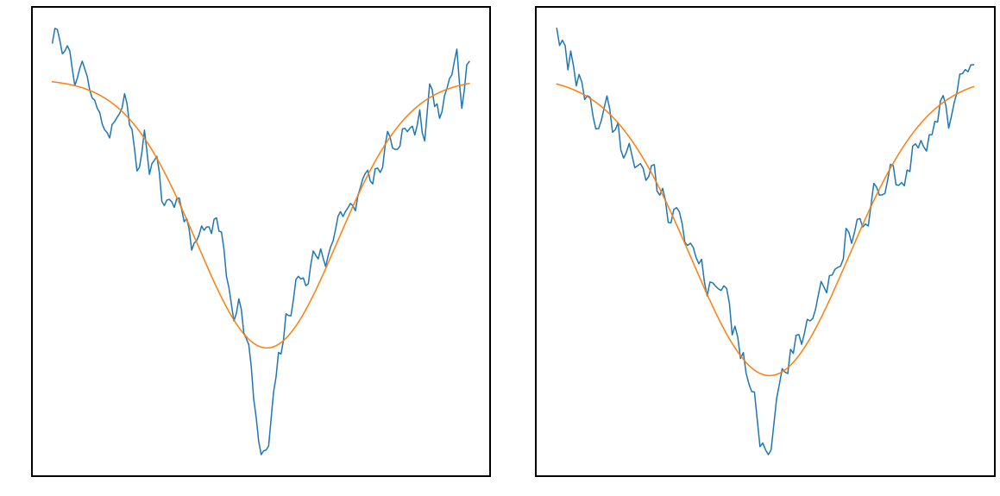

Parameters([('ampB', <Parameter 'ampB', value=-0.15209563540613877 +/- 0.00419, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.817151276252246 +/- 7.22e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=5.125362975550121e-07 +/- 4.14e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5099871912526207 +/- 0.00369, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.23030191656424415 +/- 0.00501, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=6.394849132058429e-07 +/- 4.06e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7077780152881762 +/- 0.00501, bounds=[-inf:inf]>)])


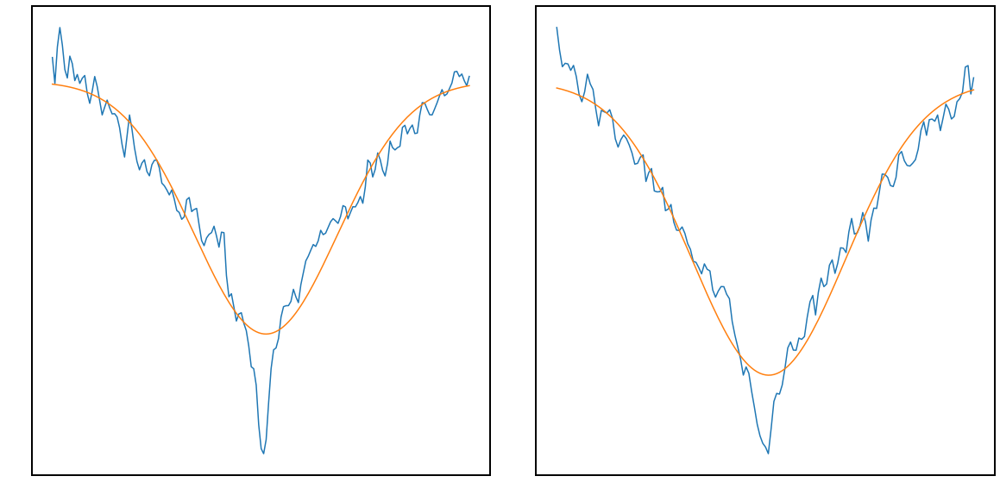

Parameters([('ampB', <Parameter 'ampB', value=-0.158423955330399 +/- 0.00407, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8171449627250587 +/- 6.84e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=5.306728857419362e-07 +/- 4.01e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5190558560842976 +/- 0.00368, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.22824264235336794 +/- 0.00465, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=6.097039327031833e-07 +/- 3.64e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7069754951722236 +/- 0.00454, bounds=[-inf:inf]>)])


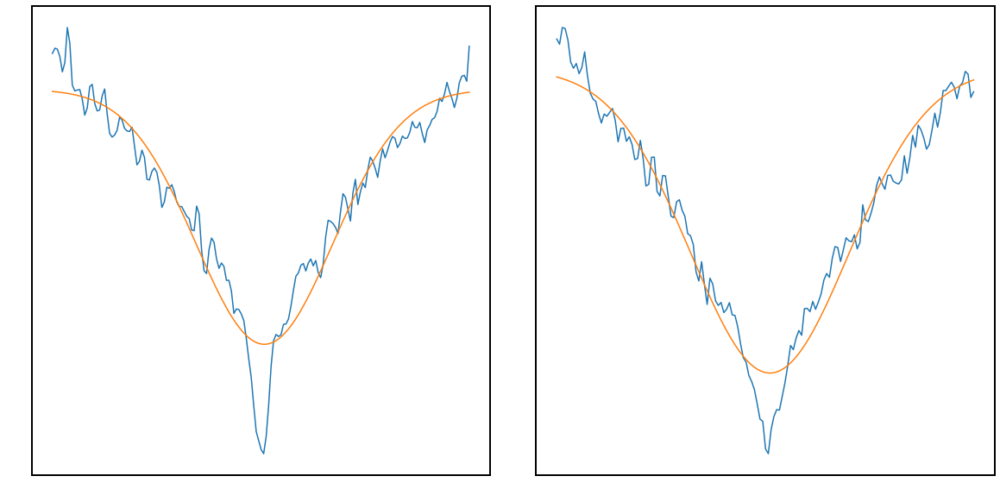

Parameters([('ampB', <Parameter 'ampB', value=-0.14999802499713816 +/- 0.00387, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8171337621808115 +/- 6.77e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=4.833582540024413e-07 +/- 3.65e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5072959167863246 +/- 0.00329, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.23282460277995284 +/- 0.00477, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=6.486009307716849e-07 +/- 3.86e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7106881392985007 +/- 0.00479, bounds=[-inf:inf]>)])


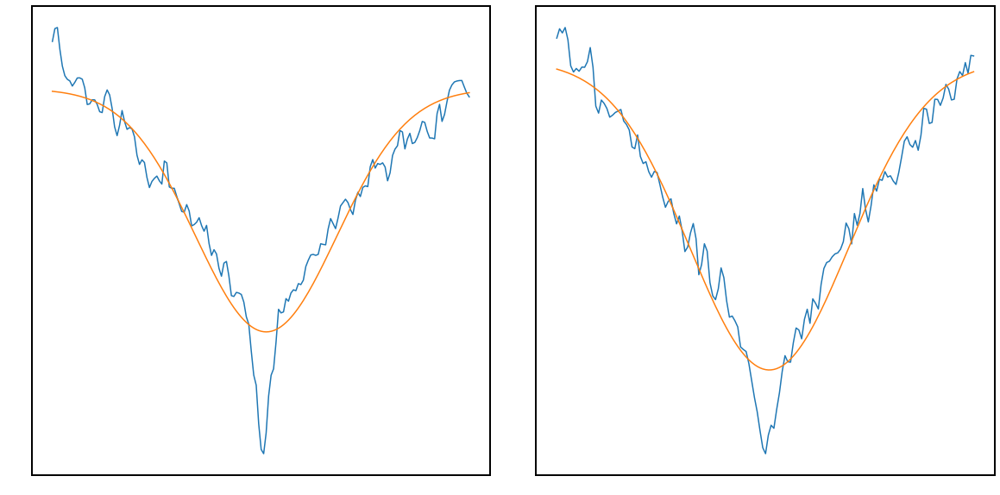

Parameters([('ampB', <Parameter 'ampB', value=-0.15103402199142393 +/- 0.00402, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.817128894128483 +/- 6.88e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=5.160685670599654e-07 +/- 4.04e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5061903589896127 +/- 0.00357, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.2344366466676396 +/- 0.00487, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=6.501841742067112e-07 +/- 3.92e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7038357999151633 +/- 0.0049, bounds=[-inf:inf]>)])


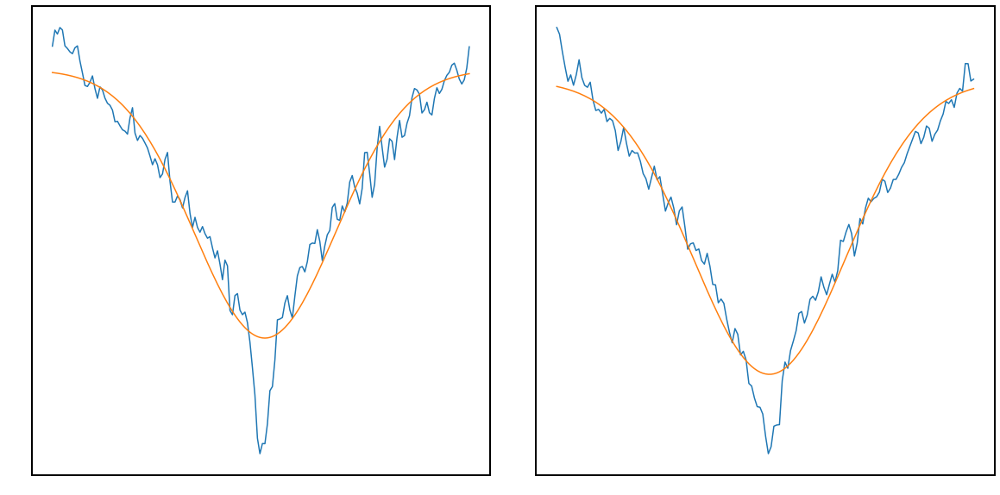

Parameters([('ampB', <Parameter 'ampB', value=-0.15318672134563333 +/- 0.00392, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8171099762695864 +/- 6.66e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=5.13152013871506e-07 +/- 3.86e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5070093144904677 +/- 0.00349, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.22818219692032163 +/- 0.00444, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=5.986779500787182e-07 +/- 3.42e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.6992756722082362 +/- 0.00429, bounds=[-inf:inf]>)])


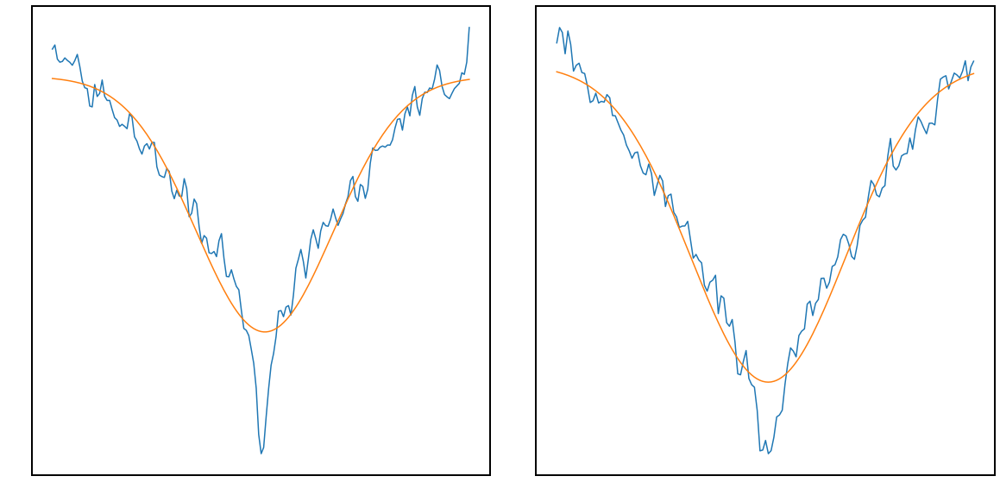

Parameters([('ampB', <Parameter 'ampB', value=-0.15434150923567985 +/- 0.00373, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.817101350192746 +/- 6.34e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=4.871395066062696e-07 +/- 3.44e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5136568343237906 +/- 0.00319, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.2365614440713905 +/- 0.00445, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=6.232552123204501e-07 +/- 3.43e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.718005498395366 +/- 0.0044, bounds=[-inf:inf]>)])


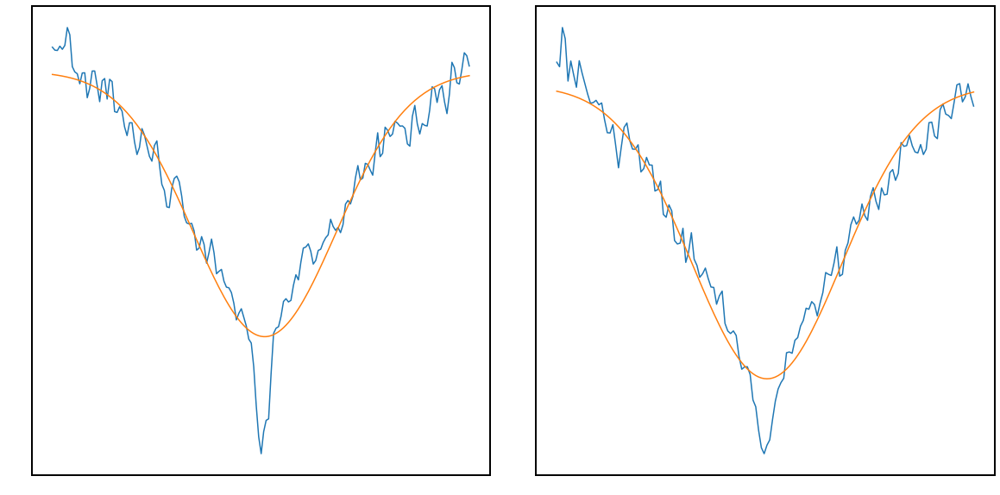

Parameters([('ampB', <Parameter 'ampB', value=-0.15410233874741433 +/- 0.00378, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.817082466972689 +/- 6.33e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=5.296603005275723e-07 +/- 3.83e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5111487486706593 +/- 0.00341, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.22951411811298897 +/- 0.00421, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=5.75714469322248e-07 +/- 3.11e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7010481817968842 +/- 0.00402, bounds=[-inf:inf]>)])


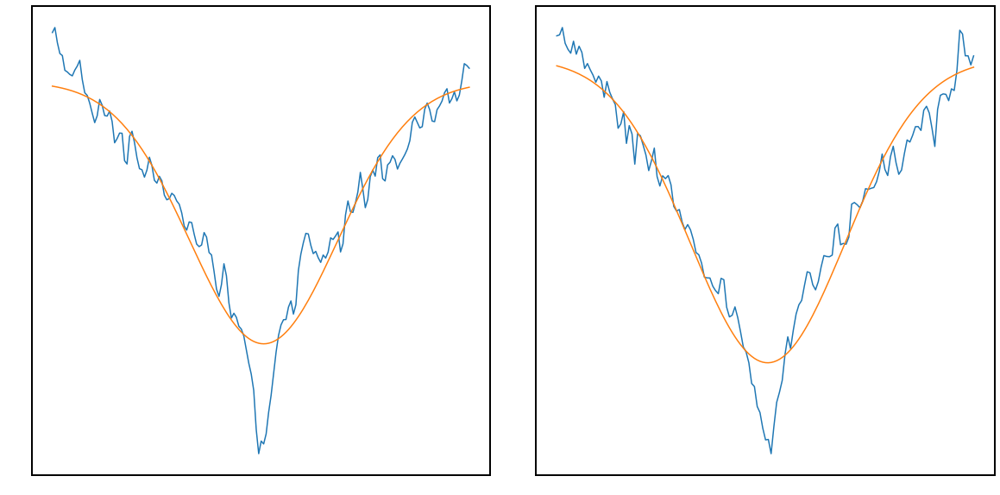

Parameters([('ampB', <Parameter 'ampB', value=-0.15496181152918295 +/- 0.00436, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.817057241173303 +/- 7.22e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=5.675572211237192e-07 +/- 4.71e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5250622700124735 +/- 0.0041, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.22757028732245216 +/- 0.00488, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=6.21138383190881e-07 +/- 3.9e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7081645083139414 +/- 0.00481, bounds=[-inf:inf]>)])


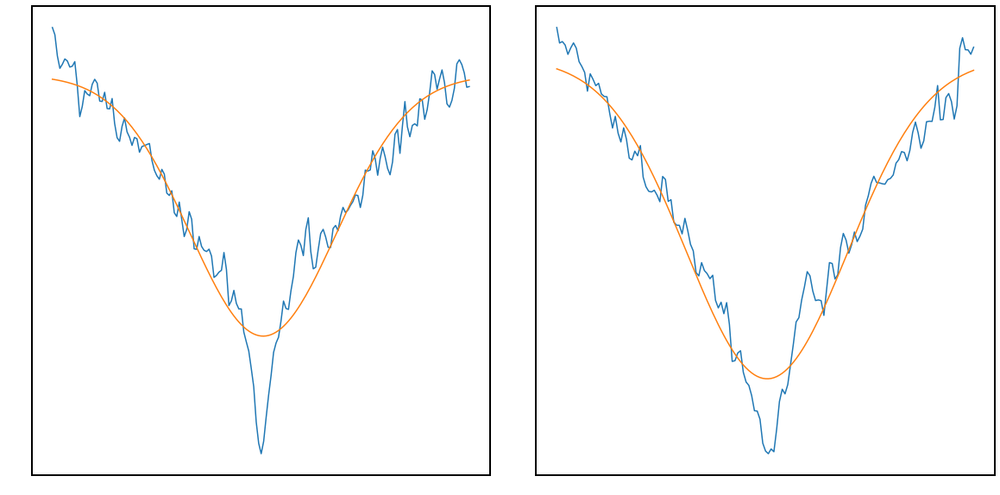

Parameters([('ampB', <Parameter 'ampB', value=-0.158617004252006 +/- 0.00434, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.81705378383603 +/- 7.08e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=5.548438260609026e-07 +/- 4.48e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5257165910499685 +/- 0.00403, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.2382679256150777 +/- 0.00522, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=6.693216937316207e-07 +/- 4.24e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7214136640172298 +/- 0.00532, bounds=[-inf:inf]>)])


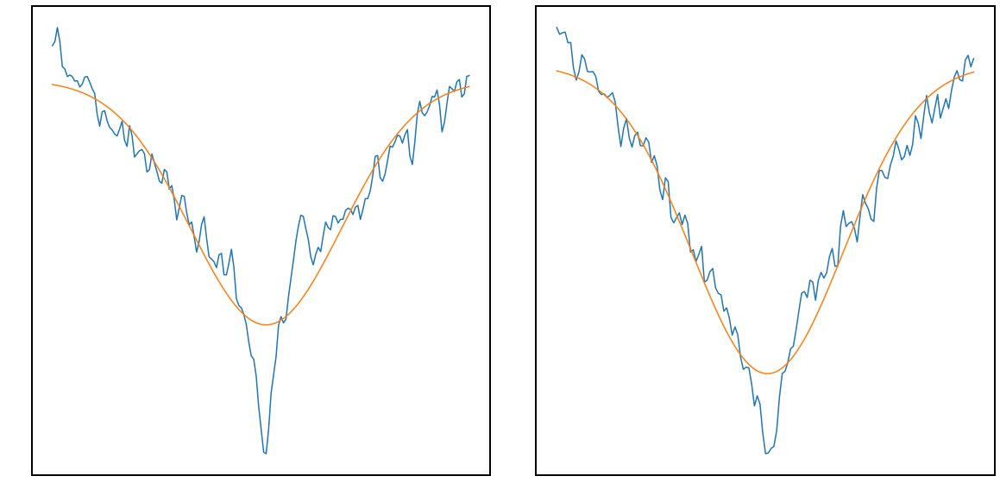

Parameters([('ampB', <Parameter 'ampB', value=-0.1550007402611393 +/- 0.00475, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.817056214180072 +/- 7.57e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=5.898882186354922e-07 +/- 5.31e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5251455417484595 +/- 0.00456, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.23194144544480683 +/- 0.00505, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=5.947881358896792e-07 +/- 3.81e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7129353489920146 +/- 0.00487, bounds=[-inf:inf]>)])


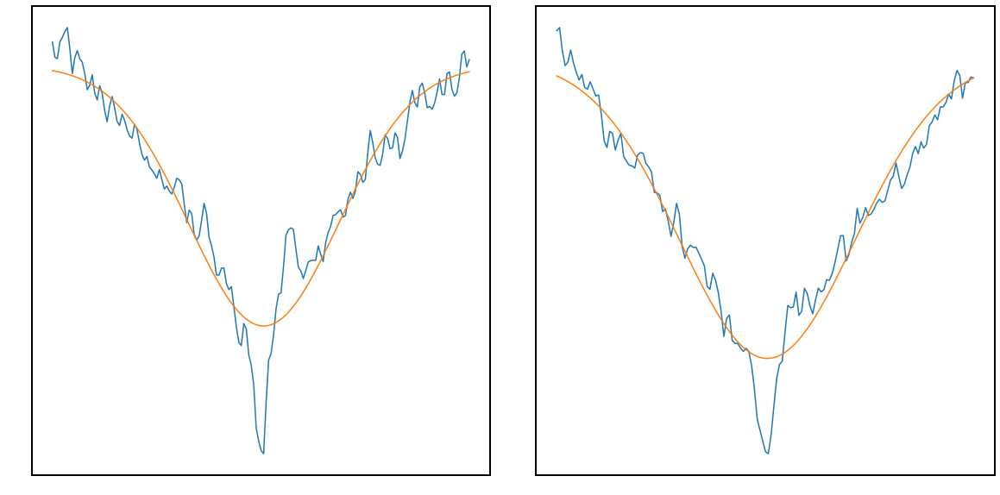

Parameters([('ampB', <Parameter 'ampB', value=-0.15152226395250312 +/- 0.00459, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8170747827700087 +/- 7.71e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=5.827530436169064e-07 +/- 5.2e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5179248212137568 +/- 0.00438, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.23571504042603397 +/- 0.00643, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=7.9201168702927e-07 +/- 5.92e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7213667202076066 +/- 0.0069, bounds=[-inf:inf]>)])


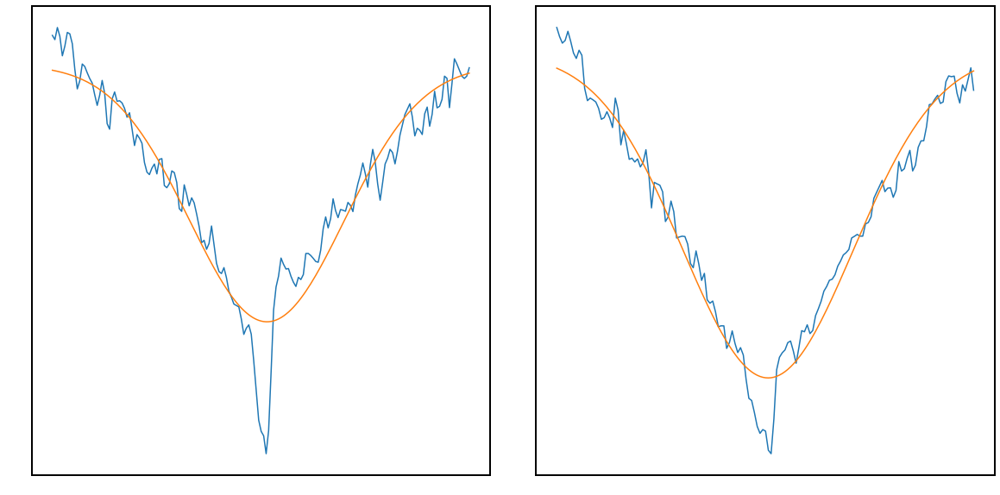

Parameters([('ampB', <Parameter 'ampB', value=-0.14544912134684732 +/- 0.00412, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.817080815020451 +/- 6.74e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=6.190502249906236e-07 +/- 5.13e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5155025161025841 +/- 0.00405, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.235208949179909 +/- 0.00521, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=7.508469144670857e-07 +/- 4.66e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7150163197430799 +/- 0.00552, bounds=[-inf:inf]>)])


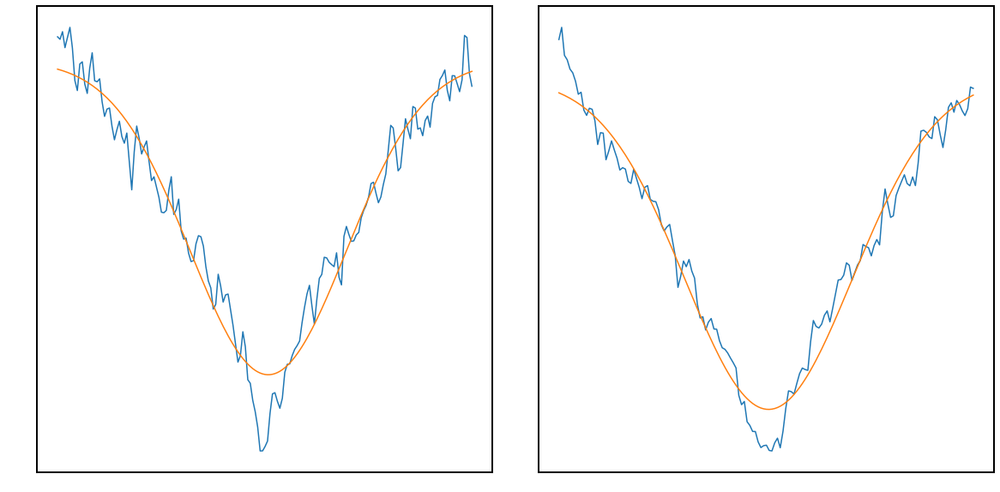

Parameters([('ampB', <Parameter 'ampB', value=-0.14847276866078812 +/- 0.00342, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8170976776300067 +/- 5.45e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=6.372382572512797e-07 +/- 4.28e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5183515971058138 +/- 0.00342, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.23321842980309374 +/- 0.00413, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=7.343586739693254e-07 +/- 3.67e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7186321535284103 +/- 0.00435, bounds=[-inf:inf]>)])


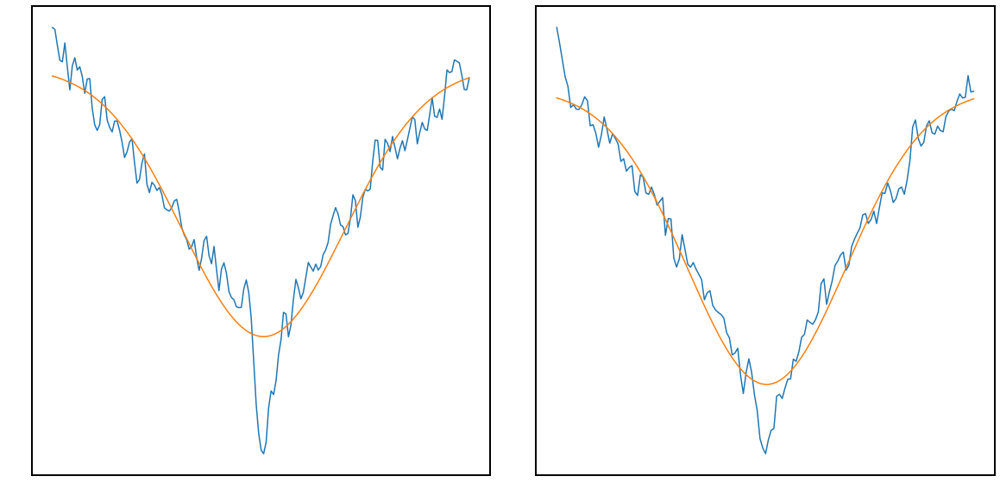

Parameters([('ampB', <Parameter 'ampB', value=-0.15437452499086476 +/- 0.00445, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8171097752614416 +/- 6.62e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=6.788983540984231e-07 +/- 5.64e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5283727272399125 +/- 0.00457, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.2283743072408455 +/- 0.00453, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=6.488921766883083e-07 +/- 3.74e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7153912117825377 +/- 0.00455, bounds=[-inf:inf]>)])


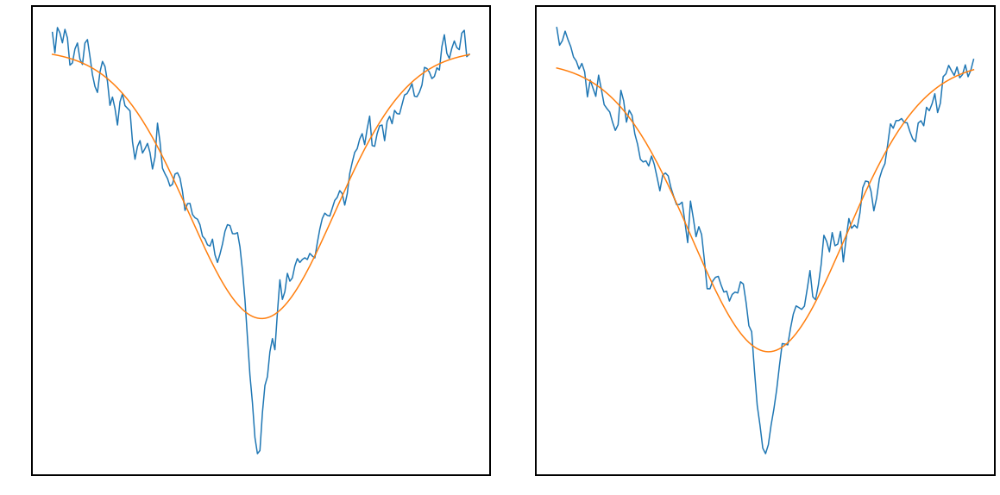

Parameters([('ampB', <Parameter 'ampB', value=-0.1461263366076111 +/- 0.00426, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8171229209905624 +/- 7.52e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=5.444909264716142e-07 +/- 4.68e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5085851856158125 +/- 0.00394, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.21456124930046452 +/- 0.00477, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=6.106274441379509e-07 +/- 3.98e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.6922974087046216 +/- 0.00466, bounds=[-inf:inf]>)])


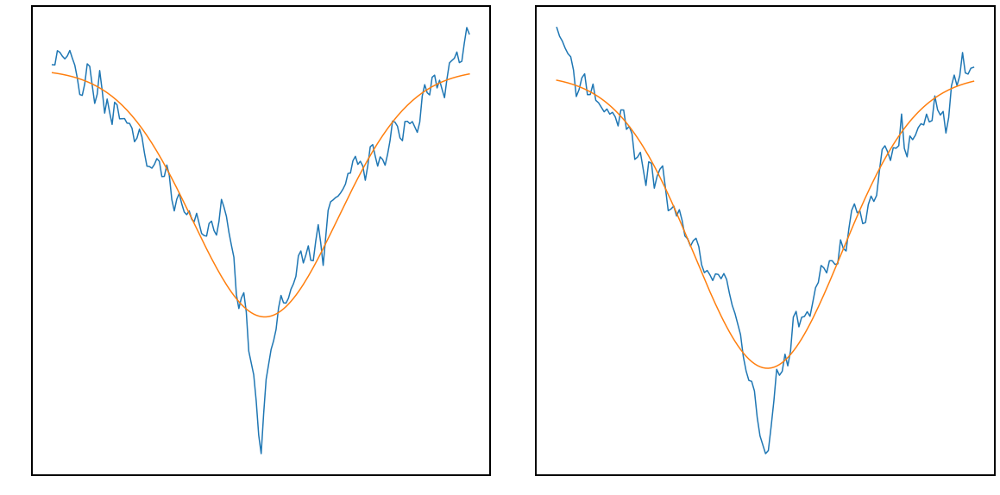

Parameters([('ampB', <Parameter 'ampB', value=-0.1496062924775326 +/- 0.00426, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8171364833450157 +/- 7.18e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=5.467073936691374e-07 +/- 4.59e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5211322596889493 +/- 0.00392, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.22641325902782186 +/- 0.0046, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=5.68926893244083e-07 +/- 3.41e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7091173529103586 +/- 0.00433, bounds=[-inf:inf]>)])


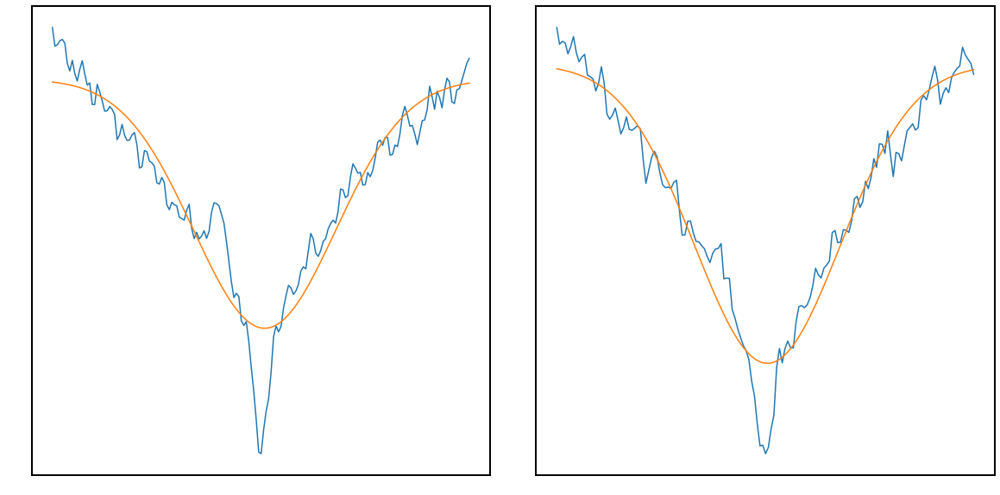

Parameters([('ampB', <Parameter 'ampB', value=-0.14911029309910004 +/- 0.00439, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8171356043730285 +/- 7.53e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=5.233369674310348e-07 +/- 4.53e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5021781069466269 +/- 0.00393, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.22359718996892275 +/- 0.00474, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=5.499983698552826e-07 +/- 3.44e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.6924265869490356 +/- 0.00438, bounds=[-inf:inf]>)])


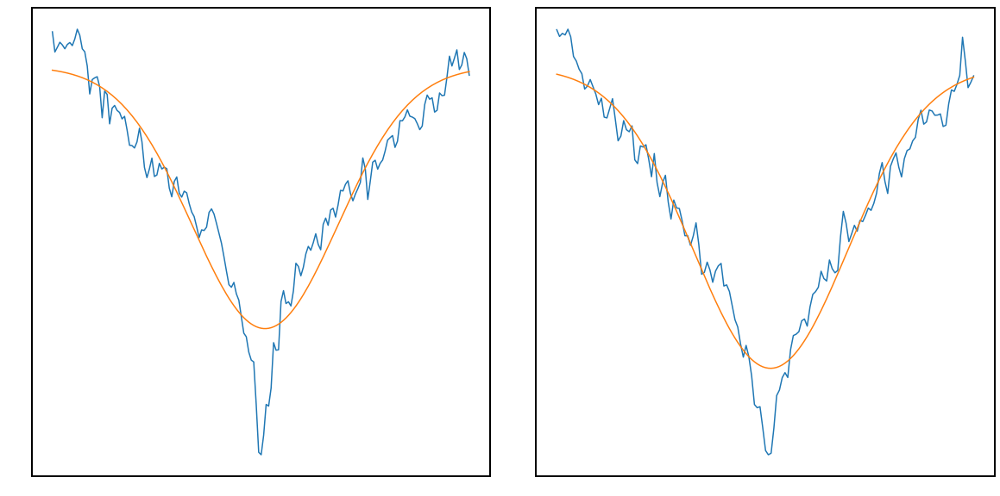

Parameters([('ampB', <Parameter 'ampB', value=-0.15292134664576487 +/- 0.00446, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8171382163436394 +/- 7.3e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=5.486106293835136e-07 +/- 4.71e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5162735597827317 +/- 0.00411, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.23855207525457772 +/- 0.00507, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=6.19681793039785e-07 +/- 3.85e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7216219758413527 +/- 0.00498, bounds=[-inf:inf]>)])


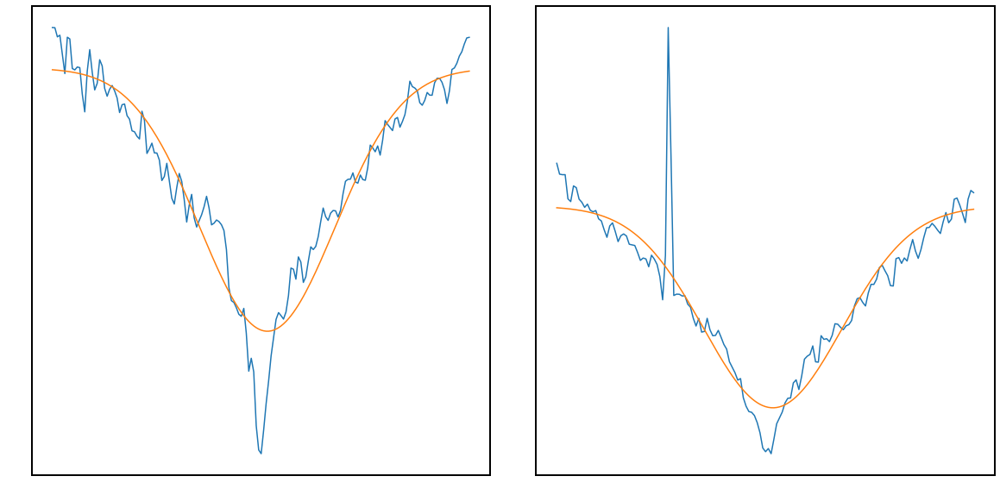

Parameters([('ampB', <Parameter 'ampB', value=-0.14541527505051738 +/- 0.00542, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.817155218374479 +/- 9.47e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=4.725926312672315e-07 +/- 5.14e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.4950746481229393 +/- 0.00454, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.22289260268205344 +/- 0.00581, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=4.973501355931021e-07 +/- 3.8e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.689353515665135 +/- 0.00502, bounds=[-inf:inf]>)])


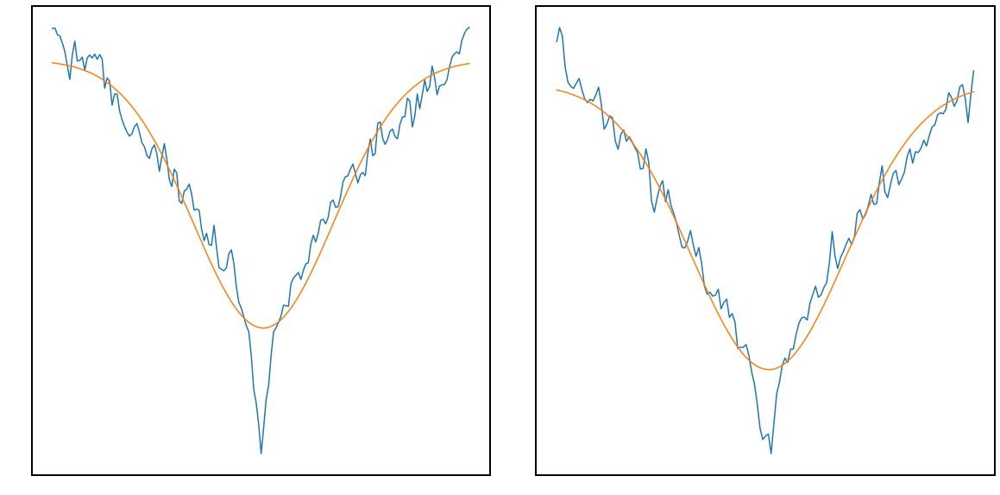

Parameters([('ampB', <Parameter 'ampB', value=-0.1515045698192012 +/- 0.00381, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8171258675662267 +/- 6.57e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=5.117765867684802e-07 +/- 3.79e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5070790286435817 +/- 0.00337, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.2286383487487067 +/- 0.00442, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=6.122714802573054e-07 +/- 3.47e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7004229549066721 +/- 0.00433, bounds=[-inf:inf]>)])


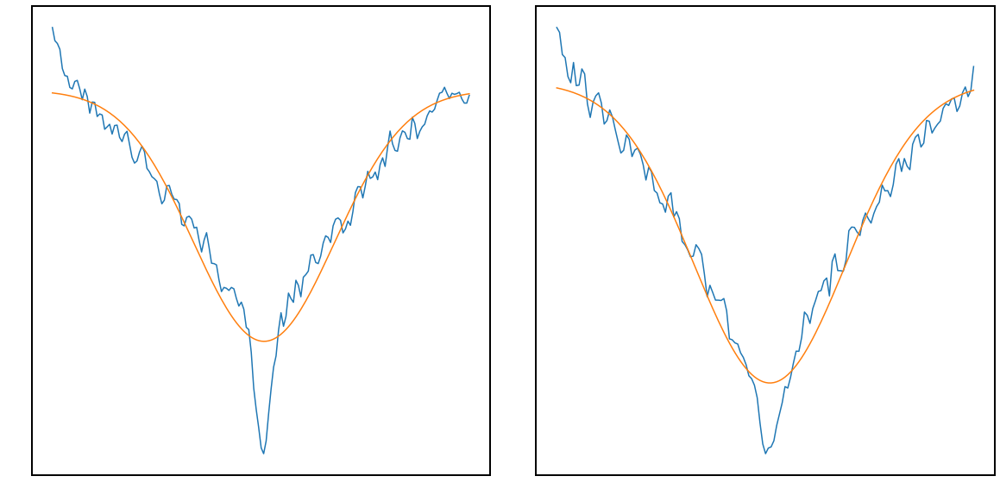

Parameters([('ampB', <Parameter 'ampB', value=-0.1515336013377708 +/- 0.00377, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8171132978375764 +/- 6.35e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=5.15042044609183e-07 +/- 3.77e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5104271874389014 +/- 0.00334, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.2344863280113215 +/- 0.00428, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=5.957613586434212e-07 +/- 3.2e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.710217700057825 +/- 0.00413, bounds=[-inf:inf]>)])


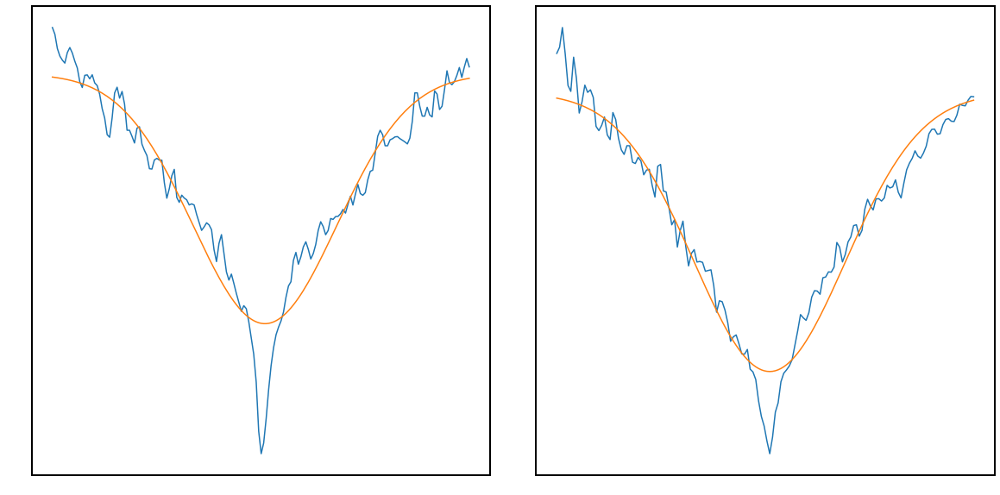

Parameters([('ampB', <Parameter 'ampB', value=-0.15057534102498318 +/- 0.00412, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.817101877994645 +/- 7e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=5.361549700545794e-07 +/- 4.32e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5024991191184244 +/- 0.00375, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.22703161119486873 +/- 0.00461, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=5.851389690742805e-07 +/- 3.49e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.6935473450641031 +/- 0.00443, bounds=[-inf:inf]>)])


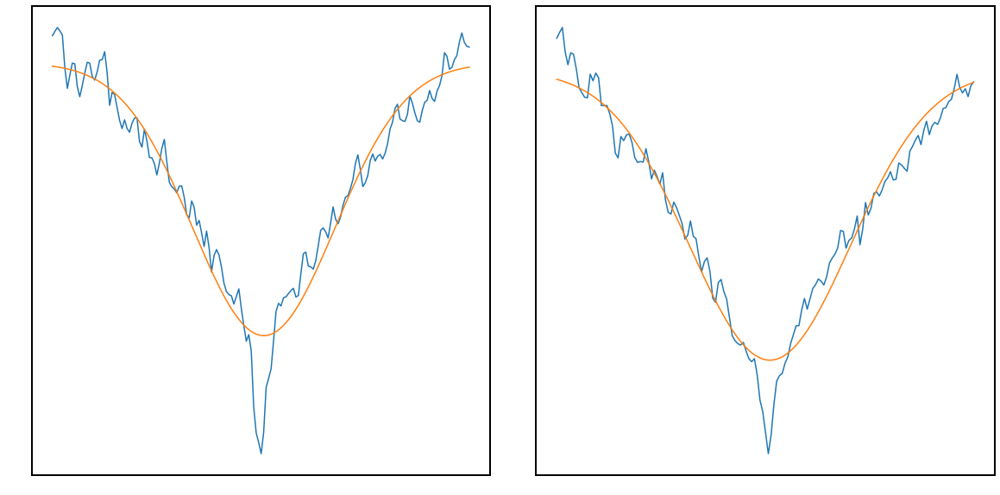

Parameters([('ampB', <Parameter 'ampB', value=-0.15713478537849532 +/- 0.00385, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8170935413115323 +/- 6.46e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=5.231061009296444e-07 +/- 3.77e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5167997719319132 +/- 0.00345, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.2362290646989144 +/- 0.00473, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=6.669259337744666e-07 +/- 3.86e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7191873123257512 +/- 0.00481, bounds=[-inf:inf]>)])


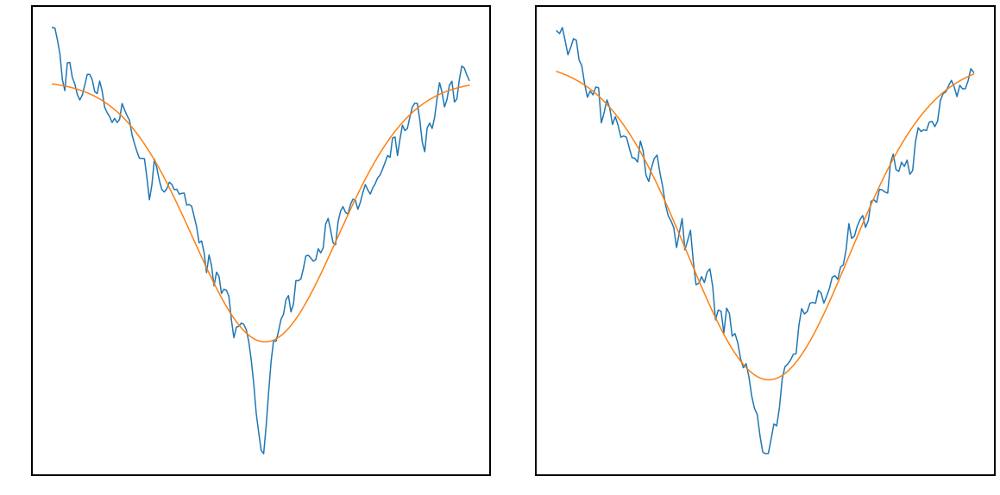

Parameters([('ampB', <Parameter 'ampB', value=-0.1561826889478695 +/- 0.00391, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8170852574161582 +/- 6.44e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=5.328668549623066e-07 +/- 3.93e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5188429573977517 +/- 0.00354, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.24334245254614373 +/- 0.00486, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=6.795516846641731e-07 +/- 3.91e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7289528661268051 +/- 0.00498, bounds=[-inf:inf]>)])


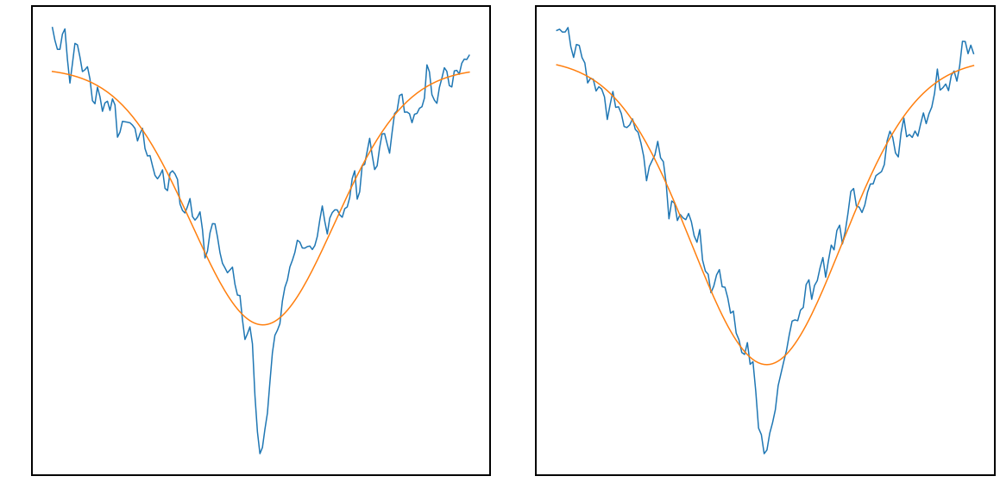

Parameters([('ampB', <Parameter 'ampB', value=-0.15399531404669134 +/- 0.00424, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8170604349668844 +/- 7.01e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=5.217195470709417e-07 +/- 4.23e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5164097265177984 +/- 0.00382, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.23271167242805024 +/- 0.00471, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=5.755100927924967e-07 +/- 3.43e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7131694233207663 +/- 0.0045, bounds=[-inf:inf]>)])


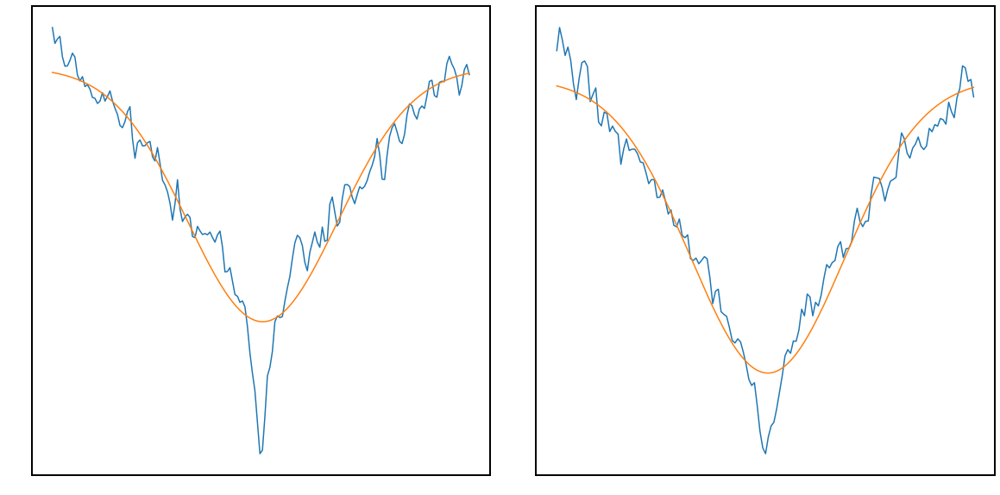

Parameters([('ampB', <Parameter 'ampB', value=-0.15569980714357376 +/- 0.00442, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8170587953215294 +/- 6.96e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=5.749434501188948e-07 +/- 4.81e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5219188546920938 +/- 0.00422, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.23924297192591637 +/- 0.00484, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=6.170509668629276e-07 +/- 3.66e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.720542169207127 +/- 0.00476, bounds=[-inf:inf]>)])


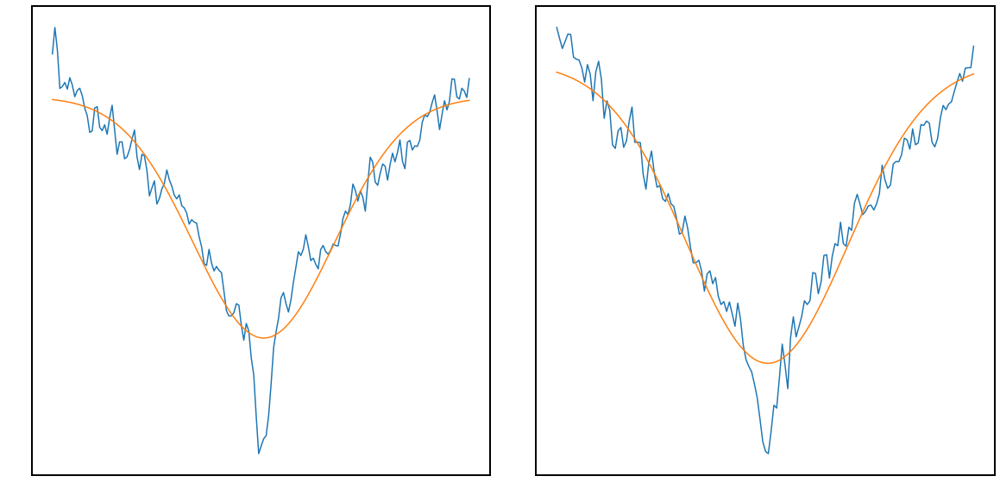

Parameters([('ampB', <Parameter 'ampB', value=-0.15348558262203996 +/- 0.00434, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.817058132591595 +/- 7.53e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=5.150734769123924e-07 +/- 4.28e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5169950751532432 +/- 0.00384, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.2289773692617517 +/- 0.00537, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=6.671886639507718e-07 +/- 4.53e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7137528009997132 +/- 0.00547, bounds=[-inf:inf]>)])


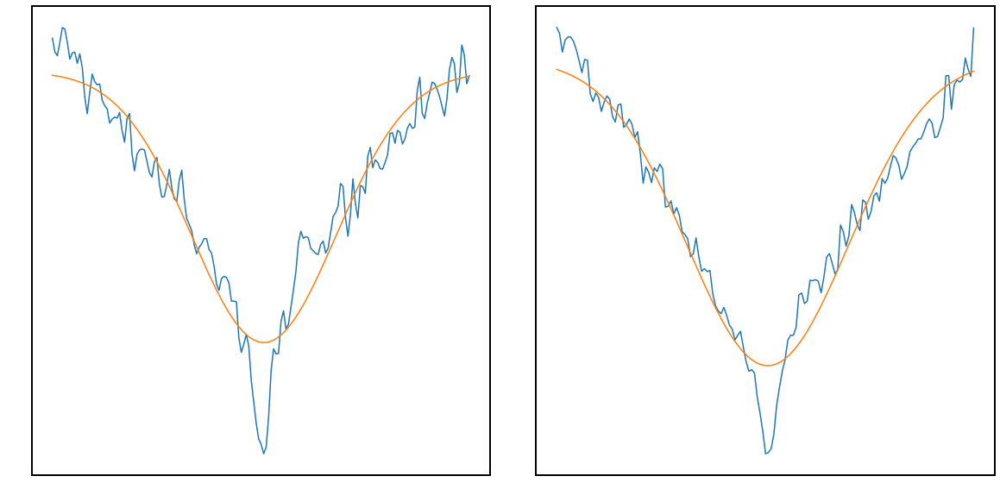

Parameters([('ampB', <Parameter 'ampB', value=-0.1511488917733027 +/- 0.00427, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.81705794905492 +/- 7.33e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=5.390241741874419e-07 +/- 4.49e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5081858357419274 +/- 0.0039, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.23111930917290816 +/- 0.00527, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=6.769369383549719e-07 +/- 4.45e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7081070161825893 +/- 0.00539, bounds=[-inf:inf]>)])


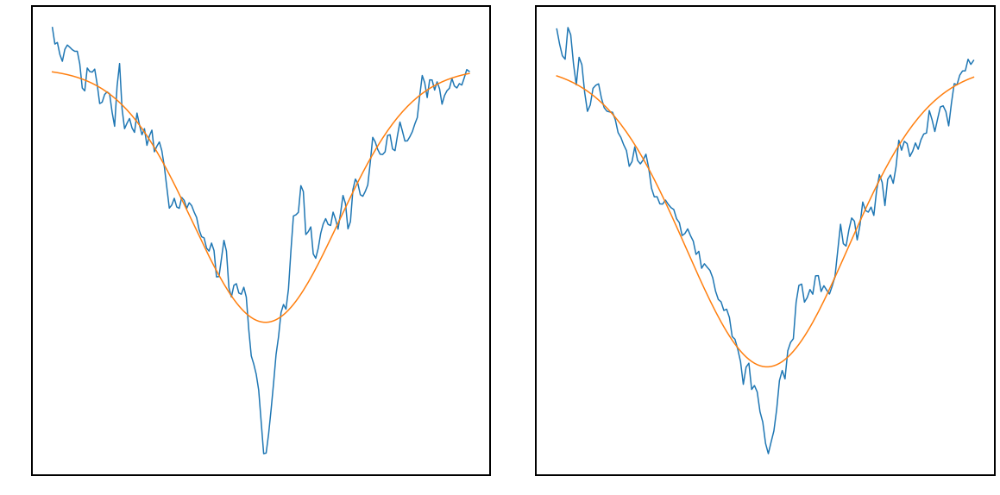

Parameters([('ampB', <Parameter 'ampB', value=-0.14980506127207807 +/- 0.00464, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.817052612605152 +/- 7.74e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=5.499726418540699e-07 +/- 5.02e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5052083635479844 +/- 0.00428, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.23895841762752032 +/- 0.00567, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=6.776515621957382e-07 +/- 4.64e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7123861546448387 +/- 0.00581, bounds=[-inf:inf]>)])


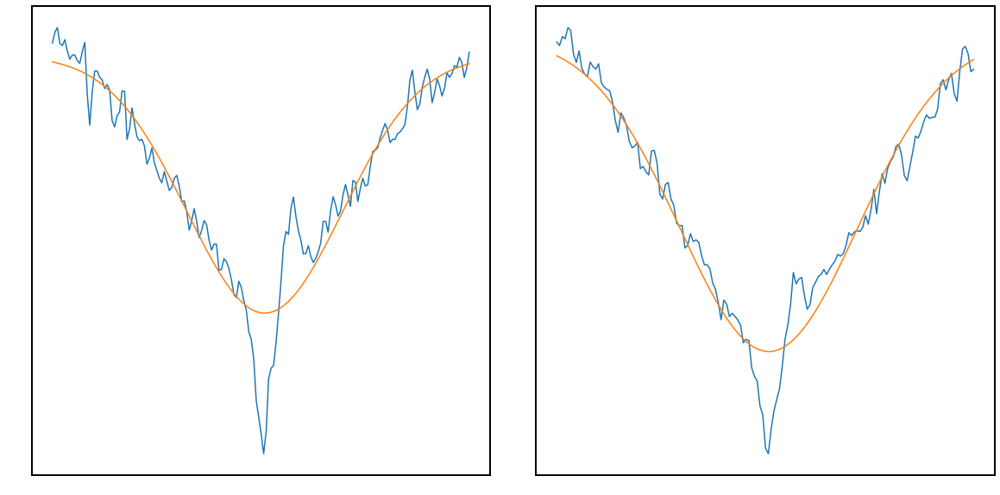

Parameters([('ampB', <Parameter 'ampB', value=-0.14803960768814572 +/- 0.00481, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8170651350039755 +/- 7.69e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=6.261450153459971e-07 +/- 5.94e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5066879242220925 +/- 0.00476, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.24324543667561885 +/- 0.00669, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=8.192377577917104e-07 +/- 6.09e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7235349494851924 +/- 0.00722, bounds=[-inf:inf]>)])


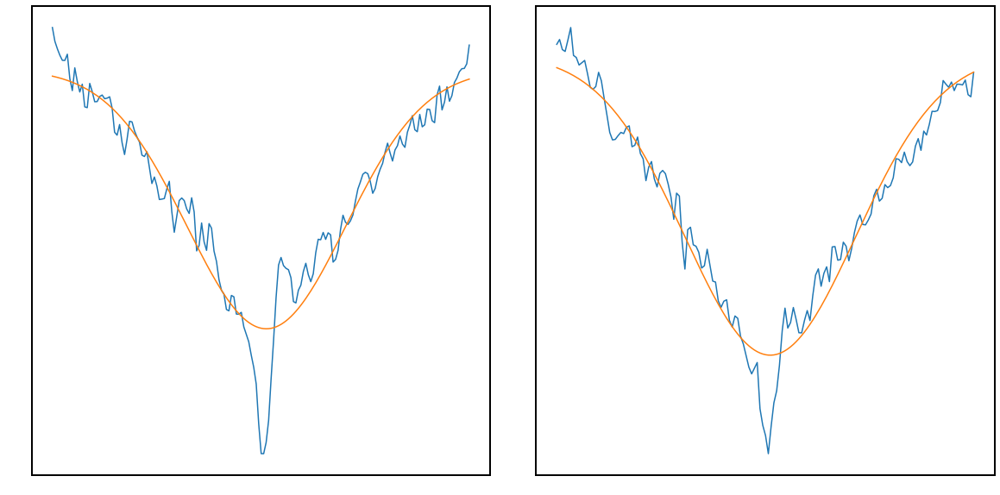

Parameters([('ampB', <Parameter 'ampB', value=-0.15435253520810197 +/- 0.0047, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8170760940962385 +/- 7.18e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=6.490143570500346e-07 +/- 5.74e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5255644319243752 +/- 0.00472, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.24105502087360564 +/- 0.00575, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=7.546936806045337e-07 +/- 5.03e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7308429196756402 +/- 0.00609, bounds=[-inf:inf]>)])


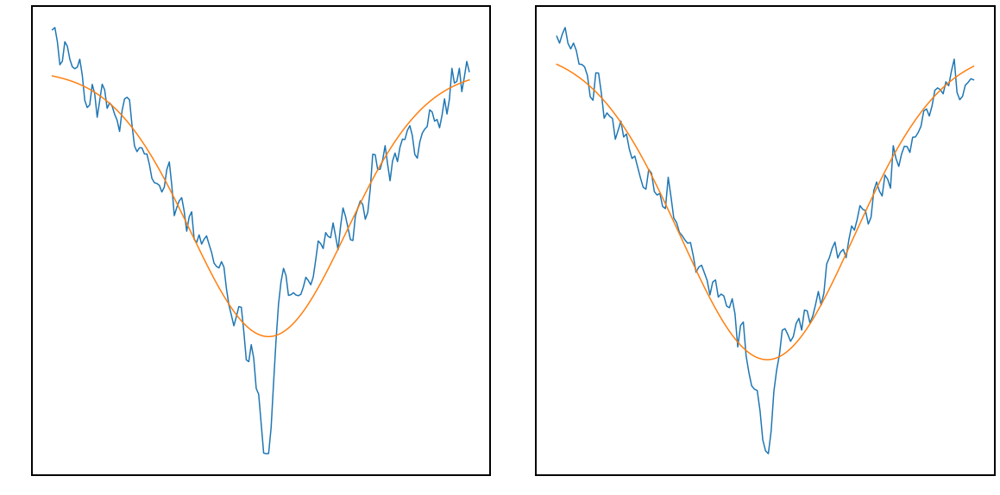

Parameters([('ampB', <Parameter 'ampB', value=-0.15435333034749146 +/- 0.00451, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8170743022295053 +/- 6.87e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=6.277524251002487e-07 +/- 5.35e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5472457824782114 +/- 0.00446, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.25276031128992477 +/- 0.00587, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=7.744921717092189e-07 +/- 4.97e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7699585728382476 +/- 0.00626, bounds=[-inf:inf]>)])


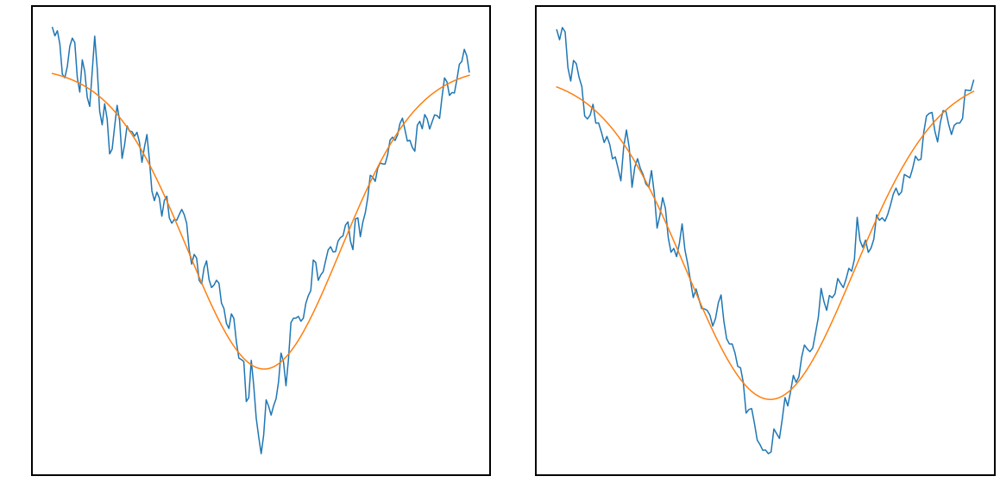

Parameters([('ampB', <Parameter 'ampB', value=-0.1566087895477328 +/- 0.00394, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.817096442370161 +/- 5.97e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=6.041862159242781e-07 +/- 4.46e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5483793223580629 +/- 0.00383, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.2564569733156597 +/- 0.00484, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=7.213091372609884e-07 +/- 3.86e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7778639586590113 +/- 0.00506, bounds=[-inf:inf]>)])


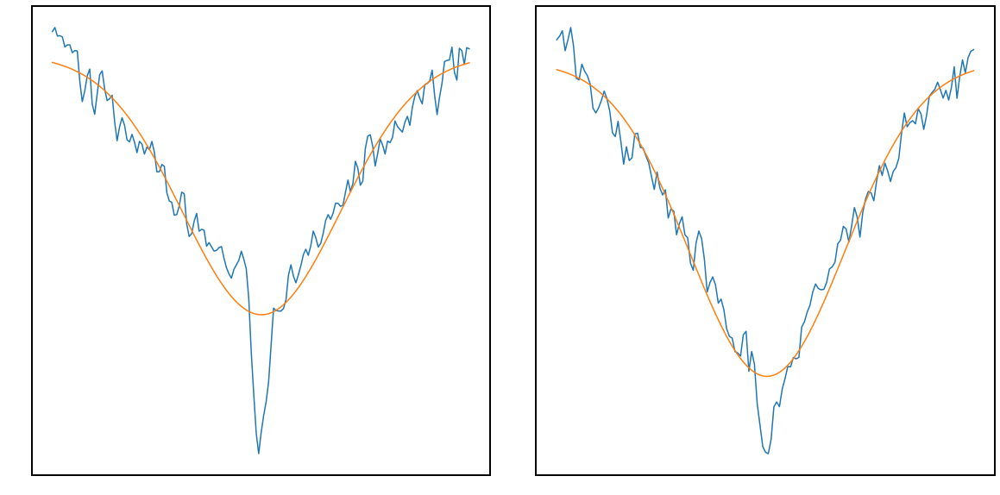

Parameters([('ampB', <Parameter 'ampB', value=-0.16201993932277026 +/- 0.0047, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8171122926509455 +/- 6.67e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=6.424418313478269e-07 +/- 5.43e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5593930660536618 +/- 0.00471, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.25136443590025837 +/- 0.00484, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=6.201320635616193e-07 +/- 3.49e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7857999760370844 +/- 0.00476, bounds=[-inf:inf]>)])


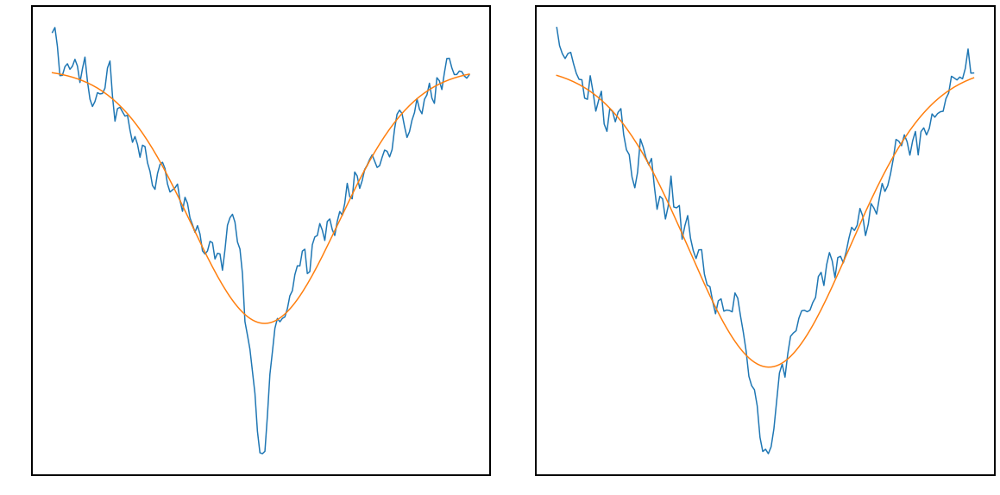

Parameters([('ampB', <Parameter 'ampB', value=-0.153626582518875 +/- 0.00476, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8171262431099824 +/- 7.52e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=5.558794602268719e-07 +/- 5.08e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5454713971542587 +/- 0.00445, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.25019940522754475 +/- 0.00564, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=6.662205896435768e-07 +/- 4.35e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7789004284772919 +/- 0.00574, bounds=[-inf:inf]>)])


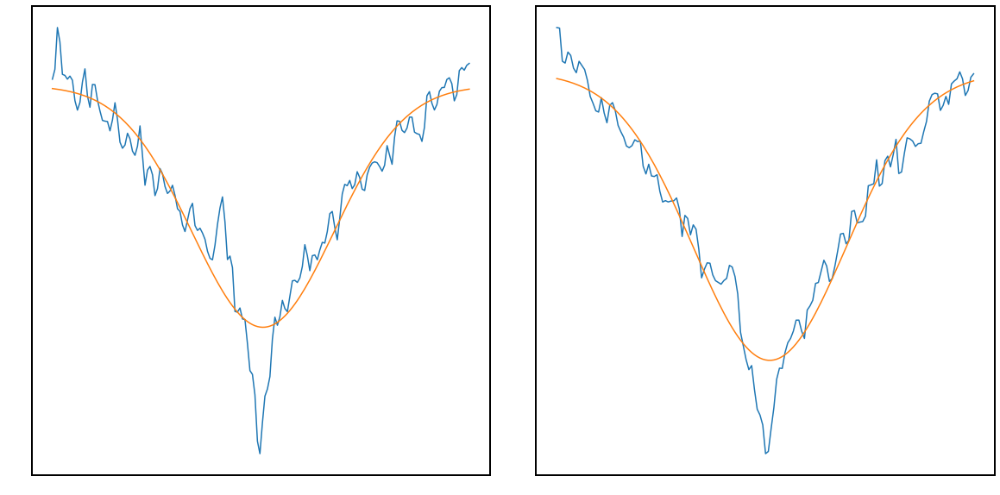

Parameters([('ampB', <Parameter 'ampB', value=-0.15519833725394952 +/- 0.00453, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.817132062301252 +/- 7.34e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=5.148475918118223e-07 +/- 4.42e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5358447750708272 +/- 0.00404, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.24391266841754847 +/- 0.00516, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=6.061764190598026e-07 +/- 3.77e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.757980641905445 +/- 0.00503, bounds=[-inf:inf]>)])


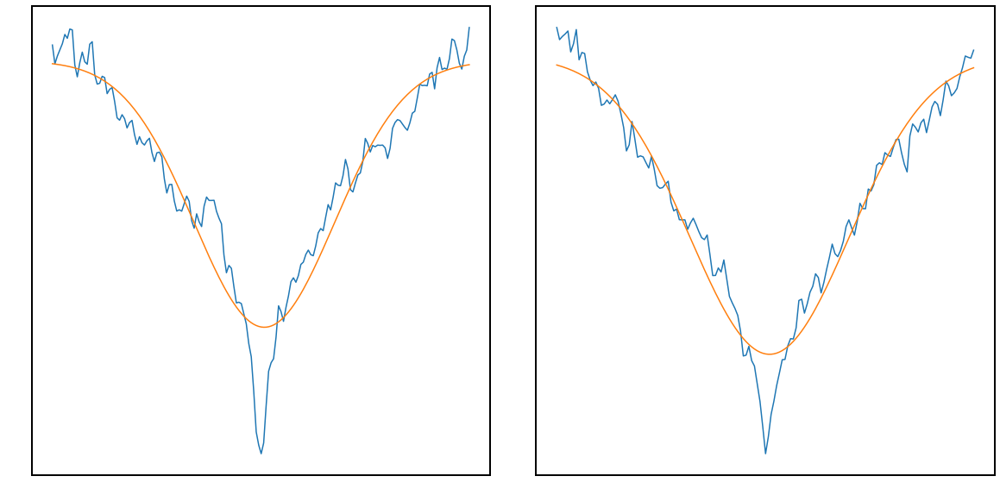

Parameters([('ampB', <Parameter 'ampB', value=-0.15888729505643975 +/- 0.00444, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8171509467572444 +/- 7.08e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=5.12994856471521e-07 +/- 4.21e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5357227748365315 +/- 0.00392, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.2552687370513229 +/- 0.00543, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=6.57587138303016e-07 +/- 4.06e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7724734928326068 +/- 0.00549, bounds=[-inf:inf]>)])


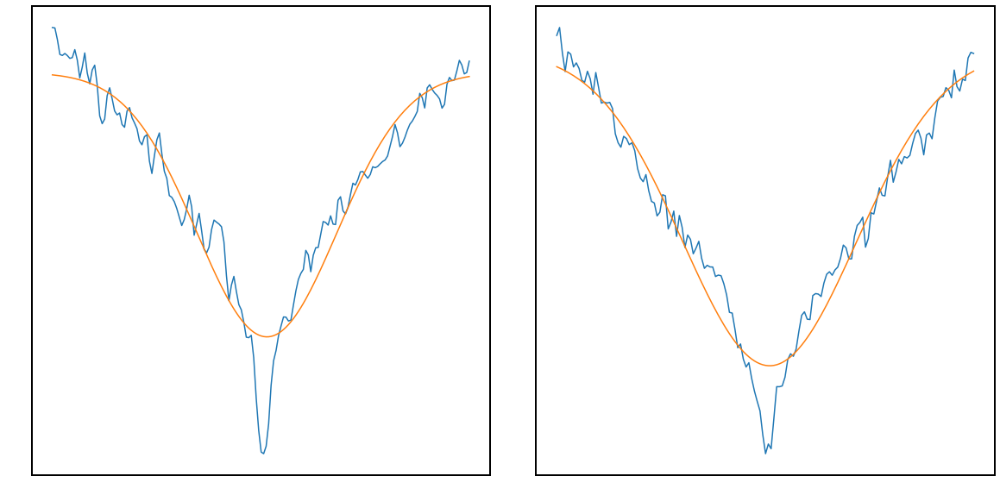

Parameters([('ampB', <Parameter 'ampB', value=-0.15909902529127634 +/- 0.00425, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8171518587875943 +/- 6.84e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=5.073182824803721e-07 +/- 3.98e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5377713609522635 +/- 0.00373, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.265093102874114 +/- 0.00624, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=7.812392264598136e-07 +/- 5.07e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7876322675114455 +/- 0.00667, bounds=[-inf:inf]>)])


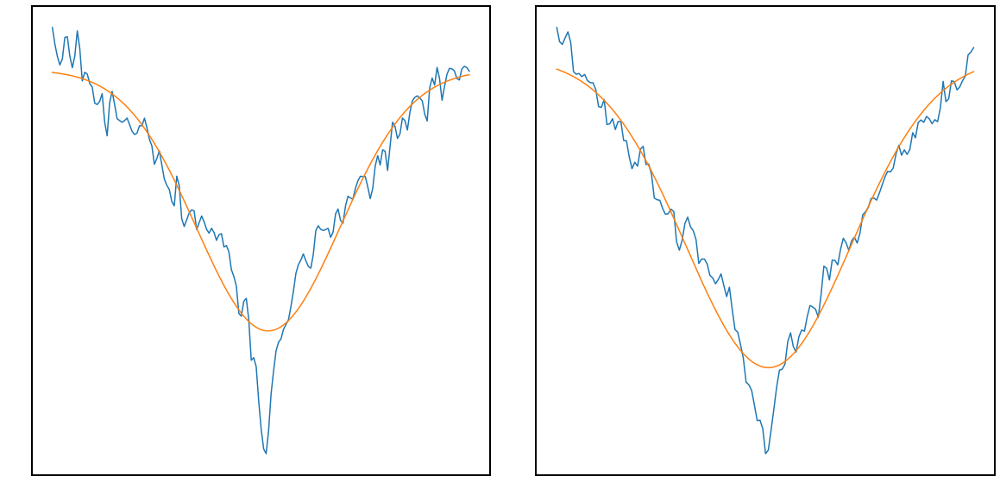

Parameters([('ampB', <Parameter 'ampB', value=-0.16050046362013737 +/- 0.00429, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.817142933465506 +/- 6.8e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=5.30538298244462e-07 +/- 4.17e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5294919673652059 +/- 0.00387, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.2582915428429621 +/- 0.00555, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=7.06455814129174e-07 +/- 4.33e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7635671535033272 +/- 0.00577, bounds=[-inf:inf]>)])


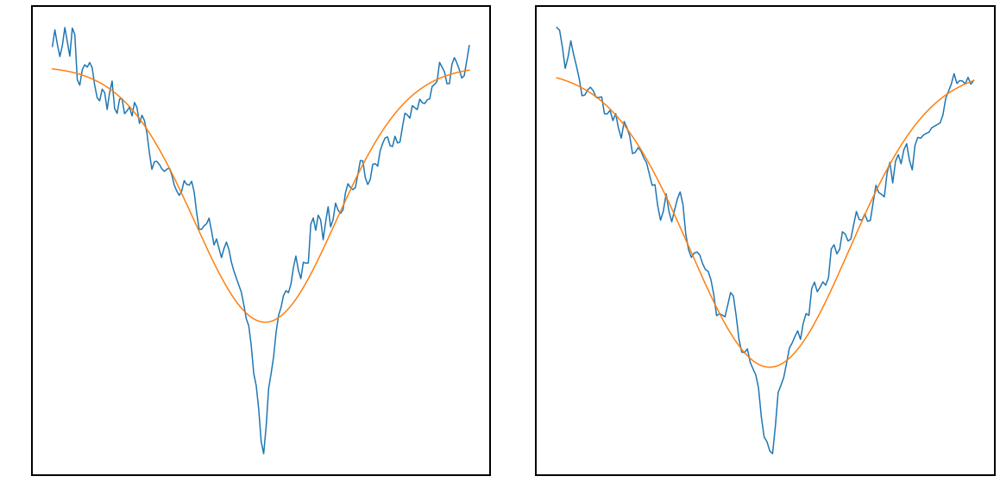

Parameters([('ampB', <Parameter 'ampB', value=-0.15656120237733484 +/- 0.0042, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8171215071961244 +/- 6.89e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=5.176133053103728e-07 +/- 4.09e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5262761594852674 +/- 0.00374, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.24489258718010323 +/- 0.00512, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=6.445907411352312e-07 +/- 3.91e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7522023096644908 +/- 0.00516, bounds=[-inf:inf]>)])


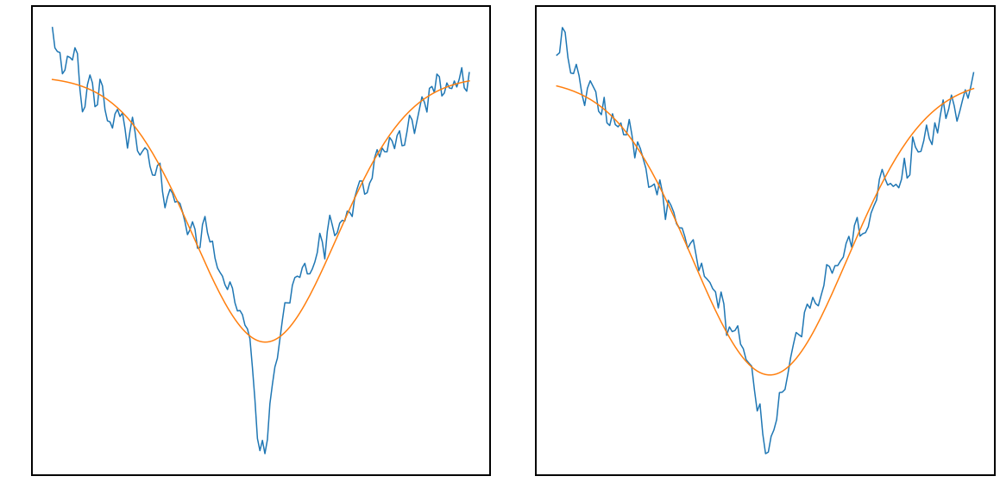

Parameters([('ampB', <Parameter 'ampB', value=-0.15286141004180137 +/- 0.00395, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8171132137967136 +/- 6.57e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=5.244643583896862e-07 +/- 3.99e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5123201798916677 +/- 0.00357, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.23595338591809278 +/- 0.00456, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=6.234503077243719e-07 +/- 3.53e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7249653104112944 +/- 0.0045, bounds=[-inf:inf]>)])


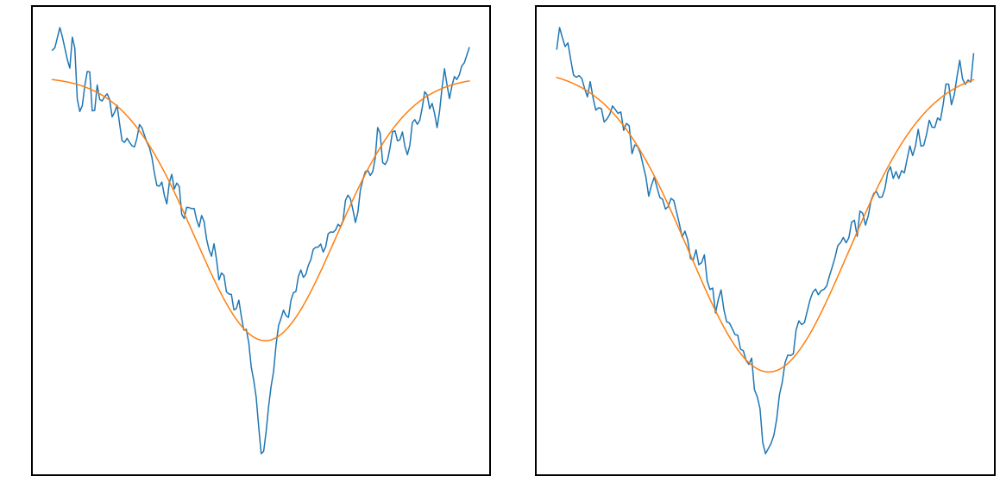

Parameters([('ampB', <Parameter 'ampB', value=-0.1568093522598444 +/- 0.00398, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8171051075495037 +/- 6.54e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=5.191890337307164e-07 +/- 3.88e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5234016713902886 +/- 0.00355, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.24433844843990757 +/- 0.00483, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=6.521940824862406e-07 +/- 3.74e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7405422814762213 +/- 0.00486, bounds=[-inf:inf]>)])


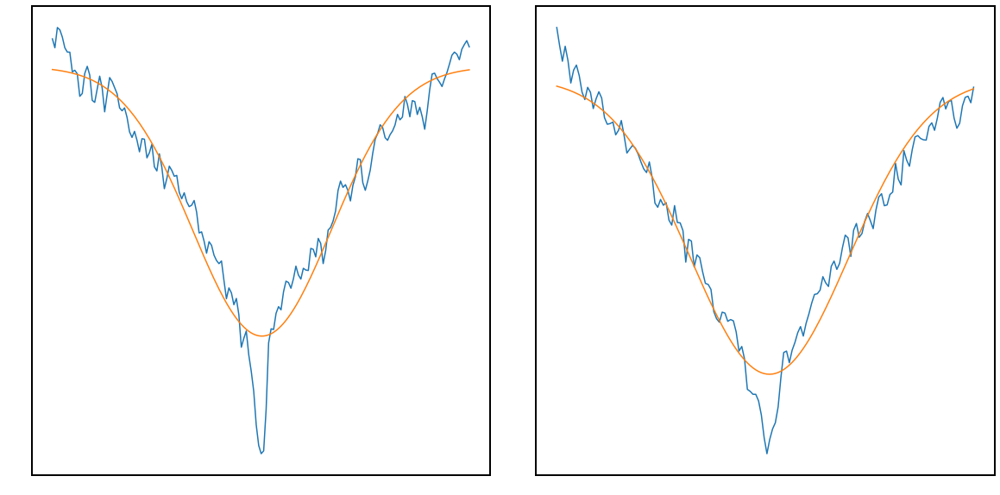

Parameters([('ampB', <Parameter 'ampB', value=-0.15766579253271606 +/- 0.00374, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8170801699251165 +/- 6.26e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=4.983017786491233e-07 +/- 3.46e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.519406986428494 +/- 0.00324, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.23901682786800726 +/- 0.00459, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=6.412217342688237e-07 +/- 3.58e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7293895715236606 +/- 0.00461, bounds=[-inf:inf]>)])


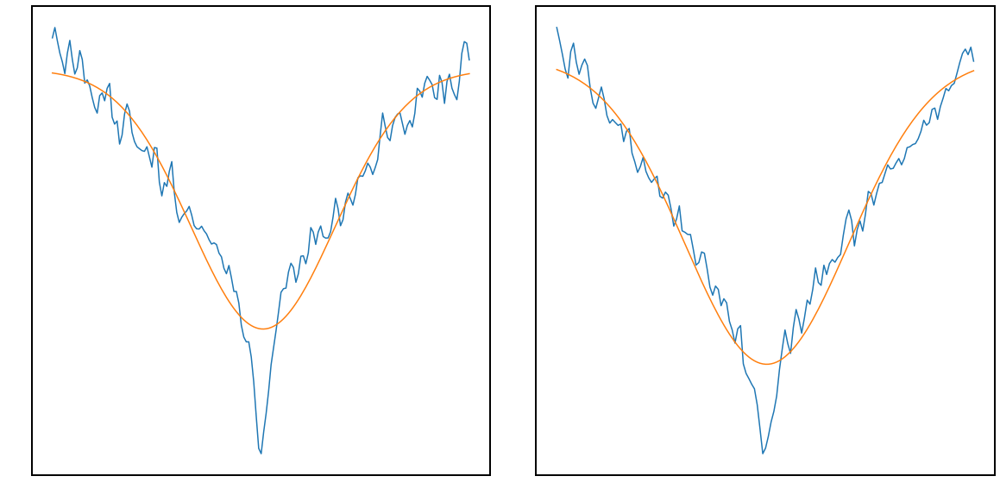

Parameters([('ampB', <Parameter 'ampB', value=-0.14888115833527538 +/- 0.00394, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.817070675656991 +/- 6.82e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=5.367141764232542e-07 +/- 4.19e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.502311276308879 +/- 0.00359, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.2317269454242337 +/- 0.00499, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=6.9571714412037e-07 +/- 4.3e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7158311789596347 +/- 0.00517, bounds=[-inf:inf]>)])


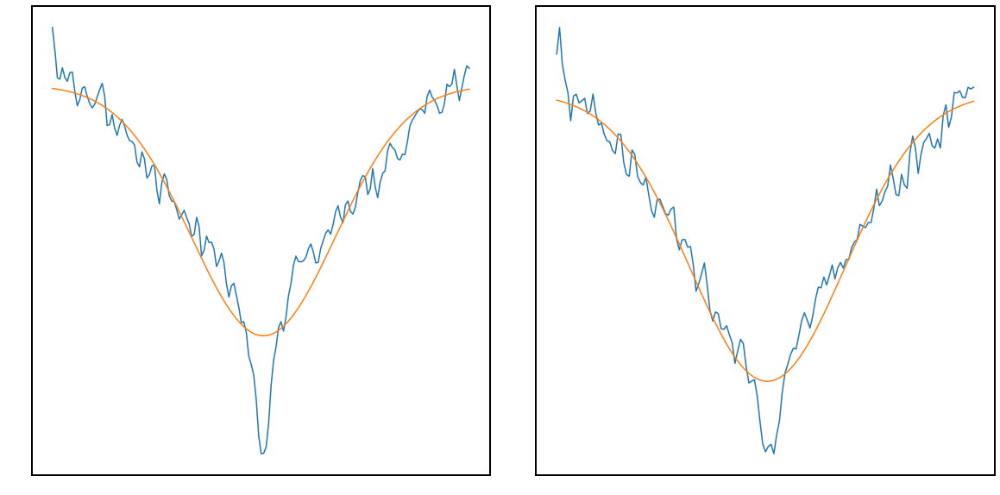

Parameters([('ampB', <Parameter 'ampB', value=-0.15468662187014937 +/- 0.00421, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8170548326361016 +/- 7.04e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=5.365078783874821e-07 +/- 4.3e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5087453237748942 +/- 0.00383, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.23240186388500134 +/- 0.00485, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=6.211755996720932e-07 +/- 3.79e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7104728255644653 +/- 0.00478, bounds=[-inf:inf]>)])


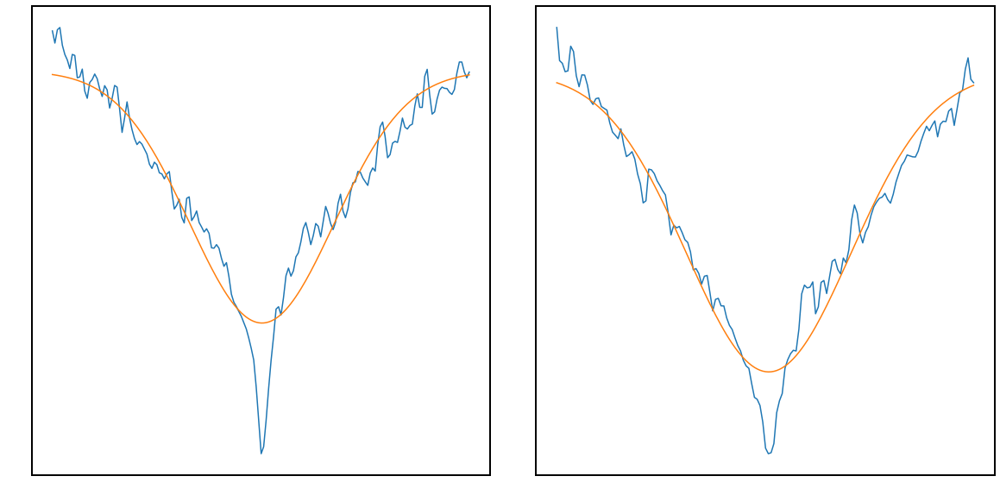

Parameters([('ampB', <Parameter 'ampB', value=-0.15520407427067615 +/- 0.00431, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8170448930266696 +/- 7.17e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=5.38115034860671e-07 +/- 4.41e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5189331451359984 +/- 0.00393, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.24097244072158186 +/- 0.00546, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=6.967152507661676e-07 +/- 4.52e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7335810786249393 +/- 0.00565, bounds=[-inf:inf]>)])


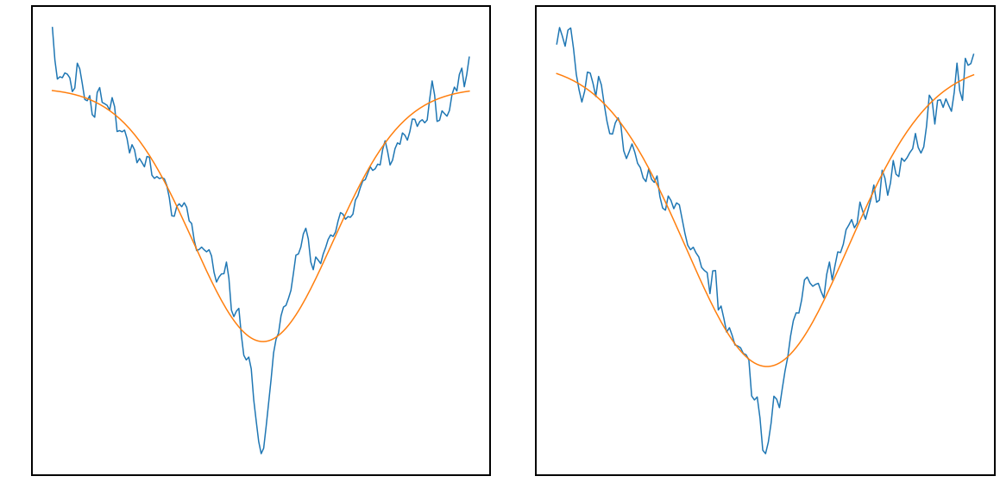

Parameters([('ampB', <Parameter 'ampB', value=-0.15125392531105838 +/- 0.0042, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8170520759748454 +/- 7.13e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=5.057255076796411e-07 +/- 4.12e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5151719877955149 +/- 0.00368, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.24243706866740797 +/- 0.00536, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=6.850727644885441e-07 +/- 4.36e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7320991945245079 +/- 0.00552, bounds=[-inf:inf]>)])


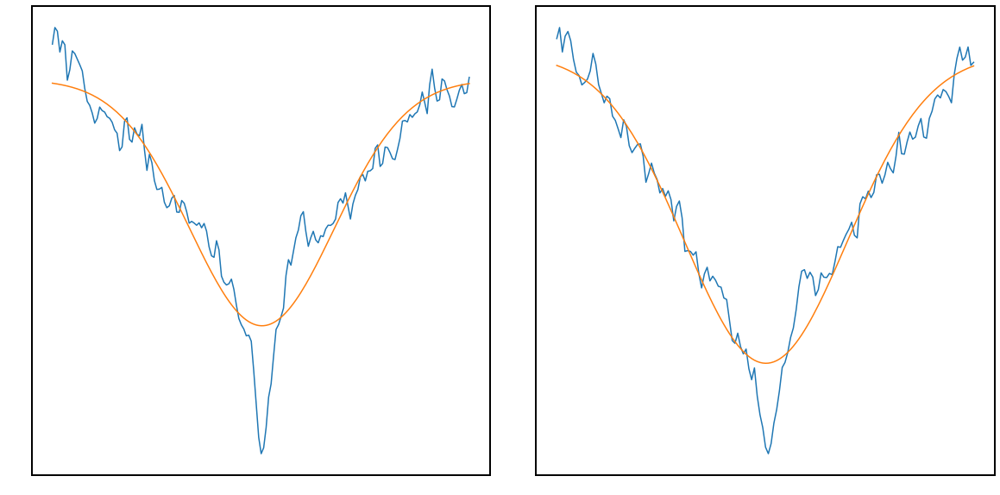

Parameters([('ampB', <Parameter 'ampB', value=-0.1514016556606368 +/- 0.00444, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8170447518754553 +/- 7.54e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=5.400450709525417e-07 +/- 4.67e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5117025069493598 +/- 0.00406, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.23485089638730552 +/- 0.00553, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=6.847546730942586e-07 +/- 4.64e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7262026403285774 +/- 0.00568, bounds=[-inf:inf]>)])


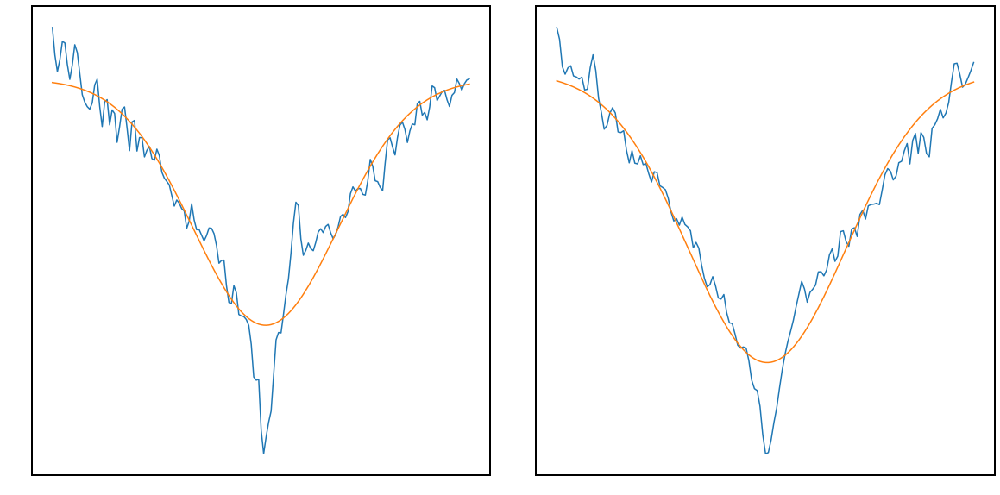

Parameters([('ampB', <Parameter 'ampB', value=-0.14697535236482298 +/- 0.00452, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.817053638065232 +/- 7.73e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=5.444756248380494e-07 +/- 4.93e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5051240548445134 +/- 0.00414, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.23116023651527362 +/- 0.00533, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=6.469191624375641e-07 +/- 4.34e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7128315584251548 +/- 0.00535, bounds=[-inf:inf]>)])


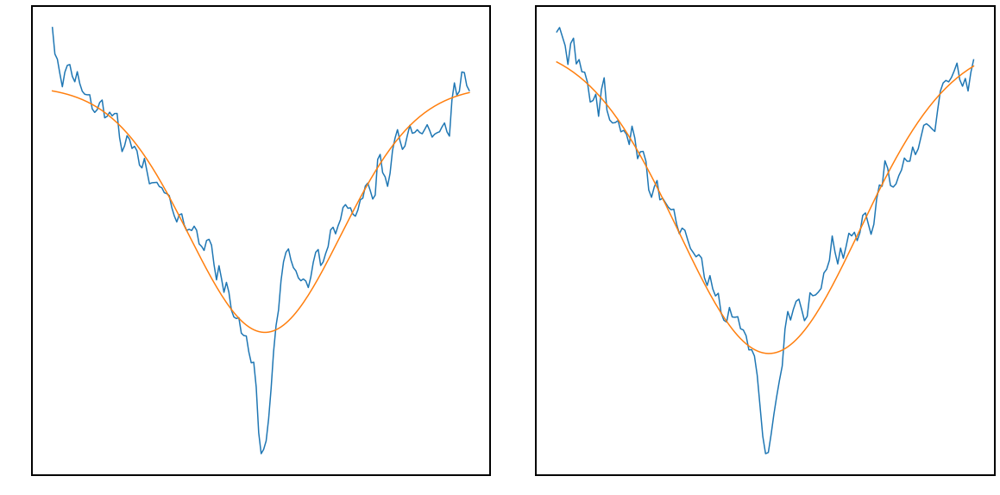

Parameters([('ampB', <Parameter 'ampB', value=-0.14669540420238827 +/- 0.00443, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8170659855885587 +/- 7.35e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=5.952305355493102e-07 +/- 5.28e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5120680388331792 +/- 0.00427, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.24473343368730688 +/- 0.0067, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=8.497492923291166e-07 +/- 6.18e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7365001534219566 +/- 0.00727, bounds=[-inf:inf]>)])


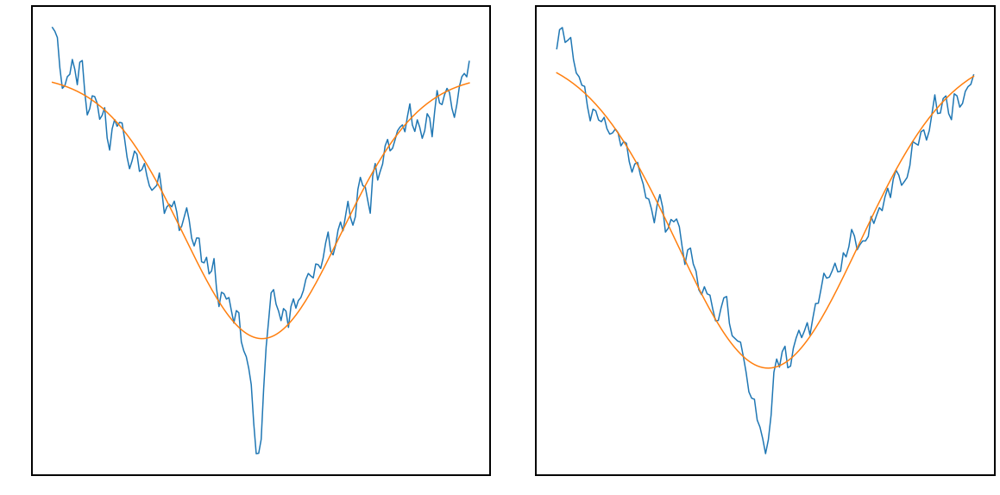

Parameters([('ampB', <Parameter 'ampB', value=-0.14409673819073568 +/- 0.00387, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8170807806099667 +/- 6.3e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=6.366252737067045e-07 +/- 4.99e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5076568102786059 +/- 0.00386, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.23949792358463515 +/- 0.00569, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=8.613869495599809e-07 +/- 5.4e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7275940238267697 +/- 0.00618, bounds=[-inf:inf]>)])


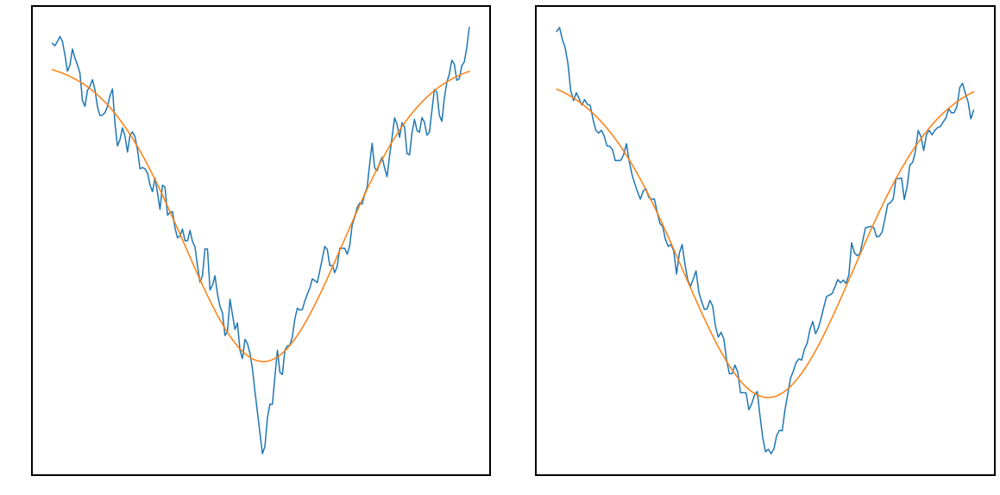

Parameters([('ampB', <Parameter 'ampB', value=-0.15114000373176167 +/- 0.00349, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8170996338816736 +/- 5.39e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=6.469973260551629e-07 +/- 4.34e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5193458565523115 +/- 0.00352, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.23498463335805653 +/- 0.0042, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=7.507100962178823e-07 +/- 3.76e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7321870492285507 +/- 0.00445, bounds=[-inf:inf]>)])


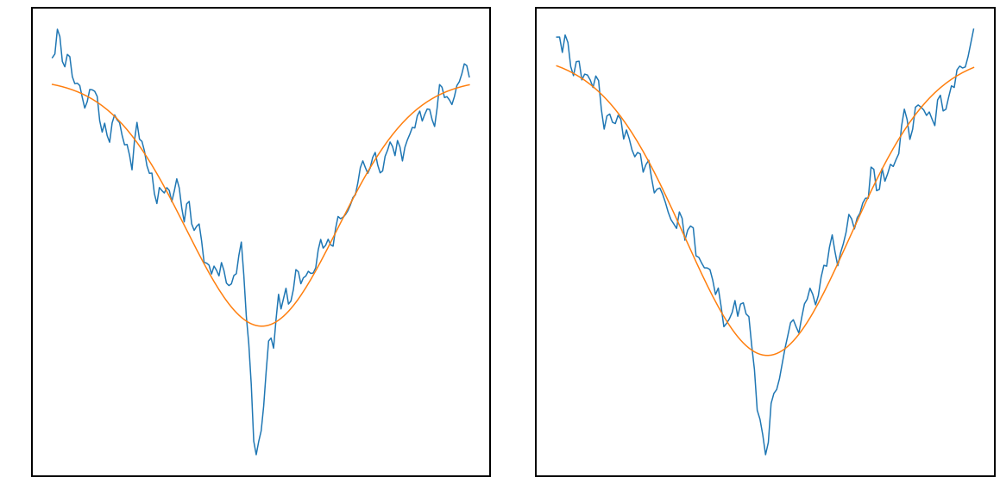

Parameters([('ampB', <Parameter 'ampB', value=-0.143296438306924 +/- 0.00414, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8171148807415403 +/- 6.98e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=5.938786831738533e-07 +/- 5.05e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5090933162218206 +/- 0.00399, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.23043040278552798 +/- 0.00505, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=7.075871556921956e-07 +/- 4.42e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7211778368059648 +/- 0.00525, bounds=[-inf:inf]>)])


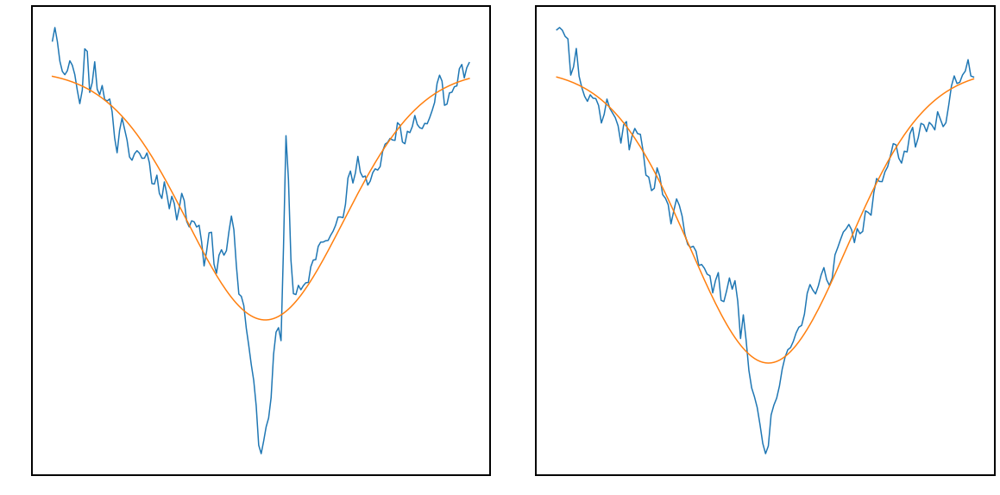

Parameters([('ampB', <Parameter 'ampB', value=-0.143932446400643 +/- 0.00511, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.817122492222071 +/- 8.23e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=6.281652615450334e-07 +/- 6.51e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5111441318938659 +/- 0.00506, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.22788301192773505 +/- 0.00547, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=6.383620464828261e-07 +/- 4.47e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7103205122257056 +/- 0.00546, bounds=[-inf:inf]>)])


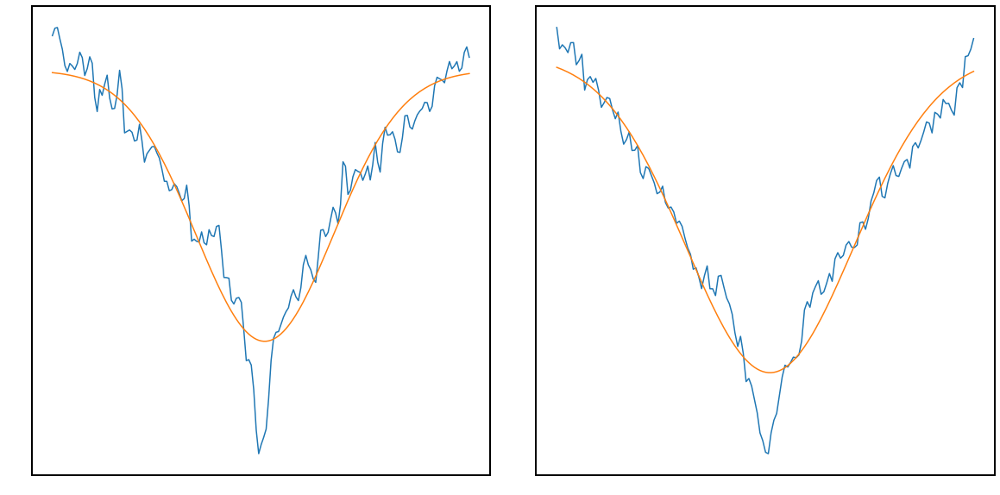

Parameters([('ampB', <Parameter 'ampB', value=-0.15140195753058516 +/- 0.00375, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.817153800006446 +/- 6.59e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=4.899054839384022e-07 +/- 3.55e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.505341372918431 +/- 0.00321, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.23521630595866355 +/- 0.00509, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=7.223995161818551e-07 +/- 4.43e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7157537785155768 +/- 0.00532, bounds=[-inf:inf]>)])


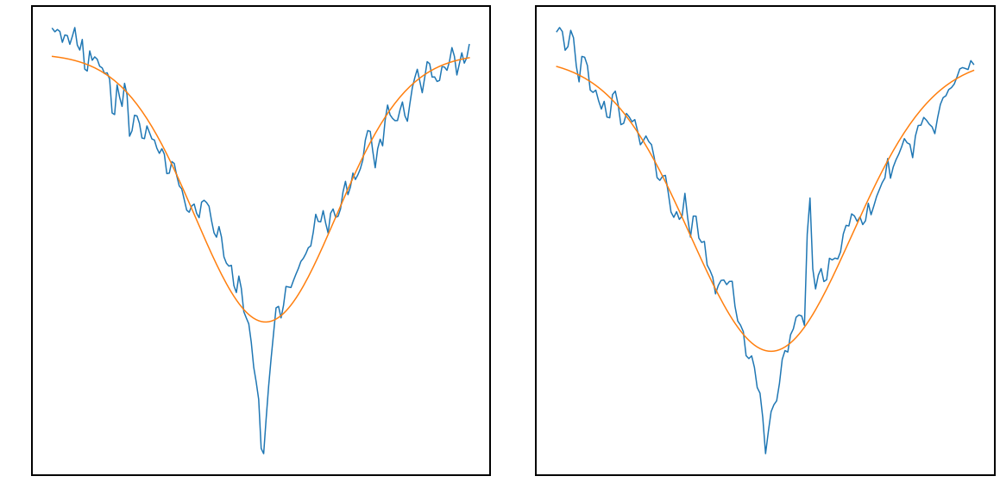

Parameters([('ampB', <Parameter 'ampB', value=-0.15429646660846083 +/- 0.00412, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8171418518989064 +/- 7.11e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=5.146762907650772e-07 +/- 4.04e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5114563773575544 +/- 0.00365, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.2308069799963185 +/- 0.00512, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=6.715158689420837e-07 +/- 4.3e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7205056141364901 +/- 0.00522, bounds=[-inf:inf]>)])


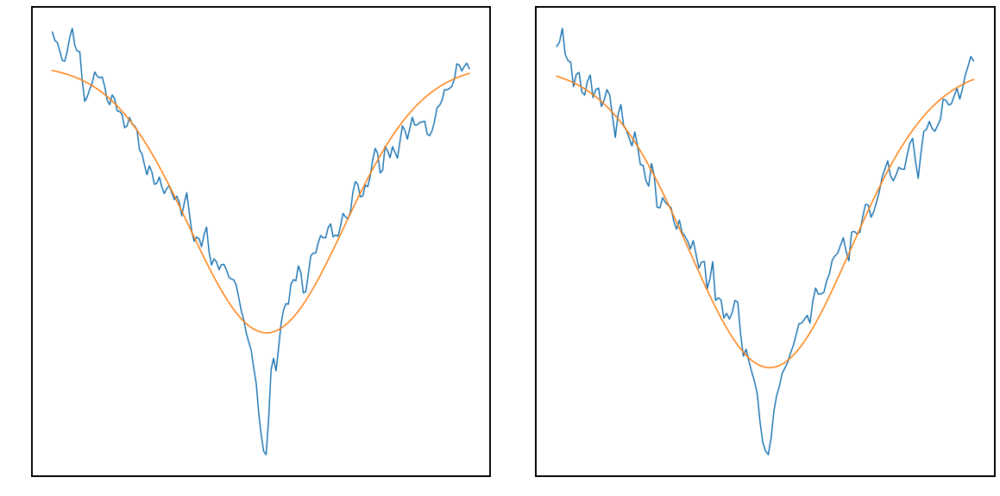

Parameters([('ampB', <Parameter 'ampB', value=-0.154365757824656 +/- 0.00417, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.817132024447246 +/- 6.73e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=6.17209356181341e-07 +/- 4.88e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.508842597693272 +/- 0.00409, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.2272894738333436 +/- 0.00478, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=6.808493979412097e-07 +/- 4.12e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7061216908175229 +/- 0.00489, bounds=[-inf:inf]>)])


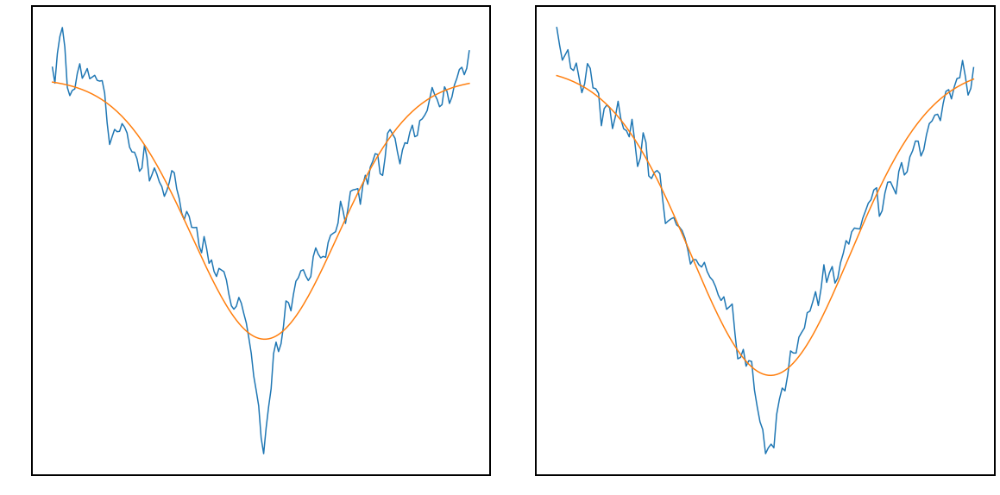

Parameters([('ampB', <Parameter 'ampB', value=-0.15546594174997586 +/- 0.0038, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8171176759783076 +/- 6.4e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=5.470630229577763e-07 +/- 3.94e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.5104475394090575 +/- 0.0035, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.23058662901357435 +/- 0.00454, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=6.594789130687906e-07 +/- 3.76e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7072391572227318 +/- 0.00459, bounds=[-inf:inf]>)])


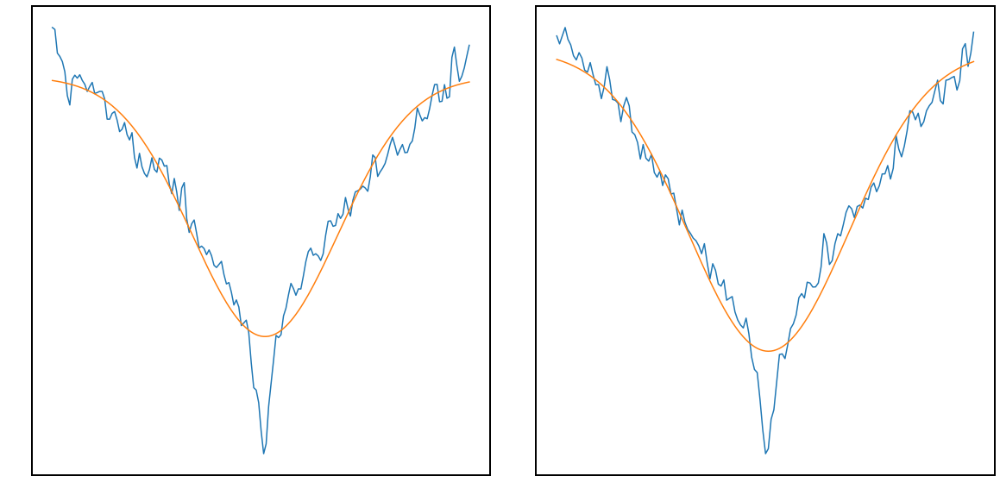

Parameters([('ampB', <Parameter 'ampB', value=-0.15637612644574025 +/- 0.00396, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8171025833040915 +/- 6.65e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=5.524969375605903e-07 +/- 4.12e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.510649515749969 +/- 0.00367, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.23023659658627396 +/- 0.00476, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=6.673897405973007e-07 +/- 3.99e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7053292799024907 +/- 0.00485, bounds=[-inf:inf]>)])


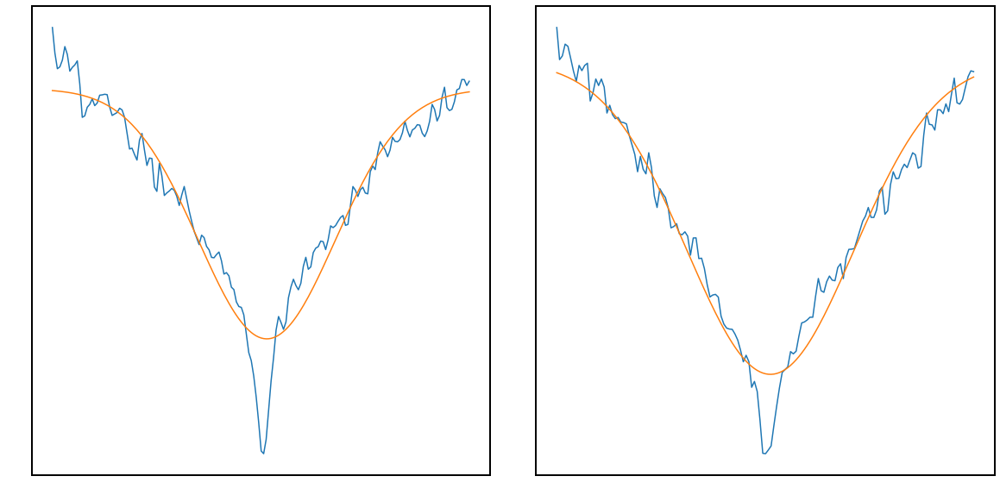

Parameters([('ampB', <Parameter 'ampB', value=-0.1479076191543963 +/- 0.0036, bounds=[-inf:inf]>), ('cen', <Parameter 'cen', value=3.8170974555935153 +/- 6.45e-06, bounds=[3.8168:inf]>), ('widB', <Parameter 'widB', value=4.854309316677642e-07 +/- 3.46e-08, bounds=[-inf:inf]>), ('offB', <Parameter 'offB', value=0.49507455574917586 +/- 0.00307, bounds=[-inf:inf]>), ('ampG', <Parameter 'ampG', value=-0.23211122020970618 +/- 0.00487, bounds=[-inf:inf]>), ('widG', <Parameter 'widG', value=7.172564641306839e-07 +/- 4.27e-08, bounds=[-inf:inf]>), ('offG', <Parameter 'offG', value=0.7073399589051749 +/- 0.00508, bounds=[-inf:inf]>)])


In [9]:
#WD0137

def fit_function(params, x2=None, x3=None, dat2=None, dat3=None):
    #1 is alpha 6562.801
    #4861.363 be -0.13033118436
    #ga 4340.472
    model2 = gaussian(x2, params['ampB'], params['cen']-0.13033118436, params['widB'], params['offB']) #beta
    model3 = gaussian(x3, params['ampG'], params['cen']-0.17955227662, params['widG'], params['offG'])
    resid2 = dat2 - model2
    resid3 = dat3 - model3
    return np.concatenate((resid2, resid3))



path = '/home/nwal/Desktop/binaries/WD0137349XSHOOTER/'
fluxes = []
wavels = []
count = 0
with open(path+'files') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        wvl, flx = pyasl.read1dFitsSpec(line)
        wvl = 10*wvl
        flx = flx/np.median(flx)
        fluxes.append(flx)
        wavels.append(np.log10(wvl))
        count = count+1
    path = '/home/nwal/Desktop/binaries/WD0137349XSHOOTER/'
dates2 = []
with open(path+'files') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        hdul = fits.open(line)
        dates2.append(hdul[0].header['MJD-OBS'])
        hdul.close()
        
count = 0
wavelsAng = np.array(wavels)


offset = 0.6
ampl = -0.2

params = Parameters()
params.add('ampB', value = ampl)
params.add('cen', value=3.81717, min=3.8168)
params.add('widB', value=0.0000005)
params.add('offB', value=offset)
params.add('ampG', value = -0.4)
params.add('widG', value=0.0000005)
params.add('offG', value=0.8)





globalOff = []
for el in fluxes:
    #beta
    mod = Model(gaussian)
    indexSt = find_nearest(wavelsAng[count], 3.6862)
    indexFi = find_nearest(wavelsAng[count], 3.6872)
    fluxIn = fluxes[count][indexSt:indexFi+1]
    pixels = wavelsAng[count][indexSt:indexFi+1]
    pars = mod.make_params(amp=ampl,cen=3.6867,wid=0.0000005,off=offset)
    result = mod.fit(fluxIn,pars,x=pixels)
    cenEst = result.params['cen'].value
    indexSt = find_nearest(wavelsAng[count], cenEst-0.0015)
    indexFi = find_nearest(wavelsAng[count], cenEst+0.0015)
    fluxIn = fluxes[count][indexSt:indexFi+1]
    pixels = wavelsAng[count][indexSt:indexFi+1]
    x2Final = pixels
    dat2Final = fluxIn
    #gamma
    indexSt = find_nearest(wavelsAng[count], np.log10(4335))
    indexFi = find_nearest(wavelsAng[count], np.log10(4345))
    fluxIn = fluxes[count][indexSt:indexFi+1]
    pixels = wavelsAng[count][indexSt:indexFi+1]
    
    
    pars = mod.make_params(amp=-0.2,cen=np.log10(4340),wid=0.0000005,off=0.8)
    if count == 4:
        pars.add('cen', value=np.log10(4340), min=np.log10(4331), max=np.log10(4349))
    result = mod.fit(fluxIn,pars,x=pixels)
    cenEst = result.params['cen'].value
    indexSt = find_nearest(wavelsAng[count], cenEst-0.0015)
    indexFi = find_nearest(wavelsAng[count], cenEst+0.0015)
    fluxIn = fluxes[count][indexSt:indexFi+1]
    pixels = wavelsAng[count][indexSt:indexFi+1]
    
    x3Final = pixels
    dat3Final = fluxIn
    out = minimize(fit_function, params, args=(x2Final, x3Final, dat2Final, dat3Final))
    globalOff.append(out.params['cen'].value)
    count = count+1

    rc('axes', linewidth=2)

    fig, axs = plt.subplots(1, 2,
                        gridspec_kw={'hspace': 0.0, 'wspace': 0.1}, figsize=(20,10))
    axs[0].plot(x2Final,dat2Final)
    axs[0].plot(x2Final, gaussian(x2Final, out.params['ampB'], out.params['cen']-0.13033118436, out.params['widB'], out.params['offB'])) #beta
    axs[1].plot(x3Final,dat3Final)
    axs[1].plot(x3Final, gaussian(x3Final, out.params['ampG'], out.params['cen']-0.17955227662, out.params['widG'], out.params['offG'])) 
    plt.show()
    print(out.params)
    print('=========================================')
    #errorsTwo.append(out.params['offsetx'].stderr)
shiftsCen4 = globalOff

In [10]:
esovlt = EarthLocation.from_geodetic(lat=-24.6275*u.deg, lon=-70.4044*u.deg, height=2635*u.m)
sc = SkyCoord("01:39:42.8531448117 -34:42:39.576295162", frame=ICRS, unit=(u.hourangle, u.deg))
baryCorr = []
for el in dates2:
    barycorr = sc.radial_velocity_correction(obstime=Time(el, format='mjd'), location=esovlt)  
    baryCorr.append(barycorr.to(u.km/u.s).value)
print(baryCorr)

[11.549707556623082, 11.542401745753509, 11.535222360694315, 11.527692543345216, 11.520232645223732, 11.512370936441085, 11.50465282110837, 11.496529300214133, 11.488535454746057, 11.480148159735695, 11.471952253428592, 11.463368973309622, 11.444605962051078, 11.435791931919038, 11.427065506214909, 11.418063110733145, 11.409174862790227, 11.400022343007498, 11.390977694665635, 11.381368306942187, 11.372184413392853, 11.362760612433547, 11.35344644275476, 11.343675492138715, 11.306224473858562, 11.296370563747512, 11.286821786813578, 11.276668748627925, 11.267104000002504, 11.257199747174209, 11.247600339885736, 11.237478591791593, 11.227917357253828, 11.218039113733301, 11.208511885831907, 11.198624896899487, 11.175689544863339, 11.166115371839584, 11.156759027517271, 11.147011811670993, 11.13777113608342, 11.128281049605588, 11.119155478794605, 11.109650404157115, 11.10067546382483, 11.091584550145852, 11.082768449970546, 11.073874898211601, 11.222303608014824, 11.214934002575015, 11.

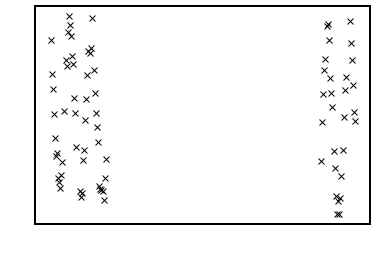

In [11]:
offsetsAlpha = 10**np.array(shiftsCen4)

offsetsAlphaS = offsetsAlpha

halpharest = 6562.801 #air
offsetsAlphaS = (offsetsAlphaS - halpharest)/halpharest
offsetsAlphaS = (offsetsAlphaS)*(299792458/1000)
velocityOGLong = offsetsAlphaS
offsetsAlphaS = offsetsAlphaS + baryCorr

plt.plot(dates2, offsetsAlphaS,'kx')


datesLong = dates2
velocityLong = offsetsAlphaS
barycorrLong = baryCorr

Name     Value      Min      Max   Stderr     Vary     Expr Brute_Step
a     32.65     -inf      inf   0.6978     True     None     None
c  -0.0006396     -inf      inf  0.02004     True     None     None
d      19.1     -inf      inf   0.4761     True     None     None


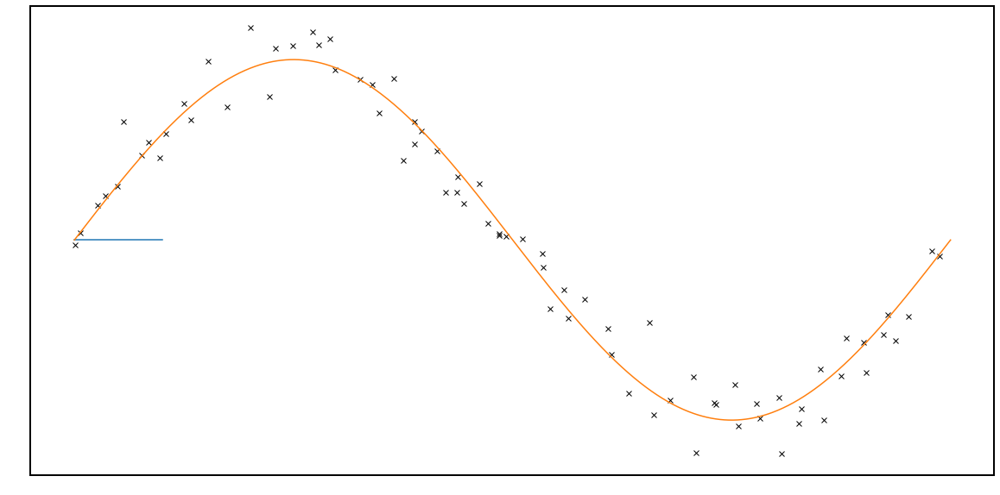

In [12]:
foldFreq = 0.0794300

def sineModelFixed(x,a,c,d):
    return a*np.sin(2*np.pi*x+c)+d

mod = Model(sineModelFixed)
pars = mod.make_params(a=25,c=0,d=20)
#UVESFold = foldMeth(UVEST,0.41574154920793316)




phases = foldMeth(np.array(dates2)+0.0016, foldFreq)
offsetsAlpha = np.array(velocityLong)
#sortIndi = np.argsort(phases)
#phases = phases[sortIndi]
#offsetsAlphaS = offsetsAlpha[sortIndi]

plt.figure(figsize=(20,10))
plt.plot(phases,offsetsAlpha, 'kx')
#plt.xlim(0,0.1)
#plt.ylim(10,30)

plt.plot([0,0.1],[19.1,19.1])
result = mod.fit(offsetsAlpha,pars,x=phases)
TDummy = np.linspace(0,1,1000)
ypointsModel = sineModelFixed(TDummy,result.params['a'].value,result.params['c'].value,result.params['d'].value)
result.params.pretty_print()
plt.plot(TDummy,ypointsModel)
offsetsAlphaOG = offsetsAlpha
phasesOG = phases
#plt.savefig('GD1400HAlphaSGUn.pdf')
plt.show()

In [97]:
for el in phases:
    print(el)

0.3643214025769015
0.41405351893669956
0.4619392673887151
0.5111979101730885
0.5591024802074652
0.6086976332376295
0.6565673424305443
0.706142074871472
0.7541764825053704
0.8038372026036076
0.8516894373151643
0.9011417727232219
0.007128729715666156
0.056018544654473874
0.10391596376815118
0.15284075286026225
0.20069741909992503
0.2495492257478988
0.2974336019083241
0.3479177010828416
0.3958238449335064
0.4446655671939971
0.4926548029752674
0.5427250031223381
0.7326009694237289
0.7821596626055558
0.8300760166134358
0.8809360695468353
0.9287912627325589
0.9783120357448062
0.026301271551813128
0.07692086118522946
0.12478039786940688
0.17429684002429502
0.22214616645965526
0.27192491508492583
0.38803555337000106
0.43683501196245816
0.4847513659703381
0.5349381719716773
0.5827991565192067
0.6322689664086223
0.6801722145325831
0.7304494019792581
0.7783132696123969
0.8272176633974607
0.8750844769552737
0.9238489865850147
0.9376724285951082
0.987368085106569
0.03542287552375855
0.0847061312522

In [31]:
for el in phases:
    print(el)
ypointsModel = sineModelFixed(phases,result.params['a'].value,result.params['c'].value,result.params['d'].value)

for el in ypointsModel:
    print(el)

43.692936165574096
35.901745782131684
26.851548364826257
16.82371464649368
7.2704672079749475
-1.4896096734888644
-8.072025497986608
-12.312155367768423
-13.538913711537305
-11.706416471450598
-7.121744225354512
0.0812020264397546
20.53896693499223
30.33373344297116
38.91519533249569
45.83679931609413
50.185278479416
51.74543715823778
50.312513794026586
45.77135085984891
38.99074460800821
30.241167990576713
20.62508114301172
10.458825101112337
-13.352431278194913
-12.889558555082957
-9.513875334969178
-3.1257795186858424
4.95454106195263
14.64218670076957
24.448079551009066
34.251206461192524
42.13668805664561
48.111912465080266
51.24328481152525
51.439204260150284
40.233222359286216
31.736904565541494
22.24199912455197
12.008929924357052
2.8873247191403024
-5.0031724239361886
-10.448581609262973
-13.301033431574652
-13.038056875035828
-9.791632466522145
-3.989869643630165
4.047765726435136
6.617676917809355
16.48869903690947
26.28411419497357
35.647075770272735
43.259315210576915
51.4

In [32]:
path = '/home/nwal/Desktop/binaries/WD0137349XSHOOTER/'
snrArray = []
with open(path+'files') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        wvl, flx = pyasl.read1dFitsSpec(line)
        spectrum = Spectrum1D(spectral_axis=10*wvl* u.AA, flux=flx* u.Jy)
        der = snr_derived(spectrum)
        print(der)
        snrArray.append(der)

60.04434358178495
65.45944493264692
71.06973139582817
67.80374496424669
69.68055228112307
74.06271464465638
76.27546761383246
69.32059971006196
71.29314393608654
73.96662458235863
75.25222487829477
77.03223450278117
76.45342417466166
73.87951183248379
71.63861585341748
77.30787837603667
73.0549772312635
76.60935183160174
75.7779695662102
77.57854588577575
77.34725796407123
78.66328330506677
74.5781268428107
78.2723944847914
72.59990384668951
73.81823019057491
75.65763414894907
74.36615919189497
76.71901217393966
76.53488772038796
77.71229245885867
78.28164104322326
74.52181273092825
78.55172243514342
74.71073786630862
77.41074436647145
80.30449260952483
80.88805598539358
83.50874811339982
80.90206445604552
79.5373216006507
77.41972076470724
76.09988063871315
68.96611540503272
71.00046740805396
74.37938759177814
75.31369764869766
72.90288636439814
71.11995190483243
69.73549784922164
74.14233392825537
73.74061476128787
73.0867173177852
75.0149330547216
77.79248236274856
78.52344848071975

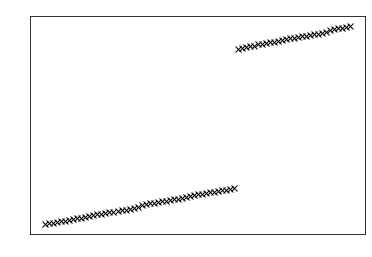

In [5]:
path = '/home/nwal/Desktop/binaries/WD0137349XSHOOTER/'
dates2 = []
with open(path+'files') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        hdul = fits.open(line)
        dates2.append(hdul[0].header['MJD-OBS'])
        hdul.close()
plt.plot(dates2, 'kx')

In [33]:
#shifts from H beta/gamma
path = '/home/nwal/Desktop/binaries/WD0137349XSHOOTER/'
fluxes = []
wavels = []
count = 0
with open(path+'files') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        wvl, flx = pyasl.read1dFitsSpec(line)
        wvl = 10*wvl
        flx = flx/np.median(flx)
        fluxes.append(flx)
        wavels.append(np.log10(wvl))
        count = count+1
path = '/home/nwal/Desktop/binaries/WD0137349XSHOOTER/'
dates2 = []
with open(path+'files') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        hdul = fits.open(line)
        dates2.append(hdul[0].header['MJD-OBS'])
        hdul.close()

count=0
wavelsAng = np.array(wavels)



shift = np.array([0.465377898012885,0.352680822687893,0.22175369111039,0.076677163356329,-0.061529192636895,-0.188246005679425,-0.283436162865099,-0.344708234093867,-0.362353819818482,-0.335701021588479,-0.269204300626155,-0.164793928884861,0.131670487790858,0.273609237553881,0.397980185278718,0.498323278980952,0.561410361123187,0.584131248180637,0.563515969555841,0.497906978320005,0.399868589221529,0.273326417000895,0.134237102959696,-0.01281108999676,-0.357014333216019,-0.350170077440542,-0.301157819976369,-0.208522335039093,-0.091394902298269,0.04900870870816,0.191119919030867,0.333198647623003,0.447505099179647,0.534158947648779,0.579633697729599,0.582613415362587,0.420702403074486,0.297829155963769,0.160494945689588,0.012479071015995,-0.119452077076888,-0.23355531449422,-0.312263222607465,-0.353424133275537,-0.349486750966104,-0.302352565430299,-0.218225514773095,-0.101725808655591,-0.066666965085026,0.076354920814165,0.218280714144245,0.353950105220651,0.464271191328764,0.583343430883374,0.579993892658459,0.534372488760761,0.448732088603026,0.334564010425468,0.197390165239029,-0.068218288724139,-0.192401932132546,-0.284782098280321,-0.341724543039364,-0.356096611696913,-0.326493618061034,-0.257177064121439,-0.152133555614013,-0.02431405850667,0.118766364563667,0.259136693605155,0.388708091020199,0.574305124488743,0.516682452294904,0.42340496076421,0.30022236243224,0.162727172636342,0.017548924380158])
adjWvl = []
count = 0
for el in wavels:
    
    newW = 10**el-shift[count]
    adjWvl.append(newW)
    count = count + 1
count = 0

for el in adjWvl:
    nameFile = str(count)+'ShiftedWD01.fits'
    pyasl.write1dFitsSpec(nameFile, fluxes[count]*snrArray[count].value, wvl=el, clobber=True)
    count = count +1


# write out the recipe with spreadsheet and dispcor

In [36]:
wvl, flx = pyasl.read1dFitsSpec('/home/nwal/Desktop/binaries/WD0137349XSHOOTER/shiftedFixedSNR/coAddShifted.fits')
spectrum = Spectrum1D(spectral_axis=wvl* u.AA, flux=flx* u.Jy)
der = snr_derived(spectrum)
print(der)

wvl, flx = pyasl.read1dFitsSpec('/home/nwal/Desktop/binaries/WD0137349XSHOOTER/shifted/coAddShifted.fits')
spectrum = Spectrum1D(spectral_axis=wvl* u.AA, flux=flx* u.Jy)
der = snr_derived(spectrum)
print(der)


720.538458205894
475.2793095075292


In [3]:
path = '/home/nwal/Desktop/GD1400/reflexFin/'
snrArray = []
with open(path+'blues') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        wvl, flx = pyasl.read1dFitsSpec(line)
        spectrum = Spectrum1D(spectral_axis=10*wvl* u.AA, flux=flx* u.Jy)
        der = snr_derived(spectrum)
        print(der)
        snrArray.append(der)

19.830451359726037
20.80018840525992
19.91792024546631
20.50929957148572
18.12905978152686
18.030605621516056
16.204370483020703
17.341354237943698
18.82991581362036
19.12362434004743
16.454952879181526
18.029551983642623
10.929083897624563
11.676986415311147
12.514014713435742
16.21571511663854
22.38759790259315
21.80089228870742
22.50751501884827
21.354698262507423
12.448707433829645
16.71777647248783
15.386575080707441
15.945624798878871
13.309552422499035
12.915553024896232
13.954866272473755
16.126420424147767


In [4]:
#GD1400
#jumphere
#shifts from H beta/gamma
path = '/home/nwal/Desktop/GD1400/reflexFin/'
fluxes = []
wavels = []
count = 0
with open(path+'blues') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        wvl, flx = pyasl.read1dFitsSpec(line)
        flx = flx/np.median(flx)
        fluxes.append(flx)
        wavels.append(np.log10(wvl))
        count = count+1
path = '/home/nwal/Desktop/GD1400/reflexFin/'
dates2 = []
with open(path+'blues') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        hdul = fits.open(line)
        dates2.append(hdul[0].header['MJD-OBS'])
        hdul.close()

count=0
wavelsAng = np.array(wavels)



shift = np.array([-0.85380018262486,-1.17094815586221,-3.00311066752409,-3.01393141899095,2.4413905985176,2.26977396225398,1.17320854560577,0.86581653097771,2.74729442990551,2.68441190463046,-1.74273289104444,-1.45670386633513,1.62090513345632,1.87871498616986,0.124141437091575,-0.209928886422304,-1.34956179690354,-1.6391619048506,-1.90986571983053,-2.15179836357558,0.907383335878213,1.21755810198525,-0.991876483613769,-1.29531074252638,-2.24793459102526,-2.02634627998334,0.262251428759074,0.593357627415621])
adjWvl = []
count = 0
for el in wavels:
    
    newW = 10**el-shift[count]
    adjWvl.append(newW)
    count = count + 1
count = 0

for el in adjWvl:
    nameFile = str(count)+'ShiftedGD1400BDFrame.fits'
    pyasl.write1dFitsSpec(nameFile, fluxes[count]*snrArray[count].value, wvl=el, clobber=True)
    count = count +1


# write out the recipe with spreadsheet and dispcor

/home/nwal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:28: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


In [39]:
#GD1400
#jumphere
#shifts from H beta/gamma
path = '/home/nwal/Desktop/GD1400/reflexFin/'
fluxes = []
wavels = []
count = 0
with open(path+'blues') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        wvl, flx = pyasl.read1dFitsSpec(line)
        flx = flx/np.median(flx)
        fluxes.append(flx)
        wavels.append(np.log10(wvl))
        count = count+1
path = '/home/nwal/Desktop/GD1400/reflexFin/'
dates2 = []
with open(path+'blues') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        hdul = fits.open(line)
        dates2.append(hdul[0].header['MJD-OBS'])
        hdul.close()

count=0
wavelsAng = np.array(wavels)



shift = np.array([0.432655552001015,0.448844939400572,0.531072782130046,0.541725093667651,-0.022022298998987,-0.012634458786604,0.105732562903504,0.237673155506493,-0.136079353739361,-0.033954063698728,0.397305390277368,0.392642179824008,0.010130270002425,0.025140434427359,0.240112439198888,0.262300755175668,0.466263028692041,0.494631450324662,0.503776000009181,0.565841667131891,0.369789907868296,0.181885716697949,0.429937642760051,0.535001115685176,0.708501097526096,0.659089212249858,0.418563269181392,0.395718045899583])
adjWvl = []
count = 0
for el in wavels:
    
    newW = 10**el-shift[count]
    adjWvl.append(newW)
    count = count + 1
count = 0

for el in adjWvl:
    nameFile = str(count)+'ShiftedGD1400.fits'
    pyasl.write1dFitsSpec(nameFile, fluxes[count]*snrArray[count].value, wvl=el, clobber=True)
    count = count +1


# write out the recipe with spreadsheet and dispcor

/home/nwal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:28: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


In [41]:
wvl, flx = pyasl.read1dFitsSpec('/home/nwal/Desktop/GD1400/reflexFin/shiftedFixedSNR/coAddShifted.fits')
spectrum = Spectrum1D(spectral_axis=wvl* u.AA, flux=flx* u.Jy)
der = snr_derived(spectrum)
print(der)

wvl, flx = pyasl.read1dFitsSpec('/home/nwal/Desktop/GD1400/reflexFin/shifted/coAddShifted.fits')
spectrum = Spectrum1D(spectral_axis=wvl* u.AA, flux=flx* u.Jy)
der = snr_derived(spectrum)
print(der)


114.89677479479518
93.79898078248652


In [3]:
path = '/home/nwal/Desktop/binaries/WD0137UVES/'
snrArray = []
with open(path+'Bs') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        wvl, flx = pyasl.read1dFitsSpec(line)
        spectrum = Spectrum1D(spectral_axis=wvl* u.AA, flux=flx* u.Jy)
        der = snr_derived(spectrum)
        print(der)
        snrArray.append(der)
        
print(np.mean(snrArray))

13.920658753251033
13.823054831399322
13.880139326346535
15.383264375888695
16.129860524899122
15.514192701223804
15.721850212494523
15.874868262890265
15.754232101599124
15.404284936238005
16.741389057689616
16.61672338180712
16.517056081058364
16.76667847283127
15.954884423880127
16.092247038874817
16.26059356643585
16.401577597982072
16.25807259861042
16.03920226103853
15.135311142982138
15.215014283443939
16.55360297441561
16.799581875921778
15.926573662371275
16.579525242828755
17.27615828209086
16.75538877223446
15.220787017254153
14.968612611849744
11.363984714145335
10.478972266770135
13.746919858044746
13.008865155024822
13.207256629230661
12.321004415875311
12.482806602044537
13.466452346253073
13.549931246968029
12.61624625801427
19.20137194031257
18.86758221950754
18.564937364329595
18.634962052283072
18.904023423538234
18.956074781176635
18.7808246342407
19.0550496696149
18.432881183039534
18.719886059935046
15.37265881393658
15.32905103997391
13.53875727398695
13.35956397

In [25]:
#WD0137UVES

#shifts from H beta/gamma
path = '/home/nwal/Desktop/binaries/WD0137UVES/'
fluxes = []
wavels = []
count = 0
with open(path+'Bs') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        wvl, flx = pyasl.read1dFitsSpec(line)
        flx = flx/np.median(flx)
        fluxes.append(flx)
        wavels.append(np.log10(wvl))
        count = count+1
path = '/home/nwal/Desktop/binaries/WD0137UVES/'
dates2 = []
with open(path+'Bs') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        hdul = fits.open(line)
        dates2.append(hdul[0].header['MJD-OBS'])
        hdul.close()

count=0
wavelsAng = np.array(wavels)



shift = np.array([0.394901805871226,0.531587756849297,0.657916926719776,0.761182450134333,0.832396216174621,0.864682909902868,0.854719729967097,0.803558250014524,0.716229424420236,0.60102701185406,0.468180741832613,0.332112005469913,0.205285371554612,0.099776845974411,0.025801661854846,-0.009516460249393,-0.002766831695291,0.045416610557664,0.130872751815313,0.244262456142515,0.470792079259484,0.48927848241422,0.476846849908538,0.434333342789736,0.364749597220054,0.272896812667684,0.165449089063836,0.049802805798836,-0.065711896750349,-0.173093461315297,0.58954170438423,0.606208732867953,0.59188670992059,0.547611387706674,0.476440658988535,0.383582411268983,0.275344043389232,0.159294950218901,0.044014650284312,-0.062620301755233,-0.083816590206189,0.007198932453113,0.114329940258602,0.230082034762605,0.346142819137371,0.454291676292871,0.547091517067835,0.618051969316843,0.662098215760186,0.676165238811438,0.061801618002431,0.169853086081062,0.285846101207256,0.401474501274055,0.50885882872909,0.600256689399317,0.669237865988195,0.711033570985516,0.72270603455707,0.7034474393895,-0.070978885174225,-0.022307675316196,0.052502581282069,0.148292518715483,0.258367939200886,0.374717125975336,0.489484397577931,0.594470919231599,0.682239991600119,0.746609499573621])
adjWvl = []
count = 0
for el in wavels:
    
    newW = 10**el-shift[count]
    adjWvl.append(newW)
    count = count + 1
count = 0

for el in adjWvl:
    nameFile = str(count)+'ShiftedWD01.fits'
    pyasl.write1dFitsSpec(nameFile, fluxes[count]*snrArray[count].value, wvl=el, clobber=True)
    count = count +1


# write out the recipe with spreadsheet and dispcor

/home/nwal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:28: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


In [26]:
wvl, flx = pyasl.read1dFitsSpec('/home/nwal/Desktop/binaries/WD0137UVES/shiftedFixedSNR/coAddShifted.fits')
spectrum = Spectrum1D(spectral_axis=wvl* u.AA, flux=flx* u.Jy)
der = snr_derived(spectrum)
print(der)

wvl, flx = pyasl.read1dFitsSpec('/home/nwal/Desktop/binaries/WD0137UVES/shifted/coAddShifted.fits')
spectrum = Spectrum1D(spectral_axis=wvl* u.AA, flux=flx* u.Jy)
der = snr_derived(spectrum)
print(der)


136.59544736743263
112.58266357267203


In [6]:
path = '/home/nwal/Desktop/binaries/WD0137UVES/emisMax/'
snrArray = []
with open(path+'Bs') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        wvl, flx = pyasl.read1dFitsSpec(line)
        spectrum = Spectrum1D(spectral_axis=wvl* u.AA, flux=flx* u.Jy)
        der = snr_derived(spectrum)
        print(der)
        snrArray.append(der)
        
print(np.mean(snrArray))

13.920658753251033
16.129860524899122
15.514192701223804
15.721850212494523
15.874868262890265
16.61672338180712
16.517056081058364
16.76667847283127
15.954884423880127
16.092247038874817
16.26059356643585
16.401577597982072
16.25807259861042
16.03920226103853
15.135311142982138
15.215014283443939
16.55360297441561
16.799581875921778
15.926573662371275
15.220787017254153
14.968612611849744
11.363984714145335
10.478972266770135
13.746919858044746
13.008865155024822
13.207256629230661
13.549931246968029
12.61624625801427
19.20137194031257
18.86758221950754
18.564937364329595
18.7808246342407
19.0550496696149
18.432881183039534
18.719886059935046
15.37265881393658
15.32905103997391
12.159551802059188
12.84982306216448
12.910139599150636
12.177321354012415
10.157404190592862
15.622079722973684
15.55100581239762
15.553431309118668
15.155013938977625
15.014259066859754
14.33484452884134
14.256759807084153
15.304612299853812


In [7]:
#WD0137UVES

#shifts from H beta/gamma
path = '/home/nwal/Desktop/binaries/WD0137UVES/emisMax/'
fluxes = []
wavels = []
count = 0
with open(path+'Bs') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        wvl, flx = pyasl.read1dFitsSpec(line)
        flx = flx/np.median(flx)
        fluxes.append(flx)
        wavels.append(np.log10(wvl))
        count = count+1
path = '/home/nwal/Desktop/binaries/WD0137UVES/emisMax/'
dates2 = []
with open(path+'Bs') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        hdul = fits.open(line)
        dates2.append(hdul[0].header['MJD-OBS'])
        hdul.close()

count=0
wavelsAng = np.array(wavels)



shift = np.array([0.394901805871226,0.832396216174621,0.864682909902868,0.854719729967097,0.803558250014524,0.332112005469913,0.205285371554612,0.099776845974411,0.025801661854846,-0.009516460249393,-0.002766831695291,0.045416610557664,0.130872751815313,0.244262456142515,0.470792079259484,0.48927848241422,0.476846849908538,0.434333342789736,0.364749597220054,-0.065711896750349,-0.173093461315297,0.58954170438423,0.606208732867953,0.59188670992059,0.547611387706674,0.476440658988535,0.044014650284312,-0.062620301755233,-0.083816590206189,0.007198932453113,0.114329940258602,0.547091517067835,0.618051969316843,0.662098215760186,0.676165238811438,0.061801618002431,0.169853086081062,0.600256689399317,0.669237865988195,0.711033570985516,0.72270603455707,0.7034474393895,-0.070978885174225,-0.022307675316196,0.052502581282069,0.148292518715483,0.258367939200886,0.682239991600119,0.746609499573621])
adjWvl = []
count = 0
for el in wavels:
    
    newW = 10**el-shift[count]
    adjWvl.append(newW)
    count = count + 1
count = 0

for el in adjWvl:
    nameFile = str(count)+'ShiftedWD01.fits'
    pyasl.write1dFitsSpec(nameFile, fluxes[count]*snrArray[count].value, wvl=el, clobber=True)
    count = count +1


# write out the recipe with spreadsheet and dispcor

/home/nwal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:28: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


In [ ]:


#shifts from H beta/gamma
path = '/home/nwal/Desktop/binaries/WD0137UVES/alphas/'
fluxes = []
wavels = []
count = 0
with open(path+'files') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        wvl, flx = pyasl.read1dFitsSpec(line)
        flx = flx/np.median(flx)
        fluxes.append(flx)
        wavels.append(np.log10(wvl))
        count = count+1
path = '/home/nwal/Desktop/binaries/WD0137UVES/alphas/'
dates2 = []
with open(path+'files') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        hdul = fits.open(line)
        dates2.append(hdul[0].header['MJD-OBS'])
        hdul.close()

count=0
wavelsAng = np.array(wavels)



shift = np.array([0.729708374471347,-0.578161395289714,-1.78681476958221,-2.7745534973555,-3.45528043796425,-3.76313986765274,-3.66631920906923,-3.17488083519347,-2.33701724077971,-1.23216450151875,0.041704955578025,1.34644381841937,2.56267282733785,3.57472860519124,4.28476807685839,4.62455975966781,4.56143330065561,4.10146246685571,3.2845073004136,2.19999899029043,-4.16958356459745,-4.34528619784592,-4.22485623184222,-3.81630079162189,-3.14846762621495,-2.26734163733941,-1.2368509208377,-0.127836119136257,0.979913883860829,2.00976127129576,-4.01148995339034,-4.16982404219622,-4.03133674637265,-3.60594708286697,-2.92294342854799,-2.03221062719219,-0.99415785256523,0.118714908545586,1.22422782440869,2.24694169651269,3.20300329498464,2.33264080303808,1.30792089163097,0.200625122653115,-0.909632595917508,-1.94411623856444,-2.83159181695838,-3.5098941297975,-3.93041843547809,-4.06380723484996,2.32835384551203,1.29474805551178,0.185086664931732,-0.921075810980845,-1.94826716843516,-2.82233329387935,-3.48168641186449,-3.8806504269557,-3.99108841823531,-3.80526247590255,4.34674442046154,3.88177943117415,3.16646630358276,2.25022236453846,1.19716434852273,0.084025132577877,-1.01395026051652,-2.01823492120878,-2.85760100634615,-3.47283676028659])
adjWvl = []
count = 0
for el in wavels:
    
    newW = 10**el-shift[count]
    adjWvl.append(newW)
    count = count + 1
count = 0

for el in adjWvl:
    nameFile = str(count)+'ShiftedWD01.fits'
    pyasl.write1dFitsSpec(nameFile, fluxes[count], wvl=el, clobber=True)
    count = count +1


# write out the recipe with spreadsheet and dispcor

In [4]:

#shifts from H beta/gamma
path = '/home/nwal/Desktop/binaries/WD0137UVES/alphas/'
fluxes = []
wavels = []
count = 0
with open(path+'files') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        wvl, flx = pyasl.read1dFitsSpec(line)
        flx = flx/np.median(flx)
        fluxes.append(flx)
        wavels.append(np.log10(wvl))
        count = count+1
path = '/home/nwal/Desktop/binaries/WD0137UVES/alphas/'
dates2 = []
with open(path+'files') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        hdul = fits.open(line)
        dates2.append(hdul[0].header['MJD-OBS'])
        hdul.close()

count=0
wavelsAng = np.array(wavels)



shift = np.array([0.597092197916145,0.803761586813214,0.994771505171206,1.15090915110708,1.25858448572114,1.30740202120724,1.2923376763052,1.21498143214691,1.08294010025051,0.908753857742393,0.707890072941333,0.502153913585885,0.310391828751339,0.150862759750025,0.039012156332916,-0.01438890398122,-0.00418345419961,0.068669991923562,0.197879821937865,0.369325246524929,0.711838419544285,0.739789892358832,0.720993242999056,0.656712748381701,0.551502007474157,0.412620441987022,0.250159302296439,0.075301926541492,-0.099356498948751,-0.261717606060699,0.891388053436246,0.916588628673226,0.894933705770607,0.827989343751728,0.720379081641494,0.579977254146207,0.416320658974161,0.240854233961549,0.066550225620746,-0.094682002090911,-0.126730826053426,0.010884798036302,0.172867062904471,0.347884425431626,0.523368527565102,0.686889782370795,0.827203298467149,0.93449562220066,1.00109362126726,1.02236298389598,0.093444150872986,0.256818153229851,0.432199788144949,0.607030124473991,0.769395409080419,0.907589128888869,1.01188878447901,1.0750839610755,1.09273274572378,1.06361371728071,-0.107320194347594,-0.033729242781156,0.079383991635136,0.224218538932745,0.39065276074941,0.56657292779865,0.740101236434388,0.898841034616525,1.03154802037964,1.12887482522897])
adjWvl = []
count = 0
for el in wavels:
    
    newW = 10**el+shift[count]
    adjWvl.append(newW)
    count = count + 1
count = 0

for el in adjWvl:
    nameFile = str(count)+'ShiftedWD01.fits'
    pyasl.write1dFitsSpec(nameFile, fluxes[count], wvl=el, clobber=True)
    count = count +1


# write out the recipe with spreadsheet and dispcor

/home/nwal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:28: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


In [3]:
#WD0137 Ca

#shifts from H beta/gamma
path = '/home/nwal/Desktop/binaries/WD0137UVES/BDCa/'
fluxes = []
wavels = []
count = 0
with open(path+'filesR') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        wvl, flx = pyasl.read1dFitsSpec(line)
        flx = flx/np.median(flx)
        fluxes.append(flx)
        wavels.append(np.log10(wvl))
        count = count+1
path = '/home/nwal/Desktop/binaries/WD0137UVES/BDCa/'
dates2 = []
with open(path+'filesR') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        hdul = fits.open(line)
        dates2.append(hdul[0].header['MJD-OBS'])
        hdul.close()

count=0
wavelsAng = np.array(wavels)



shift = np.array([0.963115282586018,-0.763093990812689,-2.35835118787254,-3.66203125679011,-4.56049774382102,-4.96683009794264,-4.83904006672725,-4.19040860669793,-3.08454322165701,-1.62628867036428,0.055044839119281,1.77712174346724,3.38237774243047,4.71815299262716,5.65530801280542,6.103786575007,6.02046828027833,5.41336967064888,4.33510055175871,2.9036978652706,-5.50328020559256,-5.73518365797491,-5.57623256902309,-5.03699524898421,-4.15554678227694,-2.992580951736,-1.6324741030996,-0.168726198456766,1.29335234482997,2.65261008705946,-5.29461825465485,-5.50359760314288,-5.32081330777512,-4.75935711471272,-3.85788567687527,-2.68224016738261,-1.31215243596751,0.156687447603831,1.61581334174662,2.96565581909202,4.22752640848884,3.07876692222053,1.72627674727719,0.264797730789228,-1.20059065417913,-2.5659676193816,-3.73731403991885,-4.63258034980886,-5.1876149357738,-5.36366991293357,3.07310872443416,1.7088904046981,0.244289091142435,-1.21569413345248,-2.57144627926176,-3.72509405535578,-4.59535001892792,-5.12192796921471,-5.26769101771549,-5.02242618148377,5.73710831244736,5.12341810041634,4.1793025754756,2.96998585232618,1.58009325391763,0.110901686397252,-1.3382757082828,-2.66379414635769,-3.77164261372094,-4.58366968884208])
adjWvl = []
count = 0
for el in wavels:
    
    newW = 10**el-shift[count]
    adjWvl.append(newW)
    count = count + 1
count = 0

for el in adjWvl:
    nameFile = str(count)+'ShiftedWD01.fits'
    pyasl.write1dFitsSpec(nameFile, fluxes[count], wvl=el, clobber=True)
    count = count +1


# write out the recipe with spreadsheet and dispcor

/home/nwal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:28: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


In [8]:
#WD0137 Ca

#shifts from H beta/gamma
path = '/home/nwal/Desktop/binaries/WD0137UVES/nighside/blue/'
fluxes = []
wavels = []
count = 0
with open(path+'blues') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        wvl, flx = pyasl.read1dFitsSpec(line)
        flx = flx/np.median(flx)
        fluxes.append(flx)
        wavels.append(np.log10(wvl))
        count = count+1
path = '/home/nwal/Desktop/binaries/WD0137UVES/nighside/blue/'
dates2 = []
with open(path+'blues') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        hdul = fits.open(line)
        dates2.append(hdul[0].header['MJD-OBS'])
        hdul.close()

count=0
wavelsAng = np.array(wavels)



shift = np.array([-0.737856669883588,0.024974165058736,0.806290516257939,1.53460454026227,-1.35775145928452,-0.740663036848466,-0.07655206187198,0.586801514105495,1.20350469200458,-1.21694803253448,-0.59533122527734,0.071090010284352,0.733103952097,1.3455353693179])
adjWvl = []
count = 0
for el in wavels:
    
    newW = 10**el-shift[count]
    adjWvl.append(newW)
    count = count + 1
count = 0
for el in adjWvl:
    nameFile = str(count)+'ShiftedWD01.fits'
    pyasl.write1dFitsSpec(nameFile, fluxes[count], wvl=el, clobber=True)
    count = count +1


# write out the recipe with spreadsheet and dispcor

/home/nwal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:28: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


In [4]:
#WD0137 Ca

#shifts from H beta/gamma
path = '/home/nwal/Desktop/binaries/WD0137UVES/nighside/alphas/'
fluxes = []
wavels = []
count = 0
with open(path+'files') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        wvl, flx = pyasl.read1dFitsSpec(line)
        flx = flx/np.median(flx)
        fluxes.append(flx)
        wavels.append(np.log10(wvl))
        count = count+1
path = '/home/nwal/Desktop/binaries/WD0137UVES/nighside/alphas/'
dates2 = []
with open(path+'files') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        hdul = fits.open(line)
        dates2.append(hdul[0].header['MJD-OBS'])
        hdul.close()

count=0
wavelsAng = np.array(wavels)



shift = np.array([-3.17488083519347,-2.33701724077971,-1.23216450151875,0.041704955578025,1.34644381841937,2.56267282733785,3.57472860519124,4.28476807685839,-3.81630079162189,-3.14846762621495,-2.26734163733941,-1.2368509208377,-0.127836119136257,0.979913883860829,2.00976127129576,-3.60594708286697,-2.92294342854799,-2.03221062719219,-0.99415785256523,0.118714908545586,1.22422782440869,2.24694169651269,-3.80526247590255])
adjWvl = []
count = 0
for el in wavels:
    
    newW = 10**el-shift[count]
    adjWvl.append(newW)
    count = count + 1
count = 0
for el in adjWvl:
    nameFile = str(count)+'ShiftedWD01.fits'
    pyasl.write1dFitsSpec(nameFile, fluxes[count], wvl=el, clobber=True)
    count = count +1


# write out the recipe with spreadsheet and dispcor

/home/nwal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:28: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


In [3]:
#WD0137 Ca

#shifts from H beta/gamma
path = '/home/nwal/Desktop/binaries/WD0137UVES/dayside/blue/'
fluxes = []
wavels = []
count = 0
with open(path+'files') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        wvl, flx = pyasl.read1dFitsSpec(line)
        flx = flx/np.median(flx)
        fluxes.append(flx)
        wavels.append(np.log10(wvl))
        count = count+1
path = '/home/nwal/Desktop/binaries/WD0137UVES/dayside/blue/'
dates2 = []
with open(path+'files') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        hdul = fits.open(line)
        dates2.append(hdul[0].header['MJD-OBS'])
        hdul.close()

count=0
wavelsAng = np.array(wavels)



shift = np.array([0.437415784079127,-0.346572588300291,-1.07108676669251,-1.66317605220645,1.96886233786871,1.31876557399845,1.92000564430791,1.3982762724562,0.784019016830807,0.120262557483817,-0.545269410475721,-1.16537942907495,-1.69736705530371,1.39570650218471,0.776122702849493,0.110948197247095,-0.552128921842769,-1.1678676590413,-1.69181713389167,1.89810394042034,1.34887143189231,0.717627206293228,0.050367955932439,-0.607801505008605,-1.2098090708579,-1.71295798226485])
    
adjWvl = []
count = 0
for el in wavels:
    
    newW = 10**el-shift[count]
    adjWvl.append(newW)
    count = count + 1
count = 0
for el in adjWvl:
    nameFile = str(count)+'ShiftedWD01.fits'
    pyasl.write1dFitsSpec(nameFile, fluxes[count], wvl=el, clobber=True)
    count = count +1


# write out the recipe with spreadsheet and dispcor

/home/nwal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:28: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


In [8]:
#nightside

path = '/home/nwal/Desktop/binaries/WD0137UVES/nighside/final/'
snrArray = []
with open(path+'blues') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        wvl, flx = pyasl.read1dFitsSpec(line)
        spectrum = Spectrum1D(spectral_axis=wvl* u.AA, flux=flx* u.Jy)
        der = snr_derived(spectrum)
        print(der)
        snrArray.append(der)
        
print(np.mean(snrArray))

15.874868262890265
15.754232101599124
15.404284936238005
16.741389057689616
16.61672338180712
16.517056081058364
16.76667847283127
15.954884423880127
16.799581875921778
15.926573662371275
16.579525242828755
17.27615828209086
16.75538877223446
15.220787017254153
14.968612611849744
13.008865155024822
13.207256629230661
12.321004415875311
12.482806602044537
13.466452346253073
13.549931246968029
12.61624625801427
10.157404190592862
14.955074392458627


In [11]:
#WD0137UVES

#shifts from H beta/gamma
path = '/home/nwal/Desktop/binaries/WD0137UVES/nighside/final/'
fluxes = []
wavels = []
count = 0
with open(path+'blues') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        wvl, flx = pyasl.read1dFitsSpec(line)
        flx = flx/np.median(flx)
        fluxes.append(flx)
        wavels.append(np.log10(wvl))
        count = count+1
path = '/home/nwal/Desktop/binaries/WD0137UVES/nighside/final/'
dates2 = []
with open(path+'blues') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        hdul = fits.open(line)
        dates2.append(hdul[0].header['MJD-OBS'])
        hdul.close()

count=0
wavelsAng = np.array(wavels)


shift = np.array([0.729418253373648,0.650146788693886,0.545573482954158,0.424984223563819,0.301469817464888,0.186344794742409,0.090570973188902,0.023421081326661,0.394259741933955,0.331096114212236,0.247718091928868,0.150183991720604,0.045207768843437,-0.059649013562666,-0.157123058870618,0.497086231074477,0.432482042601549,0.348191325828111,0.249939529837671,0.144597662158049,0.039953655298361,-0.056842663405182,0.638544128655738])
    

    
adjWvl = []
count = 0
for el in wavels:
    
    newW = 10**el-shift[count]
    adjWvl.append(newW)
    count = count + 1
count = 0

for el in adjWvl:
    nameFile = str(count)+'ShiftedWD01.fits'
    pyasl.write1dFitsSpec(nameFile, fluxes[count]*snrArray[count].value, wvl=el, clobber=True)
    count = count +1


# write out the recipe with spreadsheet and dispcor

/home/nwal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:28: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


In [64]:
#j141

#nightside

path = '/home/nwal/Desktop/binaries/J141/nightside/'
snrArray = []
with open(path+'blues') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        wvl, flx = pyasl.read1dFitsSpec(line)
        wvl = wvl*10
        spectrum = Spectrum1D(spectral_axis=wvl* u.AA, flux=flx* u.Jy)
        der = snr_derived(spectrum)
        print(der)
        snrArray.append(der)
        
print(np.mean(snrArray))

10.003640761318527
10.331249626467288
10.323619937309982
13.634267240101735
13.42164628643299
7.867587511673712
13.213412570171245
13.4874243175131
10.802862683645815
10.925624229059403
8.81981234519864
15.896964726353236
11.560676019603806


In [7]:
path = '/home/nwal/Desktop/binaries/J141/'
dates2 = []
with open(path+'tar') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        hdul = fits.open(line)
        dates2.append(hdul[0].header['MJD-OBS'])
        hdul.close()
print(dates2)

[56766.127873119, 56766.133414077, 56766.138945547, 56766.144468329, 56766.149995051, 56766.155524204, 56766.161057407, 56766.16658135, 56766.17211166, 56766.180535723, 56766.186068926, 56766.191602246, 56766.197133482, 56766.202664023, 56766.20819549, 56766.21373043, 56766.222755929, 56766.228292143, 56766.233820716, 56766.239353457, 56766.244872423, 56766.255881766, 56766.261416359, 56766.266951067, 56766.272485891, 56766.278019905, 56766.283552761, 56766.28908689, 56767.239880377, 56767.245414167, 56767.250946684, 56767.256487419, 56767.262016347, 56767.267546433, 56767.275991458, 56767.281536244, 56767.287071886]


In [65]:
#WD0137UVES

#shifts from H beta/gamma
path = '/home/nwal/Desktop/binaries/J141/nightside/'
fluxes = []
wavels = []
count = 0
with open(path+'blues') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        wvl, flx = pyasl.read1dFitsSpec(line)
        wvl = wvl*10
        flx = flx/np.median(flx)
        fluxes.append(flx)
        wavels.append(np.log10(wvl))
        count = count+1
path = '/home/nwal/Desktop/binaries/J141/nightside/'
dates2 = []
with open(path+'blues') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        hdul = fits.open(line)
        dates2.append(hdul[0].header['MJD-OBS'])
        hdul.close()

count=0
wavelsAng = np.array(wavels)


shift = np.array([0.142131667523815,-0.046085252299697,-0.183837769801015,0.657815249766173,0.500686852703547,0.302990063473641,0.097611758400815,-0.16611893223749,0.729624744042852,0.614100117646793,0.439606177900097,-0.206193526848348])

adjWvl = []
count = 0
for el in wavels:
    
    newW = 10**el-shift[count]
    adjWvl.append(newW)
    count = count + 1
count = 0

for el in adjWvl:
    nameFile = str(count)+'ShiftedJ141.fits'
    pyasl.write1dFitsSpec(nameFile, fluxes[count]*snrArray[count].value, wvl=el, clobber=True)
    count = count +1


# write out the recipe with spreadsheet and dispcor

In [82]:
#j141

#nightside

path = '/home/nwal/Desktop/binaries/NLTT5306/nightside/'
snrArray = []
with open(path+'blues') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        wvl, flx = pyasl.read1dFitsSpec(line)
        wvl = wvl*10
        spectrum = Spectrum1D(spectral_axis=wvl* u.AA, flux=flx* u.Jy)
        der = snr_derived(spectrum)
        print(der)
        snrArray.append(der)
        
print(np.mean(snrArray))

19.581912037548218
19.670673635124583
18.157119813673166
18.009893842309083
18.8611606307306
19.814206968727287
19.015827821352158


In [83]:
#WD0137UVES

#shifts from H beta/gamma
path = '/home/nwal/Desktop/binaries/NLTT5306/nightside/'
fluxes = []
wavels = []
count = 0
with open(path+'blues') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        wvl, flx = pyasl.read1dFitsSpec(line)
        wvl = wvl*10
        flx = flx/np.median(flx)
        fluxes.append(flx)
        wavels.append(np.log10(wvl))
        count = count+1
path = '/home/nwal/Desktop/binaries/NLTT5306/nightside/'
dates2 = []
with open(path+'blues') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        hdul = fits.open(line)
        dates2.append(hdul[0].header['MJD-OBS'])
        hdul.close()

count=0
wavelsAng = np.array(wavels)


shift = np.array([0.447438215833944,0.282224677401404,0.069947481241059,-0.360556663359107,-0.555857821147965,-0.695764097790087])
    

adjWvl = []
count = 0
for el in wavels:
    
    newW = 10**el-shift[count]
    adjWvl.append(newW)
    count = count + 1
count = 0

for el in adjWvl:
    nameFile = str(count)+'ShiftedNLTT.fits'
    pyasl.write1dFitsSpec(nameFile, fluxes[count]*snrArray[count].value, wvl=el, clobber=True)
    count = count +1


# write out the recipe with spreadsheet and dispcor

In [98]:
#j141

#nightside

path = '/home/nwal/Desktop/binaries/WD0137349XSHOOTER/nightside/'
snrArray = []
with open(path+'blues') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        wvl, flx = pyasl.read1dFitsSpec(line)
        wvl = wvl*10
        spectrum = Spectrum1D(spectral_axis=wvl* u.AA, flux=flx* u.Jy)
        der = snr_derived(spectrum)
        print(der)
        snrArray.append(der)
        
print(np.mean(snrArray))

60.04434358178495
65.45944493264692
71.06973139582817
67.80374496424669
69.68055228112307
74.06271464465638
76.27546761383246
77.57854588577575
77.34725796407123
78.66328330506677
74.5781268428107
78.2723944847914
80.30449260952483
80.88805598539358
83.50874811339982
80.90206445604552
79.5373216006507
77.41972076470724
76.09988063871315
78.52344848071975
78.64867623428604
81.73049971393833
77.21079987780031
78.5861951995632
80.29892649791523
79.72898025358188
80.33478793365285
83.454245707545
79.81361265767227
79.1120582177268
80.1676029498931
77.00341050933433


In [99]:
#WD0137UVES

#shifts from H beta/gamma
path = '/home/nwal/Desktop/binaries/WD0137349XSHOOTER/nightside/'
fluxes = []
wavels = []
count = 0
with open(path+'blues') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        wvl, flx = pyasl.read1dFitsSpec(line)
        wvl = wvl*10
        flx = flx/np.median(flx)
        fluxes.append(flx)
        wavels.append(np.log10(wvl))
        count = count+1
path = '/home/nwal/Desktop/binaries/WD0137349XSHOOTER/nightside/'
dates2 = []
with open(path+'blues') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        hdul = fits.open(line)
        dates2.append(hdul[0].header['MJD-OBS'])
        hdul.close()

count=0
wavelsAng = np.array(wavels)


shift = np.array([0.465377898012884,0.352680822687894,0.221753691110391,0.076677163356329,-0.061529192636895,-0.188246005679426,-0.2834361628651,0.497906978320005,0.399868589221529,0.273326417000895,0.134237102959695,-0.01281108999676,0.420702403074485,0.297829155963769,0.160494945689587,0.012479071015996,-0.119452077076888,-0.23355531449422,-0.312263222607466,0.53437248876076,0.448732088603026,0.334564010425469,0.19739016523903,-0.068218288724139,-0.192401932132546,-0.28478209828032,0.516682452294904,0.42340496076421,0.300222362432239,0.162727172636343,0.017548924380157])

adjWvl = []
count = 0
for el in wavels:
    
    newW = 10**el-shift[count]
    adjWvl.append(newW)
    count = count + 1
count = 0

for el in adjWvl:
    nameFile = str(count)+'ShiftedWD01.fits'
    pyasl.write1dFitsSpec(nameFile, fluxes[count]*snrArray[count].value, wvl=el, clobber=True)
    count = count +1


# write out the recipe with spreadsheet and dispcor

Name     Value      Min      Max   Stderr     Vary     Expr Brute_Step
a     22.39     -inf      inf    1.209     True     None     None
c  0.001811     -inf      inf  0.03793     True     None     None
d     41.81     -inf      inf   0.6967     True     None     None


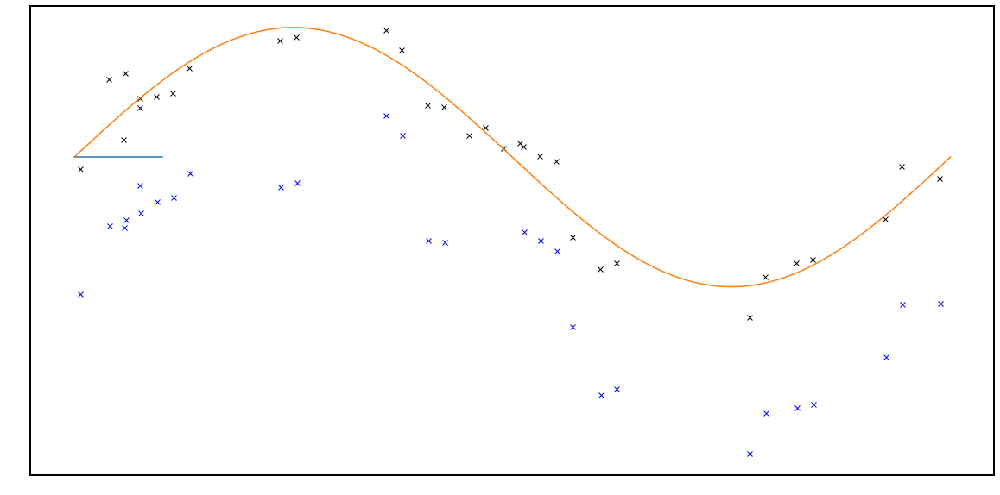

In [43]:
foldFreq = 1/2.406738

def sineModelFixed(x,a,c,d):
    return a*np.sin(2*np.pi*x+c)+d

mod = Model(sineModelFixed)
pars = mod.make_params(a=21.69,c=0,d=41)
#UVESFold = foldMeth(UVEST,0.41574154920793316)


path = '/home/nwal/Desktop/GD1400/reflexFin/'
dates2 = []
with open(path+'Stitched') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        hdul = fits.open(line)
        dates2.append(hdul[0].header['MJD-OBS'])
        hdul.close()

dates2 = dates2[:-2]

phases = foldMeth(np.array(dates2)-0.03685, foldFreq)
offsetsAlpha = np.load('uvesy.npy')
offsetsAlpha = offsetsAlpha[:-2]
#sortIndi = np.argsort(phases)
#phases = phases[sortIndi]
#offsetsAlphaS = offsetsAlpha[sortIndi]

plt.figure(figsize=(20,10))
plt.plot(phases,offsetsAlpha, 'kx')
#plt.xlim(0,0.01)
#plt.ylim(41,42)

plt.plot([0,0.1],[41.81,41.81])
result = mod.fit(offsetsAlpha,pars,x=phases)
TDummy = np.linspace(0,1,1000)
ypointsModel = sineModelFixed(TDummy,result.params['a'].value,result.params['c'].value,result.params['d'].value)
result.params.pretty_print()
plt.plot(TDummy,ypointsModel)
#plt.plot([0.55],[31], 'rx')
#plt.plot([0.74],[37], 'rx')
phasesWrong = [0.04009704,0.05851699,0.23549418,0.25392948,0.82437317,0.84327317,0.92628293,0.94478586,0.77090104,0.78943352,0.40390464,0.42238309,0.60081985,0.61929963,0.98862561,0.0071062,0.07558208,0.0941898,0.11301954,0.1316437,0.55059178,0.56901199,0.05669588,0.07502582,0.35604521,0.37451502,0.51347059,0.53194515]
bluearray = [29.8831259369329,31.0013122176018,36.6807146162134,37.416460097175,-1.521060186016,-0.8726505907965,7.3028520685034,16.4158689400387,-9.3988773434259,-2.3451763345853,27.4415223800318,27.1194386702454,0.699688546367899,1.7364269674279,16.5843480487399,18.1168748765963,32.2043638217483,34.1637449330246,34.7953506724984,39.0821699179922,25.5410530060855,12.5626812208372,29.6954024147055,36.9520410462275,48.9355271783912,45.5226931498852,28.9097847645153,27.3318859458586]
plt.plot(phasesWrong,bluearray, 'bx')

#plt.savefig('GD1400HAlphaSGUn.pdf')
plt.show()

#dates from nightside overplotted and just visually identify

In [44]:
len(offsetsAlpha)

32

In [54]:
for el in phases[:-2]:
    print(el)

0.039326885848548
0.0577468310640206
0.23472402369329004
0.2531593239055529
0.823603016977737
0.8425030101606517
0.9255127758760532
0.9440157054157394
0.7701308825611745
0.788663366854907
0.4031344808108195
0.42161293382779175
0.6000496927113282
0.6185294694267686
0.9878554492509898
0.006336044267923615
0.45038411522272
0.46926730935504885
0.48946352349769195
0.5082146839831214
0.07481192838873024
0.09341964730033815
0.11224938780194084
0.13087354473317442
0.5498216247964768
0.5682418347481407
0.05592572610868626
0.07425565932050471
0.35527505248141394
0.37374486530621626


In [56]:
path = '/home/nwal/Desktop/GD1400/reflexFin/nightside/'
snrArray = []
with open(path+'blues') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        wvl, flx = pyasl.read1dFitsSpec(line)
        spectrum = Spectrum1D(spectral_axis=10*wvl* u.AA, flux=flx* u.Jy)
        der = snr_derived(spectrum)
        print(der)
        snrArray.append(der)

17.301015810858456
19.10286732191773
11.559222065609871
12.32872930311256
13.055215437422468
17.711378382044376
14.061793982739365
13.681618995782632
14.810693596911507
17.000638020537718


In [57]:
#GD1400

#shifts from H beta/gamma
path = '/home/nwal/Desktop/GD1400/reflexFin/nightside/'
fluxes = []
wavels = []
count = 0
with open(path+'blues') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        wvl, flx = pyasl.read1dFitsSpec(line)
        flx = flx/np.median(flx)
        fluxes.append(flx)
        wavels.append(np.log10(wvl))
        count = count+1
path = '/home/nwal/Desktop/GD1400/reflexFin/nightside/'
dates2 = []
with open(path+'blues') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        hdul = fits.open(line)
        dates2.append(hdul[0].header['MJD-OBS'])
        hdul.close()

count=0
wavelsAng = np.array(wavels)


shift = np.array([0.397305390277368,0.392642179824008,0.010130270002425,0.025140434427359,0.369789907868296,0.181885716697949,0.708501097526096,0.659089212249858,0.418563269181392,0.395718045899583])
    


    
adjWvl = []
count = 0
for el in wavels:
    
    newW = 10**el-shift[count]
    adjWvl.append(newW)
    count = count + 1
count = 0

for el in adjWvl:
    nameFile = str(count)+'ShiftedGD1400.fits'
    pyasl.write1dFitsSpec(nameFile, fluxes[count]*snrArray[count].value, wvl=el, clobber=True)
    count = count +1


# write out the recipe with spreadsheet and dispcor

In [4]:
#isaac
path = '/home/nwal/Desktop/GD1400/isaacShifts/'
snrArray = []
with open(path+'files') as file:
    for line in file:
        line = line.strip('\n')
        wvl, flx = pyasl.read1dFitsSpec(line)
        spectrum = Spectrum1D(spectral_axis=wvl* u.AA, flux=flx* u.Jy)
        der = snr_derived(spectrum)
        print(der)
        snrArray.append(der)

6.781591026024543
9.177984413451858
10.380020453147628
6.66903602641096
10.222785044675454
11.702618212483616
11.210585009605476
7.104028335012191
9.584496852104344
8.382589601386627
5.856760839632791
6.500945697651395
5.198868607991823
11.916267067559424
9.762713382402596
12.16944740582552
9.300528024162242
13.166244272293318
11.798843677030444
13.50994514441515
11.967261587728657
10.297069905728312
9.8383520481155
6.946477503785951
6.978578544506896
5.28740883954286
8.976959713569048
9.727542554306124
8.141985655046158
6.984350095172333
12.78219100047772
10.593805227789309
10.587347104650382
13.686494093946035
12.821200985159345
12.234294269056434
16.859155357758816
14.17904299997618
19.793863256412134
16.61538108655154
11.08222517341803
11.160380972995751
8.779356371460326
6.116305971390346
10.290444879261594
10.019726126655438
8.077916756480079
10.70156753607558
9.961873964633263
9.265848287427987
14.992140625597665
12.839214119602438
12.189852119313171
10.99532480766817
12.4143244

In [5]:
#shifts ISAAC
path = '/home/nwal/Desktop/GD1400/isaacShifts/'
fluxes = []
wavels = []
count = 0
with open(path+'files') as file:
    for line in file:
        line = line.strip('\n')
        wvl, flx = pyasl.read1dFitsSpec(line)
        flx = flx/np.median(flx)
        fluxes.append(flx)
        wavels.append(np.log10(wvl))
        count = count+1

count=0
wavelsAng = np.array(wavels)



shift = np.array([-12.0461253231394,-11.1862798096142,-7.89953561807082,-3.43240175841915,6.29065485029647,7.82859507426301,11.7295201602437,14.9431260208687,15.4327140544676,17.328738803696,16.0340255124097,15.0704119447862,11.7264014693792,-12.7090676844179,-10.1813416533647,-8.99675761689776,-5.40271790293003,4.42131309387376,9.13808925773576,10.7575952427729,13.6628376421664,16.2439606135789,16.6337892329499,15.8996741672534,14.0930776850964,12.6968792523793,3.66096387921807,5.64173498987756,10.1053864403754,13.064722261959,14.8436529380602,16.7403509530583,16.9910225026408,16.0297228024329,8.78412171396253,7.47349768218652,2.41084090247527,-1.6478992276717,-3.11480604358633,-7.62464971683844,-12.1676923573574,-12.5106400108304,-13.3732172808697,-13.1019685625314,2.09128729982927,6.71603499778504,9.23694324558358,11.9596532345053,15.4932924963709,16.3752087452447,16.9464940975933,15.7616701618291,10.214834690738,5.83851432313217,4.27028487821398,-0.096640723363361,-4.50171805189309,-6.23061811648377,-11.3438549544832,-13.3218556151936,-13.5334622727567,-13.1815067876057])
adjWvl = []
count = 0
for el in wavels:
    
    newW = 10**el-shift[count]
    adjWvl.append(newW)
    count = count + 1
count = 0

for el in adjWvl:
    nameFile = str(count)+'ShiftedISAAC.fits'
    pyasl.write1dFitsSpec(nameFile, fluxes[count]*snrArray[count].value, wvl=el, clobber=True)
    count = count +1


# write out the recipe with spreadsheet and dispcor

In [3]:
path = '/home/nwal/Desktop/PG0010/PG0010Reflex/blue/'
fluxes = []
wavels = []
count = 0
with open(path+'files') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        wvl, flx = pyasl.read1dFitsSpec(line)
        flx = flx/np.median(flx)
        fluxes.append(flx)
        wavels.append(np.log10(wvl))
        count = count+1
dates2 = []
with open(path+'files') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        hdul = fits.open(line)
        dates2.append(hdul[0].header['MJD-OBS'])
        hdul.close()

count=0
wavelsAng = np.array(wavels)


esovlt = EarthLocation.from_geodetic(lat=-24.6275*u.deg, lon=-70.4044*u.deg, height=2635*u.m)
sc = SkyCoord("00:13:21.0725724609 +28:20:19.825834604", frame=ICRS, unit=(u.hourangle, u.deg))
baryCorr = []
for el in dates2:
    barycorr = sc.radial_velocity_correction(obstime=Time(el, format='mjd'), location=esovlt)  
    baryCorr.append(barycorr.to(u.km/u.s).value)
print(baryCorr)



/home/nwal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:27: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


[-6.756516408148744, -6.779093622397422, -7.145177665174737, -7.16697288811274, -16.901309336797638, -16.923269916964223, -18.031868386061454, -18.053818266366996]


In [6]:

path = '/home/nwal/Desktop/PG0010/PG0010Reflex/blue/'
snrArray = []
with open(path+'files') as file:
    for line in file:
        line = path+line.strip('\n')
        wvl, flx = pyasl.read1dFitsSpec(line)
        spectrum = Spectrum1D(spectral_axis=wvl* u.AA, flux=flx* u.Jy)
        der = snr_derived(spectrum)
        print(der)
        snrArray.append(der)

13.424420665033445
15.03848883330751
12.253846002366139
11.50547204369988
13.54364394434963
15.47154443353158
12.909504470191381
13.586609496993127


In [8]:
shift = np.array(baryCorr)*3934/(299792458/1000)
adjWvl = []
count = 0
for el in wavels:
    
    newW = 10**el-shift[count]
    adjWvl.append(newW)
    count = count + 1
count = 0

for el in adjWvl:
    nameFile = str(count)+'ShiftedPG0010UVES.fits'
    pyasl.write1dFitsSpec(nameFile, fluxes[count]*snrArray[count].value, wvl=el, clobber=True)
    count = count +1


# write out the recipe with spreadsheet and dispcor

In [9]:
el

array([3259.02194331, 3259.04891531, 3259.07588732, ..., 4563.11855216,
       4563.14552417, 4563.17249618])

In [13]:
path = '/home/nwal/Desktop/toEmail/20/34/'
fluxes = []
wavels = []
count = 0
with open(path+'combs') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        wvl, flx = pyasl.read1dFitsSpec(line)
        flx = flx/np.median(flx)
        wvl = np.log10(wvl)
        fluxes.append(flx)
        wavels.append(wvl)
        count = count+1
        
path = '/home/nwal/Desktop/toEmail/20/'
dates2 = []
with open(path+'utcs') as file:
    for line in file:
        line = line.strip('\n')
        line = Time(line)
        dates2.append(line.mjd)
print(dates2)

count=0
wavelsAng = np.array(wavels)


esovlt = EarthLocation.from_geodetic(lat=-24.6275*u.deg, lon=-70.4044*u.deg, height=2635*u.m)
sc = SkyCoord("00:13:21.0725724609 +28:20:19.825834604", frame=ICRS, unit=(u.hourangle, u.deg))
baryCorr = []
for el in dates2:
    barycorr = sc.radial_velocity_correction(obstime=Time(el, format='mjd'), location=esovlt)  
    baryCorr.append(barycorr.to(u.km/u.s).value)
print(baryCorr)



[58797.24431347222, 58797.26672112269, 58797.28909356482, 58798.25334054398, 58798.27578582176, 58798.29820037037, 58799.21763303241, 58799.23961329861, 58799.261685590274, 58799.42143079861, 58799.4439324537, 58799.46640207176]


/home/nwal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


[-15.249235558898963, -15.278613532336424, -15.300953483494471, -15.661943810083367, -15.6876284768619, -15.706101953791379, -16.004244728342467, -16.03908097058004, -16.067653912034274, -16.06694355239495, -16.039764589170574, -16.00754929875664]


In [11]:

path = '/home/nwal/Desktop/toEmail/20/'
snrArray = []
with open(path+'out') as file:
    for line in file:
        line = path+line.strip('\n')
        wvl, flx = pyasl.read1dFitsSpec(line)
        spectrum = Spectrum1D(spectral_axis=wvl* u.AA, flux=flx* u.Jy)
        der = snr_derived(spectrum)
        print(der)
        snrArray.append(der)

18.27500135701922
20.085629577237665
19.216003094629613
17.282338256182587
15.675804544456309
17.40869835240498
11.495738627337076
13.390868153766487
18.234552435137758
19.4285516350639
18.886392199541426
16.53166797327632


In [14]:
shift = np.array(baryCorr)*3934/(299792458/1000)
adjWvl = []
count = 0
for el in wavels:
    
    newW = 10**el-shift[count]
    adjWvl.append(newW)
    count = count + 1
count = 0

for el in adjWvl:
    nameFile = str(count)+'ShiftedPG0010GRACES.fits'
    pyasl.write1dFitsSpec(nameFile, fluxes[count]*snrArray[count].value, wvl=el, clobber=True)
    count = count +1


# write out the recipe with spreadsheet and dispcor

In [ ]:
#hires
path = '/home/nwal/Desktop/toEmail/20/34/'
fluxes = []
wavels = []
count = 0
with open(path+'combs') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        wvl, flx = pyasl.read1dFitsSpec(line)
        flx = flx/np.median(flx)
        wvl = np.log10(wvl)
        fluxes.append(flx)
        wavels.append(wvl)
        count = count+1
        
path = '/home/nwal/Desktop/toEmail/20/'
dates2 = []
with open(path+'utcs') as file:
    for line in file:
        line = line.strip('\n')
        line = Time(line)
        dates2.append(line.mjd)
print(dates2)

count=0
wavelsAng = np.array(wavels)


esovlt = EarthLocation.from_geodetic(lat=-24.6275*u.deg, lon=-70.4044*u.deg, height=2635*u.m)
sc = SkyCoord("00:13:21.0725724609 +28:20:19.825834604", frame=ICRS, unit=(u.hourangle, u.deg))
baryCorr = []
for el in dates2:
    barycorr = sc.radial_velocity_correction(obstime=Time(el, format='mjd'), location=esovlt)  
    baryCorr.append(barycorr.to(u.km/u.s).value)
print(baryCorr)



In [9]:
#j141

#nightside

path = '/home/nwal/Desktop/binaries/NLTT_VIS/nightside/'
snrArray = []
with open(path+'files') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        wvl, flx = pyasl.read1dFitsSpec(line)
        wvl = wvl*10
        spectrum = Spectrum1D(spectral_axis=wvl* u.AA, flux=flx* u.Jy)
        der = snr_derived(spectrum)
        print(der)
        snrArray.append(der)
        
print(np.mean(snrArray))

15.763633298996181
15.702914468731723
15.299269095274989
13.528353250267706
16.022408201051867
16.108393958250733
15.404162045428867


In [10]:
#shifts from H beta/gamma
path = '/home/nwal/Desktop/binaries/NLTT_VIS/nightside/'
fluxes = []
wavels = []
count = 0
with open(path+'files') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        wvl, flx = pyasl.read1dFitsSpec(line)
        wvl = wvl*10
        flx = flx/np.median(flx)
        fluxes.append(flx)
        wavels.append(np.log10(wvl))
        count = count+1
path = '/home/nwal/Desktop/binaries/NLTT_VIS/nightside/'
dates2 = []
with open(path+'files') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        hdul = fits.open(line)
        dates2.append(hdul[0].header['MJD-OBS'])
        hdul.close()

count=0
wavelsAng = np.array(wavels)


shift = np.array([0.607429258108684,0.383140108169751,0.094958689564853,-0.489481360286056,-0.754616597253567,-0.944549336161618])
adjWvl = []
count = 0
for el in wavels:
    
    newW = 10**el-shift[count]
    adjWvl.append(newW)
    count = count + 1
count = 0

for el in adjWvl:
    nameFile = str(count)+'ShiftedNLTT.fits'
    pyasl.write1dFitsSpec(nameFile, fluxes[count]*snrArray[count].value, wvl=el, clobber=True)
    count = count +1


# write out the recipe with spreadsheet and dispcor

In [5]:
#j141

#nightside

path = '/home/nwal/Desktop/binaries/NLTT_VIS/all/'
snrArray = []
with open(path+'files') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        wvl, flx = pyasl.read1dFitsSpec(line)
        wvl = wvl*10
        spectrum = Spectrum1D(spectral_axis=wvl* u.AA, flux=flx* u.Jy)
        der = snr_derived(spectrum)
        print(der)
        snrArray.append(der)
snrWeight  = np.mean(snrArray) 
print(np.mean(snrArray))

19.894920100407997
20.065335973412033
19.921064398919963
19.029958917872776
17.573128387020834
18.483063650857254
17.088994928126233
16.704516235688036
15.834570155501998
16.935971968779164
16.821530300562394
15.917455907743072
15.78909755728283
15.763633298996181
15.702914468731723
15.299269095274989
13.528353250267706
16.022408201051867
16.108393958250733
15.453283496977585
14.093509836972096
14.908581782684037
13.41944850795845
9.692644725296745
16.252168712693194


In [4]:
#shifts from H beta/gamma
path = '/home/nwal/Desktop/binaries/NLTT_VIS/all/'
fluxes = []
wavels = []
count = 0
with open(path+'files') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        wvl, flx = pyasl.read1dFitsSpec(line)
        wvl = wvl*10
        flx = flx/np.median(flx)
        fluxes.append(flx)
        wavels.append(np.log10(wvl))
        count = count+1
path = '/home/nwal/Desktop/binaries/NLTT_VIS/all/'
dates2 = []
with open(path+'files') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        hdul = fits.open(line)
        dates2.append(hdul[0].header['MJD-OBS'])
        hdul.close()

count=0
wavelsAng = np.array(wavels)


shift = np.array([-0.895203762321249,-0.333602306611534,0.366485282727089,0.797149303258557,-0.844620778702257,-0.60478121082698,-0.31483362744274,0.00503260379107,0.298441361922346,0.547019963313755,0.713513694747931,0.783960590795318,0.747481755283981,0.607429258108684,0.383140108169751,0.094958689564853,-0.489481360286056,-0.754616597253567,-0.944549336161618,-1.04301265503693,-1.03549837131735,-0.922957753474299,-0.721514670612888,-0.447084980547529])
adjWvl = []
count = 0
for el in wavels:
    newW = 10**el-shift[count]
    adjWvl.append(newW)
    count = count + 1
count = 0

for el in adjWvl:
    nameFile = str(count)+'ShiftedNLTT.fits'
    pyasl.write1dFitsSpec(nameFile, fluxes[count]*snrArray[count].value, wvl=el, clobber=True)
    count = count +1


# write out the recipe with spreadsheet and dispcor

In [6]:
#shifts from H beta/gamma
path = '/home/nwal/Desktop/binaries/NLTT_VIS/all/'
fluxes = []
wavels = []
count = 0
with open(path+'files') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        wvl, flx = pyasl.read1dFitsSpec(line)
        flx = flx/np.median(flx)
        fluxes.append(flx*snrWeight[count])
        wavels.append(wvl)
        count = count+1

count=0
wavelsAng = np.array(wavels)

fluxTot = np.zeros_like(flx)
for el in fluxes:
    fluxTot = fluxTot+el

pyasl.write1dFitsSpec('NLTTCoAdd', fluxes[count]*snrArray[count].value, wvl=el, clobber=True)
    count = count +1


# write out the recipe with spreadsheet and dispcor

[3.72726465 3.72728093 3.7272972  ... 4.00858314 4.00859166 4.00860017]
[3.72726465 3.72728093 3.7272972  ... 4.00858314 4.00859166 4.00860017]
[3.72726465 3.72728093 3.7272972  ... 4.00858314 4.00859166 4.00860017]
[3.72726465 3.72728093 3.7272972  ... 4.00858314 4.00859166 4.00860017]
[3.72726465 3.72728093 3.7272972  ... 4.00858314 4.00859166 4.00860017]
[3.72726465 3.72728093 3.7272972  ... 4.00858314 4.00859166 4.00860017]
[3.72726465 3.72728093 3.7272972  ... 4.00858314 4.00859166 4.00860017]
[3.72726465 3.72728093 3.7272972  ... 4.00858314 4.00859166 4.00860017]
[3.72726465 3.72728093 3.7272972  ... 4.00858314 4.00859166 4.00860017]
[3.72726465 3.72728093 3.7272972  ... 4.00858314 4.00859166 4.00860017]
[3.72726465 3.72728093 3.7272972  ... 4.00858314 4.00859166 4.00860017]
[3.72726465 3.72728093 3.7272972  ... 4.00858314 4.00859166 4.00860017]
[3.72726465 3.72728093 3.7272972  ... 4.00858314 4.00859166 4.00860017]
[3.72726465 3.72728093 3.7272972  ... 4.00858314 4.00859166 4.00

In [7]:
#shifts from H beta/gamma
path = '/home/nwal/Desktop/binaries/NLTT_VIS/nightside/'
fluxes = []
wavels = []
count = 0

wvl, flx = pyasl.read1dFitsSpec(path+'NLTTNightside.fits')


dat = np.vstack((wvl, flx))
dat = dat.T
np.savetxt('NLTTNightside.txt', dat, delimiter = '\t') #0.85208,amp=0.190709489,f=12.4535791

# write out the recipe with spreadsheet and dispcor

In [3]:
#j141

#nightside

path = '/home/nwal/Desktop/binaries/NLTT5306/all/'
snrArray = []
with open(path+'files') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        wvl, flx = pyasl.read1dFitsSpec(line)
        wvl = wvl*10
        spectrum = Spectrum1D(spectral_axis=wvl* u.AA, flux=flx* u.Jy)
        der = snr_derived(spectrum)
        print(der)
        snrArray.append(der)
snrWeight  = np.mean(snrArray) 
print(np.mean(snrArray))

26.91031361899848
25.804909517215794
26.40679687408685
25.011491015634377
23.63615645936795
22.93814700768906
22.352050364251514
21.046625147532822
20.828708753734514
21.328418657532783
21.22006350910841
20.130711346232303
19.305286033909844
19.581912037548218
19.670673635124583
18.157119813673166
18.009893842309083
18.8611606307306
19.814206968727287
20.188530002495646
17.425441918859644
18.539897822842597
15.643583699082303
10.715756711378285
20.56366064116942


In [4]:
#shifts from H beta/gamma
path = '/home/nwal/Desktop/binaries/NLTT5306/all/'
fluxes = []
wavels = []
count = 0
with open(path+'files') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        wvl, flx = pyasl.read1dFitsSpec(line)
        wvl = wvl*10
        flx = flx/np.median(flx)
        fluxes.append(flx)
        wavels.append(np.log10(wvl))
        count = count+1
path = '/home/nwal/Desktop/binaries/NLTT5306/all/'
dates2 = []
with open(path+'files') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        hdul = fits.open(line)
        dates2.append(hdul[0].header['MJD-OBS'])
        hdul.close()

count=0
wavelsAng = np.array(wavels)


shift = np.array([-0.653267064570449,-0.243443346360559,0.267439408693506,0.581712686298141,-0.616354577585016,-0.441333764370982,-0.229747067968397,0.003672498311684,0.217784956515246,0.399183002503037,0.520680337278931,0.572088339485764,0.545468230415124,0.443266153562552,0.279593120938469,0.069295267735065,-0.357194713488339,-0.550674818530393,-0.689276562663548,-0.761129302784695,-0.755645820392807,-0.673520295280354,-0.526518978979282,-0.326256328613385])
adjWvl = []
count = 0
for el in wavels:
    newW = 10**el-shift[count]
    adjWvl.append(newW)
    count = count + 1
count = 0

for el in adjWvl:
    nameFile = str(count)+'ShiftedNLTT.fits'
    pyasl.write1dFitsSpec(nameFile, fluxes[count]*snrArray[count].value, wvl=el, clobber=True)
    count = count +1


# write out the recipe with spreadsheet and dispcor

In [32]:
#wvl, flx = pyasl.read1dFitsSpec('/home/nwal/Desktop/binaries/NLTT5306/all/coAddShifted.fits')
#from astropy.stats import sigma_clip
#from pylab import rc
#from matplotlib.ticker import (MultipleLocator, FormatStrFormatter,
#                               AutoMinorLocator)
#plt.rc('xtick',c='k')
#lw=1.2
#rc('axes', linewidth=2)
#plt.rc('ytick',c='k')
#import matplotlib.backends.backend_pdf
#count = 0
#pdf = matplotlib.backends.backend_pdf.PdfPages("NLTTUVBSpec.pdf")
#for el in range(1, 27):
#    fig, ax1 = plt.subplots(1, 1, figsize=(20,10))
#    filtered_data = sigma_clip(flx[count*500:(count+1)*500], sigma=2, maxiters=1)
#    ax1.plot(wvl[count*500:(count+1)*500], flx[count*500:(count+1)*500], c='k')
#    ax1.set_ylim(np.min(filtered_data), np.max(filtered_data))
#    
#    ax1.xaxis.set_major_locator(MultipleLocator(20))
#    ax1.xaxis.set_minor_locator(MultipleLocator(5))
#    ax1.tick_params(axis='y',which='both', width=2,direction="in",pad=10)
#    ax1.tick_params(axis='y',which='major', length=14,direction="in")
#    ax1.tick_params(axis='x',which='both', width=2,direction='in')
#    ax1.tick_params(axis='x',which='major', length=14,direction='in',pad=10)
#    #ax1.yaxis.set_major_locator(AutoMinorLocator())#

#    ax1.tick_params(axis='x',which='minor', length=8)
#    ax1.tick_params(axis='y',which='minor', length=8,direction='in')
#    ax1.tick_params(labelsize=30)
#    ax1.xaxis.set_ticks_position('both')
#    ax1.yaxis.set_ticks_position('both')
#    pdf.savefig(fig)
#    count = count+1
#pdf.close()

In [33]:
#wvl, flx = pyasl.read1dFitsSpec('/home/nwal/Desktop/binaries/NLTT_VIS/all/coAddShifted.fits')
#from astropy.stats import sigma_clip
#from pylab import rc
#from matplotlib.ticker import (MultipleLocator, FormatStrFormatter,
#                               AutoMinorLocator)
#plt.rc('xtick',c='k')
#lw=1.2
#rc('axes', linewidth=2)
#plt.rc('ytick',c='k')
#import matplotlib.backends.backend_pdf
#count = 0
#pdf = matplotlib.backends.backend_pdf.PdfPages("NLTTVISSpec.pdf")
#for el in range(1, 50):
#    fig, ax1 = plt.subplots(1, 1, figsize=(20,10))
#    filtered_data = sigma_clip(flx[count*500:(count+1)*500], sigma=2, maxiters=1)
#    ax1.plot(wvl[count*500:(count+1)*500], flx[count*500:(count+1)*500], c='k')
#    ax1.set_ylim(np.min(filtered_data), np.max(filtered_data))
#    
#    ax1.xaxis.set_major_locator(MultipleLocator(20))
#    ax1.xaxis.set_minor_locator(MultipleLocator(5))
#    ax1.tick_params(axis='y',which='both', width=2,direction="in",pad=10)
#    ax1.tick_params(axis='y',which='major', length=14,direction="in")
#    ax1.tick_params(axis='x',which='both', width=2,direction='in')
#    ax1.tick_params(axis='x',which='major', length=14,direction='in',pad=10)
#    #ax1.yaxis.set_major_locator(AutoMinorLocator())#

#    ax1.tick_params(axis='x',which='minor', length=8)
#    ax1.tick_params(axis='y',which='minor', length=8,direction='in')
#    ax1.tick_params(labelsize=30)
#    ax1.xaxis.set_ticks_position('both')
#    ax1.yaxis.set_ticks_position('both')
#    pdf.savefig(fig)
#    count = count+1
#pdf.close()

In [28]:
max(wvl)-min(wvl)

4860.0

In [30]:
max(wvl)

10200.0

In [22]:
#j141

#nightside

path = '/home/nwal/Desktop/binaries/J141Vis/all/'
snrArray = []
with open(path+'files') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        wvl, flx = pyasl.read1dFitsSpec(line)
        wvl = wvl*10
        spectrum = Spectrum1D(spectral_axis=wvl* u.AA, flux=flx* u.Jy)
        der = snr_derived(spectrum)
        print(der)
        snrArray.append(der)
        
print(np.mean(snrArray))

8.272738747091688
8.806377411022362
9.417803962569502
10.296198791176984
10.551803548287493
12.205785048131263
8.317684920334479
13.311956227790825
12.830943652059618
13.068234243912652
11.025569448091037
12.269414441373504
12.941222853187146
12.236274234466814
11.052738581070269
11.014974549023757
10.564811931466874
11.151522861029552
10.606534614911682
10.72061486672434
11.225609052756473
14.116238405250172
13.91180171603635
13.023442876545179
11.919924799147937
6.423009170466961
11.215355130856057
10.325016609413057
11.172271524792647


In [23]:
#shifts from H beta/gamma
path = '/home/nwal/Desktop/binaries/J141Vis/all/'
fluxes = []
wavels = []
count = 0
with open(path+'files') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        wvl, flx = pyasl.read1dFitsSpec(line)
        wvl = wvl*10
        flx = flx/np.median(flx)
        fluxes.append(flx)
        wavels.append(np.log10(wvl))
        count = count+1
path = '/home/nwal/Desktop/binaries/J141Vis/all/'
dates2 = []
with open(path+'files') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        hdul = fits.open(line)
        dates2.append(hdul[0].header['MJD-OBS'])
        hdul.close()

count=0
wavelsAng = np.array(wavels)


shift = np.array([0.079528413866072,-0.218561425022812,-0.341513865216201,-0.251549677953696,0.023500716154773,0.398413380688565,0.783716539952888,0.982746484331801,1.02881382430155,0.864283484002221,0.540557306306775,0.157871733039479,-0.282123343552717,-0.328584097147512,-0.164473312721985,0.159302240169439,0.675143562316172,0.950924849032827,1.04194133762872,0.9197592986679,0.62272510338674,-0.314220740626141,-0.283139175149442,-0.052345886476315,0.306157254630699,0.906847959851145,1.04831645589259,-0.277876906375005])
adjWvl = []
count = 0
for el in wavels:
    newW = 10**el-shift[count]
    adjWvl.append(newW)
    count = count + 1
count = 0

for el in adjWvl:
    nameFile = str(count)+'ShiftedJ141.fits'
    pyasl.write1dFitsSpec(nameFile, fluxes[count]*snrArray[count].value, wvl=el, clobber=True)
    count = count +1


# write out the recipe with spreadsheet and dispcor

In [8]:
path = '/home/nwal/Desktop/binaries/J141Vis/all/'
dates2 = []
with open(path+'files') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        hdul = fits.open(line)
        dates2.append(hdul[0].header['MJD-OBS'])
        hdul.close()
print(dates2)

[56766.127932614, 56766.13552455, 56766.143105489, 56766.150692677, 56766.158273732, 56766.165849115, 56766.174067026, 56766.180595221, 56766.188177546, 56766.195770177, 56766.203353663, 56766.210936801, 56766.22281531, 56766.23040331, 56766.237988763, 56766.245570397, 56766.255941146, 56766.263521622, 56766.271110664, 56766.278698779, 56766.286279487, 56767.239939757, 56767.247520591, 56767.255114505, 56767.262695338, 56767.270284853, 56767.276050954, 56767.283636244]


In [10]:
len(wavels)

28

In [10]:
path = '/home/nwal/Desktop/binaries/J141Vis/'
fluxes = []
wavels = []
count = 0
with open(path+'files') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        wvl, flx = pyasl.read1dFitsSpec(line)
        wvl = 10*wvl
        flx = flx/np.median(flx)
        fluxes.append(flx)
        wavels.append(np.log10(wvl))
        count = count+1
dates2 = []
with open(path+'files') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        hdul = fits.open(line)
        dates2.append(hdul[0].header['MJD-OBS'])
        hdul.close()
        
count = 0
wavelsAng = np.array(wavels)

In [11]:
phasesUVB = phases
offsetsAlphaUVB = offsetsAlpha

In [13]:
esovlt = EarthLocation.from_geodetic(lat=-24.6275*u.deg, lon=-70.4044*u.deg, height=2635*u.m)
sc = SkyCoord("14:11:26.2218057244 +20:09:11.044241117", frame=ICRS, unit=(u.hourangle, u.deg))
baryCorr = []
for el in dates2:
    barycorr = sc.radial_velocity_correction(obstime=Time(el, format='mjd'), location=esovlt)  
    baryCorr.append(barycorr.to(u.km/u.s).value)
print(baryCorr)


[-2.0694011041950753, -2.0893158622759946, -2.1096206194498768, -2.130322224093762, -2.1513471333558907, -2.172655360460119, -2.1960611257171787, -2.2148352502862543, -2.236803324532667, -2.2589353574287294, -2.281131633824886, -2.3033745038347866, -2.3382087459580445, -2.360389758040106, -2.3824565341819497, -2.4043626041190347, -2.4340079551934397, -2.455387845055949, -2.4765005907663102, -2.4972785718654076, -2.5176646395957563, -2.8247570959506314, -2.846542955399378, -2.8681477162841937, -2.889455127672754, -2.910485305603377, -2.926236141506439, -2.9466258347581]


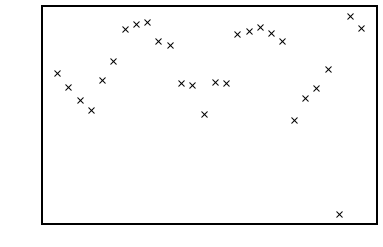

In [16]:
halpharest = 6562.801
offsetsAlphaS = np.array([6562.97,6562.69,6562.43,6562.22,6562.83,6563.2,6563.84,6563.95,6563.99,6563.61,6563.53,6562.76,6562.73,6562.14,6562.79,6562.78,6563.75,6563.82,6563.89,6563.77,6563.61,6562.03,6562.49,6562.68,6563.07,6560.16,6564.12,6563.89])
offsetsAlphaS = (offsetsAlphaS - halpharest)/halpharest
offsetsAlphaS = (offsetsAlphaS)*(299792458/1000)
velocityOGShort = offsetsAlphaS
offsetsAlphaS = offsetsAlphaS + baryCorr


plt.plot(offsetsAlphaS, 'kx')

Name     Value      Min      Max   Stderr     Vary     Expr Brute_Step
c  0.0008157     -inf      inf  0.06566     True     None     None


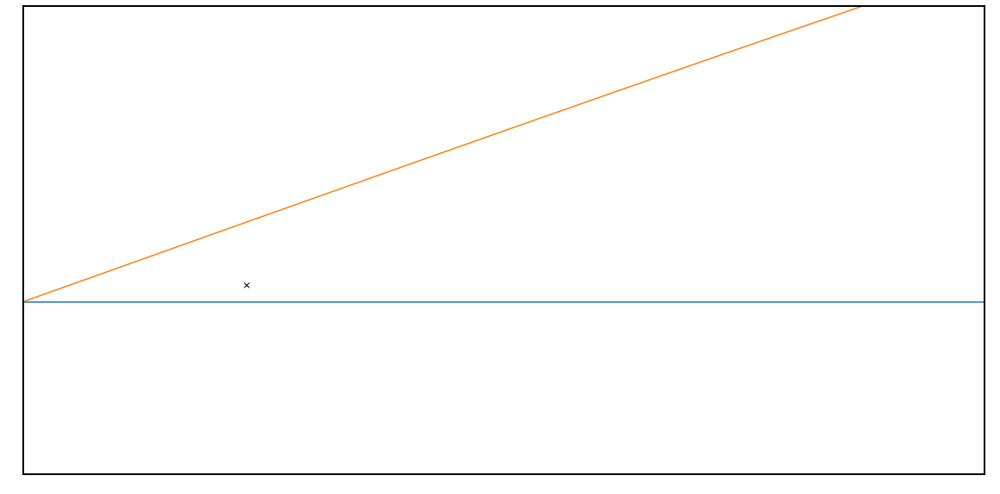

[  5.65061439  -7.15985858 -19.05711025 -28.67073052  -0.82661075
  16.0538901   45.26604596  50.27213399  52.07738852  34.69664177
  31.02000029  -4.17627767  -5.58152886 -32.55524326  -2.88494275
  -3.36365447  40.91684828  44.09310794  47.26963475  41.76718896
  34.43791249 -38.04447275 -17.05319869  -8.39549609   9.39861687
  57.32642916  46.79950951]
[0.56303196 0.65284254 0.74252304 0.83227746 0.92195932 0.01157409
 0.10878979 0.1860166  0.27571349 0.3655323  0.45524293 0.54494943
 0.68546904 0.77523306 0.86496695 0.95465567 0.07733888 0.16701389
 0.25679024 0.34655563 0.43623339 0.71778096 0.80746021 0.8972942
 0.98697344 0.14496683 0.23469879]


In [29]:
foldFreq = 0.0845327526

def sineModelFixed(x,c):
    return 35*np.sin(2*np.pi*x+c)+15.5

mod = Model(sineModelFixed)
pars = mod.make_params(c=0)
#UVESFold = foldMeth(UVEST,0.41574154920793316)


#0.0295

phases = foldMeth(np.array(dates2)+0.02995, foldFreq)
phasesOld = phases
phases = np.delete(phases, 25)
offsetsAlpha = np.array(offsetsAlphaS)
offsetsAlpha = np.delete(offsetsAlpha, 25)
#sortIndi = np.argsort(phases)
#phases = phases[sortIndi]
#offsetsAlphaS = offsetsAlpha[sortIndi]

plt.figure(figsize=(20,10))
plt.plot(phases,offsetsAlpha, 'kx')
#plt.xlim(0,0.05)
#plt.ylim(0,50)
plt.plot([0,0.05], [15.5,15.5])
result = mod.fit(offsetsAlpha,pars,x=phases)
TDummy = np.linspace(0,1,1000)
ypointsModel = sineModelFixed(TDummy,result.params['c'].value)
result.params.pretty_print()
plt.plot(TDummy,ypointsModel)
plt.xlim(0,0.05)
plt.ylim(10,25)
plt.plot(phasesUVB,offsetsAlphaUVB, 'ro')
#plt.savefig('GD1400HAlphaSGUn.pdf')
plt.show()

print(offsetsAlpha)

print(phases)

In [21]:
sineModelFixed(phases,result.params['c'].value)

array([  1.97161901, -13.19492041, -19.46271911, -14.91213515,
        -0.95722214,  18.0716373 ,  37.62636394,  47.72075528,
        50.03957383,  41.65727991,  25.18581812,   5.71844836,
       -16.67353936, -19.05649724, -10.73972072,   5.69014759,
        31.87157646,  45.86327281,  50.46691546,  44.23778938,
        29.12441831, -18.79102967, -17.23349029,  -5.52796161,
        12.66709333,  43.16852807,  50.34111421])

In [31]:
print(phasesOld)

[0.56303196 0.65284254 0.74252304 0.83227746 0.92195932 0.01157409
 0.10878979 0.1860166  0.27571349 0.3655323  0.45524293 0.54494943
 0.68546904 0.77523306 0.86496695 0.95465567 0.07733888 0.16701389
 0.25679024 0.34655563 0.43623339 0.71778096 0.80746021 0.8972942
 0.98697344 0.07675538 0.14496683 0.23469879]


In [32]:
#j141

#nightside

path = '/home/nwal/Desktop/binaries/J141Vis/nightside/'
snrArray = []
with open(path+'files') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        wvl, flx = pyasl.read1dFitsSpec(line)
        wvl = wvl*10
        spectrum = Spectrum1D(spectral_axis=wvl* u.AA, flux=flx* u.Jy)
        der = snr_derived(spectrum)
        print(der)
        snrArray.append(der)
        
print(np.mean(snrArray))

8.272738747091688
8.806377411022362
13.068234243912652
11.025569448091037
12.269414441373504
12.941222853187146
10.72061486672434
11.225609052756473
11.041222633019899


In [33]:
#shifts from H beta/gamma
path = '/home/nwal/Desktop/binaries/J141Vis/nightside/'
fluxes = []
wavels = []
count = 0
with open(path+'files') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        wvl, flx = pyasl.read1dFitsSpec(line)
        wvl = wvl*10
        flx = flx/np.median(flx)
        fluxes.append(flx)
        wavels.append(np.log10(wvl))
        count = count+1
path = '/home/nwal/Desktop/binaries/J141Vis/nightside/'
dates2 = []
with open(path+'files') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        hdul = fits.open(line)
        dates2.append(hdul[0].header['MJD-OBS'])
        hdul.close()

count=0
wavelsAng = np.array(wavels)


shift = np.array([0.079528413866072,-0.218561425022812,0.864283484002221,0.540557306306775,0.157871733039479,-0.282123343552717,0.9197592986679,0.62272510338674])
adjWvl = []
count = 0
for el in wavels:
    newW = 10**el-shift[count]
    adjWvl.append(newW)
    count = count + 1
count = 0

for el in adjWvl:
    nameFile = str(count)+'ShiftedJ141.fits'
    pyasl.write1dFitsSpec(nameFile, fluxes[count]*snrArray[count].value, wvl=el, clobber=True)
    count = count +1


# write out the recipe with spreadsheet and dispcor

In [4]:
#j141

#nightside

path = '/home/nwal/Desktop/binaries/WD0137UVES/sodium/all/'
snrArray = []
with open(path+'files') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        wvl, flx = pyasl.read1dFitsSpec(line)
        wvl = wvl
        spectrum = Spectrum1D(spectral_axis=wvl* u.AA, flux=flx* u.Jy)
        der = snr_derived(spectrum)
        snrArray.append(der)
        print(der)

17.492129991414856
17.06850448112106
17.270087141679433
18.800257675694045
18.803509890700926
18.337186294061585
18.80224489123238
18.981060137753115
18.445059068032315
18.29276028053472
19.262306798560378
19.362948241531743
19.168111726369595
19.639610577382093
19.244764678884557
18.7449945529046
19.521401581745252
19.07149621700024
19.10912676366369
19.237569771189975
12.264598224847123
12.439325175091401
13.263826508019525
13.35515540034111
12.825604239371884
13.557362088920764
13.629136016863123
13.307231714205288
12.2617308757369
11.987576690394041
9.393162313323558
8.734742867600954
10.96148528600253
10.555348840221008
10.502693232104654
9.68820297597424
9.926343554522473
11.05666423311513
11.177966363959632
10.210825970636993
15.19872814015862
15.078263836893129
15.165564619943481
15.222317448825818
15.354150557221802
15.335643221191937
15.209915074550699
15.391537865814508
14.999909308171965
14.97666043848689
12.917668368664192
13.096261998009657
11.643844177657911
11.300098796

In [39]:
#shifts from H beta/gamma
path = '/home/nwal/Desktop/binaries/WD0137UVES/sodium/all/'
fluxes = []
wavels = []
count = 0
with open(path+'files') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        wvl, flx = pyasl.read1dFitsSpec(line)
        wvl = wvl
        flx = flx/np.median(flx)
        fluxes.append(flx)
        wavels.append(np.log10(wvl))
        count = count+1
path = '/home/nwal/Desktop/binaries/WD0137UVES/sodium/all/'
dates2 = []
with open(path+'files') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        hdul = fits.open(line)
        dates2.append(hdul[0].header['MJD-OBS'])
        hdul.close()

count=0
wavelsAng = np.array(wavels)


shift = np.array([0.536789698134265,0.722586798258542,0.894305934388399,1.03467467496451,1.1314754882488,1.17536276433229,1.16181982208522,1.09227606469658,0.973570064287799,0.816975520159779,0.636397695184398,0.451439574376356,0.27904423578178,0.135626584216883,0.035072177621142,-0.012935716546822,-0.003760952035221,0.061734761171185,0.177895223309895,0.3320257546278,0.639947283989151,0.665075836509001,0.648177528725072,0.590388953657446,0.49580382585081,0.370948411771655,0.224894809936945,0.067696912735096,-0.089322126908561,-0.235285798816408,0.801363551214466,0.824019029248644,0.804551115300705,0.744367706431323,0.647625393743436,0.521403254412654,0.374274930467578,0.21652949409454,0.059829077731049,-0.08511972438847,-0.11393182175038,0.00978550292995,0.155408593241876,0.312750319573395,0.470511647790951,0.617518299882579,0.743661046701885,0.840117530759183,0.899989557123072,0.919110849923115,0.084006888240344,0.230881159440325,0.388550368974345,0.545723957559668,0.691691385061725,0.815928421484109,0.909694477773466,0.96650734501099,0.982373715090596,0.956195522606309,-0.096481539917301,-0.030322804608706,0.071366715316722,0.20157389805103,0.351199326083713,0.509352679444651,0.66535573682074,0.808063828880001,0.927368256364907,1.01486567531927])
adjWvl = []
count = 0
for el in wavels:
    newW = 10**el-shift[count]
    adjWvl.append(newW)
    count = count + 1
count = 0

for el in adjWvl:
    nameFile = str(count)+'ShiftedWD0137.fits'
    pyasl.write1dFitsSpec(nameFile, fluxes[count]*snrArray[count].value, wvl=el, clobber=True)
    count = count +1


# write out the recipe with spreadsheet and dispcor

/home/nwal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:27: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


In [40]:
#j141

#nightside

path = '/home/nwal/Desktop/GD1400/reflexFin/sodium/all/'
snrArray = []
with open(path+'files') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        wvl, flx = pyasl.read1dFitsSpec(line)
        wvl = wvl
        spectrum = Spectrum1D(spectral_axis=wvl* u.AA, flux=flx* u.Jy)
        der = snr_derived(spectrum)
        snrArray.append(der)

In [49]:
path = '/home/nwal/Desktop/GD1400/reflexFin/sodium/all/'
dates2 = []
with open(path+'files') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        hdul = fits.open(line)
        dates2.append(hdul[0].header['MJD-OBS'])
        hdul.close()
phases = foldMeth(np.array(dates2)-0.03685, foldFreq)
ypointsModel = sineModelFixed(phases,result.params['a'].value,result.params['c'].value,result.params['d'].value)
ypointsModel


esovlt = EarthLocation.from_geodetic(lat=-24.6275*u.deg, lon=-70.4044*u.deg, height=2635*u.m)
sc = SkyCoord("01:47:21.8246239967 -21:56:51.387203270", frame=ICRS, unit=(u.hourangle, u.deg))
baryCorr = []
for el in dates2:
    barycorr = sc.radial_velocity_correction(obstime=Time(el, format='mjd'), location=esovlt)  
    baryCorr.append(barycorr.to(u.km/u.s).value)
print(baryCorr)

[25.3422873779619, 25.324802675233244, 25.226114888141392, 25.20832609980519, 25.018112298904107, 24.999892300459624, 23.858404996453086, 23.838551558203253, 23.512439119019167, 23.49220985225648, 23.362400285738325, 23.344323933731346, 21.820823664351177, 21.802483306041342, 21.6136857038337, 21.595604634535157, 19.360518631026935, 19.339201645630038, 19.316590315707757, 19.295819261634964, 18.200462614188268, 18.179485941920053, 18.158482981293954, 18.137975298804832, 15.500016449180112, 15.489895626970515, 15.084480211624246, 15.069924164259424, 14.8009534772167, 14.790509812199486, 14.686927668124456, 14.670181057470684, 25.3438829891029, 25.09479661988099]


In [50]:
#shifts from H beta/gamma
path = '/home/nwal/Desktop/GD1400/reflexFin/sodium/CaCheck/'
fluxes = []
wavels = []
count = 0
with open(path+'files') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        wvl, flx = pyasl.read1dFitsSpec(line)
        wvl = wvl
        flx = flx/np.median(flx)
        fluxes.append(flx)
        wavels.append(np.log10(wvl))
        count = count+1
path = '/home/nwal/Desktop/GD1400/reflexFin/sodium/CaCheck/'
dates2 = []
with open(path+'files') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        hdul = fits.open(line)
        dates2.append(hdul[0].header['MJD-OBS'])
        hdul.close()

count=0
wavelsAng = np.array(wavels)


shift = np.array([0.226994581891376,0.260031890436992,0.48790857756152,0.49593152610866,-0.057585760758827,-0.046643718779771,0.056386604149974,0.083808305495292,-0.046813947144532,-0.047059602404664,0.445893455118692,0.421931687791095,0.14130095677311,0.11228673933723,0.184693937973711,0.217242865092486,0.383372969265169,0.415192227355655,0.445890963624741,0.474354250927493,0.310613225459346,0.278236523843832,0.391186456885551,0.423492018228435,0.607304936926364,0.591023855533641,0.387650820774946,0.354847946517288])
adjWvl = []
count = 0
for el in wavels:
    newW = 10**el-shift[count]
    adjWvl.append(newW)
    count = count + 1
count = 0

for el in adjWvl:
    nameFile = str(count)+'ShiftedGD1400.fits'
    pyasl.write1dFitsSpec(nameFile, fluxes[count]*snrArray[count].value, wvl=el, clobber=True)
    count = count +1


# write out the recipe with spreadsheet and dispcor

/home/nwal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:27: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


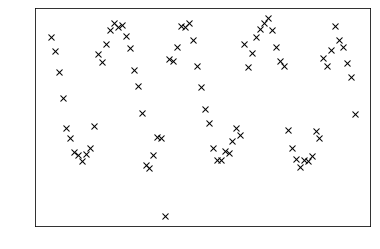

In [5]:
halpharest = 6562.801
offsetsAlphaS = np.array([6563.41,6563.29,6563.11,6562.89,6562.63,6562.54,6562.42,6562.4,6562.35,6562.41,6562.46,6562.65,6563.27,6563.2,6563.35,6563.47,6563.53,6563.5,6563.52,6563.42,6563.32,6563.13,6562.99,6562.76,6562.32,6562.29,6562.4,6562.56,6562.55,6561.88,6563.23,6563.21,6563.33,6563.51,6563.5,6563.54,6563.39,6563.17,6562.99,6562.8,6562.68,6562.47,6562.36,6562.36,6562.44,6562.42,6562.53,6562.64,6562.58,6563.36,6563.16,6563.28,6563.42,6563.49,6563.54,6563.58,6563.48,6563.33,6563.21,6563.17,6562.62,6562.47,6562.37,6562.3,6562.36,6562.36,6562.4,6562.61,6562.55,6563.24,6563.17,6563.31,6563.52,6563.4,6563.34,6563.2,6563.08,6562.76])
offsetsAlphaS = (offsetsAlphaS - halpharest)/halpharest
offsetsAlphaS = (offsetsAlphaS)*(299792458/1000)
velocityOGShort = offsetsAlphaS
offsetsAlphaS = offsetsAlphaS + baryCorr
plt.plot(offsetsAlphaS, 'kx')

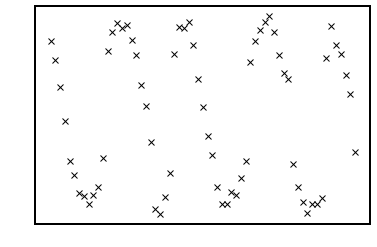

In [13]:
cleanOffsets = np.array([6563.41,6563.29,6563.11,6562.89,6562.63,6562.54,6562.42,6562.4,6562.35,6562.41,6562.46,6562.65,6563.35,6563.47,6563.53,6563.5,6563.52,6563.42,6563.32,6563.13,6562.99,6562.76,6562.32,6562.29,6562.4,6562.56,6563.33,6563.51,6563.5,6563.54,6563.39,6563.17,6562.99,6562.8,6562.68,6562.47,6562.36,6562.36,6562.44,6562.42,6562.53,6562.64,6563.28,6563.42,6563.49,6563.54,6563.58,6563.48,6563.33,6563.21,6563.17,6562.62,6562.47,6562.37,6562.3,6562.36,6562.36,6562.4,6563.31,6563.52,6563.4,6563.34,6563.2,6563.08,6562.7])
cleanBary = np.array([11.5495980383738,11.5422900973507,11.5351087283864,11.5275765032315,11.5201144892019,11.512250911143,11.5045305859091,11.4963949692709,11.4884093753519,11.4800202249112,11.4718225899846,11.4632375944929,11.4269272726972,11.4179235328889,11.4090337722041,11.3998800202607,11.3908351082458,11.381224632613,11.3720397800286,11.3626156382447,11.3533000911554,11.3435280829181,11.3060751562201,11.2962199960418,11.2866709234159,11.276517950799,11.2277663543977,11.2178886595914,11.2083617564718,11.1984748954152,11.1755405511414,11.1659684737893,11.1566125743362,11.1468664875379,11.137626686578,11.1281364678975,11.1190119283471,11.1095080199687,11.100534520885,11.091444878242,11.0826204770581,11.0737376859694,11.1999463026291,11.1924066066264,11.184621699198,11.1768355419021,11.1687238391662,11.1606971457987,11.1523661423587,11.1441076569337,11.1355455474787,11.1193162838851,11.1103779365284,11.10163407838,11.0926232924232,11.0837089289976,11.0744492334689,11.0653691491576,11.0185246011306,10.9802291786071,10.9705412120494,10.9609495533941,10.9511658646596,10.9415805177158,10.9317245461487])

offsetsAlphaS = (cleanOffsets - halpharest)/halpharest
offsetsAlphaS = (offsetsAlphaS)*(299792458/1000)
offsetsAlphaS = offsetsAlphaS + cleanBary
plt.plot(offsetsAlphaS, 'kx')

Name     Value      Min      Max   Stderr     Vary     Expr Brute_Step
a        28     -inf      inf   0.3347     True     None     None
c   0.04565     -inf      inf  0.01386     True     None     None
d     17.73     -inf      inf   0.2609     True     None     None


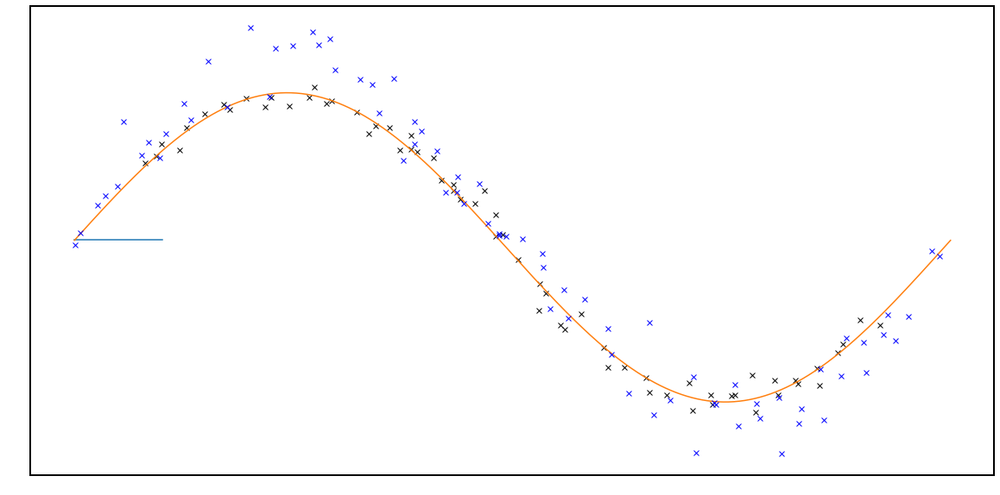

In [23]:
foldFreq = 0.0794300

def sineModelFixed(x,a,c,d):
    return a*np.sin(2*np.pi*x+c)+d

mod = Model(sineModelFixed)
pars = mod.make_params(a=25,c=0,d=20)
datesClean = np.array([56898.198727893,56898.202677998,56898.206481448,56898.210394166,56898.214199238,56898.218138463,56898.221940871,56898.225883454,56898.229693966,56898.233638516,56898.23743942,56898.241367418,56898.257474006,56898.2613601,56898.265161467,56898.269041777,56898.272844878,56898.27685483,56898.280660015,56898.284539282,56898.288351298,56898.29232849,56898.307410222,56898.311347016,56898.315153013,56898.31919271,56898.338561382,56898.342494357,56898.346295029,56898.350249071,56898.359471853,56898.363347417,56898.367153529,56898.37113975,56898.374941349,56898.378871199,56898.382676154,56898.386669668,56898.390471382,56898.394355858,56898.398162086,56898.402031399,56899.209108051,56899.212920413,56899.216789261,56899.220595373,56899.224498367,56899.228302627,56899.232194856,56899.236000852,56899.23989586,56899.247150066,56899.251080377,56899.254884868,56899.258767028,56899.262572213,56899.266490486,56899.270301575,56899.289565483,56899.304964015,56899.308828233,56899.312645688,56899.316533055,56899.320337198,56899.324246211])
phases = foldMeth(np.array(datesClean)+0.0012, foldFreq)
offsetsAlpha = np.array(offsetsAlphaS)
#sortIndi = np.argsort(phases)
#phases = phases[sortIndi]
#offsetsAlphaS = offsetsAlpha[sortIndi]

plt.figure(figsize=(20,10))
plt.plot(phases,offsetsAlpha, 'kx')
#plt.xlim(0,0.1)
#plt.ylim(10,30)

plt.plot([0,0.1],[19.1,19.1])
result = mod.fit(offsetsAlpha,pars,x=phases)
TDummy = np.linspace(0,1,1000)
ypointsModel = sineModelFixed(TDummy,result.params['a'].value,result.params['c'].value,result.params['d'].value)
result.params.pretty_print()
plt.plot(TDummy,ypointsModel)
plt.plot(phasesOG,offsetsAlphaOG, 'bx')
#plt.savefig('GD1400HAlphaSGUn.pdf')
plt.show()

In [22]:
path = '/home/nwal/Desktop/binaries/WD0137Vis/'
dates2 = []
with open(path+'files') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        hdul = fits.open(line)
        dates2.append(hdul[0].header['MJD-OBS'])
        hdul.close()



phases = foldMeth(np.array(dates2)+0.0012, foldFreq)
for el in phases:
    print(el)
ypointsModel = sineModelFixed(phases,result.params['a'].value,result.params['c'].value,result.params['d'].value)
print('-----')
for el in ypointsModel:
    print(el)

0.3600389399998646
0.4097695833057234
0.4576538839859891
0.5069138361312858
0.5548185572175838
0.6044122246443162
0.6522834067995681
0.7019193503522245
0.7498925595154889
0.7995532670642336
0.8474055143252829
0.8968578370922458
0.0028447940846900188
0.05173460902349774
0.09963497415345139
0.14855973805497522
0.1964178144179102
0.2452697594767106
0.29314966636895007
0.3436337655434676
0.3915399093025303
0.44037872337842654
0.4883708673442913
0.5384425279958086
0.7283170337927527
0.7778800956636208
0.8257964622209932
0.8766550421004536
0.9245102228282868
0.9740324813523638
0.022071257701039737
0.07263984637994243
0.12050084347696441
0.170015825219008
0.21786515165436823
0.26764536069248335
0.3837574341998159
0.4325496285597321
0.48046744298045657
0.5306527760194587
0.5785137731164807
0.6279894120161799
0.6758926601401407
0.7261698098467358
0.7740322548071098
0.8229366485921737
0.8708559234257427
0.9195694195514775
0.9333884929641322
0.9830885307141266
0.031143321131316078
0.0804236560341

In [4]:
#j141

#nightside

path = '/home/nwal/Desktop/binaries/WD0137Vis/all/'
snrArray = []
with open(path+'files') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        wvl, flx = pyasl.read1dFitsSpec(line)
        wvl = 10*wvl
        spectrum = Spectrum1D(spectral_axis=wvl* u.AA, flux=flx* u.Jy)
        der = snr_derived(spectrum)
        snrArray.append(der)
        print(der)

25.249122189468977
29.77843881930664
30.088006762604948
27.605299590580902
27.979585689897938
30.5931714436048
31.222542268970802
28.627113718155986
28.88327396749467
30.531179888389413
30.78606535686011
30.537445909637096
31.39664722511863
32.492083517641625
31.876389102888954
31.295731424646238
29.975823062143057
31.36451647845583
31.886256757745137
31.66582891121444
32.33817973272968
32.24915435015905
32.45982961498626
32.5056843233881
30.45083426459719
31.32075938549466
32.773400694929244
31.68522874355642
32.51132705661128
32.849765257305116
32.395715354825
32.481415944845594
31.095527681305256
32.100078367977794
31.29281558891599
29.591570543998508
32.18788100231623
32.93366484349681
33.439993138980874
31.87339236091328
31.82048010318832
32.00610712033379
31.448896966324597
26.90194732638563
26.67750203257004
29.60420003728665
31.214394820908012
28.776232932517274
32.14798567887586
33.52303275791836
34.98508844496013
34.094962745171756
33.718546744616575
34.50897423636405
34.9918

In [26]:
#shifts from H beta/gamma
path = '/home/nwal/Desktop/binaries/WD0137Vis/all/'
fluxes = []
wavels = []
count = 0
with open(path+'files') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        wvl, flx = pyasl.read1dFitsSpec(line)
        wvl = 10*wvl
        flx = flx/np.median(flx)
        fluxes.append(flx)
        wavels.append(np.log10(wvl))
        count = count+1
path = '/home/nwal/Desktop/binaries/WD0137Vis/all/'
dates2 = []
with open(path+'files') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        hdul = fits.open(line)
        dates2.append(hdul[0].header['MJD-OBS'])
        hdul.close()

count=0
wavelsAng = np.array(wavels)


shift = np.array([0.529754593820506,0.39628141894608,0.242474711538098,0.073104207271255,-0.087275695991011,-0.233291593774401,-0.341865453048196,-0.410310148818688,-0.427618085866514,-0.393263921457553,-0.312904897966889,-0.188858695325223,0.158753881290586,0.323587147423324,0.467052517877752,0.581681482650972,0.652377866532996,0.675659754489641,0.64849003456881,0.569012714945922,0.452451458322279,0.303414651873663,0.14067308938292,-0.030341512060829,-0.422327297849701,-0.411011109262923,-0.350843616038468,-0.240156301609132,-0.101797461670759,0.062850916443044,0.228653343601967,0.393044999778002,0.524422323856059,0.622782321342143,0.672784546619614,0.672956948865344,0.477600016972174,0.332714005568724,0.171869775304422,-0.000426868865058,-0.153032253332697,-0.283958640343346,-0.373014701037834,-0.417736279829691,-0.409920812312599,-0.351860605444474,-0.25106487257082,-0.113441921881427,-0.072614809646316,0.094910475586867,0.260137953544499,0.417079935442058,0.543669405421845,0.63380386345778,0.676719002082397,0.669555534337804,0.613363680179332,0.510917629492848,0.375968568234693,0.215038336411498,-0.093848272519728,-0.236959837706527,-0.342058735753656,-0.405465879704762,-0.418945486101775,-0.381180720005469,-0.297553214287726,-0.172851872321033,-0.022423631573581,0.144864157057133,0.308208562962654,0.457816530914384,0.662599969764153,0.592482382245142,0.481355861383279,0.335902303602381,0.175072867123796,0.006076314702165])
adjWvl = []
count = 0
for el in wavels:
    newW = 10**el-shift[count]
    adjWvl.append(newW)
    count = count + 1
count = 0

for el in adjWvl:
    nameFile = str(count)+'ShiftedWD0137.fits'
    pyasl.write1dFitsSpec(nameFile, fluxes[count]*snrArray[count].value, wvl=el, clobber=True)
    count = count +1


# write out the recipe with spreadsheet and dispcor

In [28]:
newW[1]-newW[0]

0.20000000000254659

In [29]:
newW[0]

5336.593923685296

In [5]:
path = '/home/nwal/Desktop/binaries/WD0137349XSHOOTER/nightside/'
wvl, flx = pyasl.read1dFitsSpec(path+'coAddShifted.fits')
spectrum = Spectrum1D(spectral_axis=10*wvl* u.AA, flux=flx* u.Jy)
der = snr_derived(spectrum)
print(der)


462.968577508402


In [6]:
path = '/home/nwal/Desktop/binaries/WD0137Vis/nightside/'
wvl, flx = pyasl.read1dFitsSpec(path+'WD0137Nightside_XShoo.fits')
spectrum = Spectrum1D(spectral_axis=10*wvl* u.AA, flux=flx* u.Jy)
der = snr_derived(spectrum)
print(der)


176.11842246106823
